In [1]:
# Load libraries

# # Plotting utils 
import datetime
import glob
import os
import pickle
# Analysis
import time
import warnings
from datetime import date, timedelta

import cartopy
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import cartopy.util
import matplotlib as matplotlib
import matplotlib.animation as animation
import matplotlib.colors as colors
import matplotlib.dates as mdates
import matplotlib.patches as patches
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import metpy.calc as mpc
import numpy as np
import pandas as pd
import scipy.stats as stats

import xarray as xr
from matplotlib.dates import DateFormatter
from metpy.units import units
from mpl_toolkits.axes_grid1 import make_axes_locatable

import seaborn as sns
warnings.filterwarnings('ignore')

## Import Ngl with pyn_env active 
import Ngl



### Useful functions

In [2]:
# Grabbed from Brian M. to use time midpoints, not end periods
def cesm_correct_time(ds):
    """Given a Dataset, check for time_bnds,
       and use avg(time_bnds) to replace the time coordinate.
       Purpose is to center the timestamp on the averaging inverval.   
       NOTE: ds should have been loaded using `decode_times=False`
    """
    assert 'time_bnds' in ds
    assert 'time' in ds
    correct_time_values = ds['time_bnds'].mean(dim='nbnd')
    # copy any metadata:
    correct_time_values.attrs = ds['time'].attrs
    ds = ds.assign_coords({"time": correct_time_values})
    ds = xr.decode_cf(ds)  # decode to datetime objects
    return ds

In [3]:
def interpolateToPressure_v2(DS, varName, pressGoals):
#     nCases = len(DSin.case.values)
#     nTimes = len(DSin.time.values)
    
#     saveOut = np.full([nTimes,len(pressGoals),1,1], np.nan)

    ## For the larger arrays, need to operate case-by-case; input to vinth2p can only be 3 or 4 dimensions. 
#     for iCase in range(nCases): 
#     DS = DSin

    p0mb = DS.P0.values[0]/100        # mb

    # Pull out hya/hyb profiles 
    hyam = np.squeeze(DS.hyam.values)[0,:]
    hybm = np.squeeze(DS.hybm.values)[0,:]
    hyai = np.squeeze(DS.hyai.values)[0,:]
    hybi = np.squeeze(DS.hybi.values)[0,:]

    # Surface pressure with time dimension
    PS   = DS.PS.values              # Pa 

    # Converting variables: 
    if np.shape(DS[varName].values)[1]==len(DS.ilev.values):
        varInterp = Ngl.vinth2p(DS[varName].values,hyai,hybi,pressGoals,PS,1,p0mb,1,True)
    elif np.shape(DS[varName].values)[1]==len(DS.lev.values):
        varInterp = Ngl.vinth2p(DS[varName].values,hyam,hybm,pressGoals,PS,1,p0mb,1,True)

    saveOut = varInterp
    
    return saveOut

In [4]:
def process_camData(DS):
    ## Add evaporative fraction to DS 
    ds_EF = DS.LHFLX.values / (DS.LHFLX.values + DS.SHFLX.values)
    DS['EvapFraction'] = (('time'), np.squeeze(ds_EF))

    ## Define the actual vertical velocity skew, not just the third order moment 
    skw_W = DS.WP3_CLUBB.values / ((DS.WP2_CLUBB.values)**1.5)
    DS['Skw_W'] = (('time','ilev'), np.squeeze(skw_W))

    ## Add in TKE 
    DS['TKE']  = (('time','ilev','lat,','lon'),
                       0.5*(DS['UP2_CLUBB']+DS['VP2_CLUBB']+DS['WP2_CLUBB'])) 
    # DS['TKE'].attrs['units']   = 'm2/s2'
    # DS['TKE'].attrs['long_name']   = 'Turbulent Kinetic Energy'
    
    ## Add in wind speed 
    DS['WindMagnitude']  = (('time','lev','lat,','lon'),
                                    np.sqrt((DS.U.values**2.0) + (DS.V.values**2.0)) )

    # DS['WindMagnitude'].attrs['units']   = 'm/s'
    # DS['WindMagnitude'].attrs['long_name']   = 'Wind speed'

    
    ## Interpolate to standard levels 
    # - - - - - - - - - - - - - - - - - - - - - - - -
    print('Beginning interpolation...') 
    
    # Decide on levels to interpoalte to and add to larger arrays
    pnew64 = np.arange(200.0,980.0,10.0) 

    DS = DS.assign_coords({"levInterp": pnew64})

    varSels = np.asarray(['THLP2_CLUBB','RTP2_CLUBB','RTPTHLP_CLUBB','WPRTP_CLUBB','WPTHLP_CLUBB','WP3_CLUBB','WP2_CLUBB','UP2_CLUBB',
                          'VP2_CLUBB','TKE','Z3','U','V','T','Q','OMEGA','RVMTEND_CLUBB','STEND_CLUBB','CLDLIQ','CLOUD','CLOUDFRAC_CLUBB',
                          'UPWP_CLUBB','WP2RTP_CLUBB','THETAL','WindMagnitude','CONCLD',
                          ## Add budget terms 
                          # 'thlp2','thlp2_bt','thlp2_cl','thlp2_dp1','thlp2_dp2','thlp2_forcing','thlp2_ma','thlp2_mc','thlp2_pd',
                          # 'thlp2_sf','thlp2_ta','thlp2_tp','thlp2_zt', 
                          'wp2','wp2_ac','wp2_bp','wp2_bt','wp2_cl','wp2_dp1','wp2_dp2','wp2_ma', 'wp2_pd','wp2_pr1','wp2_pr2',
                          'wp2_pr3','wp2_sf','wp2_ta','wp2_zt',
                          # 'wp2rcp','wp2rtp','wp2thlp','wp2thvp','wp3_on_wp2','wp3_on_wp2_zt','wprtp',
                          # 'wprtp2','wprtp_ac','wprtp_bp','wprtp_bt','wprtp_cl','wprtp_dp1','wprtp_enter_mfl','wprtp_exit_mfl',
                          # 'wprtp_forcing','wprtp_ma','wprtp_mc','wprtp_mfl','wprtp_mfl_max','wprtp_mfl_min','wprtp_pd',
                          # 'wprtp_pr1','wprtp_pr2','wprtp_pr3','wprtp_sicl','wprtp_ta','wprtp_tp','wprtp_zt',
                          # 'wprtpthlp','wpthlp','wpthlp2','wpthlp_ac','wpthlp_bp','wpthlp_bt','wpthlp_cl','wpthlp_dp1','wpthlp_entermfl',
                          # 'wpthlp_exit_mfl','wpthlp_forcing','wpthlp_ma','wpthlp_mc','wpthlp_mfl','wpthlp_mfl_max','wpthlp_mfl_min',
                          # 'wpthlp_pr1','wpthlp_pr2','wpthlp_pr3','wpthlp_sicl','wpthlp_ta','wpthlp_tp','wpthlp_zt'
                          ])

    for iVar in range(len(varSels)): 
        # varUnits = DS[varSels[iVar]].units
        # varName  = DS[varSels[iVar]].long_name

        # Interpolate variables and add to larger arrays 
        interpVar_real = interpolateToPressure_v2(DS, varSels[iVar], pnew64)

        DS[varSels[iVar]+'_interp']  = (('time','levInterp','lat','lon'), interpVar_real)

        ## Assign attibutes 
        # DS[varSels[iVar]+'_interp'].attrs['units']     = varUnits
        # DS[varSels[iVar]+'_interp'].attrs['long_name'] = varName

        
#     ## Resample to 30m means? 
#     DS = DS.resample(time="30Min").mean()
        
    return DS

## Read in data

In [5]:
## Extra vars I want, but they're on the h0 files instead of the h1 files (same time step, just different stream) 
addVars = np.asarray(['SWCF','LWCF','TS','CLOUD','FSNS','FLNS','PS','QREFHT',
                      'U10','CLDHGH','CLDLIQ','TMQ'])


In [6]:
circulationTXT = '/glade/work/mdfowler/CLASP/LESdata_fromJason/circulations.txt'

circMetric = pd.read_csv(circulationTXT, sep=" ", header=None)
circMetric.columns = ['dateVal', 'metricVal']

allYears   = [] 
allMonths  = []
allDays    = []

for iDate in range(len(circMetric.dateVal)):
    allYears   = np.append(allYears,   circMetric.dateVal.values.astype(str)[iDate][0:4]) 
    allMonths  = np.append(allMonths, circMetric.dateVal.values.astype(str)[iDate][4:6])
    allDays    = np.append(allDays, circMetric.dateVal.values.astype(str)[iDate][6::])



**SCAM**

In [7]:
def preprocess_h1(ds):
    
    keepVars = ['PHIS','USTAR','WPRTP2_CLUBB','WPTHLP2_CLUBB','WP2RTP_CLUBB','WP2THLP_CLUBB','WPRTPTHLP_CLUBB',
                'WP4_CLUBB','WPRTP2_ZM_CLUBB','WPTHLP2_ZM_CLUBB','WP2RTP_ZM_CLUBB','WP2THLP_ZM_CLUBB',
                'WPRTPTHLP_ZM_CLUBB','THETAL','WP2THLP_CLUBB','WPTHLP2_CLUBB','CDNUMC','CLDBOT','CLDLOW',
                'CLDMED','CLDTOP','CLDTOT','THLP2_CLUBB','CLOUDCOVER_CLUBB','CLOUDFRAC_CLUBB',
                'RCM_CLUBB','RTP2_CLUBB','RTPTHLP_CLUBB','RVMTEND_CLUBB','STEND_CLUBB','UP2_CLUBB','UPWP_CLUBB',
                'VP2_CLUBB','T','Q','OMEGA','PBLH','U','V','WP2_CLUBB','WP3_CLUBB','WPRCP_CLUBB','WPRTP_CLUBB',
                'WPTHLP_CLUBB','WPTHVP_CLUBB','Z3','PRECT','PRECC',
                # 'PRECZ',
                'TGCLDCWP','TGCLDLWP','GCLDLWP',
                'LHFLX','SHFLX','TREFHT','RHREFHT']
    
    ds         = cesm_correct_time(ds)
    ds['time'] = ds.indexes['time'].to_datetimeindex() 
        
    ## Select the second simulated day for analysis 
    iTimeStart_day2  = np.where( (ds.time.values >= (ds.time.values[0] + np.timedelta64(1,'D'))) & 
                                 (ds.time.values <= (ds.time.values[0] + np.timedelta64(2,'D'))))[0]
    dsSel            = ds.isel(time=np.sort(iTimeStart_day2))[keepVars]
    
    # Compute local time 
    localTimes = dsSel['time'].values - np.timedelta64(5,'h')
    dsSel      = dsSel.assign_coords({"time": localTimes})
    
    ## Set some limits for hours? 
    hrStart = 7
    hrEnd   = 21

    iHoursSCAM  = np.where( (dsSel['time.hour']>=7) & (dsSel['time.hour']<=21) )[0]
    dsSel      = dsSel.isel(time=iHoursSCAM)
    
    ## Resample to 30m means? 
    # print('Resampling to 30m')
    dsSel = dsSel.load().resample(time="30Min", keep_attrs=True).mean().dropna(dim='time')
    
            
    return dsSel

In [8]:
def preprocess_h1_noDC(ds):
    
    keepVars = ['PHIS','USTAR','WPRTP2_CLUBB','WPTHLP2_CLUBB','WP2RTP_CLUBB','WP2THLP_CLUBB','WPRTPTHLP_CLUBB',
                'WP4_CLUBB','WPRTP2_ZM_CLUBB','WPTHLP2_ZM_CLUBB','WP2RTP_ZM_CLUBB','WP2THLP_ZM_CLUBB',
                'WPRTPTHLP_ZM_CLUBB','THETAL','WP2THLP_CLUBB','WPTHLP2_CLUBB','CDNUMC','CLDBOT','CLDLOW',
                'CLDMED','CLDTOP','CLDTOT','THLP2_CLUBB','CLOUDCOVER_CLUBB','CLOUDFRAC_CLUBB',
                'RCM_CLUBB','RTP2_CLUBB','RTPTHLP_CLUBB','RVMTEND_CLUBB','STEND_CLUBB','UP2_CLUBB','UPWP_CLUBB',
                'VP2_CLUBB','T','Q','OMEGA','PBLH','U','V','WP2_CLUBB','WP3_CLUBB','WPRCP_CLUBB','WPRTP_CLUBB',
                'WPTHLP_CLUBB','WPTHVP_CLUBB','Z3','PRECT','PRECC','TGCLDCWP','TGCLDLWP','GCLDLWP',
                'LHFLX','SHFLX','TREFHT','RHREFHT']
    
    ds         = cesm_correct_time(ds)
    ds['time'] = ds.indexes['time'].to_datetimeindex() 
        
    ## Select the second simulated day for analysis 
    iTimeStart_day2  = np.where( (ds.time.values >= (ds.time.values[0] + np.timedelta64(1,'D'))) & 
                                 (ds.time.values <= (ds.time.values[0] + np.timedelta64(2,'D'))))[0]
    dsSel            = ds.isel(time=np.sort(iTimeStart_day2))[keepVars]
    
    # Compute local time 
    localTimes = dsSel['time'].values - np.timedelta64(5,'h')
    dsSel      = dsSel.assign_coords({"time": localTimes})
    
    ## Set some limits for hours? 
    hrStart = 7
    hrEnd   = 21

    iHoursSCAM  = np.where( (dsSel['time.hour']>=7) & (dsSel['time.hour']<=21) )[0]
    dsSel      = dsSel.isel(time=iHoursSCAM)
    
    ## Resample to 30m means? 
    # print('Resampling to 30m')
    dsSel = dsSel.load().resample(time="30Min", keep_attrs=True).mean().dropna(dim='time')
    
            
    return dsSel

In [9]:
def preprocess_h0(ds):
    
    keepVars = ['SWCF','LWCF','TS','CLOUD','FSNS','FLNS','PS','QREFHT',
                'U10','CLDHGH','CLDLIQ','CONCLD','TMQ','P0','hyam','hybm','hyai','hybi',
                ## Add budget terms 
                # 'thlp2','thlp2_bt','thlp2_cl','thlp2_dp1','thlp2_dp2','thlp2_forcing','thlp2_ma','thlp2_mc','thlp2_pd',
                # 'thlp2_sf','thlp2_ta','thlp2_tp','thlp2_zt', 
                'wp2','wp2_ac','wp2_bp','wp2_bt','wp2_cl','wp2_dp1','wp2_dp2','wp2_ma', 'wp2_pd','wp2_pr1','wp2_pr2',
                'wp2_pr3','wp2_sf','wp2_ta','wp2_zt',
                # 'wp2rcp','wp2rtp','wp2thlp','wp2thvp','wp3_on_wp2','wp3_on_wp2_zt','wprtp',
                # 'wprtp2','wprtp_ac','wprtp_bp','wprtp_bt','wprtp_cl','wprtp_dp1','wprtp_enter_mfl','wprtp_exit_mfl',
                # 'wprtp_forcing','wprtp_ma','wprtp_mc','wprtp_mfl','wprtp_mfl_max','wprtp_mfl_min','wprtp_pd',
                # 'wprtp_pr1','wprtp_pr2','wprtp_pr3','wprtp_sicl','wprtp_ta','wprtp_tp','wprtp_zt',
                # 'wprtpthlp','wpthlp','wpthlp2','wpthlp_ac','wpthlp_bp','wpthlp_bt','wpthlp_cl','wpthlp_dp1','wpthlp_entermfl',
                # 'wpthlp_exit_mfl','wpthlp_forcing','wpthlp_ma','wpthlp_mc','wpthlp_mfl','wpthlp_mfl_max','wpthlp_mfl_min',
                # 'wpthlp_pr1','wpthlp_pr2','wpthlp_pr3','wpthlp_sicl','wpthlp_ta','wpthlp_tp','wpthlp_zt'
                ]
    
    ds         = cesm_correct_time(ds)
    ds['time'] = ds.indexes['time'].to_datetimeindex() 
        
    ## Select the second simulated day for analysis 
    iTimeStart_day2  = np.where( (ds.time.values >= (ds.time.values[0] + np.timedelta64(1,'D'))) & 
                                 (ds.time.values <= (ds.time.values[0] + np.timedelta64(2,'D'))))[0]
    dsSel      = ds.isel(time=np.sort(iTimeStart_day2))[keepVars]
    
    # Compute local time 
    localTimes = dsSel['time'].values - np.timedelta64(5,'h')
    dsSel      = dsSel.assign_coords({"time": localTimes})
    
    ## Set some limits for hours? 
    hrStart = 7
    hrEnd   = 21

    iHoursSCAM  = np.where( (dsSel['time.hour']>=7) & (dsSel['time.hour']<=21) )[0]
    dsSel       = dsSel.isel(time=iHoursSCAM)   
    
    ## Resample to 30m means? 
    # print('Resampling to 30m')
    dsSel = dsSel.load().resample(time="30Min", keep_attrs=True).mean().dropna(dim='time')
    
        
    return dsSel

In [10]:
## Pre-processing to get CLM data

def preprocessCLM_h0(ds):
    
    keepVars_CLM = ['SOILWATER_10CM','TSOI_10CM','RAIN','FSA','TG','TSA','USTAR','WSTAR','ZETA',
                    'QVEGT','QVEGE','QSOIL']

    ds['time'] = ds.indexes['time'].to_datetimeindex() 
        
    ## Select the second simulated day for analysis 
    iTimeStart_day2  = np.where( (ds.time.values >= (ds.time.values[0] + np.timedelta64(1,'D'))) & 
                                 (ds.time.values <= (ds.time.values[0] + np.timedelta64(2,'D'))))[0]
    dsSel      = ds.isel(time=np.sort(iTimeStart_day2))[keepVars_CLM]
    
    # Compute local time 
    localTimes = dsSel['time'].values - np.timedelta64(5,'h')
    dsSel      = dsSel.assign_coords({"time": localTimes})
    
    ## Set some limits for hours? 
    hrStart = 7
    hrEnd   = 21

    iHoursSCAM  = np.where( (dsSel['time.hour']>=7) & (dsSel['time.hour']<=21) )[0]
    dsSel       = dsSel.isel(time=iHoursSCAM)   
    
    ## Resample to 30m means? 
    # print('Resampling to 30m')
    dsSel = dsSel.load().resample(time="30Min", keep_attrs=True).mean().dropna(dim='time')
    
    return dsSel



In [11]:
## Pre-processing to get CLM data

def preprocessCLM_h1(ds):
    
    ds['time'] = ds.indexes['time'].to_datetimeindex() 
        
    ## Select the second simulated day for analysis 
    iTimeStart_day2  = np.where( (ds.time.values >= (ds.time.values[0] + np.timedelta64(1,'D'))) & 
                                 (ds.time.values <= (ds.time.values[0] + np.timedelta64(2,'D'))))[0]
    dsSel      = ds.isel(time=np.sort(iTimeStart_day2))
    
    # Compute local time 
    localTimes = dsSel['time'].values - np.timedelta64(5,'h')
    dsSel      = dsSel.assign_coords({"time": localTimes})
    
    ## Set some limits for hours? 
    hrStart = 7
    hrEnd   = 21

    iHoursSCAM  = np.where( (dsSel['time.hour']>=7) & (dsSel['time.hour']<=21) )[0]
    dsSel       = dsSel.isel(time=iHoursSCAM)   
    
    ## Resample to 30m means? 
    # print('Resampling to 30m')
    dsSel = dsSel.load().resample(time="30Min", keep_attrs=True).mean()
    
    return dsSel


In [12]:
archiveDir    = '/glade/scratch/mdfowler/CLASP_ensOutput/LESdays/'

case_names = ['HMG',
              'HTG*01',
              'HTG*LESmult', 
              'HMG_dcOff',
              'HTG_dcOff',
              'HTG*LESmult_dcOff',
              'HTG*10',
              'HTG*100',
             ]

caseStart = 'FSCAM.T42_T42.CLASP_fullycoupled_FinalOption.onlyThlRt.'

caseStrings = ['getLESdays_HMG_201?_noMult_start',
               'getLESdays_HTG_201?_noMult_start',
               'getLESdays_HTG_201?_LESmults_start',
               'getLESdays_HMG_201?_deepConvOff_noMult_start',
               'getLESdays_HTG_201?_deepConvOff_noMult_start',
               'getLESdays_HTG_201?_deepConvOff_LESmults_start',
               'getLESdays_HTG_201?_mult10_start',
               'getLESdays_HTG_201?_mult100_start',
              ]

for iCase in range(len(case_names)):
    print('*** Starting on case %s ***' % (case_names[iCase]))
    
    ## Get list of files 
    listFiles_h1 = np.sort(glob.glob(archiveDir+caseStart+caseStrings[iCase]+'*cam.h1*'))
    listFiles_h0 = np.sort(glob.glob(archiveDir+caseStart+caseStrings[iCase]+'*cam.h0*'))
    
    listFilesCLM_h1 = np.sort(glob.glob(archiveDir+caseStart+caseStrings[iCase]+'*clm2.h1*'))
    listFilesCLM_h0 = np.sort(glob.glob(archiveDir+caseStart+caseStrings[iCase]+'*clm2.h0*'))
    
    ## Load files 
#     if ((case_names[iCase]=='HMG_dcOff') | (case_names[iCase]=='HTG_dcOff')):
#         case_h1 = xr.open_mfdataset(listFiles_h1,  preprocess=preprocess_h1_noDC, concat_dim='time', 
#                                     combine='nested', decode_times=False, 
#                                     data_vars='minimal')
#         print('h1 files loaded with mfdataset')

#         case_h0 = xr.open_mfdataset(listFiles_h0,  preprocess=preprocess_h1_noDC, concat_dim='time', 
#                                     combine='nested', decode_times=False, 
#                                     data_vars='minimal')
#         print('h0 files loaded with mfdataset')
    
#     else:
    case_h1 = xr.open_mfdataset(listFiles_h1,  preprocess=preprocess_h1, concat_dim='time', 
                                combine='nested', decode_times=False, 
                                data_vars='minimal')
    print('h1 files loaded with mfdataset')

    case_h0 = xr.open_mfdataset(listFiles_h0,  preprocess=preprocess_h0, concat_dim='time', 
                                combine='nested', decode_times=False, 
                                data_vars='minimal')
    print('h0 files loaded with mfdataset')
        
    # Read in CLM datasets too 
    caseCLM_h0 = xr.open_mfdataset(listFilesCLM_h0,  preprocess=preprocessCLM_h0, concat_dim='time', 
                                combine='nested', decode_times=True, 
                                data_vars='minimal')
    print('CLM_h0 files loaded with mfdataset')
    
    caseCLM_h1 = xr.open_mfdataset(listFilesCLM_h1,  preprocess=preprocessCLM_h1, concat_dim='time', 
                                combine='nested', decode_times=True, 
                                data_vars='minimal')
    print('CLM_h1 files loaded with mfdataset')
    

    # Merge cases and load
    caseFull = xr.merge([case_h1, case_h0])
    print('DS merged and loaded')
    
    ## Process data 
    procDS = process_camData( caseFull )
            
    ## Combine all the cases into 
    case_allDays      = procDS.assign_coords({"case":  case_names[iCase]})
    caseCLMh0_allDays = caseCLM_h0.assign_coords({"case":  case_names[iCase]})
    caseCLMh1_allDays = caseCLM_h1.assign_coords({"case":  case_names[iCase]})

    
    if iCase==0:
        scamDS   = case_allDays
        clmDS_h0 = caseCLMh0_allDays
        clmDS_h1 = caseCLMh1_allDays
    else: 
        scamDS   = xr.concat([scamDS, case_allDays], "case") 
        clmDS_h0 = xr.concat([clmDS_h0, caseCLMh0_allDays], "case") 
        clmDS_h1 = xr.concat([clmDS_h1, caseCLMh1_allDays], "case") 
        
    # del case_h1, case_h0, case_allDays, listFiles_h1, listFiles_h0, caseCLMh0_allDays, caseCLMh1_allDays, listFilesCLM_h0, listFilesCLM_h1
    
    print('Done with case %i of %i ' % (iCase+1, len(case_names)))
    

*** Starting on case HMG ***
h1 files loaded with mfdataset
h0 files loaded with mfdataset
CLM_h0 files loaded with mfdataset
CLM_h1 files loaded with mfdataset
DS merged and loaded
Beginning interpolation...
Done with case 1 of 8 
*** Starting on case HTG*01 ***
h1 files loaded with mfdataset
h0 files loaded with mfdataset
CLM_h0 files loaded with mfdataset
CLM_h1 files loaded with mfdataset
DS merged and loaded
Beginning interpolation...
Done with case 2 of 8 
*** Starting on case HTG*LESmult ***
h1 files loaded with mfdataset
h0 files loaded with mfdataset
CLM_h0 files loaded with mfdataset
CLM_h1 files loaded with mfdataset
DS merged and loaded
Beginning interpolation...
Done with case 3 of 8 
*** Starting on case HMG_dcOff ***
h1 files loaded with mfdataset
h0 files loaded with mfdataset
CLM_h0 files loaded with mfdataset
CLM_h1 files loaded with mfdataset
DS merged and loaded
Beginning interpolation...
Done with case 4 of 8 
*** Starting on case HTG_dcOff ***
h1 files loaded with

In [13]:
clmDS_h0['time'] = scamDS['time']
clmDS_h1['time'] = scamDS['time']



**Obs and LES**

In [14]:
forcingFile  = '/glade/work/mdfowler/CLASP/clasp-htg.bdate.nc'
forcDS       = xr.open_dataset(forcingFile, decode_times=True)

## Convert to local time
localTimes  = forcDS['time'].values - np.timedelta64(5,'h')
forcDS      = forcDS.assign_coords({"time": localTimes})

## Can we get a measure of vertically integrated moisture/temperature convergence? 
g = 9.8 
vertInt_T_adv_h = np.zeros([len(forcDS.time.values)])
vertInt_Q_adv_h = np.zeros([len(forcDS.time.values)])

for iP in range(len(forcDS.lev.values)-1):
    dP = (forcDS.lev.values[iP]-forcDS.lev.values[iP+1])*100.0 # Convert from hPa to Pa

    ## Adding a negative sign outside of the advective terms - 
    ##   These are the values of T and Q divergence, so their negative is *convergence* and easier to interpret
    vertInt_Tadv_levl = dP*(-forcDS.T_adv_h.values[:,iP,0,0]/3600.0) # Convert T_adv units from K/hr to K/s
    vertInt_Qadv_levl = dP*(-forcDS.q_adv_h.values[:,iP,0,0]/3600.0) # Convert Q_adv units from g/kg/hr to g/kg/s

    # Sum over all the levels 
    vertInt_T_adv_h = vertInt_T_adv_h + vertInt_Tadv_levl
    vertInt_Q_adv_h = vertInt_Q_adv_h + vertInt_Qadv_levl

vertInt_T_adv_h = vertInt_T_adv_h/g
vertInt_Q_adv_h = vertInt_Q_adv_h/g

forcDS['vertInt_T_adv_h'] = (('time'), vertInt_T_adv_h)
forcDS['vertInt_Q_adv_h'] = (('time'), vertInt_Q_adv_h)

## ------------------------------------------------------------------------------------

## Pick out the days of interest 
# iDay_20160610   = np.where( (forcDS['time.year']==2016) & (forcDS['time.month']==6) & (forcDS['time.day']==10) )[0]
# forcDS_20160610 = forcDS.isel(time=iDay_20160610)



In [15]:
lesDir        = '/glade/work/mdfowler/CLASP/LESdata_fromJason/allDays_250mRes/'
# lesDefaultDir = '/glade/scratch/mdfowler/CLASP_LESoutput/defaultOutput/hydrology.cee.duke.edu/'

## Fix time arrays to be useful in the LES cases
startTime = datetime.datetime(2016,1,1, 0,0,0)

# Empty arrays: 
dateStringsUsed   = []
circMetric_daysUsed = []
circMetric_daysUsed_defMatch = []
daysWithDefault = []
dailymax_LES_thl2 = []

## Counter for how many days have default output
numDaysDefault = 0
dayCounts = 0 

for iDay in range(len(allYears)): 
     
    ## - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - -  
    ## First: read LES data (surface thl2 and qv2) 
    ## - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - -  
    dateString = allYears[iDay]+allMonths[iDay]+allDays[iDay]
    
    iDay_SCAM = np.where( (scamDS['time.year']==int(allYears[iDay])) & 
                          (scamDS['time.month']==int(allMonths[iDay])) & 
                          (scamDS['time.day']==int(allDays[iDay])))[0]
    
    
    if ( (int(allYears[iDay])<2019) & (int(allMonths[iDay])>=5) ) :
        if len(iDay_SCAM)>0: 
            ## - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - -  
            ## Get LES data
            ## - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - -  
#             HTGds_thl2 = xr.open_dataset(lesDir+'trimfr2_'+dateString+'_00.nc', decode_times=False).isel(k=0)['thl2']
#             HMGds_thl2 = xr.open_dataset(lesDir+'trimfr2_'+dateString+'_01.nc', decode_times=False).isel(k=0)['thl2']

#             HTGds_thl2 = HTGds_thl2.assign_coords({"case": 'HTG'})
#             HMGds_thl2 = HMGds_thl2.assign_coords({"case": 'HMG'})


            HTGds_allVars = xr.open_dataset(lesDir+'trimfr2_'+dateString+'_00.nc', decode_times=False)
            HMGds_allVars = xr.open_dataset(lesDir+'trimfr2_'+dateString+'_01.nc', decode_times=False)

            HTGds_allVars = HTGds_allVars.assign_coords({"case": 'HTG'})
            HMGds_allVars = HMGds_allVars.assign_coords({"case": 'HMG'})

            # LES_thl2 = xr.concat([HMGds_thl2, HTGds_thl2], "case")
            LES_allVars = xr.concat([HMGds_allVars, HTGds_allVars], "case")

#             ## Also get some of the default data (if available)
#             HTGdir = lesDefaultDir+'doz_'+dateString+'_00/'
#             HMGdir = lesDefaultDir+'doz_'+dateString+'_01/'

#             if os.path.isdir(HTGdir)==True: 
#                 keepVars = ['XTIME','AVS_SH','AVS_LH','AVS_LWP','AVS_RAIN','AVP_QC','AVP_QV']
#                 HMGds_LESdef = xr.open_dataset(HMGdir+'diag_selectVars.nc', decode_times=False)[keepVars]
#                 HTGds_LESdef = xr.open_dataset(HTGdir+'diag_selectVars.nc', decode_times=False)[keepVars]

#                 HMGds_xtime = xr.open_dataset(HMGdir+'diag_selectVars.nc', decode_times=False)['XTIME']
#                 HTGds_xtime = xr.open_dataset(HTGdir+'diag_selectVars.nc', decode_times=False)['XTIME']

#                 HMGds_shflx = xr.open_dataset(HMGdir+'diag_selectVars.nc', decode_times=False)['AVS_SH']
#                 HTGds_shflx = xr.open_dataset(HTGdir+'diag_selectVars.nc', decode_times=False)['AVS_SH']

#                 HMGds_lhflx = xr.open_dataset(HMGdir+'diag_selectVars.nc', decode_times=False)['AVS_LH']
#                 HTGds_lhflx = xr.open_dataset(HTGdir+'diag_selectVars.nc', decode_times=False)['AVS_LH']

#                 HMGds_lwp = xr.open_dataset(HMGdir+'diag_selectVars.nc', decode_times=False)['AVS_LWP']
#                 HTGds_lwp = xr.open_dataset(HTGdir+'diag_selectVars.nc', decode_times=False)['AVS_LWP']

#                 HMGds_rain = xr.open_dataset(HMGdir+'diag_selectVars.nc', decode_times=False)['AVS_RAIN']
#                 HTGds_rain = xr.open_dataset(HTGdir+'diag_selectVars.nc', decode_times=False)['AVS_RAIN']

#                 ## COMBINE? 
#                 HMGds_LESdef = xr.merge([HMGds_xtime, HMGds_shflx, HMGds_lhflx, HMGds_lwp, HMGds_rain])
#                 HTGds_LESdef = xr.merge([HTGds_xtime, HTGds_shflx, HTGds_lhflx, HTGds_lwp, HTGds_rain])

#                 HMGds_LESdef = HMGds_LESdef.set_index(Time='XTIME').assign_coords({"case": 'HMG'})
#                 HTGds_LESdef = HTGds_LESdef.set_index(Time='XTIME').assign_coords({"case": 'HTG'})

#                 LES_default  = xr.concat([HMGds_LESdef, HTGds_LESdef], "case")

#                 daysWithDefault = np.append(daysWithDefault, 
#                                             datetime.date(int(allYears[iDay]),int(allMonths[iDay]),int(allDays[iDay])))

#             else:
#                 print('No default data available for this date...')

            ## - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - -  
            ## Also get forcing data and observations
            ## - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - -  
            iDay_forcDS   = np.where( (forcDS['time.year']==int(allYears[iDay])) & 
                                      (forcDS['time.month']==int(allMonths[iDay])) & 
                                      (forcDS['time.day']==int(allDays[iDay])) )[0]
            forcDS_daySel = forcDS.isel(time=iDay_forcDS)


            ## - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - 
            ## Just a few more processing steps 
            ## - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - 

            ## Get a better time dimension to use  (LES)
            times_LESday = [] 
            for iT in range(len(LES_allVars.time.values)): 
                timeStep     = startTime + timedelta(minutes = int(LES_allVars.time.values[iT])) - timedelta(hours = 5)   ## Also convert to local time 
                times_LESday = np.append(times_LESday, timeStep)


            LES_allVars['datetime'] = (('time'), times_LESday)
            LES_allVars             = LES_allVars.set_index(time='datetime')

            # LES_thl2['datetime'] = (('time'), times_LESday)
            # LES_thl2             = LES_thl2.set_index(time='datetime')

#             ## Save daily max values...
#             dailymax_LES_thl2 = np.append(dailymax_LES_thl2, np.nanmax(LES_thl2.sel(case='HTG')))

#             ## Handle default LES data 
#             if os.path.isdir(HTGdir)==True:
#                 startTime_LESdefault = datetime.datetime(LES_allVars['time.year'].values[0],
#                                                          LES_allVars['time.month'].values[0],
#                                                          LES_allVars['time.day'].values[0], 
#                                                          (12-5), 0, 0)  ## Starts at 12 UTC, so -5hr to get to LST

#                 Times_LESdefault = [] 
#                 for iT in range(len(LES_default.Time.values)): 
#                     timeStep       = startTime_LESdefault+timedelta(minutes = int(LES_default.Time.values[iT]))
#                     Times_LESdefault = np.append(Times_LESdefault, timeStep)

#                 LES_default['datetime'] = (('Time'), Times_LESdefault)
#                 LES_default             = LES_default.set_index(Time='datetime')

#                 circMetric_daysUsed_defMatch = np.append(circMetric_daysUsed_defMatch, circMetric.metricVal.values[iDay])

            # ## Save daily max values...
            # dateStringsUsed   = np.append(dateStringsUsed,   dateString)
            # circMetric_daysUsed = np.append(circMetric_daysUsed, circMetric.metricVal.values[iDay])            

            ## Combine into one array 
            if dayCounts==0: 
                # LES_allDays_thl2    = LES_thl2
                LES_allDays_allVars = LES_allVars
                forcDS_allDays      = forcDS_daySel
            else:
                # LES_allDays_thl2    = xr.concat([LES_allDays_thl2, LES_thl2], "time")
                LES_allDays_allVars = xr.concat([LES_allDays_allVars, LES_allVars], "time")
                forcDS_allDays      = xr.concat([forcDS_allDays, forcDS_daySel], "time") 
            dayCounts = dayCounts+1

            # if os.path.isdir(HTGdir)==True: 
            #     if numDaysDefault==0:
            #         LESdefault_allDays = LES_default
            #         numDaysDefault = numDaysDefault+1
            #     else: 
            #         LESdefault_allDays = xr.concat([LESdefault_allDays, LES_default], "Time")
            #         numDaysDefault = numDaysDefault+1

            del LES_allVars

            # if os.path.isdir(HTGdir)==True: 
            #     del LES_default

            print('Done with ', dateString)
        else:
            print('Skipping '+dateString)

    

Done with  20150606
Done with  20150609
Done with  20150627
Done with  20150801
Done with  20150829
Done with  20160518
Done with  20160530
Done with  20160610
Done with  20160611
Done with  20160614
Done with  20160619
Done with  20160625
Done with  20160716
Done with  20160719
Done with  20160720
Done with  20160818
Done with  20160819
Done with  20160830
Done with  20170509
Done with  20170524
Done with  20170527
Done with  20170605
Done with  20170609
Done with  20170614
Done with  20170626
Done with  20170627
Done with  20170629
Done with  20170630
Done with  20170704
Done with  20170705
Done with  20170709
Done with  20170712
Done with  20170716
Done with  20170717
Done with  20170719
Done with  20170720
Done with  20170721
Done with  20170725
Done with  20170728
Done with  20170802
Done with  20170826
Done with  20170828
Done with  20170830
Done with  20170922
Done with  20170923
Done with  20170924
Done with  20180514
Done with  20180522
Done with  20180523
Done with  20180529


In [16]:
# ## Drop the first hour (7a) - this is just the initial state, not LES simulated 
# iHrsSel = np.where(LESdefault_allDays['Time.hour'].values>7)[0]
# LESdefault_allDays = LESdefault_allDays.isel(Time=iHrsSel)

# ## LES times were recorded at the *end* of the hour, so just shift into the hour's mean they represent 
# LESdefault_allDays['Time'] = LESdefault_allDays['Time'] - np.timedelta64(30, 'm')


In [17]:
# ## For consistency with other cases, let's also drop the 7a hour
# iHrsSel               = np.where(LES_allDays_allVarsHr['time.hour'].values<21)[0]
# LES_allDays_allVarsHr = LES_allDays_allVarsHr.isel(time=iHrsSel)

## Resample the moments to be hourly (means are listed for the hour they start in; so "8a" =mean over 8a, 8:10, 8:20, etc) 
LES_allDays_allVarsHr         = LES_allDays_allVars.resample(time='1H').mean(dim='time').dropna(dim='time')
LES_allDays_allVars30m        = LES_allDays_allVars.resample(time='30Min').mean(dim='time').dropna(dim='time')

## Add thirty minutes to match the other LES output better 
LES_allDays_allVarsHr['time'] = LES_allDays_allVarsHr['time'] + np.timedelta64(30, 'm')


In [18]:
## For consistency with default LES cases, let's also only get means through hour 21
iHrsSel               = np.where(LES_allDays_allVarsHr['time.hour'].values<22)[0]
LES_allDays_allVarsHr = LES_allDays_allVarsHr.isel(time=iHrsSel)


**Read in new LES data**

In [19]:
def preprocess_LES(ds):
    keepVars = ['XTIME','AVS_SH','AVS_LH','AVS_LWP','AVS_RAIN','AVP_QC','AVP_QV',
                'AVP_Z','AVP_P','AVP_THL','AVP_TH','AVP_LWC','AVP_IWC']
    
    dsTimes = ds.Times.load()
    
    times = []
    for iT in range(len(dsTimes.values)):
        timeNow = datetime.datetime.strptime(dsTimes.astype(str).values[iT], '%Y-%m-%d_%H:%M:%S')
        times   = np.append(times, timeNow)

    ds = ds.assign_coords({"Time": times, 
                           "west_east": (ds.west_east.load().values)*0.250,
                           "south_north": (ds.south_north.load().values)*0.250})
    
    ## Convert to local time and drop first time 
    ds['Time'] = ds['Time'].values - np.timedelta64(5, 'h') # And convert to local time by -5hrs 

#     iTimes = np.where(testDS['Time'].values >= (testDS['Time'].values[0] + np.timedelta64(1, 'h')) )[0]
#     testDS = testDS.isel(Time=iTimes)
    
    return ds[keepVars].load()


In [20]:
newLESdefDir = '/glade/campaign/cgd/tss/mdfowler/CLASP_LES_data/hydrology.cee.duke.edu/'
HTGdirs      = np.sort(glob.glob(newLESdefDir+'fr2_*_00'))
HMGdirs      = np.sort(glob.glob(newLESdefDir+'fr2_*_01'))


for iHTG in range(len(HTGdirs)):
    filesHTG  = np.sort(glob.glob(HTGdirs[iHTG]+'/*.nc4'))
    
    htgLESnew = xr.open_mfdataset(filesHTG,  preprocess=preprocess_LES, concat_dim='Time', 
                                combine='nested', decode_times=False, 
                                data_vars='minimal')

    if iHTG==0:
        HTGnew_allDays = htgLESnew
    else:
        HTGnew_allDays = xr.concat([HTGnew_allDays, htgLESnew], "Time")
    
    
    
for iHMG in range(len(HMGdirs)):    
    filesHMG = np.sort(glob.glob(HMGdirs[iHMG]+'/*.nc4'))

    hmgLESnew = xr.open_mfdataset(filesHMG,  preprocess=preprocess_LES, concat_dim='Time', 
                                    combine='nested', decode_times=False, 
                                    data_vars='minimal')
    
    if iHMG==0:
        HMGnew_allDays = hmgLESnew
    else:
        HMGnew_allDays = xr.concat([HMGnew_allDays, hmgLESnew], "Time")
        

print('Done reading in new LES cases')

HTGnew_allDays = HTGnew_allDays.assign_coords({"case": 'HTG'})
HMGnew_allDays = HMGnew_allDays.assign_coords({"case": 'HMG'})

LES_newDefault = xr.concat([HMGnew_allDays, HTGnew_allDays], "case")


Done reading in new LES cases


In [21]:
## Drop the first hour (7a) - this is just the initial state, not LES simulated 
iHrsSel        = np.where(LES_newDefault['Time.hour'].values>7)[0]
LES_newDefault = LES_newDefault.isel(Time=iHrsSel)

## LES times were recorded at the *end* of the hour, so just shift into the hour's mean they represent 
LES_newDefault['Time'] = LES_newDefault.Time - np.timedelta64(30, 'm')


### Make sure we're working with the same days/hours across datasets 

In [22]:
uniqDays_scamHMG = scamDS.sel(case='HMG').resample(time='1D').mean().dropna(dim='time').time.values
uniqDays_scamHTGmult = scamDS.sel(case='HTG*LESmult').resample(time='1D').mean().dropna(dim='time').time.values
uniqDays_LES  = LES_newDefault.sel(case='HMG').resample(Time='1D').mean().dropna(dim='Time').Time.values
uniqDays_moms = LES_allDays_allVarsHr.sel(case='HMG').resample(time='1D').mean().dropna(dim='time').time.values
    

In [23]:
print('SCAM days:    ',    len(uniqDays_scamHMG))
print('LES days:     ',     len(uniqDays_LES))
print('Moments days: ', len(uniqDays_moms))


SCAM days:     99
LES days:      92
Moments days:  76


In [24]:

## Use only the same days that we have Day 1 equivalents for 
# matchDay1 = pd.DatetimeIndex(['2016-06-10', '2016-07-19', '2016-08-18', '2017-06-26',
#                '2017-06-29', '2017-07-04', '2017-07-16', '2017-07-19',
#                '2017-07-20', '2017-09-22', '2017-09-23', '2018-05-22',
#                '2018-05-29', '2018-05-30', '2018-06-18', '2018-07-04',
#                '2018-07-09'])
# keepDates = matchDay1

keepDates = pd.DatetimeIndex(np.sort( list(set(uniqDays_scamHMG) & set(uniqDays_scamHTGmult) & 
                                           set(uniqDays_LES) & set(uniqDays_moms) ) ))

# ## Drop the date that has super big CLDLIQ signal early on:
# iDrop     = np.where( (keepDates.year==2016) & (keepDates.month==6) & (keepDates.day==14) )[0]
# newDates  = np.delete(keepDates, iDrop)
# keepDates = newDates


iKeep_SCAM   = []
iKeep_LES    = []
iKeep_moms   = []
iKeep_moms30 = []
iKeep_forc   = []
iKeep_mult   = []

for iDate in range(len(keepDates)):
    iSCAM = np.where( (scamDS.sel(case='HMG')['time.year'].values == keepDates[iDate].year) & 
                      (scamDS.sel(case='HMG')['time.month'].values == keepDates[iDate].month) & 
                      (scamDS.sel(case='HMG')['time.day'].values == keepDates[iDate].day))[0]
    
    ## Let's also make sure that each *case* in SCAM has all the days (missing some at end of 2018)
    testCasesValid = scamDS.isel(time=iSCAM,lat=0,lon=0).SHFLX.values[:,0]
    if np.sum(np.isfinite(testCasesValid))==len(scamDS.case.values): 
        iKeep_SCAM = np.append(iKeep_SCAM, iSCAM)
    
    
#     ## iMult 
#     iMult = np.where( (scamMultDS.sel(case='HTG*10')['time.year'].values == keepDates[iDate].year) & 
#                       (scamMultDS.sel(case='HTG*10')['time.month'].values == keepDates[iDate].month) & 
#                       (scamMultDS.sel(case='HTG*10')['time.day'].values == keepDates[iDate].day))[0]
#     testCasesValidMult = scamMultDS.isel(time=iMult,lat=0,lon=0).SHFLX.values[:,0]
#     if np.sum(np.isfinite(testCasesValidMult))==len(scamMultDS.case.values): 
#         iKeep_mult = np.append(iKeep_mult, iMult)
    
    
    iLES  = np.where( (LES_newDefault.sel(case='HMG')['Time.year'].values == keepDates[iDate].year) & 
                      (LES_newDefault.sel(case='HMG')['Time.month'].values == keepDates[iDate].month) & 
                      (LES_newDefault.sel(case='HMG')['Time.day'].values == keepDates[iDate].day))[0]
    iKeep_LES = np.append(iKeep_LES, iLES)
    
    
    iMoments = np.where( (LES_allDays_allVarsHr.sel(case='HMG')['time.year'].values == keepDates[iDate].year) & 
                         (LES_allDays_allVarsHr.sel(case='HMG')['time.month'].values == keepDates[iDate].month) & 
                         (LES_allDays_allVarsHr.sel(case='HMG')['time.day'].values == keepDates[iDate].day))[0]
    iKeep_moms = np.append(iKeep_moms, iMoments)    
    
    
    iMoments30   = np.where( (LES_allDays_allVars30m.sel(case='HMG')['time.year'].values == keepDates[iDate].year) & 
                             (LES_allDays_allVars30m.sel(case='HMG')['time.month'].values == keepDates[iDate].month) & 
                             (LES_allDays_allVars30m.sel(case='HMG')['time.day'].values == keepDates[iDate].day))[0]
    iKeep_moms30 = np.append(iKeep_moms30, iMoments30)   

    iForc = np.where( (forcDS['time.year'].values == keepDates[iDate].year) & 
                      (forcDS['time.month'].values == keepDates[iDate].month) & 
                      (forcDS['time.day'].values == keepDates[iDate].day) & 
                      (forcDS['time.hour'].values >= 7) &
                      (forcDS['time.hour'].values <= 21) )[0]
    iKeep_forc = np.append(iKeep_forc, iForc)
    

In [25]:
## Limit to matching dates 
scamDS                 = scamDS.isel(time=iKeep_SCAM.astype(int))
LES_newDefault         = LES_newDefault.isel(Time=iKeep_LES.astype(int))
LES_allDays_allVarsHr  = LES_allDays_allVarsHr.isel(time=iKeep_moms.astype(int))
LES_allDays_allVars30m = LES_allDays_allVars30m.isel(time=iKeep_moms30.astype(int))
forcDS                 = forcDS.isel(time=iKeep_forc.astype(int))
# scamMultDS             = scamMultDS.isel(time=iKeep_mult.astype(int))

clmDS_h0               = clmDS_h0.isel(time=iKeep_SCAM.astype(int))
clmDS_h1               = clmDS_h1.isel(time=iKeep_SCAM.astype(int))


In [26]:
## Scale SCAM up to hourly data as well? Would be a bit more consistent... 

In [27]:
uniqDays_scam = scamDS.sel(case='HMG').resample(time='1D').mean().dropna(dim='time').time.values
uniqDays_LES  = LES_newDefault.sel(case='HMG').resample(Time='1D').mean().dropna(dim='Time').Time.values
uniqDays_moms = LES_allDays_allVarsHr.sel(case='HMG').resample(time='1D').mean().dropna(dim='time').time.values
uniqDays_forc = forcDS.resample(time='1D').mean().dropna(dim='time').time.values


In [28]:
print('SCAM days:    ',    len(uniqDays_scam))
print('LES days:     ',     len(uniqDays_LES))
print('Moments days: ', len(uniqDays_moms))


SCAM days:     60
LES days:      60
Moments days:  60


In [29]:
len(scamDS.time.values) ## 30 min data

1800

In [30]:
len(LES_newDefault.Time.values) ## hour data

900

In [31]:
len(LES_allDays_allVarsHr.time.values) ## hour data


900

In [32]:
len(forcDS.time.values)

900

In [33]:
print('Min, Max Hr LES: ', np.nanmin(LES_newDefault['Time.hour'].values), 
                           np.nanmax(LES_newDefault['Time.hour'].values) )


print('Min, Max Hr LES_moments: ', np.nanmin(LES_allDays_allVarsHr['time.hour'].values), 
                                   np.nanmax(LES_allDays_allVarsHr['time.hour'].values) )


print('Min, Max Hr SCAM: ', np.nanmin(scamDS['time.hour'].values), 
                            np.nanmax(scamDS['time.hour'].values) )


Min, Max Hr LES:  7 21
Min, Max Hr LES_moments:  7 21
Min, Max Hr SCAM:  7 21


In [34]:
print(LES_allDays_allVarsHr.time.values[-1])
print(LES_newDefault.Time.values[-1])
print(scamDS.time.values[-1])


2018-07-10T21:30:00.000000000
2018-07-10T21:30:00.000000000
2018-07-10T21:30:00.000000000


### Get total TKE in LES simulations

In [35]:
from metpy import interpolate

In [36]:
## u2 and v2 are on the same vertical grid, but w2 is not. Problem is that I don't have pressure levels for 
##    those inbetween levels 

## Interpolate w2 to those heights? 
hgtGoal = LES_allDays_allVarsHr.z
hgtNow  = LES_allDays_allVarsHr.zw

interpW2 = np.full([len(LES_allDays_allVarsHr.time.values),
                    len(LES_allDays_allVarsHr.case.values), len(LES_allDays_allVarsHr.k.values)], np.nan)

for iCase in range(len(LES_allDays_allVarsHr.case.values)): 
    for iT in range(len(LES_allDays_allVarsHr.time.values)):
        zTime = hgtGoal[iT,:].isel(case=iCase).values
        zNow  = hgtNow[iT,:].isel(case=iCase).values
        w2Now = LES_allDays_allVarsHr.w2.isel(case=iCase).values[iT,:]

        interpW2[iT, iCase, :] = interpolate.interpolate_1d(zTime, zNow, w2Now)

LES_allDays_allVarsHr['interp_w2'] = (('time','case','k'), interpW2)
TKE_total = LES_allDays_allVarsHr.u2.values + LES_allDays_allVarsHr.v2.values + LES_allDays_allVarsHr.interp_w2.values

LES_allDays_allVarsHr['TKE_total'] = (('time','case','k'), TKE_total)


(0.0, 500.0)

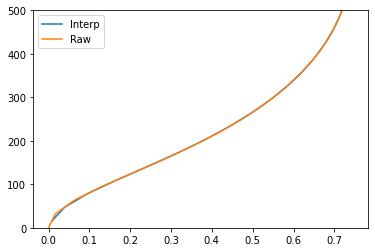

In [37]:
plt.plot(LES_allDays_allVarsHr.sel(case='HMG').isel(time=55).interp_w2.values, 
         LES_allDays_allVarsHr.sel(case='HMG').isel(time=55).z.values)

plt.plot(LES_allDays_allVarsHr.sel(case='HMG').isel(time=55).w2.values, 
         LES_allDays_allVarsHr.sel(case='HMG').isel(time=55).zw.values)

plt.legend(['Interp','Raw'])
plt.ylim([0,500])

### Check LES simulations - are these different cases?

In [17]:
LES_newDefault['Time'] = LES_newDefault.Time - np.timedelta64(30, 'm')

In [88]:
## Dump days that we don't have SCAM simulations for 

keepTimes = []

for iTimes_LES in range(len(LES_newDefault['Time'])): 
    
    iDay_SCAM = np.where( (scamDS['time.year']==int(LES_newDefault['Time.year'].values[iTimes_LES])) & 
                          (scamDS['time.month']==int(LES_newDefault['Time.month'].values[iTimes_LES])) & 
                          (scamDS['time.day']==int(LES_newDefault['Time.day'].values[iTimes_LES])))[0]
    
    if len(iDay_SCAM)>0:
        keepTimes = np.append(keepTimes, iTimes_LES)
    

    else: 
        print('We should get rid of %4i / %2i / %2i' % (LES_newDefault['Time.year'].values[iTimes_LES], 
                                                        LES_newDefault['Time.month'].values[iTimes_LES], 
                                                        LES_newDefault['Time.day'].values[iTimes_LES]))



We should get rid of 2015 /  6 /  6
We should get rid of 2015 /  6 /  6
We should get rid of 2015 /  6 /  6
We should get rid of 2015 /  6 /  6
We should get rid of 2015 /  6 /  6
We should get rid of 2015 /  6 /  6
We should get rid of 2015 /  6 /  6
We should get rid of 2015 /  6 /  6
We should get rid of 2015 /  6 /  6
We should get rid of 2015 /  6 /  6
We should get rid of 2015 /  6 /  6
We should get rid of 2015 /  6 /  6
We should get rid of 2015 /  6 /  6
We should get rid of 2015 /  6 /  6
We should get rid of 2015 /  6 /  6
We should get rid of 2015 /  6 /  6
We should get rid of 2015 /  6 /  9
We should get rid of 2015 /  6 /  9
We should get rid of 2015 /  6 /  9
We should get rid of 2015 /  6 /  9
We should get rid of 2015 /  6 /  9
We should get rid of 2015 /  6 /  9
We should get rid of 2015 /  6 /  9
We should get rid of 2015 /  6 /  9
We should get rid of 2015 /  6 /  9
We should get rid of 2015 /  6 /  9
We should get rid of 2015 /  6 /  9
We should get rid of 2015 / 

In [90]:
LES_newDefault = LES_newDefault.isel(Time=keepTimes.astype(int))


#### Sanity check on LES simulations

In [227]:
iChooseDay = np.where( (LES_allDays_allVars['time.year']==2017) & 
                       (LES_allDays_allVars['time.month']==7) & 
                       (LES_allDays_allVars['time.day']==16) )[0]
LESmomentsFile     = LES_allDays_allVars.isel(time=iChooseDay).resample(time='1H').mean() 
LESmomentsFile['time'] = LESmomentsFile['time'] + np.timedelta64(30, 'm')
LESmomentsFile_raw = LES_allDays_allVars.isel(time=iChooseDay)



In [64]:
iChooseDay = np.where( (LESdefault_allDays['Time.year']==2017) & 
                       (LESdefault_allDays['Time.month']==7) & 
                       (LESdefault_allDays['Time.day']==16) )[0]

# LESoldDefault = LESdefault_allDays.isel(Time=iChooseDay)


In [228]:
iChooseDay = np.where( (LES_newDefault['Time.year']==2017) & 
                       (LES_newDefault['Time.month']==7) & 
                       (LES_newDefault['Time.day']==16) )[0]

LESnewDefault = LES_newDefault.isel(Time=iChooseDay)


(0.012, 0.017)

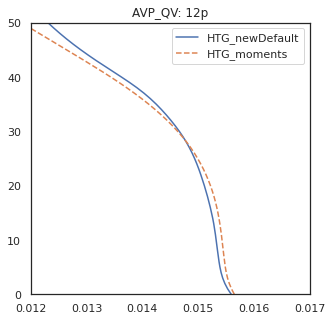

In [229]:
fig,axs = plt.subplots(1,1, figsize=(5,5))

# axs.plot(LESoldDefault.AVP_QV.sel(case='HTG').isel(Time=5).values,
#          LESoldDefault.bottom_top.values, label='HTG_oldDefault' )

axs.plot(htgLESnew.AVP_QV.isel(Time=5).values,
         htgLESnew.bottom_top.values, label='HTG_newDefault' )

axs.plot(LESmomentsFile.qv.sel(case='HTG').isel(time=4).values,
         LESmomentsFile.k.values, '--', label='HTG_moments' )

axs.legend()
axs.set_title('AVP_QV: 12p')

axs.set_ylim([0,50])
axs.set_xlim([0.012, 0.017])


Text(0.5, 1.0, 'Domain-mean LWP: 7/16/2017')

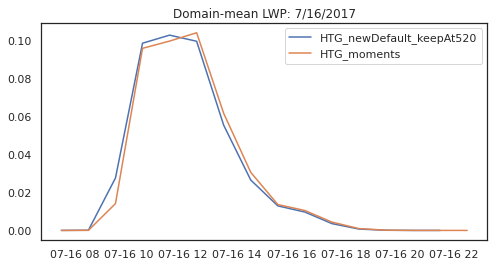

In [230]:
fig,axs = plt.subplots(1,1, figsize=(8,4))

# axs.plot(LESoldDefault.Time.values, 
#          LESoldDefault.AVS_LWP.sel(case='HTG').mean(("west_east","south_north")).values, label='HTG_oldDefault' )

# axs.plot(htgLESnew.Time.values, 
#          htgLESnew.AVS_LWP.isel(south_north=np.arange(60,460), west_east=np.arange(60,460)).mean(("west_east","south_north")).values,
#          label='HTG_newDefault_trimTo400' )

axs.plot(LESnewDefault.Time.values, 
         LESnewDefault.sel(case='HTG').AVS_LWP.mean(("west_east","south_north")).values, label='HTG_newDefault_keepAt520' )

axs.plot(LESmomentsFile.time.values, LESmomentsFile.lwp.sel(case='HTG').values, label='HTG_moments' )

axs.legend()
axs.set_title('Domain-mean LWP: 7/16/2017')


Text(0.5, 1.0, 'Domain-mean LWP: 7/16/2017')

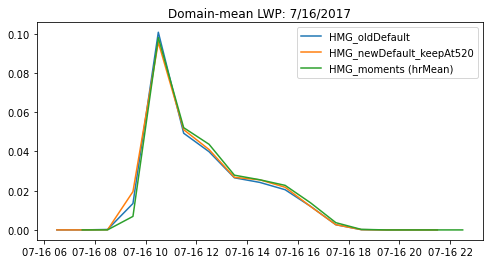

In [68]:
fig,axs = plt.subplots(1,1, figsize=(8,4))

axs.plot(LESoldDefault.Time.values, 
         LESoldDefault.AVS_LWP.sel(case='HMG').mean(("west_east","south_north")).values, label='HMG_oldDefault' )

# axs.plot(hmgLESnew.Time.values, 
#          hmgLESnew.AVS_LWP.isel(south_north=np.arange(60,460), west_east=np.arange(60,460)).mean(("west_east","south_north")).values,
#          label='HMG_newDefault_trimTo400' )

axs.plot(LESnewDefault.Time.values, 
         LESnewDefault.sel(case='HMG').AVS_LWP.mean(("west_east","south_north")).values, label='HMG_newDefault_keepAt520' )


# axs.plot(LESmomentsFile_raw.time.values, LESmomentsFile_raw.lwp.sel(case='HMG').values, label='HMG_moments' )
axs.plot(LESmomentsFile.time.values, LESmomentsFile.lwp.sel(case='HMG').values, label='HMG_moments (hrMean)' )

axs.legend()
axs.set_title('Domain-mean LWP: 7/16/2017')


### Identify hours with deep convection 

In [69]:
LES_newDefault

<xarray.Dataset>
Dimensions:      (Time: 992, bottom_top: 226, case: 2, south_north: 520, west_east: 520)
Coordinates:
  * Time         (Time) datetime64[ns] 2015-06-06T06:30:00 ... 2018-07-10T21:...
  * west_east    (west_east) float64 0.0 0.25 0.5 0.75 ... 129.2 129.5 129.8
  * south_north  (south_north) float64 0.0 0.25 0.5 0.75 ... 129.2 129.5 129.8
  * case         (case) object 'HMG' 'HTG'
Dimensions without coordinates: bottom_top
Data variables:
    XTIME        (case, Time) float32 0.0 60.0 120.0 180.0 ... 780.0 840.0 900.0
    AVS_SH       (case, Time, south_north, west_east) float32 0.0 0.0 ... -13.72
    AVS_LH       (case, Time, south_north, west_east) float32 0.0 0.0 ... 3.093
    AVS_LWP      (case, Time, south_north, west_east) float32 0.0 0.0 ... 0.0
    AVS_RAIN     (case, Time, south_north, west_east) float32 0.0 0.0 ... 0.0
    AVP_QC       (case, Time, bottom_top) float32 0.0 0.0 0.0 ... 0.0 0.0 0.0
    AVP_QV       (case, Time, bottom_top) float32 0.0 0.0 ... 3.497e-06 3.42e-06
    AVP_Z        (case, Time, bottom_top) float32 0.0 0.0 ... 1.475e+04
    AVP_P        (case, Time, bottom_top) float32 0.0 0.0 ... 1.357e+04 1.31e+04
    AVP_THL      (case, Time, bottom_top) float32 0.0 0.0 0.0 ... 365.5 366.9
    AVP_TH       (case, Time, bottom_top) float32 0.0 0.0 0.0 ... 365.5 366.9
    AVP_LWC      (case, Time, bottom_top) float32 0.0 0.0 0.0 ... 0.0 0.0 0.0
    AVP_IWC      (case, Time, bottom_top) float32 0.0 0.0 0.0 ... 0.0 0.0 0.0
Attributes:
    TITLE:                            OUTPUT FROM WRF V3.8.1 MODEL
    START_DATE:                      2015-06-06_12:00:00
    WEST-EAST_GRID_DIMENSION:        521
    SOUTH-NORTH_GRID_DIMENSION:      521
    BOTTOM-TOP_GRID_DIMENSION:       227
    DX:                              250.0
    DY:                              250.0
    GRIDTYPE:                        C
    DIFF_OPT:                        2
    KM_OPT:                          3
    DAMP_OPT:                        3
    DAMPCOEF:                        0.2
    KHDIF:                           0.0
    KVDIF:                           0.0
    MP_PHYSICS:                      8
    RA_LW_PHYSICS:                   4
    RA_SW_PHYSICS:                   4
    SF_SFCLAY_PHYSICS:               44
    SF_SURFACE_PHYSICS:              0
    BL_PBL_PHYSICS:                  0
    CU_PHYSICS:                      0
    SF_LAKE_PHYSICS:                 0
    SURFACE_INPUT_SOURCE:            3
    SST_UPDATE:                      0
    GRID_FDDA:                       0
    GFDDA_INTERVAL_M:                0
    GFDDA_END_H:                     0
    GRID_SFDDA:                      0
    SGFDDA_INTERVAL_M:               0
    SGFDDA_END_H:                    0
    HYPSOMETRIC_OPT:                 1
    USE_THETA_M:                     1
    WEST-EAST_PATCH_START_UNSTAG:    1
    WEST-EAST_PATCH_END_UNSTAG:      520
    WEST-EAST_PATCH_START_STAG:      1
    WEST-EAST_PATCH_END_STAG:        521
    SOUTH-NORTH_PATCH_START_UNSTAG:  1
    SOUTH-NORTH_PATCH_END_UNSTAG:    520
    SOUTH-NORTH_PATCH_START_STAG:    1
    SOUTH-NORTH_PATCH_END_STAG:      521
    BOTTOM-TOP_PATCH_START_UNSTAG:   1
    BOTTOM-TOP_PATCH_END_UNSTAG:     226
    BOTTOM-TOP_PATCH_START_STAG:     1
    BOTTOM-TOP_PATCH_END_STAG:       227
    GRID_ID:                         1
    PARENT_ID:                       0
    I_PARENT_START:                  0
    J_PARENT_START:                  0
    PARENT_GRID_RATIO:               1
    DT:                              0.5
    CEN_LAT:                         0.0
    CEN_LON:                         0.0
    TRUELAT1:                        0.0
    TRUELAT2:                        0.0
    MOAD_CEN_LAT:                    0.0
    STAND_LON:                       0.0
    POLE_LAT:                        0.0
    POLE_LON:                        0.0
    GMT:                             0.0
    JULYR:                           0
    JULDAY:                          1
    MAP_PROJ:                 

In [52]:
flag_DChtg = np.full([len(LES_newDefault.Time.values)], np.nan)

timeOffset = 0 
for iDay in range(len(keepDates)):
    selDay = np.where( (LES_newDefault.sel(case='HMG')['Time.year'].values  == keepDates[iDay].year) & 
                       (LES_newDefault.sel(case='HMG')['Time.month'].values == keepDates[iDay].month) & 
                       (LES_newDefault.sel(case='HMG')['Time.day'].values   == keepDates[iDay].day))[0]
    
    ## HTG deep convection formation
    HTGds_day  = LES_newDefault.isel(Time=selDay).sel(case='HTG')

    hrsDC      = np.ones(len(HTGds_day.Time.values))
    
    iHrDC_HTG  = np.where( (HTGds_day.AVP_Z.values>=6e3) & (HTGds_day.AVP_QC.values>0))
    
    if len(iHrDC_HTG[0][:]>0): 
        hrsDC[iHrDC_HTG[0][0]::] = 0
    
    flag_DChtg[timeOffset:timeOffset+len(HTGds_day.Time.values)] = hrsDC 
    
    timeOffset = timeOffset+len(HTGds_day.Time.values)
    
    
    

In [53]:
LES_newDefault['flag_DeepConvHTG'] = (('Time'), flag_DChtg)

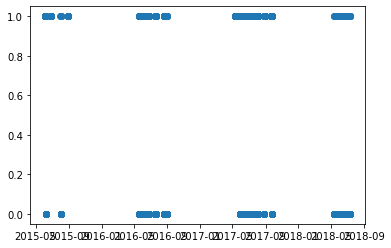

In [157]:
plt.plot(LES_newDefault.Time.values, flag_DChtg,'o')


**What about presence of rain? If it rains on a day in one sim but not the other...?**

In [54]:
scamDailyRain    = scamDS['PRECT'].sel(case='HMG').resample(time='1D').sum(dim='time').dropna(dim='time')
LESdailyRain     = LES_newDefault['AVS_RAIN'].mean(("south_north", "west_east")).sel(case='HMG').resample(Time='1D').sum(dim='Time').dropna(dim='Time')
LESdailyRainHTG  = LES_newDefault['AVS_RAIN'].mean(("south_north", "west_east")).sel(case='HTG').resample(Time='1D').sum(dim='Time').dropna(dim='Time')

LESdailyRainSum     = LES_newDefault['AVS_RAIN'].sum(("south_north", "west_east")).sel(case='HMG').resample(Time='1D').sum(dim='Time').dropna(dim='Time')
LESdailyRainSumHTG  = LES_newDefault['AVS_RAIN'].sum(("south_north", "west_east")).sel(case='HTG').resample(Time='1D').sum(dim='Time').dropna(dim='Time')


Text(0, 0.5, 'Sum over (mm/s)')

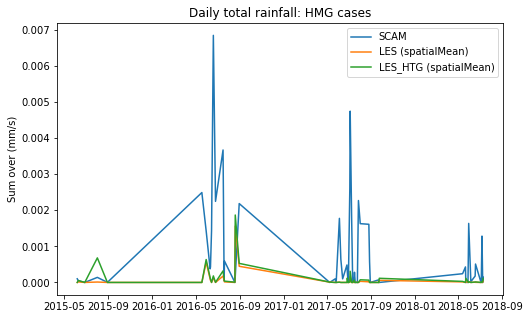

In [161]:
fig,axs = plt.subplots(1,1, figsize=(8,5))

plt.plot(scamDailyRain.time.values, np.squeeze(scamDailyRain.values)*1e3)
plt.plot(LESdailyRain.Time.values, np.squeeze(LESdailyRain.values))
plt.plot(LESdailyRain.Time.values, np.squeeze(LESdailyRainHTG.values))
plt.legend(['SCAM','LES (spatialMean)','LES_HTG (spatialMean)'])
plt.title('Daily total rainfall: HMG cases')
plt.ylabel('Sum over (mm/s)')


Text(0, 0.5, 'Sum over (mm/s)')

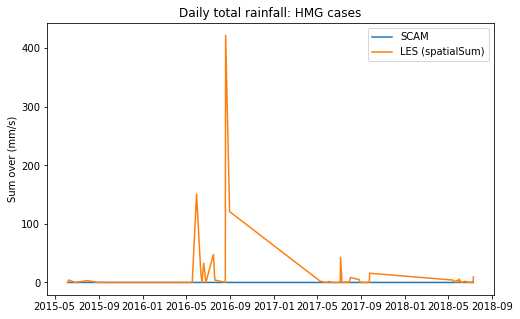

In [159]:
fig,axs = plt.subplots(1,1, figsize=(8,5))

plt.plot(scamDailyRain.time.values, np.squeeze(scamDailyRain.values)*1e3)
plt.plot(LESdailyRain.Time.values, np.squeeze(LESdailyRainSum.values))
plt.legend(['SCAM','LES (spatialSum)'])
plt.title('Daily total rainfall: HMG cases')
plt.ylabel('Sum over (mm/s)')



Text(0.5, 1.0, 'SCAM-LES daily rain')

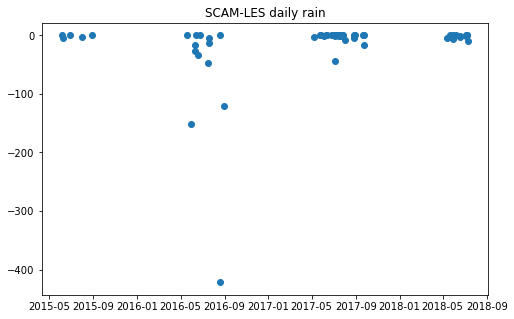

In [164]:
fig,axs = plt.subplots(1,1, figsize=(8,5))

plt.plot(scamDailyRain.time.values,
        (np.squeeze(scamDailyRain.values)*1e3) - np.squeeze(LESdailyRainSum.values), 'o')

plt.title('SCAM-LES daily rain')


## Figure out necessary mutlipliers


In [33]:
## Get daily maximum near-surface values 
LES_maxSfc_thl2 = LES_allDays_allVars.thl2.isel(k=0).sel(case='HTG').resample(time='1D').max().dropna(dim='time')
LES_maxSfc_qv2  = LES_allDays_allVars.qv2.isel(k=0).sel(case= 'HTG').resample(time='1D').max().dropna(dim='time')

LES_maxSfc30_thl2 = LES_allDays_allVars30m.thl2.isel(k=0).sel(case='HTG').resample(time='1D').max().dropna(dim='time')
LES_maxSfc30_qv2  = LES_allDays_allVars30m.qv2.isel(k=0).sel(case= 'HTG').resample(time='1D').max().dropna(dim='time')



scam_htgOnly_thl2 = scamDS.THLP2_CLUBB.isel(ilev=-1).sel(case='HTG*01') - scamDS.THLP2_CLUBB.isel(ilev=-1).sel(case='HMG')
scam_maxSfc_thlp2 = scam_htgOnly_thl2.resample(time='1D').max().dropna(dim='time')

scam_htgOnly_rtp2 = scamDS.RTP2_CLUBB.isel(ilev=-1).sel(case='HTG*01') - scamDS.RTP2_CLUBB.isel(ilev=-1).sel(case='HMG')
scam_maxSfc_rtp2  = scam_htgOnly_rtp2.resample(time='1D').max().dropna(dim='time')


# ## No deep convection version

# scam_htgOnly_thl2_dcOff = scamDS.THLP2_CLUBB.isel(ilev=-1).sel(case='HTG_dcOff') - scamDS.THLP2_CLUBB.isel(ilev=-1).sel(case='HMG_dcOff')
# scam_maxSfc_thlp2_dcOff = scam_htgOnly_thl2_dcOff.resample(time='1D').max().dropna(dim='time')

# scam_htgOnly_rtp2_dcOff = scamDS.RTP2_CLUBB.isel(ilev=-1).sel(case='HTG_dcOff') - scamDS.RTP2_CLUBB.isel(ilev=-1).sel(case='HMG_dcOff')
# scam_maxSfc_rtp2_dcOff  = scam_htgOnly_rtp2_dcOff.resample(time='1D').max().dropna(dim='time')


In [98]:
np.shape(LES_maxSfc30_thl2)

(60,)

In [34]:
## Get multipliers 

SCAMmultiplier_thl2_match = LES_maxSfc_thl2/np.squeeze(scam_maxSfc_thlp2)
SCAMmultiplier_qv2_match  = (LES_maxSfc_qv2*1e6)/np.squeeze(scam_maxSfc_rtp2)

# SCAMmultiplier_thl2_dcOff = LES_maxSfc_thl2/np.squeeze(scam_maxSfc_thlp2_dcOff)
# SCAMmultiplier_qv2_dcOff  = (LES_maxSfc_qv2*1e6)/np.squeeze(scam_maxSfc_rtp2_dcOff)




In [40]:
len(np.where(SCAMmultiplier_qv2_match>=100)[0])

4

In [35]:
## Using thirty minute mean data for the LES: 
SCAMmultiplier_thl2_match30 = LES_maxSfc30_thl2/np.squeeze(scam_maxSfc_thlp2)
SCAMmultiplier_qv2_match30  = (LES_maxSfc30_qv2*1e6)/np.squeeze(scam_maxSfc_rtp2)

In [49]:
yrSim  = []
monSim = []
daySim = []

thl2mult_sim = []
rtp2mult_sim = []


print('- - - - - - - - - - - - - - -  TEMPERATURE VARIANCE - - - - - - - - - - - - - - -')
# print('- - - - - - - - - - - - - - - - MOISTURE VARIANCE - - - - - - - - - - - - - - - -')
print('     Date    LESmax(10m)    LESmax(30m)    SCAMmax(30m)    mult(10m)    mult(30m)')


for iDay in range(len(uniqDays_scam)):
    ## - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - 
    ## Get just this day 
    thisDay  = pd.to_datetime(uniqDays_scam[iDay])
    dayString = str(thisDay.month)+'/'+str(thisDay.day)+'/'+str(thisDay.year)
    
    itimeSCAM    = np.where( (scamDS['time.year'].values==thisDay.year) & 
                             (scamDS['time.month'].values==thisDay.month) & 
                             (scamDS['time.day'].values==thisDay.day) )[0]
    
    itimeLES_10m = np.where( (LES_allDays_allVars['time.year'].values==thisDay.year) & 
                             (LES_allDays_allVars['time.month'].values==thisDay.month) & 
                             (LES_allDays_allVars['time.day'].values==thisDay.day) )[0]
    
    itimeLES_30m = np.where( (LES_allDays_allVars30m['time.year'].values==thisDay.year) & 
                             (LES_allDays_allVars30m['time.month'].values==thisDay.month) & 
                             (LES_allDays_allVars30m['time.day'].values==thisDay.day) )[0]
    
    scamDay   = scamDS.isel(time=itimeSCAM)
    momsDay10 = LES_allDays_allVars.isel(time=itimeLES_10m)
    momsDay30 = LES_allDays_allVars30m.isel(time=itimeLES_30m)
    
    ## Get multiplier data 
    LES_maxSfc10_thl2 = momsDay10.thl2.isel(k=0).sel(case='HTG').resample(time='1D').max().dropna(dim='time')
    LES_maxSfc10_qv2  = momsDay10.qv2.isel(k=0).sel(case= 'HTG').resample(time='1D').max().dropna(dim='time')

    LES_maxSfc30_thl2 = momsDay30.thl2.isel(k=0).sel(case='HTG').resample(time='1D').max().dropna(dim='time')
    LES_maxSfc30_qv2  = momsDay30.qv2.isel(k=0).sel(case= 'HTG').resample(time='1D').max().dropna(dim='time')

    
    scam_htgOnly_thl2 = scamDay.THLP2_CLUBB.isel(ilev=-1).sel(case='HTG*01') - scamDay.THLP2_CLUBB.isel(ilev=-1).sel(case='HMG')
    scamDay_maxSfc_thlp2 = scam_htgOnly_thl2.resample(time='1D').max().dropna(dim='time')

    scam_htgOnly_rtp2 = scamDay.RTP2_CLUBB.isel(ilev=-1).sel(case='HTG*01') - scamDay.RTP2_CLUBB.isel(ilev=-1).sel(case='HMG')
    scamDay_maxSfc_rtp2 = scam_htgOnly_rtp2.resample(time='1D').max().dropna(dim='time')
    
    # multipliers
    SCAMmultiplier10_thl2_day = LES_maxSfc10_thl2/np.squeeze(scamDay_maxSfc_thlp2)
    SCAMmultiplier10_qv2_day  = (LES_maxSfc10_qv2*1e6)/np.squeeze(scamDay_maxSfc_rtp2)
    
    SCAMmultiplier30_thl2_day = LES_maxSfc30_thl2/np.squeeze(scamDay_maxSfc_thlp2)
    SCAMmultiplier30_qv2_day  = (LES_maxSfc30_qv2*1e6)/np.squeeze(scamDay_maxSfc_rtp2)
    
    # Print THLP2 stuff
    print('%10s %8.2f %15.2f %15.2f %12.1f %12.1f' % (dayString, LES_maxSfc10_thl2, LES_maxSfc30_thl2, 
                                        scamDay_maxSfc_thlp2, SCAMmultiplier10_thl2_day, SCAMmultiplier30_thl2_day) )
    # # Print RTP2 stuff
    # print('%10s %8.2f %15.2f %15.2f %12.1f %12.1f' % (dayString, (LES_maxSfc10_qv2*1e6), (LES_maxSfc30_qv2*1e6), 
    #                                     scamDay_maxSfc_rtp2, SCAMmultiplier10_qv2_day, SCAMmultiplier30_qv2_day) )

    # Save stuff for bash script
    if thisDay>=datetime.date(2018,7,11):
        simDay = thisDay - timedelta(days=1)
        
        yrSim  = np.append(yrSim,  simDay.year)
        monSim = np.append(monSim, simDay.month)
        daySim = np.append(daySim, simDay.day)
        
        thl2mult_sim = np.append(thl2mult_sim, SCAMmultiplier10_thl2_day)
        rtp2mult_sim = np.append(rtp2mult_sim, SCAMmultiplier10_qv2_day)
        
print('Done')
    

- - - - - - - - - - - - - - -  TEMPERATURE VARIANCE - - - - - - - - - - - - - - -
     Date    LESmax(10m)    LESmax(30m)    SCAMmax(30m)    mult(10m)    mult(30m)
  6/6/2015     0.77            0.75            0.09          8.3          8.1
  6/9/2015     2.95            2.95            0.13         21.9         21.9
 6/27/2015     0.18            0.18            0.15          1.2          1.2
  8/1/2015     7.57            7.55            0.04        168.9        168.6
 8/29/2015     0.16            0.16            0.04          3.8          3.8
 5/18/2016     0.09            0.09            0.01          7.7          7.7
 5/30/2016     3.30            3.27            0.05         72.6         72.0
 6/10/2016     0.54            0.53            0.08          6.5          6.4
 6/11/2016     0.41            0.40            0.13          3.2          3.1
 6/14/2016     0.17            0.15            0.03          6.4          5.5
 6/19/2016     0.84            0.80            0.05     

In [39]:
rtp2mult_sim

[]

In [51]:
100.0*((SCAMmultiplier_qv2_match30 - SCAMmultiplier_qv2_match)/SCAMmultiplier_qv2_match).min()

<xarray.DataArray ()>
array(-39.52356875)
Coordinates:
    k        int32 0
    case     <U3 'HTG'
    lat      float64 36.61
    lon      float64 262.5
    ilev     float64 1e+03

In [40]:
print('Mean multiplier thl2: ', np.nanmean(SCAMmultiplier_thl2_match))

print('Mean multiplier qv: ', np.nanmean(SCAMmultiplier_qv2_match))


Mean multiplier thl2:  53.709755
Mean multiplier qv:  20.387201


[None, None, None, None, None, None, None, None]

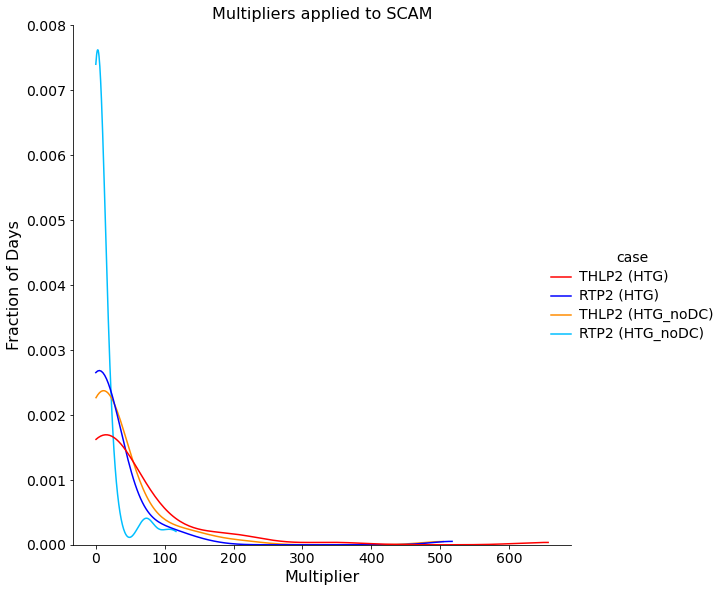

In [59]:
# Define dataframe

# Define dataframe
dfReal = pd.concat(axis=0, ignore_index=True, objs=[
     pd.DataFrame.from_dict({'Multiplier': np.squeeze(SCAMmultiplier_thl2_match.values),    'case': 'THLP2 (HTG)'}),
     pd.DataFrame.from_dict({'Multiplier': np.squeeze(SCAMmultiplier_qv2_match.values),    'case': 'RTP2 (HTG)'}),
     pd.DataFrame.from_dict({'Multiplier': np.squeeze(SCAMmultiplier_thl2_dcOff.values),    'case': 'THLP2 (HTG_noDC)'}),
     pd.DataFrame.from_dict({'Multiplier': np.squeeze(SCAMmultiplier_qv2_dcOff.values),    'case': 'RTP2 (HTG_noDC)'}),
])

# Make plot 
g = sns.displot(dfReal, x='Multiplier', hue='case', kind='kde', height=8, cut=0, 
                # palette=['orangered','turquoise','forestgreen','blueviolet'])
                palette=['red','blue', 'darkorange','deepskyblue'])


g.ax.set_title("Multipliers applied to SCAM", fontsize=16 ) 
g.ax.set_xlabel('Multiplier',fontsize=16)
g.ax.set_ylabel('Fraction of Days',fontsize=16)
g.ax.tick_params(axis='both', labelsize= 14)
plt.setp(g._legend.get_title(), fontsize=14)
plt.setp(g._legend.get_texts(), fontsize=14)
# sns.move_legend(g, "center right")

# g.ax.axvline(circMetric.metricVal.values[np.where(circMetric.dateVal.values==20160610)[0]], color='red')
# g.ax.axvline(circMetric.metricVal.values[np.where(circMetric.dateVal.values==20170716)[0]], color='limegreen')
# g.ax.axvline(circMetric.metricVal.values[np.where(circMetric.dateVal.values==20170924)[0]], color='blue')


In [42]:
for iDay in range(len(SCAMmultiplier_qv2.values)): 

    if (SCAMmultiplier_qv2['time.year'].values[iDay]==2018): 
        print('%s   %.1f' % (SCAMmultiplier_qv2['time'].values[iDay], SCAMmultiplier_qv2.values[iDay]))
        

NameError: name 'SCAMmultiplier_qv2' is not defined

In [43]:
print('  Date                          thlp2_mult   rtp2_mult   LES_thlp2Max   LES_rtp2Max ')

for iDay in range(len(SCAMmultiplier_thl2_match.values)):
    print('%s %12.2f %10.2f %13.3f %14.3f' % (LES_maxSfc_thl2.time.values[iDay],
                              SCAMmultiplier_thl2_match[iDay],
                              SCAMmultiplier_qv2_match[iDay],
                              np.squeeze(LES_maxSfc_thl2)[iDay],
                              np.squeeze(LES_maxSfc_qv2*1e6)[iDay],

                               ) )


  Date                          thlp2_mult   rtp2_mult   LES_thlp2Max   LES_rtp2Max 
2015-06-06T00:00:00.000000000         8.28       0.86         0.767          0.161
2015-06-09T00:00:00.000000000        21.92       2.33         2.950          1.538
2015-06-27T00:00:00.000000000         1.22       0.12         0.179          0.147
2015-08-01T00:00:00.000000000       168.95      96.66         7.569          8.539
2015-08-29T00:00:00.000000000         3.83       0.73         0.164          0.140
2016-05-18T00:00:00.000000000         7.66       3.31         0.088          0.030
2016-05-30T00:00:00.000000000        72.62      10.81         3.295          1.010
2016-06-10T00:00:00.000000000         6.55       1.43         0.541          0.175
2016-06-11T00:00:00.000000000         3.15       1.54         0.407          0.240
2016-06-14T00:00:00.000000000         6.37       2.91         0.170          0.099
2016-06-19T00:00:00.000000000        17.01       9.53         0.839          0.367
20

In [21]:
print('  Date                  thlp2_mult   rtp2_mult   SCAM_thlp2Max   SCAM_rtp2Max ')

for iDay in range(len(SCAMmultiplier_thl2_match.values)):
    print('%s %12.2f %10.2f %13.3f %14.3f' % (scam_maxSfc_rtp2.time.values[iDay],
                              # SCAMmultiplier_thl2_match[iDay],
                              # SCAMmultiplier_qv2_match[iDay],
                              SCAMmultiplier_thl2_dcOff[iDay],
                              SCAMmultiplier_qv2_dcOff[iDay],
                              np.squeeze(scam_maxSfc_thlp2)[iDay],
                              np.squeeze(scam_maxSfc_rtp2)[iDay],

                               ) )


  Date                  thlp2_mult   rtp2_mult   SCAM_thlp2Max   SCAM_rtp2Max 
2016-05-18T00:00:00.000000000         6.91       3.00         0.011          0.009
2016-05-30T00:00:00.000000000        15.29       1.65         0.045          0.093
2016-06-10T00:00:00.000000000         5.69       1.40         0.083          0.123
2016-06-11T00:00:00.000000000         3.75       1.74         0.129          0.157
2016-06-14T00:00:00.000000000         4.17       1.99         0.027          0.034
2016-06-19T00:00:00.000000000        20.51       1.54         0.049          0.039
2016-06-25T00:00:00.000000000        14.15       5.35         0.036          0.061
2016-07-16T00:00:00.000000000        41.79      11.98         0.061          0.043
2016-07-19T00:00:00.000000000         6.75       1.87         0.068          0.155
2016-07-20T00:00:00.000000000         2.97       0.85         0.078          0.119
2016-08-18T00:00:00.000000000        21.85       5.42         0.049          0.105
2016-08-

In [50]:
np.shape(LES_maxSfc30_thl2)

(1,)

(-0.5, 18.0)

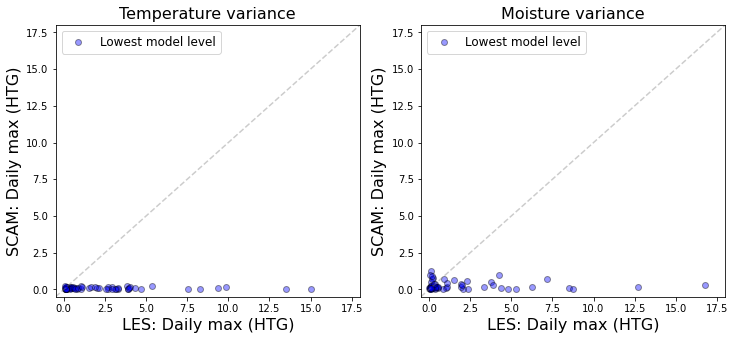

In [54]:
fig,axs = plt.subplots(1,2, figsize=(12,5))
axs     = axs.ravel()

xLabel = 'LES: Daily max (HTG)'

axs[0].plot(LES_maxSfc30_thl2,      np.squeeze(scam_maxSfc_thlp2), 'bo',alpha=0.4, markeredgecolor='k')
axs[1].plot((LES_maxSfc30_qv2*1e6), np.squeeze(scam_maxSfc_rtp2), 'bo',alpha=0.4, markeredgecolor='k')

axs[0].set_xlabel(xLabel,fontsize=16)
axs[1].set_xlabel(xLabel,fontsize=16)

axs[0].set_ylabel('SCAM: Daily max (HTG)',fontsize=16)
axs[1].set_ylabel('SCAM: Daily max (HTG)',fontsize=16)

axs[0].set_title('Temperature variance',fontsize=16)
axs[1].set_title('Moisture variance',fontsize=16)

# axs[0].legend(['R = % .3f' % (np.corrcoef(LES_maxSfc_thl2,      np.squeeze(scam_maxSfc_thlp2))[0,1])])
# axs[1].legend(['R = % .3f' % (np.corrcoef((LES_maxSfc_qv2*1e6), np.squeeze(scam_maxSfc_rtp2))[0,1])])

axs[0].legend(['Lowest model level'], fontsize=12)
axs[1].legend(['Lowest model level'], fontsize=12)

axs[0].plot(np.arange(-0.5,18.5,0.5), np.arange(-0.5,18.5,0.5), '--', color='grey', alpha=0.4)
axs[1].plot(np.arange(-0.5,18.5,0.5), np.arange(-0.5,18.5,0.5), '--', color='grey', alpha=0.4)

axs[0].set_ylim([-0.5, 18])
axs[0].set_xlim([-0.5, 18])

axs[1].set_ylim([-0.5, 18])
axs[1].set_xlim([-0.5, 18])



(-0.5, 18.0)

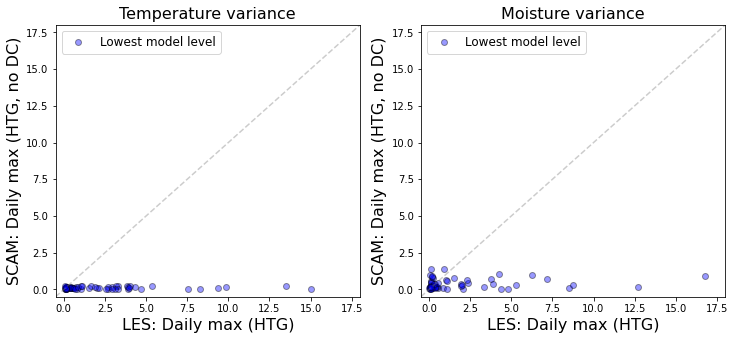

In [54]:
fig,axs = plt.subplots(1,2, figsize=(12,5))
axs     = axs.ravel()

xLabel = 'LES: Daily max (HTG)'

axs[0].plot(LES_maxSfc30_thl2,      np.squeeze(scam_maxSfc_thlp2_dcOff), 'bo',alpha=0.4, markeredgecolor='k')
axs[1].plot((LES_maxSfc30_qv2*1e6), np.squeeze(scam_maxSfc_rtp2_dcOff), 'bo',alpha=0.4, markeredgecolor='k')

axs[0].set_xlabel(xLabel,fontsize=16)
axs[1].set_xlabel(xLabel,fontsize=16)

axs[0].set_ylabel('SCAM: Daily max (HTG, no DC)',fontsize=16)
axs[1].set_ylabel('SCAM: Daily max (HTG, no DC)',fontsize=16)

axs[0].set_title('Temperature variance',fontsize=16)
axs[1].set_title('Moisture variance',fontsize=16)

# axs[0].legend(['R = % .3f' % (np.corrcoef(LES_maxSfc_thl2,      np.squeeze(scam_maxSfc_thlp2_dcOff))[0,1])])
# axs[1].legend(['R = % .3f' % (np.corrcoef((LES_maxSfc_qv2*1e6), np.squeeze(scam_maxSfc_rtp2_dcOff))[0,1])])

axs[0].legend(['Lowest model level'], fontsize=12)
axs[1].legend(['Lowest model level'], fontsize=12)

axs[0].plot(np.arange(-0.5,18.5,0.5), np.arange(-0.5,18.5,0.5), '--', color='grey', alpha=0.4)
axs[1].plot(np.arange(-0.5,18.5,0.5), np.arange(-0.5,18.5,0.5), '--', color='grey', alpha=0.4)

axs[0].set_ylim([-0.5, 18])
axs[0].set_xlim([-0.5, 18])

axs[1].set_ylim([-0.5, 18])
axs[1].set_xlim([-0.5, 18])



In [55]:
np.nanmean(scam_maxSfc_rtp2_dcOff)

0.37823156

## Begin analysis

### Profiles at specific hours

In [56]:
scamDS.case.values

array(['HMG', 'HTG*01', 'HTG*LESmult', 'HMG_dcOff', 'HTG_dcOff',
       'HTG*LESmult_dcOff'], dtype=object)

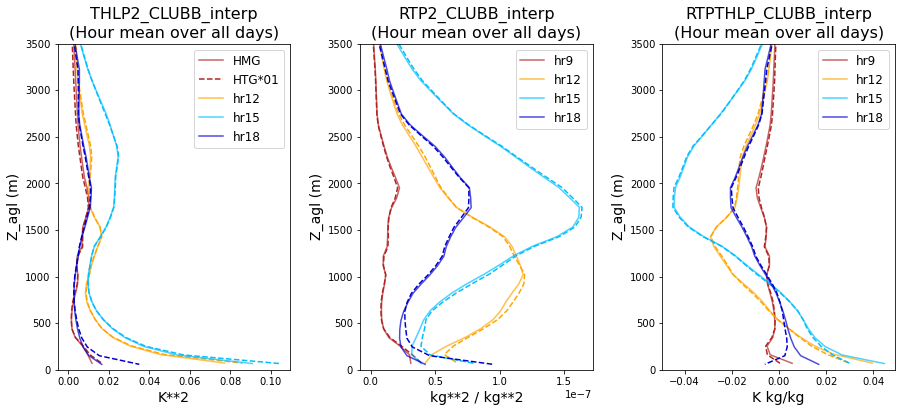

In [57]:
## Choose hours to plot and get mean 

varPlots = ['THLP2_CLUBB_interp', 'RTP2_CLUBB_interp', 'RTPTHLP_CLUBB_interp']
levNames = ['Z3_interp', 'Z3_interp', 'Z3_interp']
varMultiplier = [1.0, 1e-6, 1.0]
unitsStr = ['K**2', 'kg**2 / kg**2', 'K kg/kg']

# case1 = 'HMG_dcOff'
# case2 = 'HTG_dcOff'


case1 = 'HMG'
case2 = 'HTG*01'

ymin    = 0
ymax    = 3500

hourSel    = [  9,          12,            15,             18]
colorsList = ['firebrick','orange','deepskyblue','mediumblue']

fig,axs = plt.subplots(1,3, figsize=(15,6))
axs     = axs.ravel()
fig.subplots_adjust(wspace = 0.3)

for iHr in range(len(hourSel)):
    ## Select hour
    iTimeSel      = np.where( (scamDS["time.hour"].values==hourSel[iHr]) )[0]
    hourlyMean_DS = scamDS.isel(time=iTimeSel).mean(dim='time')
    
    ## Select each case
    HMGvar   = hourlyMean_DS.sel(case=case1)
    HTGvar   = hourlyMean_DS.sel(case=case2)
    
    for iPlot in range(len(varPlots)):
        if ((iPlot==0) & (iHr==0)):
            axs[iPlot].plot( np.squeeze(HMGvar[varPlots[iPlot]].values), 
                     np.squeeze(HMGvar[levNames[iPlot]].values), 
                     alpha=0.7, color=colorsList[iHr], label=HMGvar.case.values )
            
            axs[iPlot].plot( np.squeeze(HTGvar[varPlots[iPlot]].values), 
                     np.squeeze(HTGvar[levNames[iPlot]].values), 
                     '--',  color=colorsList[iHr], label=HTGvar.case.values )
        else:
            axs[iPlot].plot( np.squeeze(HMGvar[varPlots[iPlot]].values)*varMultiplier[iPlot], 
                             np.squeeze(HMGvar[levNames[iPlot]].values),
                             alpha=0.7, color=colorsList[iHr], label='hr'+str(hourSel[iHr]) )
            
            axs[iPlot].plot( np.squeeze(HTGvar[varPlots[iPlot]].values)*varMultiplier[iPlot], 
                             np.squeeze(HTGvar[levNames[iPlot]].values), 
                            '--',     color=colorsList[iHr], )

        
        axs[iPlot].legend(fontsize=12)
        axs[iPlot].set_ylim([ymin, ymax])

        axs[iPlot].set_title(varPlots[iPlot]+'\n'+'(Hour mean over all days)', fontsize=16)
    
        axs[iPlot].set_ylabel('Z_agl (m)', fontsize=14)
        axs[iPlot].set_xlabel(unitsStr[iPlot], fontsize=14)
    
    # axs.axhline(HMGvar.PBLH.values, linestyle='-.', alpha=0.5, color=colorsList[iHr])
    # axs.axhline(HTGvar.PBLH.values, linestyle=':', alpha=0.5, color=colorsList[iHr])



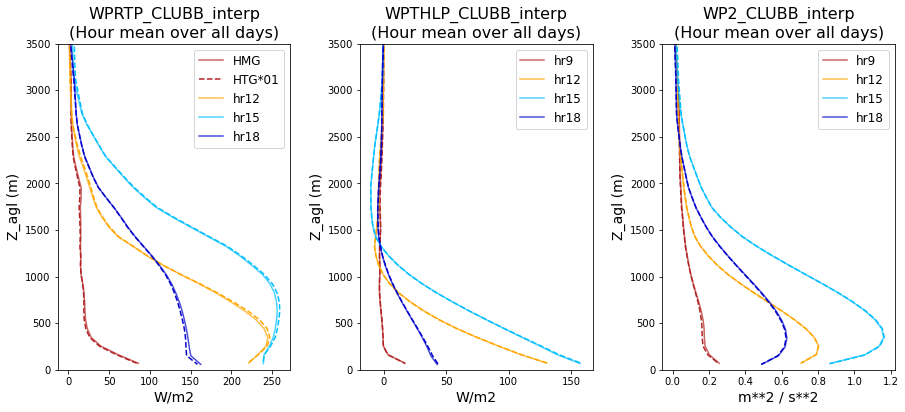

In [58]:
## Choose hours to plot and get mean 

varPlots = ['WPRTP_CLUBB_interp', 'WPTHLP_CLUBB_interp', 'WP2_CLUBB_interp']
levNames = ['Z3_interp', 'Z3_interp', 'Z3_interp']
varMultiplier = [1.0, 1.0, 1.0]
unitsStr = ['W/m2', 'W/m2', 'm**2 / s**2']

# case1 = 'HMG_dcOff'
# case2 = 'HTG_dcOff'

case1 = 'HMG'
case2 = 'HTG*01'

ymin    = 0
ymax    = 3500

hourSel    = [  9,          12,            15,             18]
colorsList = ['firebrick','orange','deepskyblue','mediumblue']

fig,axs = plt.subplots(1,3, figsize=(15,6))
axs     = axs.ravel()
fig.subplots_adjust(wspace = 0.3)

for iHr in range(len(hourSel)):
    ## Select hour
    iTimeSel      = np.where( (scamDS["time.hour"].values==hourSel[iHr]) )[0]
    hourlyMean_DS = scamDS.isel(time=iTimeSel).mean(dim='time')
    
    ## Select each case
    HMGvar   = hourlyMean_DS.sel(case=case1)
    HTGvar   = hourlyMean_DS.sel(case=case2)
    
    for iPlot in range(len(varPlots)):
        if ((iPlot==0) & (iHr==0)):
            axs[iPlot].plot( np.squeeze(HMGvar[varPlots[iPlot]].values), 
                     np.squeeze(HMGvar[levNames[iPlot]].values), 
                     alpha=0.7, color=colorsList[iHr], label=HMGvar.case.values )
            
            axs[iPlot].plot( np.squeeze(HTGvar[varPlots[iPlot]].values), 
                     np.squeeze(HTGvar[levNames[iPlot]].values), 
                     '--',  color=colorsList[iHr], label=HTGvar.case.values )
        else:
            axs[iPlot].plot( np.squeeze(HMGvar[varPlots[iPlot]].values)*varMultiplier[iPlot], 
                             np.squeeze(HMGvar[levNames[iPlot]].values),
                             alpha=0.7, color=colorsList[iHr], label='hr'+str(hourSel[iHr]) )
            
            axs[iPlot].plot( np.squeeze(HTGvar[varPlots[iPlot]].values)*varMultiplier[iPlot], 
                             np.squeeze(HTGvar[levNames[iPlot]].values), 
                            '--',     color=colorsList[iHr], )

        
        axs[iPlot].legend(fontsize=12)
        axs[iPlot].set_ylim([ymin, ymax])

        axs[iPlot].set_title(varPlots[iPlot]+'\n'+'(Hour mean over all days)', fontsize=16)
    
        axs[iPlot].set_ylabel('Z_agl (m)', fontsize=14)
        axs[iPlot].set_xlabel(unitsStr[iPlot], fontsize=14)
    
    # axs.axhline(HMGvar.PBLH.values, linestyle='-.', alpha=0.5, color=colorsList[iHr])
    # axs.axhline(HTGvar.PBLH.values, linestyle=':', alpha=0.5, color=colorsList[iHr])



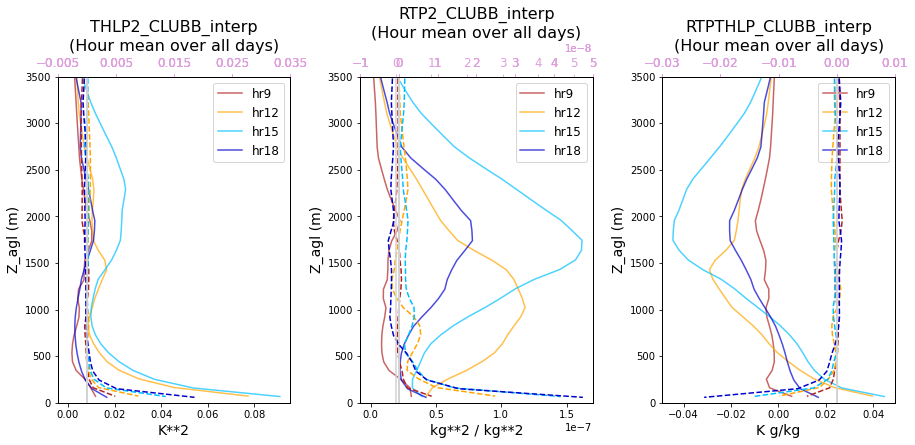

In [59]:
## Plot HMG and delta 

varPlots = ['THLP2_CLUBB_interp', 'RTP2_CLUBB_interp', 'RTPTHLP_CLUBB_interp']
levNames = ['Z3_interp', 'Z3_interp', 'Z3_interp']
varMultiplier = [1.0, 1e-6, 1.0]
unitsStr = ['K**2', 'kg**2 / kg**2', 'K g/kg']

ax2max = []

# case1 = 'HMG_dcOff'
# case2 = 'HTG_dcOff'


case1 = 'HMG'
case2 = 'HTG*01'

ymin    = 0
ymax    = 3500

hourSel    = [  9,          12,            15,             18]
colorsList = ['firebrick','orange','deepskyblue','mediumblue']

fig,axs = plt.subplots(1,3, figsize=(15,6))
axs     = axs.ravel()
fig.subplots_adjust(wspace = 0.3)

for iHr in range(len(hourSel)):
    ## Select hour
    iTimeSel      = np.where( (scamDS["time.hour"].values==hourSel[iHr]) )[0]
    hourlyMean_DS = scamDS.isel(time=iTimeSel).mean(dim='time')
    
    ## Select each case
    HMGvar   = hourlyMean_DS.sel(case=case1)
    HTGvar   = hourlyMean_DS.sel(case=case2)
    
    for iPlot in range(len(varPlots)):
        ax2 = axs[iPlot].twiny()
        
#         if ((iPlot==0) & (iHr==0)):
#             axs[iPlot].plot( np.squeeze(HMGvar[varPlots[iPlot]].values), 
#                      np.squeeze(HMGvar[levNames[iPlot]].values), 
#                      alpha=0.7, color=colorsList[iHr], label=HMGvar.case.values )
            
#             ax2.plot( np.squeeze(HTGvar[varPlots[iPlot]].values - HMGvar[varPlots[iPlot]].values), 
#                      np.squeeze(HTGvar[levNames[iPlot]].values), 
#                      '--',  color=colorsList[iHr], label=str(HTGvar.case.values)+'-'+str(HMGvar.case.values) )
#         else:
        axs[iPlot].plot( np.squeeze(HMGvar[varPlots[iPlot]].values)*varMultiplier[iPlot], 
                         np.squeeze(HMGvar[levNames[iPlot]].values),
                         alpha=0.7, color=colorsList[iHr], label='hr'+str(hourSel[iHr]) )

        ax2.plot( np.squeeze(HTGvar[varPlots[iPlot]].values-HMGvar[varPlots[iPlot]].values)*varMultiplier[iPlot], 
                  np.squeeze(HTGvar[levNames[iPlot]].values), 
                        '--',     color=colorsList[iHr], )
            
        if varPlots[iPlot]=='RTP2_CLUBB_interp':
            ax2.set_xticks(np.arange(-0.1e-7, 0.6e-7, 0.1e-7))
        elif varPlots[iPlot]=='RTPTHLP_CLUBB_interp':
            ax2.set_xticks(np.arange(-0.03, 0.02, 0.01))
        elif varPlots[iPlot]=='THLP2_CLUBB_interp':
            ax2.set_xticks(np.arange(-0.005, 0.04, 0.01))
        else: 
            ax2.set_xticks(np.arange(-0.01, 0.04, 0.01))

        ax2.tick_params(axis='x', colors='plum', labelsize=12)
        ax2.axvline(0, color='lightgrey', linestyle='-')
        
        axs[iPlot].legend(fontsize=12)
        axs[iPlot].set_ylim([ymin, ymax])

        axs[iPlot].set_title(varPlots[iPlot]+'\n'+'(Hour mean over all days)', fontsize=16)
    
        axs[iPlot].set_ylabel('Z_agl (m)', fontsize=14)
        axs[iPlot].set_xlabel(unitsStr[iPlot], fontsize=14)
    
    # axs.axhline(HMGvar.PBLH.values, linestyle='-.', alpha=0.5, color=colorsList[iHr])
    # axs.axhline(HTGvar.PBLH.values, linestyle=':', alpha=0.5, color=colorsList[iHr])



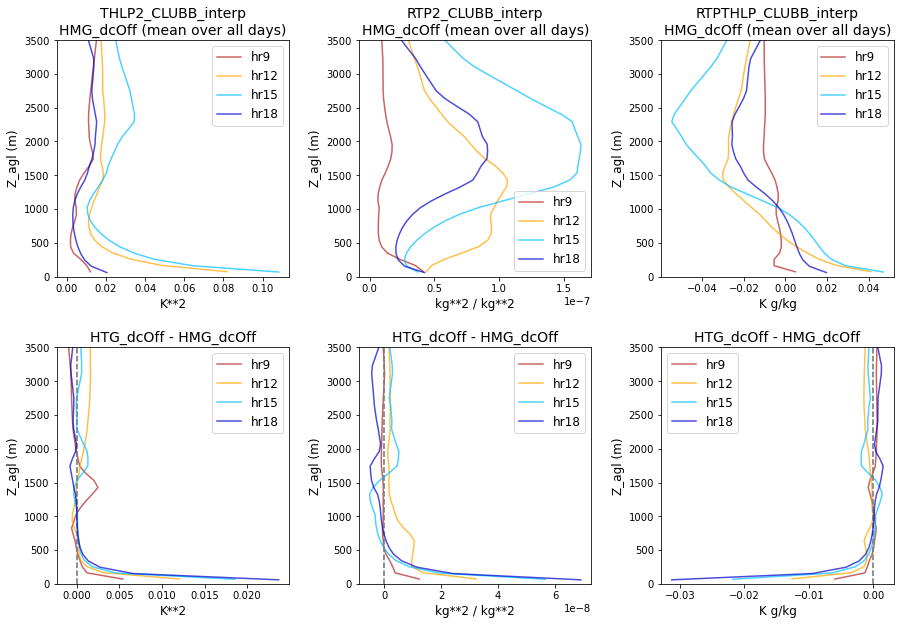

In [60]:
## Plot HMG and delta 

varPlots = ['THLP2_CLUBB_interp', 'RTP2_CLUBB_interp', 'RTPTHLP_CLUBB_interp']
levNames = ['Z3_interp', 'Z3_interp', 'Z3_interp']
varMultiplier = [1.0, 1e-6, 1.0]
unitsStr = ['K**2', 'kg**2 / kg**2', 'K g/kg']

ax2max = []

case1 = 'HMG_dcOff'
case2 = 'HTG_dcOff'

# case1 = 'HMG'
# case2 = 'HTG*01'

ymin    = 0
ymax    = 3500

hourSel    = [  9,          12,            15,             18]
colorsList = ['firebrick','orange','deepskyblue','mediumblue']

fig,axs = plt.subplots(2,3, figsize=(15,10))
axs     = axs.ravel()
fig.subplots_adjust(wspace = 0.3, hspace = 0.3)

for iHr in range(len(hourSel)):
    ## Select hour
    iTimeSel      = np.where( (scamDS["time.hour"].values==hourSel[iHr]) )[0]
    hourlyMean_DS = scamDS.isel(time=iTimeSel).mean(dim='time')
    
    ## Select each case
    HMGvar   = hourlyMean_DS.sel(case=case1)
    HTGvar   = hourlyMean_DS.sel(case=case2)
    
    for iPlot in range(len(varPlots)):
        
        axs[iPlot].plot( np.squeeze(HMGvar[varPlots[iPlot]].values)*varMultiplier[iPlot], 
                         np.squeeze(HMGvar[levNames[iPlot]].values),
                         alpha=0.7, color=colorsList[iHr], label='hr'+str(hourSel[iHr]) )

        ## Plot HTG-HMG difference
        axs[iPlot+3].axvline(0, color='grey', linestyle='--', alpha=0.5)
        axs[iPlot+3].plot( np.squeeze(HTGvar[varPlots[iPlot]].values-HMGvar[varPlots[iPlot]].values)*varMultiplier[iPlot], 
                           np.squeeze(HTGvar[levNames[iPlot]].values), 
                           alpha=0.7, color=colorsList[iHr], label='hr'+str(hourSel[iHr]))
        
        
        axs[iPlot].legend(fontsize=12)
        axs[iPlot+3].legend(fontsize=12)
        
        axs[iPlot].set_ylim([ymin, ymax])
        axs[iPlot+3].set_ylim([ymin, ymax])


        axs[iPlot].set_title(varPlots[iPlot]+'\n'+case1+' (mean over all days)', fontsize=14)
        axs[iPlot+3].set_title(case2+' - '+case1, fontsize=14)

        axs[iPlot].set_ylabel('Z_agl (m)', fontsize=12)
        axs[iPlot+3].set_ylabel('Z_agl (m)', fontsize=12)
        axs[iPlot].set_xlabel(unitsStr[iPlot], fontsize=12)
        axs[iPlot+3].set_xlabel(unitsStr[iPlot], fontsize=12)
            
    # axs.axhline(HMGvar.PBLH.values, linestyle='-.', alpha=0.5, color=colorsList[iHr])
    # axs.axhline(HTGvar.PBLH.values, linestyle=':', alpha=0.5, color=colorsList[iHr])



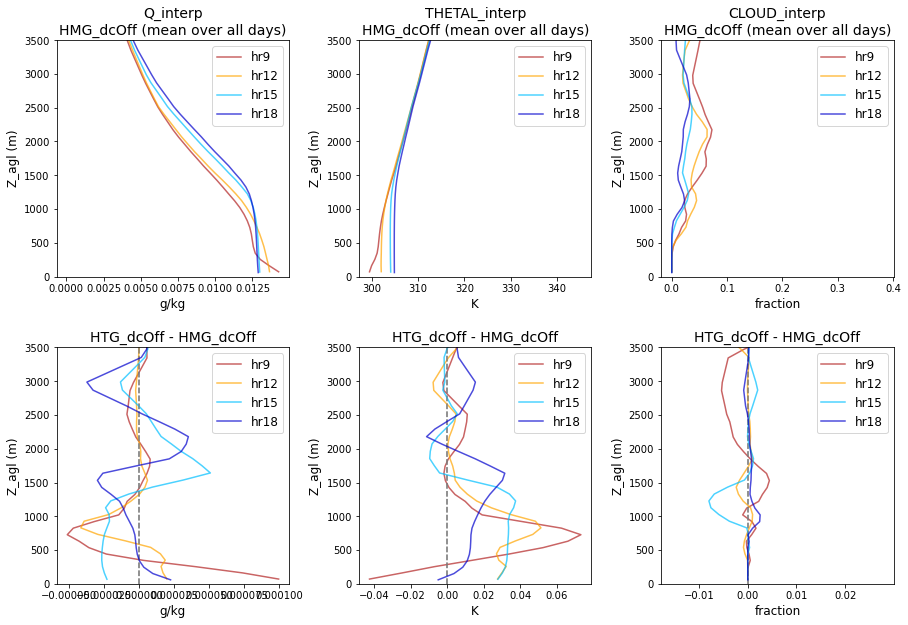

In [61]:
## Plot HMG and delta 

varPlots = ['Q_interp', 'THETAL_interp', 'CLOUD_interp']
levNames = ['Z3_interp', 'Z3_interp', 'Z3_interp']
varMultiplier = [1.0, 1.0, 1.0]
unitsStr = ['g/kg', 'K', 'fraction']

case1 = 'HMG_dcOff'
case2 = 'HTG_dcOff'

# case1 = 'HMG'
# case2 = 'HTG*LESmult'

ymin    = 0
ymax    = 3500

hourSel    = [  9,          12,            15,             18]
colorsList = ['firebrick','orange','deepskyblue','mediumblue']

fig,axs = plt.subplots(2,3, figsize=(15,10))
axs     = axs.ravel()
fig.subplots_adjust(wspace = 0.3, hspace = 0.3)

for iHr in range(len(hourSel)):
    ## Select hour
    iTimeSel      = np.where( (scamDS["time.hour"].values==hourSel[iHr]) )[0]
    hourlyMean_DS = scamDS.isel(time=iTimeSel).mean(dim='time')
    
    ## Select each case
    HMGvar   = hourlyMean_DS.sel(case=case1)
    HTGvar   = hourlyMean_DS.sel(case=case2)
    
    for iPlot in range(len(varPlots)):
        
        axs[iPlot].plot( np.squeeze(HMGvar[varPlots[iPlot]].values)*varMultiplier[iPlot], 
                         np.squeeze(HMGvar[levNames[iPlot]].values),
                         alpha=0.7, color=colorsList[iHr], label='hr'+str(hourSel[iHr]) )

        ## Plot HTG-HMG difference
        axs[iPlot+3].axvline(0, color='grey', linestyle='--', alpha=0.5)
        axs[iPlot+3].plot( np.squeeze(HTGvar[varPlots[iPlot]].values-HMGvar[varPlots[iPlot]].values)*varMultiplier[iPlot], 
                           np.squeeze(HTGvar[levNames[iPlot]].values), 
                           alpha=0.7, color=colorsList[iHr], label='hr'+str(hourSel[iHr]))
        
        
        axs[iPlot].legend(fontsize=12)
        axs[iPlot+3].legend(fontsize=12)
        
        axs[iPlot].set_ylim([ymin, ymax])
        axs[iPlot+3].set_ylim([ymin, ymax])


        axs[iPlot].set_title(varPlots[iPlot]+'\n'+case1+' (mean over all days)', fontsize=14)
        axs[iPlot+3].set_title(case2+' - '+case1, fontsize=14)

        axs[iPlot].set_ylabel('Z_agl (m)', fontsize=12)
        axs[iPlot+3].set_ylabel('Z_agl (m)', fontsize=12)
        axs[iPlot].set_xlabel(unitsStr[iPlot], fontsize=12)
        axs[iPlot+3].set_xlabel(unitsStr[iPlot], fontsize=12)
            
    # axs.axhline(HMGvar.PBLH.values, linestyle='-.', alpha=0.5, color=colorsList[iHr])
    # axs.axhline(HTGvar.PBLH.values, linestyle=':', alpha=0.5, color=colorsList[iHr])



### Diurnal cycles

In [64]:
## Get hourly mean SCAM 
hourlyMeanSCAM  = scamDS.groupby('time.hour').mean(dim='time')
hourlyStdSCAM   = scamDS.groupby('time.hour').std(dim='time')
hourlyCountSCAM = scamDS.groupby('time.hour').count(dim='time')
hourlySE = hourlyStdSCAM/np.sqrt(hourlyCountSCAM)

hourlyMeanCLM_h0 = clmDS_h0.groupby('time.hour').mean(dim='time')
hourlyMeanCLM_h1 = clmDS_h1.groupby('time.hour').mean(dim='time')


Text(0.5, 1.0, 'CLDHGH')

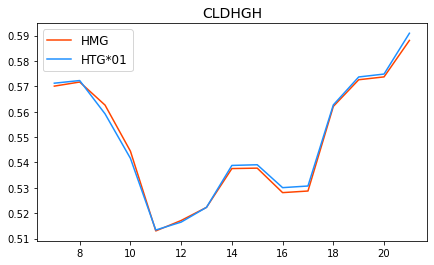

In [72]:
pltVar = 'CLDHGH'

ctrlCase  = 'HMG'
testCase  = 'HTG*01'

fig,axs = plt.subplots(1,1, figsize=(7,4))

axs.plot(hourlyMeanSCAM.hour.values, np.squeeze(hourlyMeanSCAM[pltVar].sel(case=ctrlCase).values), 
         color='orangered', label=ctrlCase)
axs.plot(hourlyMeanSCAM.hour.values, np.squeeze(hourlyMeanSCAM[pltVar].sel(case=testCase).values), 
         color='dodgerblue', label=testCase)
axs.legend(fontsize=12)

axs.set_title(pltVar, fontsize=14)


Text(0.5, 1.0, 'LWCF')

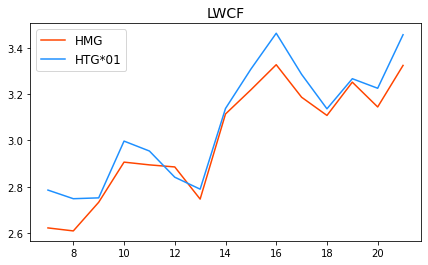

In [68]:
pltVar = 'LWCF'

ctrlCase  = 'HMG'
testCase  = 'HTG*01'

fig,axs = plt.subplots(1,1, figsize=(7,4))

axs.plot(hourlyMeanSCAM.hour.values, np.squeeze(hourlyMeanSCAM[pltVar].sel(case=ctrlCase).values), 
         color='orangered', label=ctrlCase)
axs.plot(hourlyMeanSCAM.hour.values, np.squeeze(hourlyMeanSCAM[pltVar].sel(case=testCase).values), 
         color='dodgerblue', label=testCase)
axs.legend(fontsize=12)

axs.set_title(pltVar, fontsize=14)


Text(0.5, 1.0, 'SWCF')

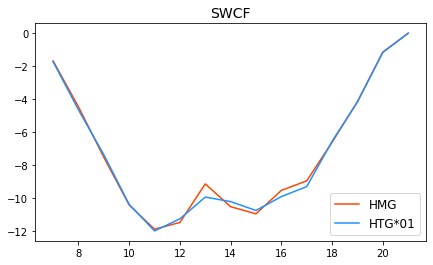

In [69]:
pltVar = 'SWCF'

ctrlCase  = 'HMG'
testCase  = 'HTG*01'

fig,axs = plt.subplots(1,1, figsize=(7,4))

axs.plot(hourlyMeanSCAM.hour.values, np.squeeze(hourlyMeanSCAM[pltVar].sel(case=ctrlCase).values), 
         color='orangered', label=ctrlCase)
axs.plot(hourlyMeanSCAM.hour.values, np.squeeze(hourlyMeanSCAM[pltVar].sel(case=testCase).values), 
         color='dodgerblue', label=testCase)
axs.legend(fontsize=12)

axs.set_title(pltVar, fontsize=14)


Text(0.5, 1.0, 'QREFHT')

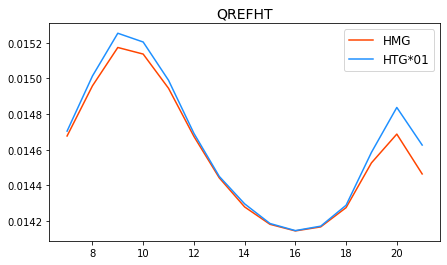

In [42]:
pltVar = 'QREFHT'

ctrlCase  = 'HMG'
testCase  = 'HTG*01'

fig,axs = plt.subplots(1,1, figsize=(7,4))

axs.plot(hourlyMeanSCAM.hour.values, np.squeeze(hourlyMeanSCAM[pltVar].sel(case=ctrlCase).values), 
         color='orangered', label=ctrlCase)
axs.plot(hourlyMeanSCAM.hour.values, np.squeeze(hourlyMeanSCAM[pltVar].sel(case=testCase).values), 
         color='dodgerblue', label=testCase)
axs.legend(fontsize=12)

axs.set_title(pltVar, fontsize=14)


Text(0.5, 1.0, 'THLP2_CLUBB (ilev=-1)')

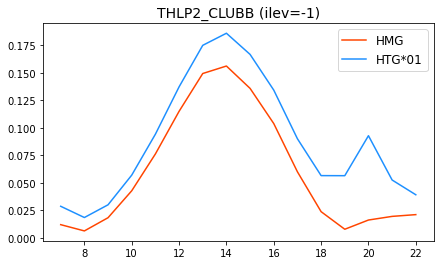

In [131]:
pltVar = 'THLP2_CLUBB'

ctrlCase  = 'HMG'
testCase  = 'HTG*01'

fig,axs = plt.subplots(1,1, figsize=(7,4))

axs.plot(hourlyMeanSCAM.hour.values, np.squeeze(hourlyMeanSCAM[pltVar].sel(case=ctrlCase).isel(ilev=-1).values), 
         color='orangered', label=ctrlCase)
axs.plot(hourlyMeanSCAM.hour.values, np.squeeze(hourlyMeanSCAM[pltVar].sel(case=testCase).isel(ilev=-1).values), 
         color='dodgerblue', label=testCase)
axs.legend(fontsize=12)

axs.set_title(pltVar +' (ilev=-1)', fontsize=14)


Text(0.5, 1.0, 'SOILWATER_10CM (CLM)')

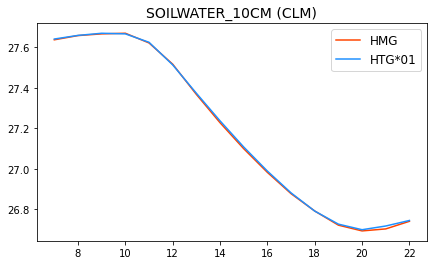

In [75]:
pltVar = 'SOILWATER_10CM'

ctrlCase  = 'HMG'
testCase  = 'HTG*01'

fig,axs = plt.subplots(1,1, figsize=(7,4))

axs.plot(hourlyMeanCLM_h0.hour.values, np.squeeze(hourlyMeanCLM_h0[pltVar].sel(case=ctrlCase).values), 
         color='orangered', label=ctrlCase)
axs.plot(hourlyMeanCLM_h0.hour.values, np.squeeze(hourlyMeanCLM_h0[pltVar].sel(case=testCase).values), 
         color='dodgerblue', label=testCase)
axs.legend(fontsize=12)

axs.set_title(pltVar+' (CLM)', fontsize=14)


#### patch level stuff

In [188]:
## Compute TG variance? 

# Weight of each PFT over the gridcell (doesn't change in time here)
PFTwgt = hourlyMeanCLM_h1.pfts1d_wtgcell.values[0,0,:]
# PFT types 
PFTtype = hourlyMeanCLM_h1.pfts1d_itype_veg.values[0,0,:]
# Column types 
colType = hourlyMeanCLM_h1.pfts1d_itype_col.values[0,0,:]

## Now get variance over the gridcell, but needs to be weighted... so use same scheme as in CLM module 

# Need gridcell mean 
wgtGridMean_Q2M_HMG = (np.sum(hourlyMeanCLM_h1['Q2M'].sel(case='HMG').values*PFTwgt,axis=1)/np.sum(PFTwgt))
wgtGridMean_TSA_HMG = (np.sum(hourlyMeanCLM_h1['TSA'].sel(case='HMG').values*PFTwgt,axis=1)/np.sum(PFTwgt))

# Now get each patch's difference from that gridcell mean 
varUnweighted_Q2M_HMG = np.full([len(hourlyMeanCLM_h1.hour.values), len(PFTwgt)], np.nan)
varUnweighted_TSA_HMG = np.full([len(hourlyMeanCLM_h1.hour.values), len(PFTwgt)], np.nan)

for iPatch in range(len(PFTwgt)):
    varUnweighted_Q2M_HMG[:,iPatch] = (hourlyMeanCLM_h1['Q2M'].sel(case='HMG').values[:,iPatch] - wgtGridMean_Q2M_HMG)**2
    varUnweighted_TSA_HMG[:,iPatch] = (hourlyMeanCLM_h1['TSA'].sel(case='HMG').values[:,iPatch] - wgtGridMean_TSA_HMG)**2
    
# Now get the weighted mean of that across the gridcell
wgtVarianceQ2M_HMG = (np.sum(varUnweighted_Q2M_HMG*PFTwgt,axis=1)/np.sum(PFTwgt))
wgtVarianceTSA_HMG = (np.sum(varUnweighted_TSA_HMG*PFTwgt,axis=1)/np.sum(PFTwgt))




In [56]:
print('i    PFTtype    colType    Area %')
for i in range(len(PFTtype)):
    print('%2i %6i %10i %11.2f' % (i, PFTtype[i], colType[i], PFTwgt[i]*100))



i    PFTtype    colType    Area %
 0      0          1        0.32
 1      1          1        0.15
 2      7          1        0.66
 3     13          1       25.56
 4     14          1       22.17
 5     15        215       48.74
 6     16        216        2.26
 7      0         71        0.00
 8      0         72        0.00
 9      0         73        0.00
10      0         74        0.00
11      0         75        0.00
12      0         71        0.08
13      0         72        0.03
14      0         73        0.03
15      0         74        0.01
16      0         75        0.01


**Manuscript figures**

In [ ]:
fig,axs = plt.subplots(1,1,figsize=(8,5))

colors = plt.cm.jet(np.linspace(0,1,8))

PFTlabels = ['BareGround','Ndlelf_evrgrn_tmprt','Brdlf_dcd_tmprt', 'C3_grass','C4_grass','C3_crop',
             'C3_irrigCrop','Urban','Urban','Urban','Urban','Urban','Urban','Urban','Urban','Urban','Urban']

for iPFT in range(7):
    plt.plot(hourlyMeanCLM_h1.hour.values, (hourlyMeanCLM_h1['TSA'].sel(case='HMG').values[:,iPFT] - wgtGridMean_TSA_HMG)*(PFTwgt[iPFT]/sum(PFTwgt)),
             color=colors[iPFT], alpha=0.7,
             label = PFTlabels[iPFT] )
plt.plot(hourlyMeanCLM_h1.hour.values, (np.nanmean(hourlyMeanCLM_h1['TSA'].sel(case='HMG').values[:,7::], axis=1 ) - wgtGridMean_TSA_HMG)*(np.sum(PFTwgt[7::])/sum(PFTwgt)),
             color=colors[-1],alpha=0.7,
            label = 'Urban')

plt.legend(ncol=3)
# plt.xlim([12,20])
# plt.ylim([0.85,0.96])
plt.title('2m Temperature (weighted patch-gridMean)')
plt.axhline(0,color='black')


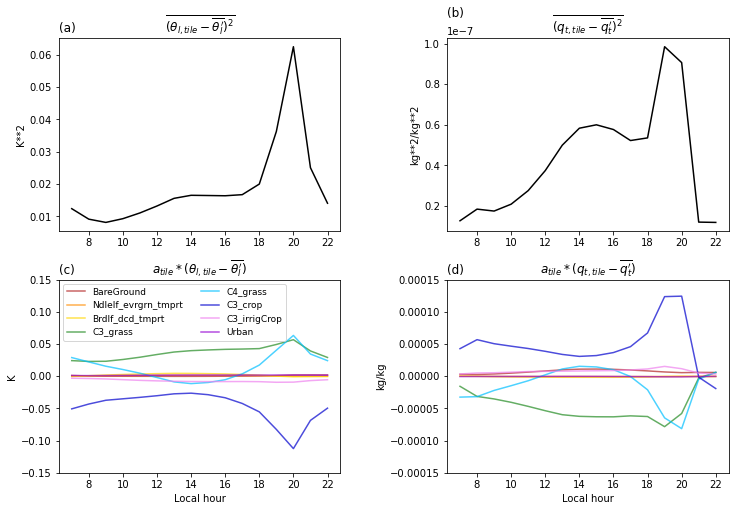

In [245]:
fig,axs = plt.subplots(2,2, figsize=(12,8) )
axs     = axs.ravel()
fig.subplots_adjust(wspace=0.38, hspace=0.25)

axs[0].plot(hourlyMeanCLM_h1.hour.values, wgtVarianceTSA_HMG, 'k')
axs[1].plot(hourlyMeanCLM_h1.hour.values, wgtVarianceQ2M_HMG, 'k')

axs[0].set_title('(a)', loc='left')
axs[0].set_title(r"$\overline{(\theta_{l,tile} - \overline{\theta_l'})^2}$")
axs[0].set_ylabel('K**2')

axs[1].set_title('(b)\n', loc='left')
axs[1].set_title(r"$\overline{(q_{t,tile} - \overline{q_t'})^2}$")
axs[1].set_ylabel('kg**2/kg**2')

## Now plot the tile-level data 
# colors = plt.cm.jet(np.linspace(0,1,8))
colors = ['firebrick','darkorange','gold','forestgreen','deepskyblue','mediumblue','violet','darkviolet']
PFTlabels = ['BareGround','Ndlelf_evrgrn_tmprt','Brdlf_dcd_tmprt', 'C3_grass','C4_grass','C3_crop',
             'C3_irrigCrop','Urban','Urban','Urban','Urban','Urban','Urban','Urban','Urban','Urban','Urban']

for iPFT in range(7):
    axs[2].plot(hourlyMeanCLM_h1.hour.values, (hourlyMeanCLM_h1['TSA'].sel(case='HMG').values[:,iPFT] - wgtGridMean_TSA_HMG)*(PFTwgt[iPFT]/sum(PFTwgt)),
             color=colors[iPFT], alpha=0.7,
             label = PFTlabels[iPFT] )
    
    axs[3].plot(hourlyMeanCLM_h1.hour.values, (hourlyMeanCLM_h1['Q2M'].sel(case='HMG').values[:,iPFT] - wgtGridMean_Q2M_HMG)*(PFTwgt[iPFT]/sum(PFTwgt)),
             color=colors[iPFT], alpha=0.7,
             label = PFTlabels[iPFT] )
        
axs[3].plot(hourlyMeanCLM_h1.hour.values, (np.nanmean(hourlyMeanCLM_h1['Q2M'].sel(case='HMG').values[:,7::], axis=1 ) - wgtGridMean_Q2M_HMG)*(np.sum(PFTwgt[7::])/sum(PFTwgt)),
             color=colors[-1],alpha=0.7,
            label = 'Urban')
axs[2].plot(hourlyMeanCLM_h1.hour.values, (np.nanmean(hourlyMeanCLM_h1['TSA'].sel(case='HMG').values[:,7::], axis=1 ) - wgtGridMean_TSA_HMG)*(np.sum(PFTwgt[7::])/sum(PFTwgt)),
             color=colors[-1],alpha=0.7,
            label = 'Urban')

axs[2].set_ylim([-0.15, 0.15])
axs[2].legend(ncol=2, fontsize=9)

axs[3].set_ylim([-0.00015, 0.00015])

axs[2].set_title('(c)', loc='left')
axs[2].set_title(r"$a_{tile} * (\theta_{l,tile} - \overline{\theta_l'})$")
axs[2].set_ylabel('K')

axs[3].set_title('(d)', loc='left')
axs[3].set_title(r"$a_{tile} * (q_{t,tile} - \overline{q_t'})$")
axs[3].set_ylabel('kg/kg')

axs[2].set_xlabel('Local hour')
axs[3].set_xlabel('Local hour')

axs[0].set_xticks([8,10,12,14,16,18,20,22])
axs[1].set_xticks([8,10,12,14,16,18,20,22])
axs[2].set_xticks([8,10,12,14,16,18,20,22])
axs[3].set_xticks([8,10,12,14,16,18,20,22])

fig.savefig('/glade/u/home/mdfowler/Analysis/SCAMvLES_figs/Fig2_paper.png')



**Building up figures initially**

Text(0.5, 1.0, 'Grid-mean 2m T')

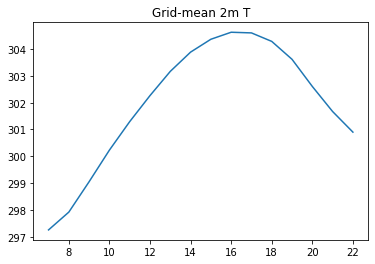

In [69]:
plt.plot(hourlyMeanCLM_h1.hour.values, wgtGridMean_TSA_HMG)
plt.title('Grid-mean 2m T')

Text(0.5, 1.0, 'Variance in patch-level 2m Q')

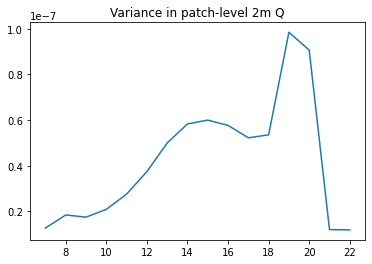

In [70]:
plt.plot(hourlyMeanCLM_h1.hour.values, wgtVarianceQ2M_HMG)
plt.title('Variance in patch-level 2m Q')

Text(0.5, 1.0, '2m Temperature variance (patch-weighted)')

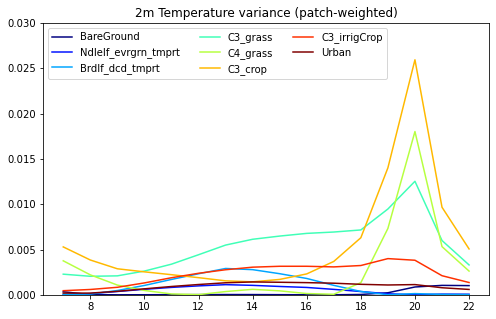

In [71]:
fig,axs = plt.subplots(1,1,figsize=(8,5))

colors = plt.cm.jet(np.linspace(0,1,8))

PFTlabels = ['BareGround','Ndlelf_evrgrn_tmprt','Brdlf_dcd_tmprt', 'C3_grass','C4_grass','C3_crop',
             'C3_irrigCrop','Urban','Urban','Urban','Urban','Urban','Urban','Urban','Urban','Urban','Urban']

for iPFT in range(len(PFTwgt[0:7])):
    plt.plot(hourlyMeanCLM_h1.hour.values, varUnweighted_TSA_HMG[:,iPFT]*(PFTwgt[iPFT]/sum(PFTwgt)) ,
             color=colors[iPFT],
            label = PFTlabels[iPFT] )
plt.plot(hourlyMeanCLM_h1.hour.values, np.sum(varUnweighted_TSA_HMG[:,7::]*(PFTwgt[7::]/sum(PFTwgt)), axis=1 ) ,
             color=colors[-1],
            label = 'Urban')

plt.legend(ncol=3)
    
plt.ylim([0.0,0.03])
plt.title('2m Temperature variance (patch-weighted)')

Text(0.5, 1.0, '2m Humidity variance (patch-weighted)')

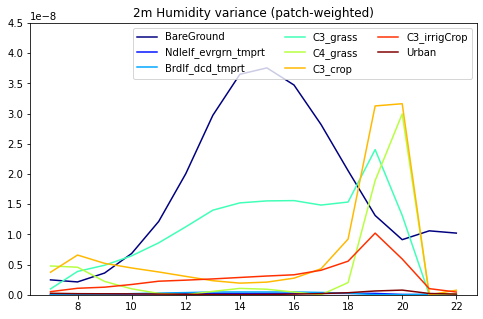

In [72]:
fig,axs = plt.subplots(1,1,figsize=(8,5))

colors = plt.cm.jet(np.linspace(0,1,8))

PFTlabels = ['BareGround','Ndlelf_evrgrn_tmprt','Brdlf_dcd_tmprt', 'C3_grass','C4_grass','C3_crop',
             'C3_irrigCrop','Urban','Urban','Urban','Urban','Urban','Urban','Urban','Urban','Urban','Urban']

for iPFT in range(len(PFTwgt[0:7])):
    plt.plot(hourlyMeanCLM_h1.hour.values, varUnweighted_Q2M_HMG[:,iPFT]*(PFTwgt[iPFT]/sum(PFTwgt)) ,
             color=colors[iPFT],
            label = PFTlabels[iPFT] )
plt.plot(hourlyMeanCLM_h1.hour.values, np.sum(varUnweighted_Q2M_HMG[:,7::]*(PFTwgt[7::]/sum(PFTwgt)), axis=1 ) ,
             color=colors[-1],
            label = 'Urban')

plt.legend(ncol=3)
    
plt.ylim([0.0,4.5e-8])
plt.title('2m Humidity variance (patch-weighted)')

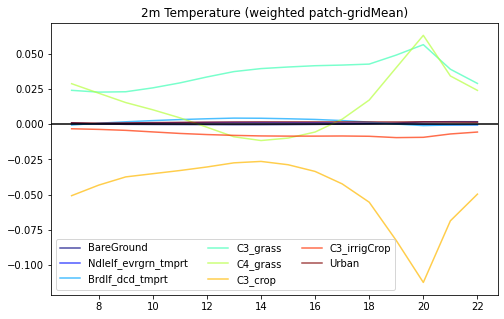

In [37]:
fig,axs = plt.subplots(1,1,figsize=(8,5))

colors = plt.cm.jet(np.linspace(0,1,8))

PFTlabels = ['BareGround','Ndlelf_evrgrn_tmprt','Brdlf_dcd_tmprt', 'C3_grass','C4_grass','C3_crop',
             'C3_irrigCrop','Urban','Urban','Urban','Urban','Urban','Urban','Urban','Urban','Urban','Urban']

for iPFT in range(7):
    plt.plot(hourlyMeanCLM_h1.hour.values, (hourlyMeanCLM_h1['TSA'].sel(case='HMG').values[:,iPFT] - wgtGridMean_TSA_HMG)*(PFTwgt[iPFT]/sum(PFTwgt)),
             color=colors[iPFT], alpha=0.7,
             label = PFTlabels[iPFT] )
plt.plot(hourlyMeanCLM_h1.hour.values, (np.nanmean(hourlyMeanCLM_h1['TSA'].sel(case='HMG').values[:,7::], axis=1 ) - wgtGridMean_TSA_HMG)*(np.sum(PFTwgt[7::])/sum(PFTwgt)),
             color=colors[-1],alpha=0.7,
            label = 'Urban')

plt.legend(ncol=3)
# plt.xlim([12,20])
# plt.ylim([0.85,0.96])
plt.title('2m Temperature (weighted patch-gridMean)')
plt.axhline(0,color='black')


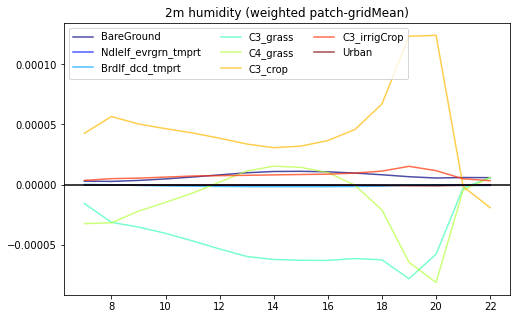

In [39]:
fig,axs = plt.subplots(1,1,figsize=(8,5))

colors = plt.cm.jet(np.linspace(0,1,8))

PFTlabels = ['BareGround','Ndlelf_evrgrn_tmprt','Brdlf_dcd_tmprt', 'C3_grass','C4_grass','C3_crop',
             'C3_irrigCrop','Urban','Urban','Urban','Urban','Urban','Urban','Urban','Urban','Urban','Urban']

for iPFT in range(7):
    plt.plot(hourlyMeanCLM_h1.hour.values, (hourlyMeanCLM_h1['Q2M'].sel(case='HMG').values[:,iPFT] - wgtGridMean_Q2M_HMG)*(PFTwgt[iPFT]/sum(PFTwgt)),
             color=colors[iPFT], alpha=0.7,
             label = PFTlabels[iPFT] )
plt.plot(hourlyMeanCLM_h1.hour.values, (np.nanmean(hourlyMeanCLM_h1['Q2M'].sel(case='HMG').values[:,7::], axis=1 ) - wgtGridMean_Q2M_HMG)*(np.sum(PFTwgt[7::])/sum(PFTwgt)),
             color=colors[-1],alpha=0.7,
            label = 'Urban')

plt.legend(ncol=3)
# plt.xlim([12,20])
# plt.ylim([0.85,0.96])
plt.title('2m humidity (weighted patch-gridMean)')
plt.axhline(0,color='black')


In [65]:
0.00003*3

9e-05

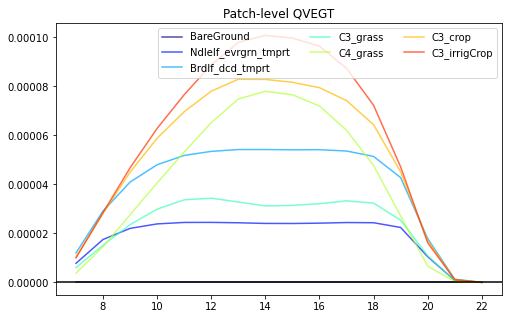

In [61]:
fig,axs = plt.subplots(1,1,figsize=(8,5))

colors = plt.cm.jet(np.linspace(0,1,8))

PFTlabels = ['BareGround','Ndlelf_evrgrn_tmprt','Brdlf_dcd_tmprt', 'C3_grass','C4_grass','C3_crop',
             'C3_irrigCrop','Urban','Urban','Urban','Urban','Urban','Urban','Urban','Urban','Urban','Urban']

for iPFT in range(7):
    plt.plot(hourlyMeanCLM_h1.hour.values, (hourlyMeanCLM_h1['QVEGT'].sel(case='HMG').values[:,iPFT]),
             color=colors[iPFT], alpha=0.7,
             label = PFTlabels[iPFT] )
# plt.plot(hourlyMeanCLM_h1.hour.values, (np.nanmean(hourlyMeanCLM_h1['QVEGT'].sel(case='HMG').values[:,7::], axis=1 ) - wgtGridMean_Q2M_HMG)*(np.sum(PFTwgt[7::])/sum(PFTwgt)),
#              color=colors[-1],alpha=0.7,
#             label = 'Urban')

plt.legend(ncol=3)
# plt.xlim([12,20])
# plt.ylim([0.85,0.96])
plt.title('Patch-level QVEGT')
plt.axhline(0,color='black')


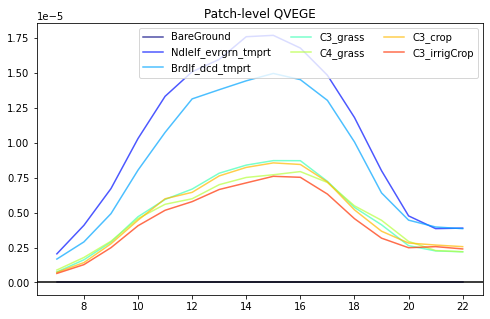

In [62]:
fig,axs = plt.subplots(1,1,figsize=(8,5))

colors = plt.cm.jet(np.linspace(0,1,8))

PFTlabels = ['BareGround','Ndlelf_evrgrn_tmprt','Brdlf_dcd_tmprt', 'C3_grass','C4_grass','C3_crop',
             'C3_irrigCrop','Urban','Urban','Urban','Urban','Urban','Urban','Urban','Urban','Urban','Urban']

for iPFT in range(7):
    plt.plot(hourlyMeanCLM_h1.hour.values, (hourlyMeanCLM_h1['QVEGE'].sel(case='HMG').values[:,iPFT]),
             color=colors[iPFT], alpha=0.7,
             label = PFTlabels[iPFT] )
# plt.plot(hourlyMeanCLM_h1.hour.values, (np.nanmean(hourlyMeanCLM_h1['QVEGT'].sel(case='HMG').values[:,7::], axis=1 ) - wgtGridMean_Q2M_HMG)*(np.sum(PFTwgt[7::])/sum(PFTwgt)),
#              color=colors[-1],alpha=0.7,
#             label = 'Urban')

plt.legend(ncol=3)
# plt.xlim([12,20])
# plt.ylim([0.85,0.96])
plt.title('Patch-level QVEGE')
plt.axhline(0,color='black')


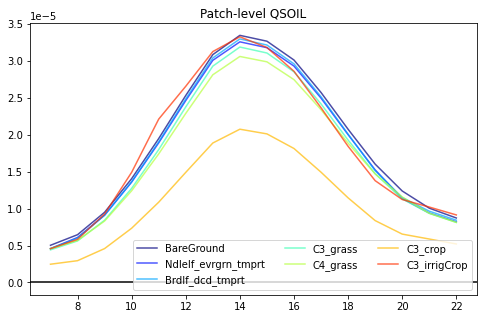

In [63]:
fig,axs = plt.subplots(1,1,figsize=(8,5))

colors = plt.cm.jet(np.linspace(0,1,8))

PFTlabels = ['BareGround','Ndlelf_evrgrn_tmprt','Brdlf_dcd_tmprt', 'C3_grass','C4_grass','C3_crop',
             'C3_irrigCrop','Urban','Urban','Urban','Urban','Urban','Urban','Urban','Urban','Urban','Urban']

for iPFT in range(7):
    plt.plot(hourlyMeanCLM_h1.hour.values, (hourlyMeanCLM_h1['QSOIL'].sel(case='HMG').values[:,iPFT]),
             color=colors[iPFT], alpha=0.7,
             label = PFTlabels[iPFT] )
# plt.plot(hourlyMeanCLM_h1.hour.values, (np.nanmean(hourlyMeanCLM_h1['QVEGT'].sel(case='HMG').values[:,7::], axis=1 ) - wgtGridMean_Q2M_HMG)*(np.sum(PFTwgt[7::])/sum(PFTwgt)),
#              color=colors[-1],alpha=0.7,
#             label = 'Urban')

plt.legend(ncol=3)
# plt.xlim([12,20])
# plt.ylim([0.85,0.96])
plt.title('Patch-level QSOIL')
plt.axhline(0,color='black')


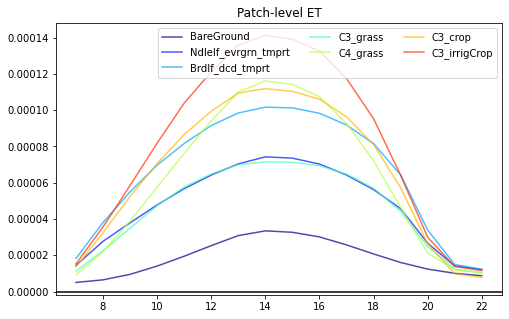

In [66]:
fig,axs = plt.subplots(1,1,figsize=(8,5))

colors = plt.cm.jet(np.linspace(0,1,8))

PFTlabels = ['BareGround','Ndlelf_evrgrn_tmprt','Brdlf_dcd_tmprt', 'C3_grass','C4_grass','C3_crop',
             'C3_irrigCrop','Urban','Urban','Urban','Urban','Urban','Urban','Urban','Urban','Urban','Urban']

for iPFT in range(7):
    plt.plot(hourlyMeanCLM_h1.hour.values, (hourlyMeanCLM_h1['QVEGT'].sel(case='HMG').values[:,iPFT])+ (hourlyMeanCLM_h1['QVEGE'].sel(case='HMG').values[:,iPFT])+ (hourlyMeanCLM_h1['QSOIL'].sel(case='HMG').values[:,iPFT]),
             color=colors[iPFT], alpha=0.7,
             label = PFTlabels[iPFT] )
# plt.plot(hourlyMeanCLM_h1.hour.values, (np.nanmean(hourlyMeanCLM_h1['QVEGT'].sel(case='HMG').values[:,7::], axis=1 ) - wgtGridMean_Q2M_HMG)*(np.sum(PFTwgt[7::])/sum(PFTwgt)),
#              color=colors[-1],alpha=0.7,
#             label = 'Urban')

plt.legend(ncol=3)
# plt.xlim([12,20])
# plt.ylim([0.85,0.96])
plt.title('Patch-level ET')
plt.axhline(0,color='black')


### PDFs

In [55]:
## Convert rain to be mm/hr 
LESmeanRain     = LES_newDefault['AVS_RAIN'].mean(("south_north", "west_east"))
LES_newDefault['meanRain'] = (('case','Time'), LESmeanRain*3600)  ## Convert units to mm/hr, not mm/s

scamRain  = scamDS.PRECT.resample(time='1H').mean().dropna(dim='time')*(3600*1e3)
scamPRECZ = scamDS.PRECZ.resample(time='1H').mean().dropna(dim='time')*(3600*1e3)
scamPRECC = scamDS.PRECC.resample(time='1H').mean().dropna(dim='time')*(3600*1e3)



AttributeError: 'Dataset' object has no attribute 'PRECZ'

In [44]:
len(scamRain.time.values)

900

In [120]:

# ## Get rain rates only when it's actually raining...
# rainRatesHMG_les = LES_newDefault.meanRain.sel(case='HMG').values
# rainRatesHTG_les = LES_newDefault.meanRain.sel(case='HTG').values

# # SCAM
# rainRatesHMG_scam = scamRain.sel(case='HMG').values
# rainRatesHTG_scam = scamRain.sel(case='HTG*01').values


# dfReal = pd.concat(axis=0, ignore_index=True, objs=[
#          pd.DataFrame.from_dict({'Rain rate': np.squeeze(rainRatesHMG_les), 'case': 'LES_HMG'}),
#          pd.DataFrame.from_dict({'Rain rate': np.squeeze(rainRatesHTG_les), 'case': 'LES_HTG'}),
#          pd.DataFrame.from_dict({'Rain rate': np.squeeze(rainRatesHMG_scam), 'case': 'SCAM_HMG'}),
#          pd.DataFrame.from_dict({'Rain rate': np.squeeze(rainRatesHTG_scam), 'case': 'SCAM_HTG'}),
# ])

# # Make plot 
# g = sns.displot(dfReal, x='Rain rate', hue='case', kind='kde', height=8, cut=0, 
# # g = sns.displot(dfReal, x='Rain rate', hue='case', kind='ecdf', height=8, 
#                 palette=['navy','orangered', 'mediumblue','red'])


# # g.ax.set_xlim([0,0.5])
# g.ax.set_title("Distribution of hourly mean rain rates", fontsize=16 ) 
# g.ax.set_xlabel('mm/hr',fontsize=16)
# g.ax.set_ylabel('Density',fontsize=16)
# g.ax.tick_params(axis='both', labelsize= 14)
# plt.setp(g._legend.get_title(), fontsize=14)
# plt.setp(g._legend.get_texts(), fontsize=14)


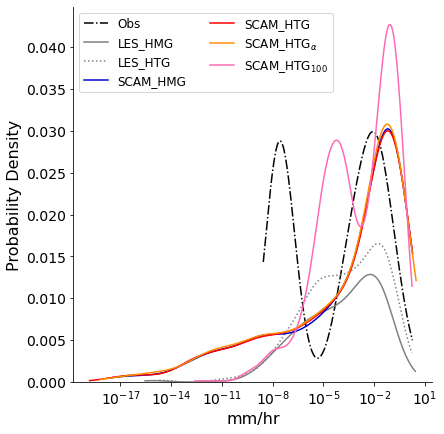

In [67]:

## Get rain rates only when it's actually raining...
rainRatesHMG_les = LES_newDefault.meanRain.sel(case='HMG').values
rainRatesHMG_les = rainRatesHMG_les[np.where(rainRatesHMG_les>0)[0]]

rainRatesHTG_les = LES_newDefault.meanRain.sel(case='HTG').values
rainRatesHTG_les = rainRatesHTG_les[np.where(rainRatesHTG_les>0)[0]]

# SCAM
rainRatesHMG_scam = scamRain.sel(case='HMG').values
rainRatesHMG_scam = rainRatesHMG_scam[np.where(rainRatesHMG_scam>0)[0]]

rainRatesHTG_scam = scamRain.sel(case='HTG*01').values
rainRatesHTG_scam = rainRatesHTG_scam[np.where(rainRatesHTG_scam>0)[0]]

rainRatesHTGalpha_scam = scamRain.sel(case='HTG*LESmult').values
rainRatesHTGalpha_scam = rainRatesHTGalpha_scam[np.where(rainRatesHTGalpha_scam>0)[0]]

rainRatesHTGx10_scam = scamRain.sel(case='HTG*10').values
rainRatesHTGx10_scam = rainRatesHTGx10_scam[np.where(rainRatesHTGx10_scam>0)[0]]

rainRatesHTGx100_scam = scamRain.sel(case='HTG*100').values
rainRatesHTGx100_scam = rainRatesHTGx100_scam[np.where(rainRatesHTGx100_scam>0)[0]]

rainRateObs = forcDS.prec_srf.values
rainRateObs = rainRateObs[np.where(rainRateObs>0)[0]]



dfReal = pd.concat(axis=0, ignore_index=True, objs=[
         pd.DataFrame.from_dict({'Rain rate': np.squeeze(rainRatesHTGx100_scam), 'case': 'SCAM_HTGx100'}),
         # pd.DataFrame.from_dict({'Rain rate': np.squeeze(rainRatesHTGx10_scam), 'case': 'SCAM_HTGx10'}),
         pd.DataFrame.from_dict({'Rain rate': np.squeeze(rainRatesHTGalpha_scam), 'case': 'SCAM_HTGalpha'}),
         pd.DataFrame.from_dict({'Rain rate': np.squeeze(rainRatesHTG_scam), 'case': 'SCAM_HTG'}),
         pd.DataFrame.from_dict({'Rain rate': np.squeeze(rainRatesHMG_scam), 'case': 'SCAM_HMG'}),
         pd.DataFrame.from_dict({'Rain rate': np.squeeze(rainRatesHTG_les), 'case': 'LES_HTG'}),
         pd.DataFrame.from_dict({'Rain rate': np.squeeze(rainRatesHMG_les), 'case': 'LES_HMG'}),
         pd.DataFrame.from_dict({'Rain rate': np.squeeze(rainRateObs), 'case': 'Obs'})
         ])

# Make plot 
g = sns.displot(dfReal, x='Rain rate', hue='case', kind='kde', height=6, cut=0, 
                log_scale=True,
# g = sns.displot(dfReal, x='Rain rate', hue='case', kind='ecdf', height=8, 
                palette=['hotpink','darkorange','red','mediumblue','grey','grey','black'], legend=False)

# g.ax.set_xlim([0,0.5])
# g.ax.set_title("Hourly rain rates (>0.0 mm/hr)", fontsize=16 ) 
g.ax.set_xlabel('mm/hr',fontsize=16)
g.ax.set_ylabel('Probability Density',fontsize=16)
g.ax.tick_params(axis='both', labelsize= 14)
# plt.setp(g._legend.get_title(), fontsize=14)
# plt.setp(g._legend.get_texts(), fontsize=14)
plt.setp(g.ax.lines[0], linestyle='-.')   # Index goes in reverse order 
plt.setp(g.ax.lines[2], linestyle=':')   # Index goes in reverse order 
# plt.setp(g.ax.lines[5], linestyle='--')   # Index goes in reverse order 
plt.legend(loc='upper left', labels=['Obs','LES_HMG','LES_HTG','SCAM_HMG','SCAM_HTG',r"SCAM_HTG$_\alpha$",r"SCAM_HTG$_{100}$"], ncol=2, fontsize=12)



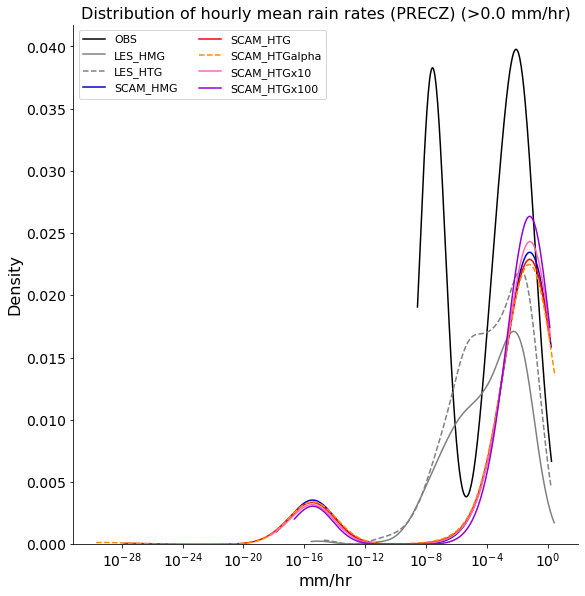

In [54]:

## Get rain rates only when it's actually raining...
rainRatesHMG_les = LES_newDefault.meanRain.sel(case='HMG').values
rainRatesHMG_les = rainRatesHMG_les[np.where(rainRatesHMG_les>0)[0]]

rainRatesHTG_les = LES_newDefault.meanRain.sel(case='HTG').values
rainRatesHTG_les = rainRatesHTG_les[np.where(rainRatesHTG_les>0)[0]]

# SCAM
rainRatesHMG_scam = scamPRECZ.sel(case='HMG').values
rainRatesHMG_scam = rainRatesHMG_scam[np.where(rainRatesHMG_scam>0)[0]]

rainRatesHTG_scam = scamPRECZ.sel(case='HTG*01').values
rainRatesHTG_scam = rainRatesHTG_scam[np.where(rainRatesHTG_scam>0)[0]]

rainRatesHTGalpha_scam = scamPRECZ.sel(case='HTG*LESmult').values
rainRatesHTGalpha_scam = rainRatesHTGalpha_scam[np.where(rainRatesHTGalpha_scam>0)[0]]

rainRatesHTGx10_scam = scamPRECZ.sel(case='HTG*10').values
rainRatesHTGx10_scam = rainRatesHTGx10_scam[np.where(rainRatesHTGx10_scam>0)[0]]

rainRatesHTGx100_scam = scamPRECZ.sel(case='HTG*100').values
rainRatesHTGx100_scam = rainRatesHTGx100_scam[np.where(rainRatesHTGx100_scam>0)[0]]


dfReal = pd.concat(axis=0, ignore_index=True, objs=[
         pd.DataFrame.from_dict({'Rain rate': np.squeeze(rainRatesHTGx100_scam), 'case': 'SCAM_HTGx100'}),
         pd.DataFrame.from_dict({'Rain rate': np.squeeze(rainRatesHTGx10_scam), 'case': 'SCAM_HTGx10'}),
         pd.DataFrame.from_dict({'Rain rate': np.squeeze(rainRatesHTGalpha_scam), 'case': 'SCAM_HTGalpha'}),
         pd.DataFrame.from_dict({'Rain rate': np.squeeze(rainRatesHTG_scam), 'case': 'SCAM_HTG'}),
         pd.DataFrame.from_dict({'Rain rate': np.squeeze(rainRatesHMG_scam), 'case': 'SCAM_HMG'}),
         pd.DataFrame.from_dict({'Rain rate': np.squeeze(rainRatesHTG_les), 'case': 'LES_HTG'}),
         pd.DataFrame.from_dict({'Rain rate': np.squeeze(rainRatesHMG_les), 'case': 'LES_HMG'}),
         pd.DataFrame.from_dict({'Rain rate': np.squeeze(rainRateObs), 'case': 'Obs'})

         ])

# Make plot 
g = sns.displot(dfReal, x='Rain rate', hue='case', kind='kde', height=8, cut=0, 
                log_scale=True,
# g = sns.displot(dfReal, x='Rain rate', hue='case', kind='ecdf', height=8, 
                palette=['darkviolet','hotpink','darkorange','red','mediumblue','grey','grey','black'], legend=False)


# g.ax.set_xlim([0,0.5])
g.ax.set_title("Distribution of hourly mean rain rates (PRECZ) (>0.0 mm/hr)", fontsize=16 ) 
g.ax.set_xlabel('mm/hr',fontsize=16)
g.ax.set_ylabel('Density',fontsize=16)
g.ax.tick_params(axis='both', labelsize= 14)
# plt.setp(g._legend.get_title(), fontsize=14)
# plt.setp(g._legend.get_texts(), fontsize=14)
plt.setp(g.ax.lines[2], linestyle='--')   # Index goes in reverse order 
plt.setp(g.ax.lines[5], linestyle='--')   # Index goes in reverse order 
plt.legend(loc='upper left', labels=['OBS','LES_HMG','LES_HTG','SCAM_HMG','SCAM_HTG','SCAM_HTGalpha','SCAM_HTGx10','SCAM_HTGx100'], ncol=2, fontsize=11)



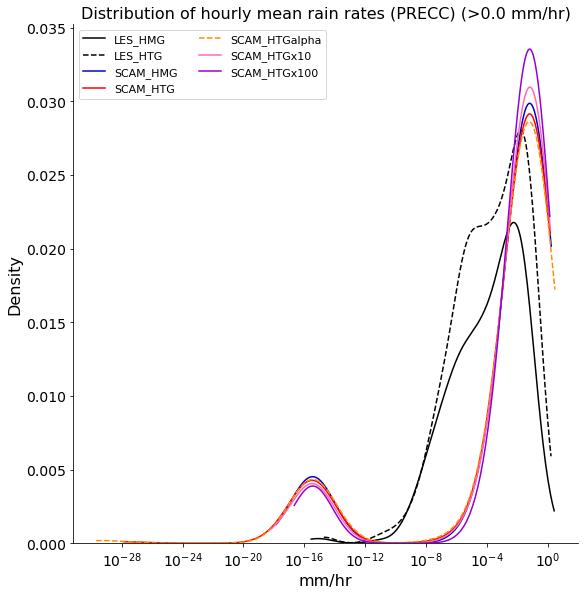

In [45]:

## Get rain rates only when it's actually raining...
rainRatesHMG_les = LES_newDefault.meanRain.sel(case='HMG').values
rainRatesHMG_les = rainRatesHMG_les[np.where(rainRatesHMG_les>0)[0]]

rainRatesHTG_les = LES_newDefault.meanRain.sel(case='HTG').values
rainRatesHTG_les = rainRatesHTG_les[np.where(rainRatesHTG_les>0)[0]]

# SCAM
rainRatesHMG_scam = scamPRECC.sel(case='HMG').values
rainRatesHMG_scam = rainRatesHMG_scam[np.where(rainRatesHMG_scam>0)[0]]

rainRatesHTG_scam = scamPRECC.sel(case='HTG*01').values
rainRatesHTG_scam = rainRatesHTG_scam[np.where(rainRatesHTG_scam>0)[0]]

rainRatesHTGalpha_scam = scamPRECC.sel(case='HTG*LESmult').values
rainRatesHTGalpha_scam = rainRatesHTGalpha_scam[np.where(rainRatesHTGalpha_scam>0)[0]]

rainRatesHTGx10_scam = scamPRECC.sel(case='HTG*10').values
rainRatesHTGx10_scam = rainRatesHTGx10_scam[np.where(rainRatesHTGx10_scam>0)[0]]

rainRatesHTGx100_scam = scamPRECC.sel(case='HTG*100').values
rainRatesHTGx100_scam = rainRatesHTGx100_scam[np.where(rainRatesHTGx100_scam>0)[0]]


dfReal = pd.concat(axis=0, ignore_index=True, objs=[
         pd.DataFrame.from_dict({'Rain rate': np.squeeze(rainRatesHTGx100_scam), 'case': 'SCAM_HTGx100'}),
         pd.DataFrame.from_dict({'Rain rate': np.squeeze(rainRatesHTGx10_scam), 'case': 'SCAM_HTGx10'}),
         pd.DataFrame.from_dict({'Rain rate': np.squeeze(rainRatesHTGalpha_scam), 'case': 'SCAM_HTGalpha'}),
         pd.DataFrame.from_dict({'Rain rate': np.squeeze(rainRatesHTG_scam), 'case': 'SCAM_HTG'}),
         pd.DataFrame.from_dict({'Rain rate': np.squeeze(rainRatesHMG_scam), 'case': 'SCAM_HMG'}),
         pd.DataFrame.from_dict({'Rain rate': np.squeeze(rainRatesHTG_les), 'case': 'LES_HTG'}),
         pd.DataFrame.from_dict({'Rain rate': np.squeeze(rainRatesHMG_les), 'case': 'LES_HMG'}),
         ])

# Make plot 
g = sns.displot(dfReal, x='Rain rate', hue='case', kind='kde', height=8, cut=0, 
                log_scale=True,
# g = sns.displot(dfReal, x='Rain rate', hue='case', kind='ecdf', height=8, 
                palette=['darkviolet','hotpink','darkorange','red','mediumblue','black','black'], legend=False)


# g.ax.set_xlim([0,0.5])
g.ax.set_title("Distribution of hourly mean rain rates (PRECC) (>0.0 mm/hr)", fontsize=16 ) 
g.ax.set_xlabel('mm/hr',fontsize=16)
g.ax.set_ylabel('Density',fontsize=16)
g.ax.tick_params(axis='both', labelsize= 14)
# plt.setp(g._legend.get_title(), fontsize=14)
# plt.setp(g._legend.get_texts(), fontsize=14)
plt.setp(g.ax.lines[1], linestyle='--')   # Index goes in reverse order 
plt.setp(g.ax.lines[4], linestyle='--')   # Index goes in reverse order 
plt.legend(loc='upper left', labels=['LES_HMG','LES_HTG','SCAM_HMG','SCAM_HTG','SCAM_HTGalpha','SCAM_HTGx10','SCAM_HTGx100'], ncol=2, fontsize=11)



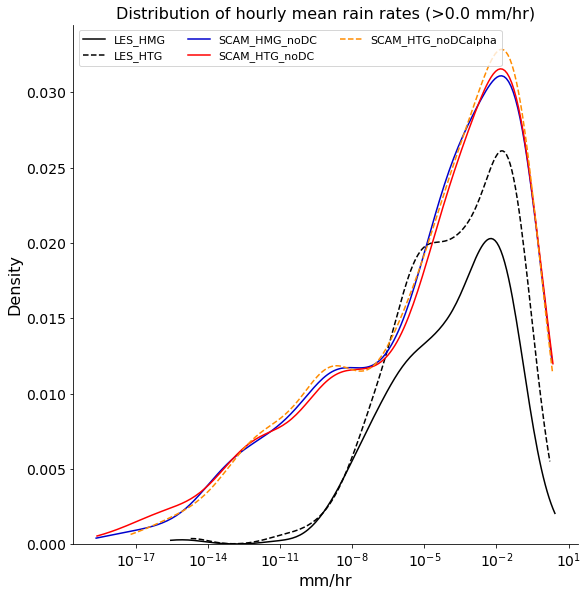

In [130]:

# ## Get rain rates only when it's actually raining...
# rainRatesHMG_les = LES_newDefault.meanRain.sel(case='HMG').values
# rainRatesHMG_les = rainRatesHMG_les[np.where(rainRatesHMG_les>0)[0]]

# rainRatesHTG_les = LES_newDefault.meanRain.sel(case='HTG').values
# rainRatesHTG_les = rainRatesHTG_les[np.where(rainRatesHTG_les>0)[0]]

# # SCAM
# rainRatesHMG_scam = scamRain.sel(case='HMG_dcOff').values
# rainRatesHMG_scam = rainRatesHMG_scam[np.where(rainRatesHMG_scam>0)[0]]

# rainRatesHTG_scam = scamRain.sel(case='HTG_dcOff').values
# rainRatesHTG_scam = rainRatesHTG_scam[np.where(rainRatesHTG_scam>0)[0]]

# rainRatesHTGalpha_scam = scamRain.sel(case='HTG*LESmult_dcOff').values
# rainRatesHTGalpha_scam = rainRatesHTGalpha_scam[np.where(rainRatesHTGalpha_scam>0)[0]]



# dfReal = pd.concat(axis=0, ignore_index=True, objs=[
#          pd.DataFrame.from_dict({'Rain rate': np.squeeze(rainRatesHTGalpha_scam), 'case': 'SCAM_HTGalpha'}),
#          pd.DataFrame.from_dict({'Rain rate': np.squeeze(rainRatesHTG_scam), 'case': 'SCAM_HTG'}),
#          pd.DataFrame.from_dict({'Rain rate': np.squeeze(rainRatesHMG_scam), 'case': 'SCAM_HMG'}),
#          pd.DataFrame.from_dict({'Rain rate': np.squeeze(rainRatesHTG_les), 'case': 'LES_HTG'}),
#          pd.DataFrame.from_dict({'Rain rate': np.squeeze(rainRatesHMG_les), 'case': 'LES_HMG'}),
#          ])

# # Make plot 
# g = sns.displot(dfReal, x='Rain rate', hue='case', kind='kde', height=8, cut=0, 
#                 log_scale=True,
# # g = sns.displot(dfReal, x='Rain rate', hue='case', kind='ecdf', height=8, 
#                 palette=['darkorange','red','mediumblue','black','black'], legend=False)


# # g.ax.set_xlim([0,0.5])
# g.ax.set_title("Distribution of hourly mean rain rates (>0.0 mm/hr)", fontsize=16 ) 
# g.ax.set_xlabel('mm/hr',fontsize=16)
# g.ax.set_ylabel('Density',fontsize=16)
# g.ax.tick_params(axis='both', labelsize= 14)
# # plt.setp(g._legend.get_title(), fontsize=14)
# # plt.setp(g._legend.get_texts(), fontsize=14)
# plt.setp(g.ax.lines[1], linestyle='--')   # Index goes in reverse order 
# plt.setp(g.ax.lines[4], linestyle='--')   # Index goes in reverse order 
# plt.legend(loc='upper left', labels=['LES_HMG','LES_HTG','SCAM_HMG_noDC','SCAM_HTG_noDC','SCAM_HTG_noDCalpha'], ncol=3, fontsize=11)



In [76]:
LES_newDefault

<xarray.Dataset>
Dimensions:      (Time: 900, bottom_top: 226, case: 2, south_north: 520, west_east: 520)
Coordinates:
  * Time         (Time) datetime64[ns] 2015-06-06T07:30:00 ... 2018-07-10T21:...
  * west_east    (west_east) float64 0.0 0.25 0.5 0.75 ... 129.2 129.5 129.8
  * south_north  (south_north) float64 0.0 0.25 0.5 0.75 ... 129.2 129.5 129.8
  * case         (case) object 'HMG' 'HTG'
Dimensions without coordinates: bottom_top
Data variables:
    XTIME        (case, Time) float32 60.0 120.0 180.0 ... 780.0 840.0 900.0
    AVS_SH       (case, Time, south_north, west_east) float32 32.12 ... -13.72
    AVS_LH       (case, Time, south_north, west_east) float32 68.7 ... 3.093
    AVS_LWP      (case, Time, south_north, west_east) float32 0.0 0.0 ... 0.0
    AVS_RAIN     (case, Time, south_north, west_east) float32 0.0 0.0 ... 0.0
    AVP_QC       (case, Time, bottom_top) float32 0.0 0.0 0.0 ... 0.0 0.0 0.0
    AVP_QV       (case, Time, bottom_top) float32 0.01508 0.0152 ... 3.42e-06
    AVP_Z        (case, Time, bottom_top) float32 15.5 46.42 ... 1.475e+04
    AVP_P        (case, Time, bottom_top) float32 9.706e+04 ... 1.31e+04
    AVP_THL      (case, Time, bottom_top) float32 297.8 298.4 ... 365.5 366.9
    AVP_TH       (case, Time, bottom_top) float32 297.8 298.4 ... 365.5 366.9
    AVP_LWC      (case, Time, bottom_top) float32 0.0 0.0 0.0 ... 0.0 0.0 0.0
    AVP_IWC      (case, Time, bottom_top) float32 0.0 0.0 0.0 ... 0.0 0.0 0.0
    meanRain     (case, Time) float32 0.0 0.0 0.0 ... 3.125e-06 1.559e-08
Attributes:
    TITLE:                            OUTPUT FROM WRF V3.8.1 MODEL
    START_DATE:                      2015-06-06_12:00:00
    WEST-EAST_GRID_DIMENSION:        521
    SOUTH-NORTH_GRID_DIMENSION:      521
    BOTTOM-TOP_GRID_DIMENSION:       227
    DX:                              250.0
    DY:                              250.0
    GRIDTYPE:                        C
    DIFF_OPT:                        2
    KM_OPT:                          3
    DAMP_OPT:                        3
    DAMPCOEF:                        0.2
    KHDIF:                           0.0
    KVDIF:                           0.0
    MP_PHYSICS:                      8
    RA_LW_PHYSICS:                   4
    RA_SW_PHYSICS:                   4
    SF_SFCLAY_PHYSICS:               44
    SF_SURFACE_PHYSICS:              0
    BL_PBL_PHYSICS:                  0
    CU_PHYSICS:                      0
    SF_LAKE_PHYSICS:                 0
    SURFACE_INPUT_SOURCE:            3
    SST_UPDATE:                      0
    GRID_FDDA:                       0
    GFDDA_INTERVAL_M:                0
    GFDDA_END_H:                     0
    GRID_SFDDA:                      0
    SGFDDA_INTERVAL_M:               0
    SGFDDA_END_H:                    0
    HYPSOMETRIC_OPT:                 1
    USE_THETA_M:                     1
    WEST-EAST_PATCH_START_UNSTAG:    1
    WEST-EAST_PATCH_END_UNSTAG:      520
    WEST-EAST_PATCH_START_STAG:      1
    WEST-EAST_PATCH_END_STAG:        521
    SOUTH-NORTH_PATCH_START_UNSTAG:  1
    SOUTH-NORTH_PATCH_END_UNSTAG:    520
    SOUTH-NORTH_PATCH_START_STAG:    1
    SOUTH-NORTH_PATCH_END_STAG:      521
    BOTTOM-TOP_PATCH_START_UNSTAG:   1
    BOTTOM-TOP_PATCH_END_UNSTAG:     226
    BOTTOM-TOP_PATCH_START_STAG:     1
    BOTTOM-TOP_PATCH_END_STAG:       227
    GRID_ID:                         1
    PARENT_ID:                       0
    I_PARENT_START:                  0
    J_PARENT_START:                  0
    PARENT_GRID_RATIO:               1
    DT:                              0.5
    CEN_LAT:                         0.0
    CEN_LON:                         0.0
    TRUELAT1:                        0.0
    TRUELAT2:                        0.0
    MOAD_CEN_LAT:                    0.0
    STAND_LON:                       0.0
    POLE_LAT:                        0.0
    POLE_LON:                        0.0
    GMT:                             0.0
    JULYR:                           0
    JULDAY: 

In [75]:
## LES LWP (units of kg/m2)
rainRatesHMG_les = LES_newDefault.AVT_LWP.sel(case='HMG').values
rainRatesHTG_les = LES_newDefault.AVT_LWP.sel(case='HTG').values

# SCAM (TMQ in units of kg/m2) 
rainRatesHMG_scam = scamDS.TMQ.sel(case='HMG').values
rainRatesHTG_scam = scamDS.TMQ.sel(case='HTG*01').values
rainRatesHTGalpha_scam = scamDS.TMQ.sel(case='HTG*LESmult').values
rainRatesHTGx10_scam = scamDS.TMQ.sel(case='HTG*10').values
rainRatesHTGx100_scam = scamDS.TMQ.sel(case='HTG*100').values


dfReal = pd.concat(axis=0, ignore_index=True, objs=[
         pd.DataFrame.from_dict({'LWP': np.squeeze(rainRatesHTGx100_scam), 'case': 'SCAM_HTGx100'}),
         pd.DataFrame.from_dict({'LWP': np.squeeze(rainRatesHTGx10_scam), 'case': 'SCAM_HTGx10'}),
         pd.DataFrame.from_dict({'LWP': np.squeeze(rainRatesHTGalpha_scam), 'case': 'SCAM_HTGalpha'}),
         pd.DataFrame.from_dict({'LWP': np.squeeze(rainRatesHTG_scam), 'case': 'SCAM_HTG'}),
         pd.DataFrame.from_dict({'LWP': np.squeeze(rainRatesHMG_scam), 'case': 'SCAM_HMG'}),
         pd.DataFrame.from_dict({'LWP': np.squeeze(rainRatesHTG_les), 'case': 'LES_HTG'}),
         pd.DataFrame.from_dict({'LWP': np.squeeze(rainRatesHMG_les), 'case': 'LES_HMG'}),
         ])

# Make plot 
g = sns.displot(dfReal, x='LWP', hue='case', kind='kde', height=8, cut=0, 
# g = sns.displot(dfReal, x='Rain rate', hue='case', kind='ecdf', height=8, 
                palette=['darkviolet','hotpink','darkorange','red','mediumblue','black','black'], legend=False)


# g.ax.set_xlim([0,0.5])
g.ax.set_title("Distribution of LES LWP and SCAM TMQ", fontsize=16 ) 
g.ax.set_xlabel('kg/m2',fontsize=16)
g.ax.set_ylabel('Density',fontsize=16)
g.ax.tick_params(axis='both', labelsize= 14)
# plt.setp(g._legend.get_title(), fontsize=14)
# plt.setp(g._legend.get_texts(), fontsize=14)
plt.setp(g.ax.lines[1], linestyle='--')   # Index goes in reverse order 
plt.setp(g.ax.lines[4], linestyle='--')   # Index goes in reverse order 
plt.legend(loc='upper left', labels=['LES_HMG','LES_HTG','SCAM_HMG','SCAM_HTG','SCAM_HTGalpha','SCAM_HTGx10','SCAM_HTGx100'], ncol=2, fontsize=11)



AttributeError: 'Dataset' object has no attribute 'AVT_LWP'

### Time-height plots

In [38]:
## Get hourly mean SCAM 
hourlyMeanSCAM  = scamDS.groupby('time.hour').mean(dim='time')
hourlyStdSCAM   = scamDS.groupby('time.hour').std(dim='time')
hourlyCountSCAM = scamDS.groupby('time.hour').count(dim='time')
hourlySE = hourlyStdSCAM/np.sqrt(hourlyCountSCAM)

## Get (mean) heights from Z3_interp
# hourlyMeanSCAM.Z3_interp


In [39]:
## Add significance testing 
CIlevel = 1.960   ## 95% CI
# CIlevel = 1.645   ## 90% CI

CI = CIlevel*hourlySE

lowCI = hourlyMeanSCAM - CI
hghCI = hourlyMeanSCAM + CI

def getStatSigCI(nTimes, nLevs, varSel, ctrlCase, testCase): 

    ## Get ranges for each case's CI 
    ctrlDS_lowCI    = lowCI.sel(case=ctrlCase)[varSel]
    testDS_lowCI    = lowCI.sel(case=testCase)[varSel]

    ctrlDS_hghCI    = hghCI.sel(case=ctrlCase)[varSel]
    testDS_hghCI    = hghCI.sel(case=testCase)[varSel]

    levSig = np.full([nTimes, nLevs], np.nan)

    for iHr in range(nTimes): 
        for iLev in range(nLevs):

            # Not significant range?
            if ( (testDS_lowCI.values[iHr,iLev] >= ctrlDS_lowCI.values[iHr,iLev]) & (testDS_lowCI.values[iHr,iLev] <= ctrlDS_hghCI.values[iHr,iLev]) ): 
                levSig[iHr,iLev]  = 0 
            elif ( (testDS_hghCI.values[iHr,iLev] >= ctrlDS_lowCI.values[iHr,iLev]) & (testDS_hghCI.values[iHr,iLev] <= ctrlDS_hghCI.values[iHr,iLev]) ): 
                levSig[iHr,iLev]  = 0 
            
            elif ( (ctrlDS_lowCI.values[iHr,iLev] >= testDS_lowCI.values[iHr,iLev]) & (ctrlDS_lowCI.values[iHr,iLev] <= testDS_hghCI.values[iHr,iLev]) ): 
                levSig[iHr,iLev]  = 0 
            elif ( (ctrlDS_hghCI.values[iHr,iLev] >= testDS_lowCI.values[iHr,iLev]) & (ctrlDS_hghCI.values[iHr,iLev] <= testDS_hghCI.values[iHr,iLev]) ): 
                levSig[iHr,iLev]  = 0            
            
            
            else:
                levSig[iHr, iLev] = 1 
    
    return levSig


In [40]:
# levSig_thlp2    = getStatSigCI(len(diffCases.hour.values), len(diffCases.levInterp.values), 'THLP2_CLUBB_interp',   ctrlCase, testCase)  
# print(levSig_thlp2[7,40])

# ## Get ranges for each case's CI 
# ctrlDS_lowCI    = lowCI.sel(case=ctrlCase)['THLP2_CLUBB_interp']
# testDS_lowCI    = lowCI.sel(case=testCase)['THLP2_CLUBB_interp']

# ctrlDS_hghCI    = hghCI.sel(case=ctrlCase)['THLP2_CLUBB_interp']
# testDS_hghCI    = hghCI.sel(case=testCase)['THLP2_CLUBB_interp']

# print('CTRLds Limits: ', ctrlDS_lowCI[7,40].values, ctrlDS_hghCI[7,40].values)
# print('TESTds Limits: ', testDS_lowCI[7,40].values, testDS_hghCI[7,40].values)


**Manuscript plots**

In [41]:
def getMaxValHeightTime(DS,varName, maxLev,levName,timeName):
    iMax = np.where(DS[levName].values>=maxLev)[0]
    DS   = DS.isel(levInterp=iMax.astype(int))
    
    maxValTemp = np.nanmax(np.squeeze(DS[varName].values))
    minValTemp = np.nanmin(np.squeeze(DS[varName].values))
    
    if np.abs(maxValTemp)>np.abs(minValTemp):
        maxVal = maxValTemp
    elif np.abs(maxValTemp)<np.abs(minValTemp):
        maxVal = minValTemp
    else: 
        maxVal = maxValTemp
        
    iMax = np.where(DS[varName].values == maxVal)
    hgtMax = DS[levName].values[iMax[1]]
    timeMax = DS[timeName].values[iMax[0]]
    
    return maxVal, hgtMax, timeMax

In [ ]:
# fig,axs = plt.subplots(2,5, figsize=(18,7) )
# axs = axs.ravel()
# fig.subplots_adjust(hspace = 0.7,bottom=0.25)

# ctrlCase = 'HMG'
# testCase = 'HTG*01'

# # ctrlCase = 'HMG'
# # testCase = 'HTG*LESmult'

# # ctrlCase = 'HMG_dcOff'
# # # testCase = 'HTG_dcOff'
# # testCase = 'HTG*LESmult_dcOff'

# ctrlDS    = hourlyMeanSCAM.sel(case=ctrlCase)
# testDS    = hourlyMeanSCAM.sel(case=testCase)
# diffCases = testDS - ctrlDS


# ## Plot control cases 
# ## - - - - - - - - - - - - - - - - - - - - - - - - -
# cplt = axs[0].contourf(ctrlDS.hour.values, 
#                 ctrlDS.levInterp.values, 
#                 np.squeeze(ctrlDS.THLP2_CLUBB_interp.values).transpose(),
#                 np.arange(0.0, 0.1, (0.1-0)/26), cmap='Spectral_r', extend='both')
# # Add colorbar
# ax_position = axs[0].get_position()
# cbar_ax = fig.add_axes([ax_position.x0, ax_position.y0-0.06, ax_position.width, 0.02])
# cbar = plt.colorbar(cplt, orientation='horizontal',cax=cbar_ax, label='K**2', format='%.2f')
# cbar.ax.tick_params(labelsize=11) 
# cbar.ax.locator_params(nbins=5)
# # Add contour lines
# cplt = axs[0].contour(ctrlDS.hour.values, 
#                 ctrlDS.levInterp.values, 
#                 np.squeeze(ctrlDS.THLP2_CLUBB_interp.values).transpose(),
#                 np.arange(0.0, 0.1, (0.1-0)/26)[::2], colors='k', alpha=0.3 )


# cplt = axs[1].contourf(ctrlDS.hour.values, 
#                 ctrlDS.levInterp.values, 
#                 np.squeeze(ctrlDS.RTP2_CLUBB_interp.values * 1e-6).transpose(),
#                 np.arange(0.0, 2.0e-7, (2.0e-7-0.0)/26), cmap='Spectral_r', extend='both')
# # Add colorbar
# ax_position = axs[1].get_position()
# cbar_ax = fig.add_axes([ax_position.x0, ax_position.y0-0.06, ax_position.width, 0.02])
# cbar = plt.colorbar(cplt, orientation='horizontal',cax=cbar_ax, label='kg**2 / kg**2', format='%.1g')
# cbar.ax.tick_params(labelsize=11) 
# cbar.ax.locator_params(nbins=5)
# # Add contour lines
# cplt = axs[1].contour(ctrlDS.hour.values, 
#                 ctrlDS.levInterp.values, 
#                 np.squeeze(ctrlDS.RTP2_CLUBB_interp.values * 1e-6).transpose(),
#                 np.arange(0.0, 2.0e-7, (2.0e-7-0.0)/26)[::2], colors='k', alpha=0.3 )


# cplt = axs[2].contourf(ctrlDS.hour.values, 
#                 ctrlDS.levInterp.values, 
#                 np.squeeze(ctrlDS.RTPTHLP_CLUBB_interp.values * 1e-3).transpose(),
#                 np.arange(-5e-5, 5e-5+((5e-5*2)/26), (5e-5*2)/26), cmap='Spectral_r', extend='both')
# # Add colorbar
# ax_position = axs[2].get_position()
# cbar_ax = fig.add_axes([ax_position.x0, ax_position.y0-0.06, ax_position.width, 0.02])
# cbar = plt.colorbar(cplt, orientation='horizontal',cax=cbar_ax, label='K kg/kg', format='%.1g')
# cbar.ax.tick_params(labelsize=11) 
# cbar.ax.locator_params(nbins=5)
# # Add contour lines 
# cplt = axs[2].contour(ctrlDS.hour.values, 
#                 ctrlDS.levInterp.values, 
#                 np.squeeze(ctrlDS.RTPTHLP_CLUBB_interp.values * 1e-3).transpose(),
#                 np.arange(-5e-5, 5e-5+((5e-5*2)/26), (5e-5*2)/26)[::2], colors='k', alpha=0.3 )

# cplt = axs[3].contourf(ctrlDS.hour.values, 
#                 ctrlDS.levInterp.values, 
#                 np.squeeze(ctrlDS.WP2_CLUBB_interp.values).transpose(),
#                 np.arange(0.0, 1.2, (1.2-0.0)/26), cmap='Spectral_r', extend='both')
# # Add colorbar
# ax_position = axs[3].get_position()
# cbar_ax = fig.add_axes([ax_position.x0, ax_position.y0-0.06, ax_position.width, 0.02])
# cbar = plt.colorbar(cplt, orientation='horizontal',cax=cbar_ax, label='m**2 / s**2', format='%.2f')
# cbar.ax.tick_params(labelsize=11) 
# cbar.ax.locator_params(nbins=5)
# # Add contour lines
# cplt = axs[3].contour(ctrlDS.hour.values, 
#                 ctrlDS.levInterp.values, 
#                 np.squeeze(ctrlDS.WP2_CLUBB_interp.values).transpose(),
#                 np.arange(0.0, 1.2, (1.2-0.0)/26)[::2], colors='k', alpha=0.3 )


# cplt = axs[4].contourf(ctrlDS.hour.values, 
#                 ctrlDS.levInterp.values, 
#                 np.squeeze(ctrlDS.CLDLIQ_interp.values).transpose(),
#                 np.arange(0.0, 2e-5, (2e-5-0.0)/26), cmap='Spectral_r', extend='both')
# # Add colorbar
# ax_position = axs[4].get_position()
# cbar_ax = fig.add_axes([ax_position.x0, ax_position.y0-0.06, ax_position.width, 0.02])
# cbar = plt.colorbar(cplt, orientation='horizontal',cax=cbar_ax, label='kg/kg', format='%.1g')
# cbar.ax.tick_params(labelsize=11) 
# cbar.ax.locator_params(nbins=5)
# # Add contour lines
# cplt = axs[4].contour(ctrlDS.hour.values, 
#                 ctrlDS.levInterp.values, 
#                 np.squeeze(ctrlDS.CLDLIQ_interp.values).transpose(),
#                 np.arange(0.0, 2e-5, (2e-5-0.0)/26)[::2], colors='k', alpha=0.3 )


# ## Add inset text for max/min
# #   The where will return index as [hour, level]
# maxLev = 500
# thl2val,thl2hgt,thl2time = getMaxValHeightTime(ctrlDS, 'THLP2_CLUBB_interp',maxLev, 'levInterp','hour')
# rt2val, rt2hgt, rt2time  = getMaxValHeightTime(ctrlDS, 'RTP2_CLUBB_interp',maxLev, 'levInterp','hour')
# rtthlval,rtthlhgt, rtthltime  = getMaxValHeightTime(ctrlDS, 'RTPTHLP_CLUBB_interp',maxLev, 'levInterp','hour')
# w2val, w2hgt, w2time  = getMaxValHeightTime(ctrlDS, 'WP2_CLUBB_interp', maxLev,'levInterp','hour')
# cldval, cldhgt, cldtime  = getMaxValHeightTime(ctrlDS, 'CLDLIQ_interp', maxLev,'levInterp','hour')

# # axs[0].text(8,580,r'$Max  \Delta:$ %.2g (%i hPa)' % (thl2val, thl2hgt), 
# #             fontfamily='sans-serif', fontsize='large').set_bbox(dict(facecolor='white', alpha=0.5))
# axs[0].text(8,580,r'$Max:$ %.2g' % (thl2val), 
#             fontfamily='sans-serif', fontsize='large').set_bbox(dict(facecolor='white', edgecolor='none', alpha=0.5))
# axs[0].text(8,660,'(%i hPa, hour %i)' % (thl2hgt,thl2time), 
#             fontfamily='sans-serif', fontsize='medium').set_bbox(dict(facecolor='white', edgecolor='none', alpha=0.5))

# axs[1].text(8,580,r'$Max:$ %.2g' % (rt2val * 1e-6), 
#             fontfamily='sans-serif', fontsize='large').set_bbox(dict(facecolor='white', edgecolor='none', alpha=0.5))
# axs[1].text(8,660,'(%i hPa, hour %i)' % (rt2hgt,rt2time), 
#          fontfamily='sans-serif', fontsize='medium').set_bbox(dict(facecolor='white', edgecolor='none', alpha=0.5))

# axs[2].text(8,580,r'$Max:$ %.2g' % (rtthlval * 1e-3), 
#             fontfamily='sans-serif', fontsize='large').set_bbox(dict(facecolor='white', edgecolor='none', alpha=0.5))
# axs[2].text(8,660,'(%i hPa, hour %i)' % (rtthlhgt,rtthltime), 
#          fontfamily='sans-serif', fontsize='medium').set_bbox(dict(facecolor='white', edgecolor='none', alpha=0.5))

# axs[3].text(8,580,r'$Max:$ %.2g' % (w2val), 
#             fontfamily='sans-serif', fontsize='large').set_bbox(dict(facecolor='white', edgecolor='none', alpha=0.5))
# axs[3].text(8,660,'(%i hPa, hour %i)' % (w2hgt,w2time), 
#          fontfamily='sans-serif', fontsize='medium').set_bbox(dict(facecolor='white', edgecolor='none', alpha=0.5))

# axs[4].text(8,580,r'$Max:$ %.2g' % (cldval), 
#             fontfamily='sans-serif', fontsize='large').set_bbox(dict(facecolor='white', edgecolor='none', alpha=0.5))
# axs[4].text(8,660,'(%i hPa, hour %i)' % (cldhgt,cldtime), 
#          fontfamily='sans-serif', fontsize='medium').set_bbox(dict(facecolor='white', edgecolor='none', alpha=0.5))


# # axs[1].text(8,580,r'$Max:$ %.2g (%i hPa)' % (rt2val, rt2hgt), 
# #             fontfamily='sans-serif', fontsize='large').set_bbox(dict(facecolor='white', alpha=0.5))
# # axs[2].text(8,580,r'$Max:$ %.2g (%i hPa)' % (rtthlval, rtthlhgt), 
# #             fontfamily='sans-serif', fontsize='large').set_bbox(dict(facecolor='white', alpha=0.5))
# # axs[3].text(8,580,r'$Max:$ %.2g (%i hPa)' % (w2val, w2hgt), 
# #             fontfamily='sans-serif', fontsize='large').set_bbox(dict(facecolor='white', alpha=0.5))
# # axs[4].text(8,580,r'$Max:$ %.2g (%i hPa)' % (cldval, cldhgt), 
# #             fontfamily='sans-serif', fontsize='large').set_bbox(dict(facecolor='white', alpha=0.5))



# ## Plot difference in cases 
# ## - - - - - - - - - - - - - - - - - - - - - - - - -
# nStep = (2*0.010)/26
# cplt = axs[5].contourf(diffCases.hour.values, 
#                     diffCases.levInterp.values, 
#                     np.squeeze(diffCases.THLP2_CLUBB_interp.values).transpose(),
#                     np.arange(-0.010, 0.010+nStep, nStep), cmap='bwr', extend='both')
# # Add colorbar
# ax_position = axs[5].get_position()
# cbar_ax = fig.add_axes([ax_position.x0, ax_position.y0-0.09, ax_position.width, 0.02])
# cbar = plt.colorbar(cplt, orientation='horizontal',cax=cbar_ax, label='K**2', format='%.2f')
# cbar.ax.tick_params(labelsize=11) 
# cbar.ax.locator_params(nbins=5)


# nStep = (2*0.4e-7)/26
# cplt = axs[6].contourf(diffCases.hour.values, 
#                     diffCases.levInterp.values, 
#                     np.squeeze(diffCases.RTP2_CLUBB_interp.values * 1e-6).transpose(),
#                     np.arange(-0.4e-7, (0.4e-7)+nStep, nStep), cmap='bwr', extend='both')
# # Add colorbar
# ax_position = axs[6].get_position()
# cbar_ax = fig.add_axes([ax_position.x0, ax_position.y0-0.09, ax_position.width, 0.02])
# cbar = plt.colorbar(cplt, orientation='horizontal',cax=cbar_ax, label='kg**2 / kg**2', format='%.1g')
# cbar.ax.tick_params(labelsize=11) 
# cbar.ax.locator_params(nbins=5)


# nStep = (2*5e-6)/26
# cplt = axs[7].contourf(diffCases.hour.values, 
#                     diffCases.levInterp.values, 
#                     np.squeeze(diffCases.RTPTHLP_CLUBB_interp.values * 1e-3).transpose(),
#                     np.arange(-5e-6, (5e-6)+nStep, nStep), cmap='bwr', extend='both')
# # Add colorbar
# ax_position = axs[7].get_position()
# cbar_ax = fig.add_axes([ax_position.x0, ax_position.y0-0.09, ax_position.width, 0.02])
# cbar = plt.colorbar(cplt, orientation='horizontal',cax=cbar_ax, label='K kg/kg', format='%.1g')
# cbar.ax.tick_params(labelsize=11) 
# cbar.ax.locator_params(nbins=5)


# nStep = (2*0.1)/26
# cplt = axs[8].contourf(diffCases.hour.values, 
#                     diffCases.levInterp.values, 
#                     np.squeeze(diffCases.WP2_CLUBB_interp.values).transpose(),
#                     np.arange(-0.1, 0.1+nStep, nStep), cmap='bwr', extend='both')
# # Add colorbar
# ax_position = axs[8].get_position()
# cbar_ax = fig.add_axes([ax_position.x0, ax_position.y0-0.09, ax_position.width, 0.02])
# cbar = plt.colorbar(cplt, orientation='horizontal',cax=cbar_ax, label='m**2 / s**2', format='%.2f')
# cbar.ax.tick_params(labelsize=11) 
# cbar.ax.locator_params(nbins=5)


# nStep = (2*5e-6)/26
# cplt = axs[9].contourf(diffCases.hour.values, 
#                     diffCases.levInterp.values, 
#                     np.squeeze(diffCases.CLDLIQ_interp.values).transpose(),
#                     np.arange(-5e-6, (5e-6)+nStep, nStep), cmap='bwr', extend='both')
# # Add colorbar
# ax_position = axs[9].get_position()
# cbar_ax = fig.add_axes([ax_position.x0, ax_position.y0-0.09, ax_position.width, 0.02])
# cbar = plt.colorbar(cplt, orientation='horizontal',cax=cbar_ax, label='kg/kg', format='%.1g')
# cbar.ax.tick_params(labelsize=11) 
# cbar.ax.locator_params(nbins=5)

# ## - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - 
# ## Add significance testing 

# levSig_thlp2    = getStatSigCI(len(diffCases.hour.values), len(diffCases.levInterp.values), 'THLP2_CLUBB_interp',   ctrlCase, testCase)  
# levSig_rtp2     = getStatSigCI(len(diffCases.hour.values), len(diffCases.levInterp.values), 'RTP2_CLUBB_interp',    ctrlCase, testCase)  
# levSig_rtpthlp  = getStatSigCI(len(diffCases.hour.values), len(diffCases.levInterp.values), 'RTPTHLP_CLUBB_interp', ctrlCase, testCase)  
# levSig_wp2     = getStatSigCI(len(diffCases.hour.values), len(diffCases.levInterp.values), 'WP2_CLUBB_interp', ctrlCase, testCase)  
# levSig_cldliq  = getStatSigCI(len(diffCases.hour.values), len(diffCases.levInterp.values), 'CLDLIQ_interp',    ctrlCase, testCase)  

# for iHr in range(len(diffCases.hour.values)): 
#     for iLev in range(len(diffCases.levInterp.values)): 
#         # Thlp2
#         if levSig_thlp2[iHr, iLev]==1: 
#             axs[5].plot(diffCases.hour.values[iHr], diffCases.levInterp.values[iLev],'ko',alpha=0.3,markersize=1)

#         # Rtp2
#         if levSig_rtp2[iHr, iLev]==1: 
#             axs[6].plot(diffCases.hour.values[iHr], diffCases.levInterp.values[iLev],'ko',alpha=0.3,markersize=1)

            
#         #Rtpthlp
#         if levSig_rtpthlp[iHr, iLev]==1: 
#             axs[7].plot(diffCases.hour.values[iHr], diffCases.levInterp.values[iLev],'ko',alpha=0.3,markersize=1)
            
#         # Wp2
#         if levSig_wp2[iHr, iLev]==1: 
#             axs[8].plot(diffCases.hour.values[iHr], diffCases.levInterp.values[iLev],'ko',alpha=0.3,markersize=1)

#         # Cloud liquid
#         if levSig_cldliq[iHr, iLev]==1: 
#             axs[9].plot(diffCases.hour.values[iHr], diffCases.levInterp.values[iLev],'ko',alpha=0.3,markersize=1)


# ## - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - 


# axs[0].invert_yaxis()
# axs[1].invert_yaxis()
# axs[2].invert_yaxis()
# axs[3].invert_yaxis()
# axs[4].invert_yaxis()
# axs[5].invert_yaxis()
# axs[6].invert_yaxis()
# axs[7].invert_yaxis()
# axs[8].invert_yaxis()
# axs[9].invert_yaxis()

# axs[0].set_ylim([975, maxLev])
# axs[1].set_ylim([975, maxLev])
# axs[2].set_ylim([975, maxLev])
# axs[3].set_ylim([975, maxLev])
# axs[4].set_ylim([975, maxLev])
# axs[5].set_ylim([975, maxLev])
# axs[6].set_ylim([975, maxLev])
# axs[7].set_ylim([975, maxLev])
# axs[8].set_ylim([975, maxLev])
# axs[9].set_ylim([975, maxLev])

# # axs[0].set_title('THLP2_CLUBB: '+ctrlCase)
# # axs[1].set_title('RTP2_CLUBB: '+ctrlCase)
# # axs[2].set_title('RTPTHLP_CLUBB: '+ctrlCase)

# axs[0].set_title('(a)', loc='left')
# axs[0].set_title(r"$\overline{\theta_l'^2}$")

# axs[1].set_title('(b)', loc='left')
# axs[1].set_title(r"$\overline{q_t'^2}$")

# axs[2].set_title('(c)', loc='left')
# axs[2].set_title(r"$\overline{\theta_l'q_t'}$")

# axs[3].set_title('(d)', loc='left')
# axs[3].set_title(r"$\overline{w'^2}$")

# axs[4].set_title('(e)', loc='left')
# axs[4].set_title(r"$\overline{Cloud Liquid}$")

# # axs[5].set_title('(f)', loc='left')
# # axs[6].set_title('(g)', loc='left')
# # axs[7].set_title('(h)', loc='left')
# # axs[8].set_title('(i)', loc='left')
# # axs[9].set_title('(j)', loc='left')

# axs[5].set_title('(e)', loc='left')
# axs[6].set_title('(f)', loc='left')
# axs[7].set_title('(g)', loc='left')
# axs[8].set_title('(h)', loc='left')
# axs[9].set_title('(i)', loc='left')


# axs[0].set_ylabel('hPa')
# axs[5].set_ylabel('hPa')

# axs[5].set_xlabel('Local Hour')
# axs[6].set_xlabel('Local Hour')
# axs[7].set_xlabel('Local Hour')
# axs[8].set_xlabel('Local Hour')
# axs[9].set_xlabel('Local Hour')

# ## Add inset text for max/min
# #   The where will return index as [hour, level]
# thl2val,thl2hgt,thl2time = getMaxValHeightTime(diffCases, 'THLP2_CLUBB_interp',maxLev, 'levInterp','hour')
# rt2val, rt2hgt, rt2time  = getMaxValHeightTime(diffCases, 'RTP2_CLUBB_interp',maxLev, 'levInterp','hour')
# rtthlval,rtthlhgt, rtthltime  = getMaxValHeightTime(diffCases, 'RTPTHLP_CLUBB_interp',maxLev, 'levInterp','hour')
# w2val, w2hgt, w2time  = getMaxValHeightTime(diffCases, 'WP2_CLUBB_interp',maxLev, 'levInterp','hour')
# cldval, cldhgt, cldtime  = getMaxValHeightTime(diffCases, 'CLDLIQ_interp',maxLev, 'levInterp','hour')


# axs[5].text(8,580,r'$Max  \Delta:$ %.2g' % (thl2val), 
#             fontfamily='sans-serif', fontsize='large').set_bbox(dict(facecolor='white', edgecolor='none', alpha=0.5))
# axs[5].text(8,660,'(%i hPa, hour %i)' % (thl2hgt,thl2time), 
#             fontfamily='sans-serif', fontsize='medium').set_bbox(dict(facecolor='white', edgecolor='none', alpha=0.5))

# axs[6].text(8,580,r'$Max  \Delta:$ %.2g' % (rt2val * 1e-6), 
#             fontfamily='sans-serif', fontsize='large').set_bbox(dict(facecolor='white', edgecolor='none', alpha=0.5))
# axs[6].text(8,660,'(%i hPa, hour %i)' % (rt2hgt,rt2time), 
#             fontfamily='sans-serif', fontsize='medium').set_bbox(dict(facecolor='white', edgecolor='none', alpha=0.5))

# axs[7].text(8,580,r'$Max  \Delta:$ %.2g' % (rtthlval * 1e-3), 
#             fontfamily='sans-serif', fontsize='large').set_bbox(dict(facecolor='white', edgecolor='none', alpha=0.5))
# axs[7].text(8,660,'(%i hPa, hour %i)' % (rtthlhgt,rtthltime), 
#             fontfamily='sans-serif', fontsize='medium').set_bbox(dict(facecolor='white', edgecolor='none', alpha=0.5))

# axs[8].text(8,580,r'$Max  \Delta:$ %.2g' % (w2val), 
#             fontfamily='sans-serif', fontsize='large').set_bbox(dict(facecolor='white', edgecolor='none', alpha=0.5))
# axs[8].text(8,660,'(%i hPa, hour %i)' % (w2hgt,w2time), 
#             fontfamily='sans-serif', fontsize='medium').set_bbox(dict(facecolor='white', edgecolor='none', alpha=0.5))

# axs[9].text(8,580,r'$Max  \Delta:$ %.2g' % (cldval), 
#             fontfamily='sans-serif', fontsize='large').set_bbox(dict(facecolor='white', edgecolor='none', alpha=0.5))
# axs[9].text(8,660,'(%i hPa, hour %i)' % (cldhgt, cldtime), 
#             fontfamily='sans-serif', fontsize='medium').set_bbox(dict(facecolor='white', edgecolor='none', alpha=0.5))


# # axs[6].text(8,580,r'$Max  \Delta:$ %.2g (%i hPa)' % (rt2val, rt2hgt), 
# #             fontfamily='sans-serif', fontsize='large').set_bbox(dict(facecolor='white', alpha=0.5))
# # axs[7].text(8,580,r'$Max  \Delta:$ %.2g (%i hPa)' % (rtthlval, rtthlhgt), 
# #             fontfamily='sans-serif', fontsize='large').set_bbox(dict(facecolor='white', alpha=0.5))
# # axs[8].text(8,580,r'$Max  \Delta:$ %.2g (%i hPa)' % (w2val, w2hgt), 
# #             fontfamily='sans-serif', fontsize='large').set_bbox(dict(facecolor='white', alpha=0.5))
# # axs[9].text(8,580,r'$Max  \Delta:$ %.2g (%i hPa)' % (cldval, cldhgt), 
# #             fontfamily='sans-serif', fontsize='large').set_bbox(dict(facecolor='white', alpha=0.5))

# fig.delaxes(axs[4])
# fig.delaxes(axs[7])

# plt.show()

# fig.savefig('/glade/u/home/mdfowler/Analysis/SCAMvLES_figs/Fig1_paper.png')



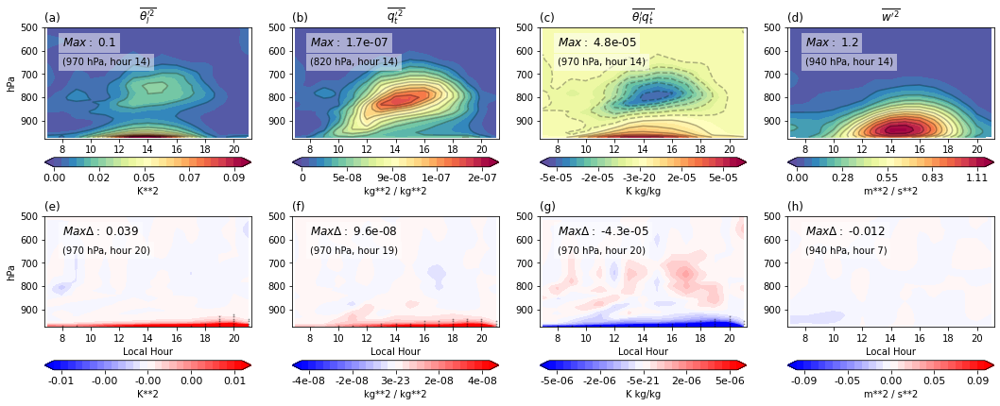

In [43]:
fig,axs = plt.subplots(2,4, figsize=(18,7) )
axs = axs.ravel()
fig.subplots_adjust(hspace = 0.7,bottom=0.25)

ctrlCase = 'HMG'
testCase = 'HTG*01'
# testCase = 'HTG*100'

# ctrlCase = 'HMG'
# testCase = 'HTG*LESmult'

# ctrlCase = 'HMG_dcOff'
# # testCase = 'HTG_dcOff'
# testCase = 'HTG*LESmult_dcOff'

ctrlDS    = hourlyMeanSCAM.sel(case=ctrlCase)
testDS    = hourlyMeanSCAM.sel(case=testCase)
diffCases = testDS - ctrlDS


## Plot control cases 
## - - - - - - - - - - - - - - - - - - - - - - - - -
cplt = axs[0].contourf(ctrlDS.hour.values, 
                ctrlDS.levInterp.values, 
                np.squeeze(ctrlDS.THLP2_CLUBB_interp.values).transpose(),
                np.arange(0.0, 0.1, (0.1-0)/26), cmap='Spectral_r', extend='both')
# Add colorbar
ax_position = axs[0].get_position()
cbar_ax = fig.add_axes([ax_position.x0, ax_position.y0-0.06, ax_position.width, 0.02])
cbar = plt.colorbar(cplt, orientation='horizontal',cax=cbar_ax, label='K**2', format='%.2f')
cbar.ax.tick_params(labelsize=11) 
cbar.ax.locator_params(nbins=5)
# Add contour lines
cplt = axs[0].contour(ctrlDS.hour.values, 
                ctrlDS.levInterp.values, 
                np.squeeze(ctrlDS.THLP2_CLUBB_interp.values).transpose(),
                np.arange(0.0, 0.1, (0.1-0)/26)[::2], colors='k', alpha=0.3 )


cplt = axs[1].contourf(ctrlDS.hour.values, 
                ctrlDS.levInterp.values, 
                np.squeeze(ctrlDS.RTP2_CLUBB_interp.values * 1e-6).transpose(),
                np.arange(0.0, 2.0e-7, (2.0e-7-0.0)/26), cmap='Spectral_r', extend='both')
# Add colorbar
ax_position = axs[1].get_position()
cbar_ax = fig.add_axes([ax_position.x0, ax_position.y0-0.06, ax_position.width, 0.02])
cbar = plt.colorbar(cplt, orientation='horizontal',cax=cbar_ax, label='kg**2 / kg**2', format='%.1g')
cbar.ax.tick_params(labelsize=11) 
cbar.ax.locator_params(nbins=5)
# Add contour lines
cplt = axs[1].contour(ctrlDS.hour.values, 
                ctrlDS.levInterp.values, 
                np.squeeze(ctrlDS.RTP2_CLUBB_interp.values * 1e-6).transpose(),
                np.arange(0.0, 2.0e-7, (2.0e-7-0.0)/26)[::2], colors='k', alpha=0.3 )


cplt = axs[2].contourf(ctrlDS.hour.values, 
                ctrlDS.levInterp.values, 
                np.squeeze(ctrlDS.RTPTHLP_CLUBB_interp.values * 1e-3).transpose(),
                np.arange(-5e-5, 5e-5+((5e-5*2)/26), (5e-5*2)/26), cmap='Spectral_r', extend='both')
# Add colorbar
ax_position = axs[2].get_position()
cbar_ax = fig.add_axes([ax_position.x0, ax_position.y0-0.06, ax_position.width, 0.02])
cbar = plt.colorbar(cplt, orientation='horizontal',cax=cbar_ax, label='K kg/kg', format='%.1g')
cbar.ax.tick_params(labelsize=11) 
cbar.ax.locator_params(nbins=5)
# Add contour lines 
cplt = axs[2].contour(ctrlDS.hour.values, 
                ctrlDS.levInterp.values, 
                np.squeeze(ctrlDS.RTPTHLP_CLUBB_interp.values * 1e-3).transpose(),
                np.arange(-5e-5, 5e-5+((5e-5*2)/26), (5e-5*2)/26)[::2], colors='k', alpha=0.3 )

cplt = axs[3].contourf(ctrlDS.hour.values, 
                ctrlDS.levInterp.values, 
                np.squeeze(ctrlDS.WP2_CLUBB_interp.values).transpose(),
                np.arange(0.0, 1.2, (1.2-0.0)/26), cmap='Spectral_r', extend='both')
# Add colorbar
ax_position = axs[3].get_position()
cbar_ax = fig.add_axes([ax_position.x0, ax_position.y0-0.06, ax_position.width, 0.02])
cbar = plt.colorbar(cplt, orientation='horizontal',cax=cbar_ax, label='m**2 / s**2', format='%.2f')
cbar.ax.tick_params(labelsize=11) 
cbar.ax.locator_params(nbins=5)
# Add contour lines
cplt = axs[3].contour(ctrlDS.hour.values, 
                ctrlDS.levInterp.values, 
                np.squeeze(ctrlDS.WP2_CLUBB_interp.values).transpose(),
                np.arange(0.0, 1.2, (1.2-0.0)/26)[::2], colors='k', alpha=0.3 )



## Add inset text for max/min
#   The where will return index as [hour, level]
maxLev = 500
thl2val,thl2hgt,thl2time = getMaxValHeightTime(ctrlDS, 'THLP2_CLUBB_interp',maxLev, 'levInterp','hour')
rt2val, rt2hgt, rt2time  = getMaxValHeightTime(ctrlDS, 'RTP2_CLUBB_interp',maxLev, 'levInterp','hour')
rtthlval,rtthlhgt, rtthltime  = getMaxValHeightTime(ctrlDS, 'RTPTHLP_CLUBB_interp',maxLev, 'levInterp','hour')
w2val, w2hgt, w2time  = getMaxValHeightTime(ctrlDS, 'WP2_CLUBB_interp', maxLev,'levInterp','hour')
cldval, cldhgt, cldtime  = getMaxValHeightTime(ctrlDS, 'CLDLIQ_interp', maxLev,'levInterp','hour')

# axs[0].text(8,580,r'$Max  \Delta:$ %.2g (%i hPa)' % (thl2val, thl2hgt), 
#             fontfamily='sans-serif', fontsize='large').set_bbox(dict(facecolor='white', alpha=0.5))
axs[0].text(8,580,r'$Max:$ %.2g' % (thl2val), 
            fontfamily='sans-serif', fontsize='large').set_bbox(dict(facecolor='white', edgecolor='none', alpha=0.5))
axs[0].text(8,660,'(%i hPa, hour %i)' % (thl2hgt,thl2time), 
            fontfamily='sans-serif', fontsize='medium').set_bbox(dict(facecolor='white', edgecolor='none', alpha=0.5))

axs[1].text(8,580,r'$Max:$ %.2g' % (rt2val * 1e-6), 
            fontfamily='sans-serif', fontsize='large').set_bbox(dict(facecolor='white', edgecolor='none', alpha=0.5))
axs[1].text(8,660,'(%i hPa, hour %i)' % (rt2hgt,rt2time), 
         fontfamily='sans-serif', fontsize='medium').set_bbox(dict(facecolor='white', edgecolor='none', alpha=0.5))

axs[2].text(8,580,r'$Max:$ %.2g' % (rtthlval * 1e-3), 
            fontfamily='sans-serif', fontsize='large').set_bbox(dict(facecolor='white', edgecolor='none', alpha=0.5))
axs[2].text(8,660,'(%i hPa, hour %i)' % (rtthlhgt,rtthltime), 
         fontfamily='sans-serif', fontsize='medium').set_bbox(dict(facecolor='white', edgecolor='none', alpha=0.5))

axs[3].text(8,580,r'$Max:$ %.2g' % (w2val), 
            fontfamily='sans-serif', fontsize='large').set_bbox(dict(facecolor='white', edgecolor='none', alpha=0.5))
axs[3].text(8,660,'(%i hPa, hour %i)' % (w2hgt,w2time), 
         fontfamily='sans-serif', fontsize='medium').set_bbox(dict(facecolor='white', edgecolor='none', alpha=0.5))





## Plot difference in cases 
## - - - - - - - - - - - - - - - - - - - - - - - - -
nStep = (2*0.010)/26
cplt = axs[4].contourf(diffCases.hour.values, 
                    diffCases.levInterp.values, 
                    np.squeeze(diffCases.THLP2_CLUBB_interp.values).transpose(),
                    np.arange(-0.010, 0.010+nStep, nStep), cmap='bwr', extend='both')
# Add colorbar
ax_position = axs[4].get_position()
cbar_ax = fig.add_axes([ax_position.x0, ax_position.y0-0.09, ax_position.width, 0.02])
cbar = plt.colorbar(cplt, orientation='horizontal',cax=cbar_ax, label='K**2', format='%.2f')
cbar.ax.tick_params(labelsize=11) 
cbar.ax.locator_params(nbins=5)


nStep = (2*0.4e-7)/26
cplt = axs[5].contourf(diffCases.hour.values, 
                    diffCases.levInterp.values, 
                    np.squeeze(diffCases.RTP2_CLUBB_interp.values * 1e-6).transpose(),
                    np.arange(-0.4e-7, (0.4e-7)+nStep, nStep), cmap='bwr', extend='both')
# Add colorbar
ax_position = axs[5].get_position()
cbar_ax = fig.add_axes([ax_position.x0, ax_position.y0-0.09, ax_position.width, 0.02])
cbar = plt.colorbar(cplt, orientation='horizontal',cax=cbar_ax, label='kg**2 / kg**2', format='%.1g')
cbar.ax.tick_params(labelsize=11) 
cbar.ax.locator_params(nbins=5)


nStep = (2*5e-6)/26
cplt = axs[6].contourf(diffCases.hour.values, 
                    diffCases.levInterp.values, 
                    np.squeeze(diffCases.RTPTHLP_CLUBB_interp.values * 1e-3).transpose(),
                    np.arange(-5e-6, (5e-6)+nStep, nStep), cmap='bwr', extend='both')
# Add colorbar
ax_position = axs[6].get_position()
cbar_ax = fig.add_axes([ax_position.x0, ax_position.y0-0.09, ax_position.width, 0.02])
cbar = plt.colorbar(cplt, orientation='horizontal',cax=cbar_ax, label='K kg/kg', format='%.1g')
cbar.ax.tick_params(labelsize=11) 
cbar.ax.locator_params(nbins=5)


nStep = (2*0.1)/26
cplt = axs[7].contourf(diffCases.hour.values, 
                    diffCases.levInterp.values, 
                    np.squeeze(diffCases.WP2_CLUBB_interp.values).transpose(),
                    np.arange(-0.1, 0.1+nStep, nStep), cmap='bwr', extend='both')
# Add colorbar
ax_position = axs[7].get_position()
cbar_ax = fig.add_axes([ax_position.x0, ax_position.y0-0.09, ax_position.width, 0.02])
cbar = plt.colorbar(cplt, orientation='horizontal',cax=cbar_ax, label='m**2 / s**2', format='%.2f')
cbar.ax.tick_params(labelsize=11) 
cbar.ax.locator_params(nbins=5)


## - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - 
## Add significance testing 

levSig_thlp2    = getStatSigCI(len(diffCases.hour.values), len(diffCases.levInterp.values), 'THLP2_CLUBB_interp',   ctrlCase, testCase)  
levSig_rtp2     = getStatSigCI(len(diffCases.hour.values), len(diffCases.levInterp.values), 'RTP2_CLUBB_interp',    ctrlCase, testCase)  
levSig_rtpthlp  = getStatSigCI(len(diffCases.hour.values), len(diffCases.levInterp.values), 'RTPTHLP_CLUBB_interp', ctrlCase, testCase)  
levSig_wp2     = getStatSigCI(len(diffCases.hour.values), len(diffCases.levInterp.values), 'WP2_CLUBB_interp', ctrlCase, testCase)  
levSig_cldliq  = getStatSigCI(len(diffCases.hour.values), len(diffCases.levInterp.values), 'CLDLIQ_interp',    ctrlCase, testCase)  

for iHr in range(len(diffCases.hour.values)): 
    for iLev in range(len(diffCases.levInterp.values)): 
        # Thlp2
        if levSig_thlp2[iHr, iLev]==1: 
            axs[4].plot(diffCases.hour.values[iHr], diffCases.levInterp.values[iLev],'ko',alpha=0.3,markersize=1)

        # Rtp2
        if levSig_rtp2[iHr, iLev]==1: 
            axs[5].plot(diffCases.hour.values[iHr], diffCases.levInterp.values[iLev],'ko',alpha=0.3,markersize=1)

            
        #Rtpthlp
        if levSig_rtpthlp[iHr, iLev]==1: 
            axs[6].plot(diffCases.hour.values[iHr], diffCases.levInterp.values[iLev],'ko',alpha=0.3,markersize=1)
            
        # Wp2
        if levSig_wp2[iHr, iLev]==1: 
            axs[7].plot(diffCases.hour.values[iHr], diffCases.levInterp.values[iLev],'ko',alpha=0.3,markersize=1)


## - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - 


axs[0].invert_yaxis()
axs[1].invert_yaxis()
axs[2].invert_yaxis()
axs[3].invert_yaxis()
axs[4].invert_yaxis()
axs[5].invert_yaxis()
axs[6].invert_yaxis()
axs[7].invert_yaxis()

axs[0].set_ylim([975, maxLev])
axs[1].set_ylim([975, maxLev])
axs[2].set_ylim([975, maxLev])
axs[3].set_ylim([975, maxLev])
axs[4].set_ylim([975, maxLev])
axs[5].set_ylim([975, maxLev])
axs[6].set_ylim([975, maxLev])
axs[7].set_ylim([975, maxLev])


axs[0].set_title('(a)', loc='left')
axs[0].set_title(r"$\overline{\theta_l'^2}$")

axs[1].set_title('(b)', loc='left')
axs[1].set_title(r"$\overline{q_t'^2}$")

axs[2].set_title('(c)', loc='left')
axs[2].set_title(r"$\overline{\theta_l'q_t'}$")

axs[3].set_title('(d)', loc='left')
axs[3].set_title(r"$\overline{w'^2}$")


axs[4].set_title('(e)', loc='left')
axs[5].set_title('(f)', loc='left')
axs[6].set_title('(g)', loc='left')
axs[7].set_title('(h)', loc='left')


axs[0].set_ylabel('hPa')
axs[4].set_ylabel('hPa')

axs[4].set_xlabel('Local Hour')
axs[5].set_xlabel('Local Hour')
axs[6].set_xlabel('Local Hour')
axs[7].set_xlabel('Local Hour')

## Add inset text for max/min
#   The where will return index as [hour, level]
thl2val,thl2hgt,thl2time = getMaxValHeightTime(diffCases, 'THLP2_CLUBB_interp',maxLev, 'levInterp','hour')
rt2val, rt2hgt, rt2time  = getMaxValHeightTime(diffCases, 'RTP2_CLUBB_interp',maxLev, 'levInterp','hour')
rtthlval,rtthlhgt, rtthltime  = getMaxValHeightTime(diffCases, 'RTPTHLP_CLUBB_interp',maxLev, 'levInterp','hour')
w2val, w2hgt, w2time  = getMaxValHeightTime(diffCases, 'WP2_CLUBB_interp',maxLev, 'levInterp','hour')
cldval, cldhgt, cldtime  = getMaxValHeightTime(diffCases, 'CLDLIQ_interp',maxLev, 'levInterp','hour')


axs[4].text(8,580,r'$Max  \Delta:$ %.2g' % (thl2val), 
            fontfamily='sans-serif', fontsize='large').set_bbox(dict(facecolor='white', edgecolor='none', alpha=0.5))
axs[4].text(8,660,'(%i hPa, hour %i)' % (thl2hgt,thl2time), 
            fontfamily='sans-serif', fontsize='medium').set_bbox(dict(facecolor='white', edgecolor='none', alpha=0.5))

axs[5].text(8,580,r'$Max  \Delta:$ %.2g' % (rt2val * 1e-6), 
            fontfamily='sans-serif', fontsize='large').set_bbox(dict(facecolor='white', edgecolor='none', alpha=0.5))
axs[5].text(8,660,'(%i hPa, hour %i)' % (rt2hgt,rt2time), 
            fontfamily='sans-serif', fontsize='medium').set_bbox(dict(facecolor='white', edgecolor='none', alpha=0.5))

axs[6].text(8,580,r'$Max  \Delta:$ %.2g' % (rtthlval * 1e-3), 
            fontfamily='sans-serif', fontsize='large').set_bbox(dict(facecolor='white', edgecolor='none', alpha=0.5))
axs[6].text(8,660,'(%i hPa, hour %i)' % (rtthlhgt,rtthltime), 
            fontfamily='sans-serif', fontsize='medium').set_bbox(dict(facecolor='white', edgecolor='none', alpha=0.5))

axs[7].text(8,580,r'$Max  \Delta:$ %.2g' % (w2val), 
            fontfamily='sans-serif', fontsize='large').set_bbox(dict(facecolor='white', edgecolor='none', alpha=0.5))
axs[7].text(8,660,'(%i hPa, hour %i)' % (w2hgt,w2time), 
            fontfamily='sans-serif', fontsize='medium').set_bbox(dict(facecolor='white', edgecolor='none', alpha=0.5))

axs[0].set_xlim([6.8,21.2])
axs[1].set_xlim([6.8,21.2])
axs[2].set_xlim([6.8,21.2])
axs[3].set_xlim([6.8,21.2])
axs[4].set_xlim([6.8,21.2])
axs[5].set_xlim([6.8,21.2])
axs[6].set_xlim([6.8,21.2])
axs[7].set_xlim([6.8,21.2])

axs[0].set_xticks([8,10,12,14,16,18,20])
axs[1].set_xticks([8,10,12,14,16,18,20])
axs[2].set_xticks([8,10,12,14,16,18,20])
axs[3].set_xticks([8,10,12,14,16,18,20])
axs[4].set_xticks([8,10,12,14,16,18,20])
axs[5].set_xticks([8,10,12,14,16,18,20])
axs[6].set_xticks([8,10,12,14,16,18,20])
axs[7].set_xticks([8,10,12,14,16,18,20])


plt.show()

fig.savefig('/glade/u/home/mdfowler/Analysis/SCAMvLES_figs/Fig1_paper.png')



In [ ]:
for iHr in range(len(ctrlDS.hour.values)):
    iMaxLev = np.where(levSig_thlp2[iHr,:]==1)[0]
    if len(iMaxLev>=0):
        print('Hour: %i    Max height of sig: %i' % (diffCases.hour.values[iHr], 
                                                 diffCases.levInterp.values[iMaxLev[0]]) )
    
    

In [ ]:
for iHr in range(len(ctrlDS.hour.values)):
    iMaxLev = np.where(levSig_rtp2[iHr,:]==1)[0]
    if len(iMaxLev>=0):
        print('Hour: %i    Max height of sig: %i' % (diffCases.hour.values[iHr], 
                                                 diffCases.levInterp.values[iMaxLev[0]]) )
    
    

In [ ]:
for iHr in range(len(ctrlDS.hour.values)):
    iMaxLev = np.where(levSig_rtpthlp[iHr,:]==1)[0]
    if len(iMaxLev>=0):
        print('Hour: %i    Max height of sig: %i' % (diffCases.hour.values[iHr], 
                                                     diffCases.levInterp.values[iMaxLev[0]]) )
    
    

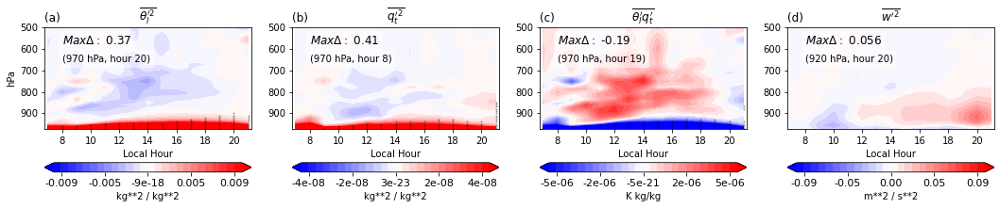

In [55]:
fig,axs = plt.subplots(1,4, figsize=(18,3.5) )
axs = axs.ravel()
fig.subplots_adjust(hspace = 0.7,bottom=0.45)

# ctrlCase = 'HMG'
# testCase = 'HTG*01'

ctrlCase = 'HMG'
testCase = 'HTG*LESmult'

# ctrlCase = 'HMG_dcOff'
# # testCase = 'HTG_dcOff'
# testCase = 'HTG*LESmult_dcOff'

ctrlDS    = hourlyMeanSCAM.sel(case=ctrlCase)
testDS    = hourlyMeanSCAM.sel(case=testCase)
diffCases = testDS - ctrlDS


## Plot difference in cases 
## - - - - - - - - - - - - - - - - - - - - - - - - -
nStep = (2*0.010)/26
cplt = axs[0].contourf(diffCases.hour.values, 
                    diffCases.levInterp.values, 
                    np.squeeze(diffCases.THLP2_CLUBB_interp.values).transpose(),
                     np.arange(-0.010, 0.010+nStep, nStep), cmap='bwr', extend='both')
# Add colorbar
ax_position = axs[0].get_position()
cbar_ax = fig.add_axes([ax_position.x0, ax_position.y0-0.18, ax_position.width, 0.04])
cbar = plt.colorbar(cplt, orientation='horizontal',cax=cbar_ax, label='kg**2 / kg**2', format='%.1g')
cbar.ax.tick_params(labelsize=11) 
cbar.ax.locator_params(nbins=5)


nStep = (2*0.4e-7)/26
cplt = axs[1].contourf(diffCases.hour.values, 
                    diffCases.levInterp.values, 
                    np.squeeze(diffCases.RTP2_CLUBB_interp.values * 1e-6).transpose(),
                    np.arange(-0.4e-7, (0.4e-7)+nStep, nStep), cmap='bwr', extend='both')
# Add colorbar
ax_position = axs[1].get_position()
cbar_ax = fig.add_axes([ax_position.x0, ax_position.y0-0.18, ax_position.width, 0.04])
cbar = plt.colorbar(cplt, orientation='horizontal',cax=cbar_ax, label='kg**2 / kg**2', format='%.1g')
cbar.ax.tick_params(labelsize=11) 
cbar.ax.locator_params(nbins=5)


nStep = (2*5e-6)/26
cplt = axs[2].contourf(diffCases.hour.values, 
                    diffCases.levInterp.values, 
                    np.squeeze(diffCases.RTPTHLP_CLUBB_interp.values * 1e-3).transpose(),
                    np.arange(-5e-6, (5e-6)+nStep, nStep), cmap='bwr', extend='both')
# Add colorbar
ax_position = axs[2].get_position()
cbar_ax = fig.add_axes([ax_position.x0, ax_position.y0-0.18, ax_position.width, 0.04])
cbar = plt.colorbar(cplt, orientation='horizontal',cax=cbar_ax, label='K kg/kg', format='%.1g')
cbar.ax.tick_params(labelsize=11) 
cbar.ax.locator_params(nbins=5)


nStep = (2*0.1)/26
cplt = axs[3].contourf(diffCases.hour.values, 
                    diffCases.levInterp.values, 
                    np.squeeze(diffCases.WP2_CLUBB_interp.values).transpose(),
                     np.arange(-0.1, 0.1+nStep, nStep), cmap='bwr', extend='both')
# Add colorbar
ax_position = axs[3].get_position()
cbar_ax = fig.add_axes([ax_position.x0, ax_position.y0-0.18, ax_position.width, 0.04])
cbar = plt.colorbar(cplt, orientation='horizontal',cax=cbar_ax, label='m**2 / s**2', format='%.2f')
cbar.ax.tick_params(labelsize=11) 
cbar.ax.locator_params(nbins=5)

# nStep = (2*5e-6)/26
# cplt = axs[4].contourf(diffCases.hour.values, 
#                     diffCases.levInterp.values, 
#                     np.squeeze(diffCases.CLDLIQ_interp.values).transpose(),
#                      np.arange(-5e-6, (5e-6)+nStep, nStep), cmap='bwr', extend='both')
# # Add colorbar
# ax_position = axs[4].get_position()
# cbar_ax = fig.add_axes([ax_position.x0, ax_position.y0-0.18, ax_position.width, 0.04])
# cbar = plt.colorbar(cplt, orientation='horizontal',cax=cbar_ax, label='kg/kg', format='%.1g')
# cbar.ax.tick_params(labelsize=11) 
# cbar.ax.locator_params(nbins=5)

## - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - 
## Add significance testing 

levSig_thlp2    = getStatSigCI(len(diffCases.hour.values), len(diffCases.levInterp.values), 'THLP2_CLUBB_interp',   ctrlCase, testCase)  
levSig_rtp2     = getStatSigCI(len(diffCases.hour.values), len(diffCases.levInterp.values), 'RTP2_CLUBB_interp',    ctrlCase, testCase)  
levSig_rtpthlp  = getStatSigCI(len(diffCases.hour.values), len(diffCases.levInterp.values), 'RTPTHLP_CLUBB_interp', ctrlCase, testCase)  
levSig_wp2     = getStatSigCI(len(diffCases.hour.values), len(diffCases.levInterp.values), 'WP2_CLUBB_interp', ctrlCase, testCase)  
levSig_cldliq  = getStatSigCI(len(diffCases.hour.values), len(diffCases.levInterp.values), 'CLDLIQ_interp',    ctrlCase, testCase)  

for iHr in range(len(diffCases.hour.values)): 
    for iLev in range(len(diffCases.levInterp.values)): 
        # Thlp2
        if levSig_thlp2[iHr, iLev]==1: 
            axs[0].plot(diffCases.hour.values[iHr], diffCases.levInterp.values[iLev],'ko',alpha=0.3,markersize=1)

        # Rtp2
        if levSig_rtp2[iHr, iLev]==1: 
            axs[1].plot(diffCases.hour.values[iHr], diffCases.levInterp.values[iLev],'ko',alpha=0.3,markersize=1)

            
        #Rtpthlp
        if levSig_rtpthlp[iHr, iLev]==1: 
            axs[2].plot(diffCases.hour.values[iHr], diffCases.levInterp.values[iLev],'ko',alpha=0.3,markersize=1)
            
        # Wp2
        if levSig_wp2[iHr, iLev]==1: 
            axs[3].plot(diffCases.hour.values[iHr], diffCases.levInterp.values[iLev],'ko',alpha=0.3,markersize=1)

#         # Cloud liquid
#         if levSig_cldliq[iHr, iLev]==1: 
#             axs[4].plot(diffCases.hour.values[iHr], diffCases.levInterp.values[iLev],'ko',alpha=0.3,markersize=1)


## - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - 


axs[0].invert_yaxis()
axs[1].invert_yaxis()
axs[2].invert_yaxis()
axs[3].invert_yaxis()
# axs[4].invert_yaxis()


axs[0].set_ylim([975, 500])
axs[1].set_ylim([975, 500])
axs[2].set_ylim([975, 500])
axs[3].set_ylim([975, 500])
# axs[4].set_ylim([975, 500])


# axs[0].set_title('THLP2_CLUBB: '+ctrlCase)
# axs[1].set_title('RTP2_CLUBB: '+ctrlCase)
# axs[2].set_title('RTPTHLP_CLUBB: '+ctrlCase)

axs[0].set_title('(a)', loc='left')
axs[0].set_title(r"$\overline{\theta_l'^2}$")

axs[1].set_title('(b)', loc='left')
axs[1].set_title(r"$\overline{q_t'^2}$")

axs[2].set_title('(c)', loc='left')
axs[2].set_title(r"$\overline{\theta_l'q_t'}$")

axs[3].set_title('(d)', loc='left')
axs[3].set_title(r"$\overline{w'^2}$")

# axs[4].set_title('(e)', loc='left')
# axs[4].set_title(r"$\overline{Cloud Liquid}$")


axs[0].set_ylabel('hPa')

axs[0].set_xlabel('Local Hour')
axs[1].set_xlabel('Local Hour')
axs[2].set_xlabel('Local Hour')
axs[3].set_xlabel('Local Hour')
# axs[4].set_xlabel('Local Hour')

axs[0].set_xlim([6.8,21.2])
axs[1].set_xlim([6.8,21.2])
axs[2].set_xlim([6.8,21.2])
axs[3].set_xlim([6.8,21.2])

axs[0].set_xticks([8,10,12,14,16,18,20])
axs[1].set_xticks([8,10,12,14,16,18,20])
axs[2].set_xticks([8,10,12,14,16,18,20])
axs[3].set_xticks([8,10,12,14,16,18,20])

thl2val,thl2hgt,thl2time = getMaxValHeightTime(diffCases, 'THLP2_CLUBB_interp', maxLev,  'levInterp','hour')
rt2val, rt2hgt, rt2time  = getMaxValHeightTime(diffCases, 'RTP2_CLUBB_interp', maxLev,  'levInterp','hour')
rtthlval,rtthlhgt, rtthltime  = getMaxValHeightTime(diffCases, 'RTPTHLP_CLUBB_interp',  maxLev, 'levInterp','hour')
w2val, w2hgt, w2time  = getMaxValHeightTime(diffCases, 'WP2_CLUBB_interp', maxLev,  'levInterp','hour')
cldval, cldhgt, cldtime  = getMaxValHeightTime(diffCases, 'CLDLIQ_interp', maxLev,  'levInterp','hour')


axs[0].text(8,580,r'$Max  \Delta:$ %.2g' % (thl2val), 
            fontfamily='sans-serif', fontsize='large').set_bbox(dict(facecolor='white', edgecolor='none', alpha=0.5))
axs[0].text(8,660,'(%i hPa, hour %i)' % (thl2hgt,thl2time), 
            fontfamily='sans-serif', fontsize='medium').set_bbox(dict(facecolor='white', edgecolor='none', alpha=0.5))

axs[1].text(8,580,r'$Max  \Delta:$ %.2g' % (rt2val), 
            fontfamily='sans-serif', fontsize='large').set_bbox(dict(facecolor='white', edgecolor='none', alpha=0.5))
axs[1].text(8,660,'(%i hPa, hour %i)' % (rt2hgt,rt2time), 
            fontfamily='sans-serif', fontsize='medium').set_bbox(dict(facecolor='white', edgecolor='none', alpha=0.5))

axs[2].text(8,580,r'$Max  \Delta:$ %.2g' % (rtthlval), 
            fontfamily='sans-serif', fontsize='large').set_bbox(dict(facecolor='white', edgecolor='none', alpha=0.5))
axs[2].text(8,660,'(%i hPa, hour %i)' % (rtthlhgt,rtthltime), 
            fontfamily='sans-serif', fontsize='medium').set_bbox(dict(facecolor='white', edgecolor='none', alpha=0.5))

axs[3].text(8,580,r'$Max  \Delta:$ %.2g' % (w2val), 
            fontfamily='sans-serif', fontsize='large').set_bbox(dict(facecolor='white', edgecolor='none', alpha=0.5))
axs[3].text(8,660,'(%i hPa, hour %i)' % (w2hgt,w2time), 
            fontfamily='sans-serif', fontsize='medium').set_bbox(dict(facecolor='white', edgecolor='none', alpha=0.5))

# axs[4].text(8,580,r'$Max  \Delta:$ %.2g' % (cldval), 
#             fontfamily='sans-serif', fontsize='large').set_bbox(dict(facecolor='white', edgecolor='none', alpha=0.5))
# axs[4].text(8,660,'(%i hPa, hour %i)' % (cldhgt, cldtime), 
#             fontfamily='sans-serif', fontsize='medium').set_bbox(dict(facecolor='white', edgecolor='none', alpha=0.5))

plt.show()

# fig.savefig('/glade/u/home/mdfowler/Analysis/SCAMvLES_figs/Fig4_paper.png')


In [46]:
for iHr in range(len(ctrlDS.hour.values)):
    iMaxLev = np.where(levSig_rtp2[iHr,:]==1)[0]
    if len(iMaxLev>=0):
        # print('Hour: %i    Max height of sig: %i' % (diffCases.hour.values[iHr], 
        #                                          diffCases.levInterp.values[iMaxLev[0]]) )
        
        ## Get max value that's statistically significant
        selDS = diffCases.isel(hour=iHr, levInterp=iMaxLev.astype(int))
        maxValTemp = np.nanmax(np.squeeze(selDS['RTP2_CLUBB_interp'].values))
        minValTemp = np.nanmin(np.squeeze(selDS['RTP2_CLUBB_interp'].values))

        if np.abs(maxValTemp)>np.abs(minValTemp):
            maxVal = maxValTemp
        elif np.abs(maxValTemp)<np.abs(minValTemp):
            maxVal = minValTemp
        else: 
            maxVal = maxValTemp

        iMax = np.where(selDS['RTP2_CLUBB_interp'].values == maxVal)
        hgtMax = selDS['levInterp'].values[iMax[1]]

        print('Max value at hour %i occurs at %i hPa and is %.2g'  % (selDS.hour.values, hgtMax, maxVal) )
    
    

Max value at hour 9 occurs at 970 hPa and is 0.085
Max value at hour 10 occurs at 960 hPa and is 0.089
Max value at hour 11 occurs at 960 hPa and is 0.14
Max value at hour 12 occurs at 950 hPa and is 0.17
Max value at hour 13 occurs at 950 hPa and is 0.18
Max value at hour 14 occurs at 940 hPa and is 0.2
Max value at hour 15 occurs at 940 hPa and is 0.23
Max value at hour 16 occurs at 940 hPa and is 0.24
Max value at hour 17 occurs at 930 hPa and is 0.23
Max value at hour 18 occurs at 930 hPa and is 0.22
Max value at hour 19 occurs at 940 hPa and is 0.21
Max value at hour 20 occurs at 940 hPa and is 0.16
Max value at hour 21 occurs at 850 hPa and is 0.062


In [47]:
for iHr in range(len(diffCases.hour.values)): 
    for iLev in range(len(diffCases.levInterp.values)): 
        # Rtp2
        if levSig_rtp2[iHr, iLev]==1: 
            axs[1].plot(diffCases.hour.values[iHr], diffCases.levInterp.values[iLev],'ko',alpha=0.3,markersize=1)
            
            print('Hour %i, lev %i is significant' % (diffCases.hour.values[iHr], diffCases.levInterp.values[iLev]) )
            

Hour 9, lev 970 is significant
Hour 10, lev 960 is significant
Hour 10, lev 970 is significant
Hour 11, lev 960 is significant
Hour 11, lev 970 is significant
Hour 12, lev 950 is significant
Hour 12, lev 960 is significant
Hour 12, lev 970 is significant
Hour 13, lev 950 is significant
Hour 13, lev 960 is significant
Hour 13, lev 970 is significant
Hour 14, lev 940 is significant
Hour 14, lev 950 is significant
Hour 14, lev 960 is significant
Hour 14, lev 970 is significant
Hour 15, lev 940 is significant
Hour 15, lev 950 is significant
Hour 15, lev 960 is significant
Hour 15, lev 970 is significant
Hour 16, lev 940 is significant
Hour 16, lev 950 is significant
Hour 16, lev 960 is significant
Hour 16, lev 970 is significant
Hour 17, lev 930 is significant
Hour 17, lev 940 is significant
Hour 17, lev 950 is significant
Hour 17, lev 960 is significant
Hour 17, lev 970 is significant
Hour 18, lev 930 is significant
Hour 18, lev 940 is significant
Hour 18, lev 950 is significant
Hour 18, 

array([65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77])

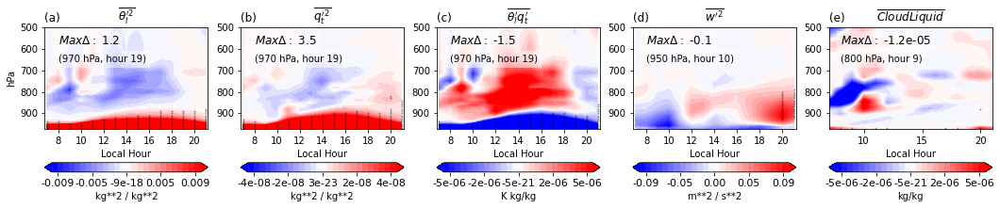

In [57]:
fig,axs = plt.subplots(1,5, figsize=(18,3.5) )
axs = axs.ravel()
fig.subplots_adjust(hspace = 0.7,bottom=0.45)

ctrlCase = 'HMG'
testCase = 'HTG*100'

# ctrlCase = 'HMG'
# testCase = 'HTG*LESmult'

# ctrlCase = 'HMG_dcOff'
# # testCase = 'HTG_dcOff'
# testCase = 'HTG*LESmult_dcOff'

ctrlDS    = hourlyMeanSCAM.sel(case=ctrlCase)
testDS    = hourlyMeanSCAM.sel(case=testCase)
diffCases = testDS - ctrlDS


## Plot difference in cases 
## - - - - - - - - - - - - - - - - - - - - - - - - -
nStep = (2*0.010)/26
cplt = axs[0].contourf(diffCases.hour.values, 
                    diffCases.levInterp.values, 
                    np.squeeze(diffCases.THLP2_CLUBB_interp.values).transpose(),
                     np.arange(-0.010, 0.010+nStep, nStep), cmap='bwr', extend='both')
# Add colorbar
ax_position = axs[0].get_position()
cbar_ax = fig.add_axes([ax_position.x0, ax_position.y0-0.18, ax_position.width, 0.04])
cbar = plt.colorbar(cplt, orientation='horizontal',cax=cbar_ax, label='kg**2 / kg**2', format='%.1g')
cbar.ax.tick_params(labelsize=11) 
cbar.ax.locator_params(nbins=5)


nStep = (2*0.4e-7)/26
cplt = axs[1].contourf(diffCases.hour.values, 
                    diffCases.levInterp.values, 
                    np.squeeze(diffCases.RTP2_CLUBB_interp.values * 1e-6).transpose(),
                    np.arange(-0.4e-7, (0.4e-7)+nStep, nStep), cmap='bwr', extend='both')
# Add colorbar
ax_position = axs[1].get_position()
cbar_ax = fig.add_axes([ax_position.x0, ax_position.y0-0.18, ax_position.width, 0.04])
cbar = plt.colorbar(cplt, orientation='horizontal',cax=cbar_ax, label='kg**2 / kg**2', format='%.1g')
cbar.ax.tick_params(labelsize=11) 
cbar.ax.locator_params(nbins=5)


nStep = (2*5e-6)/26
cplt = axs[2].contourf(diffCases.hour.values, 
                    diffCases.levInterp.values, 
                    np.squeeze(diffCases.RTPTHLP_CLUBB_interp.values * 1e-3).transpose(),
                    np.arange(-5e-6, (5e-6)+nStep, nStep), cmap='bwr', extend='both')
# Add colorbar
ax_position = axs[2].get_position()
cbar_ax = fig.add_axes([ax_position.x0, ax_position.y0-0.18, ax_position.width, 0.04])
cbar = plt.colorbar(cplt, orientation='horizontal',cax=cbar_ax, label='K kg/kg', format='%.1g')
cbar.ax.tick_params(labelsize=11) 
cbar.ax.locator_params(nbins=5)


nStep = (2*0.1)/26
cplt = axs[3].contourf(diffCases.hour.values, 
                    diffCases.levInterp.values, 
                    np.squeeze(diffCases.WP2_CLUBB_interp.values).transpose(),
                     np.arange(-0.1, 0.1+nStep, nStep), cmap='bwr', extend='both')
# Add colorbar
ax_position = axs[3].get_position()
cbar_ax = fig.add_axes([ax_position.x0, ax_position.y0-0.18, ax_position.width, 0.04])
cbar = plt.colorbar(cplt, orientation='horizontal',cax=cbar_ax, label='m**2 / s**2', format='%.2f')
cbar.ax.tick_params(labelsize=11) 
cbar.ax.locator_params(nbins=5)

nStep = (2*5e-6)/26
cplt = axs[4].contourf(diffCases.hour.values, 
                    diffCases.levInterp.values, 
                    np.squeeze(diffCases.CLDLIQ_interp.values).transpose(),
                     np.arange(-5e-6, (5e-6)+nStep, nStep), cmap='bwr', extend='both')
# Add colorbar
ax_position = axs[4].get_position()
cbar_ax = fig.add_axes([ax_position.x0, ax_position.y0-0.18, ax_position.width, 0.04])
cbar = plt.colorbar(cplt, orientation='horizontal',cax=cbar_ax, label='kg/kg', format='%.1g')
cbar.ax.tick_params(labelsize=11) 
cbar.ax.locator_params(nbins=5)

## - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - 
## Add significance testing 

levSig_thlp2    = getStatSigCI(len(diffCases.hour.values), len(diffCases.levInterp.values), 'THLP2_CLUBB_interp',   ctrlCase, testCase)  
levSig_rtp2     = getStatSigCI(len(diffCases.hour.values), len(diffCases.levInterp.values), 'RTP2_CLUBB_interp',    ctrlCase, testCase)  
levSig_rtpthlp  = getStatSigCI(len(diffCases.hour.values), len(diffCases.levInterp.values), 'RTPTHLP_CLUBB_interp', ctrlCase, testCase)  
levSig_wp2     = getStatSigCI(len(diffCases.hour.values), len(diffCases.levInterp.values), 'WP2_CLUBB_interp', ctrlCase, testCase)  
levSig_cldliq  = getStatSigCI(len(diffCases.hour.values), len(diffCases.levInterp.values), 'CLDLIQ_interp',    ctrlCase, testCase)  

for iHr in range(len(diffCases.hour.values)): 
    for iLev in range(len(diffCases.levInterp.values)): 
        # Thlp2
        if levSig_thlp2[iHr, iLev]==1: 
            axs[0].plot(diffCases.hour.values[iHr], diffCases.levInterp.values[iLev],'ko',alpha=0.3,markersize=1)

        # Rtp2
        if levSig_rtp2[iHr, iLev]==1: 
            axs[1].plot(diffCases.hour.values[iHr], diffCases.levInterp.values[iLev],'ko',alpha=0.3,markersize=1)

            
        #Rtpthlp
        if levSig_rtpthlp[iHr, iLev]==1: 
            axs[2].plot(diffCases.hour.values[iHr], diffCases.levInterp.values[iLev],'ko',alpha=0.3,markersize=1)
            
        # Wp2
        if levSig_wp2[iHr, iLev]==1: 
            axs[3].plot(diffCases.hour.values[iHr], diffCases.levInterp.values[iLev],'ko',alpha=0.3,markersize=1)

        # Cloud liquid
        if levSig_cldliq[iHr, iLev]==1: 
            axs[4].plot(diffCases.hour.values[iHr], diffCases.levInterp.values[iLev],'ko',alpha=0.3,markersize=1)


## - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - 


axs[0].invert_yaxis()
axs[1].invert_yaxis()
axs[2].invert_yaxis()
axs[3].invert_yaxis()
axs[4].invert_yaxis()


axs[0].set_ylim([975, 500])
axs[1].set_ylim([975, 500])
axs[2].set_ylim([975, 500])
axs[3].set_ylim([975, 500])
axs[4].set_ylim([975, 500])


# axs[0].set_title('THLP2_CLUBB: '+ctrlCase)
# axs[1].set_title('RTP2_CLUBB: '+ctrlCase)
# axs[2].set_title('RTPTHLP_CLUBB: '+ctrlCase)

axs[0].set_title('(a)', loc='left')
axs[0].set_title(r"$\overline{\theta_l'^2}$")

axs[1].set_title('(b)', loc='left')
axs[1].set_title(r"$\overline{q_t'^2}$")

axs[2].set_title('(c)', loc='left')
axs[2].set_title(r"$\overline{\theta_l'q_t'}$")

axs[3].set_title('(d)', loc='left')
axs[3].set_title(r"$\overline{w'^2}$")

axs[4].set_title('(e)', loc='left')
axs[4].set_title(r"$\overline{Cloud Liquid}$")


axs[0].set_ylabel('hPa')

axs[0].set_xlabel('Local Hour')
axs[1].set_xlabel('Local Hour')
axs[2].set_xlabel('Local Hour')
axs[3].set_xlabel('Local Hour')
axs[4].set_xlabel('Local Hour')

thl2val,thl2hgt,thl2time = getMaxValHeightTime(diffCases, 'THLP2_CLUBB_interp', maxLev,  'levInterp','hour')
rt2val, rt2hgt, rt2time  = getMaxValHeightTime(diffCases, 'RTP2_CLUBB_interp', maxLev,  'levInterp','hour')
rtthlval,rtthlhgt, rtthltime  = getMaxValHeightTime(diffCases, 'RTPTHLP_CLUBB_interp',  maxLev, 'levInterp','hour')
w2val, w2hgt, w2time  = getMaxValHeightTime(diffCases, 'WP2_CLUBB_interp', maxLev,  'levInterp','hour')
cldval, cldhgt, cldtime  = getMaxValHeightTime(diffCases, 'CLDLIQ_interp', maxLev,  'levInterp','hour')


axs[0].text(8,580,r'$Max  \Delta:$ %.2g' % (thl2val), 
            fontfamily='sans-serif', fontsize='large').set_bbox(dict(facecolor='white', edgecolor='none', alpha=0.5))
axs[0].text(8,660,'(%i hPa, hour %i)' % (thl2hgt,thl2time), 
            fontfamily='sans-serif', fontsize='medium').set_bbox(dict(facecolor='white', edgecolor='none', alpha=0.5))

axs[1].text(8,580,r'$Max  \Delta:$ %.2g' % (rt2val), 
            fontfamily='sans-serif', fontsize='large').set_bbox(dict(facecolor='white', edgecolor='none', alpha=0.5))
axs[1].text(8,660,'(%i hPa, hour %i)' % (rt2hgt,rt2time), 
            fontfamily='sans-serif', fontsize='medium').set_bbox(dict(facecolor='white', edgecolor='none', alpha=0.5))

axs[2].text(8,580,r'$Max  \Delta:$ %.2g' % (rtthlval), 
            fontfamily='sans-serif', fontsize='large').set_bbox(dict(facecolor='white', edgecolor='none', alpha=0.5))
axs[2].text(8,660,'(%i hPa, hour %i)' % (rtthlhgt,rtthltime), 
            fontfamily='sans-serif', fontsize='medium').set_bbox(dict(facecolor='white', edgecolor='none', alpha=0.5))

axs[3].text(8,580,r'$Max  \Delta:$ %.2g' % (w2val), 
            fontfamily='sans-serif', fontsize='large').set_bbox(dict(facecolor='white', edgecolor='none', alpha=0.5))
axs[3].text(8,660,'(%i hPa, hour %i)' % (w2hgt,w2time), 
            fontfamily='sans-serif', fontsize='medium').set_bbox(dict(facecolor='white', edgecolor='none', alpha=0.5))

axs[4].text(8,580,r'$Max  \Delta:$ %.2g' % (cldval), 
            fontfamily='sans-serif', fontsize='large').set_bbox(dict(facecolor='white', edgecolor='none', alpha=0.5))
axs[4].text(8,660,'(%i hPa, hour %i)' % (cldhgt, cldtime), 
            fontfamily='sans-serif', fontsize='medium').set_bbox(dict(facecolor='white', edgecolor='none', alpha=0.5))


axs[0].set_xlim([6.8,21.2])
axs[1].set_xlim([6.8,21.2])
axs[2].set_xlim([6.8,21.2])
axs[3].set_xlim([6.8,21.2])

axs[0].set_xticks([8,10,12,14,16,18,20])
axs[1].set_xticks([8,10,12,14,16,18,20])
axs[2].set_xticks([8,10,12,14,16,18,20])
axs[3].set_xticks([8,10,12,14,16,18,20])

plt.show()

# fig.savefig('/glade/u/home/mdfowler/Analysis/SCAMvLES_figs/Fig4_paper.png')


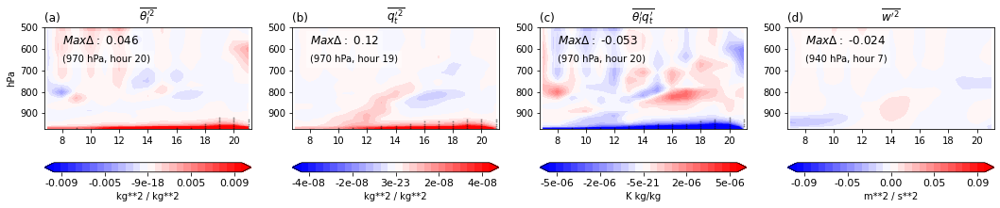

In [59]:
fig,axs = plt.subplots(1,4, figsize=(18,3.5) )
axs = axs.ravel()
fig.subplots_adjust(hspace = 0.7,bottom=0.45)

# ctrlCase = 'HMG'
# testCase = 'HTG*01'

# ctrlCase = 'HMG'
# testCase = 'HTG*LESmult'

ctrlCase = 'HMG_dcOff'
testCase = 'HTG_dcOff'
# testCase = 'HTG*LESmult_dcOff'

ctrlDS    = hourlyMeanSCAM.sel(case=ctrlCase)
testDS    = hourlyMeanSCAM.sel(case=testCase)
diffCases = testDS - ctrlDS


## Plot difference in cases 
## - - - - - - - - - - - - - - - - - - - - - - - - -
nStep = (2*0.010)/26
cplt = axs[0].contourf(diffCases.hour.values, 
                    diffCases.levInterp.values, 
                    np.squeeze(diffCases.THLP2_CLUBB_interp.values).transpose(),
                     np.arange(-0.010, 0.010+nStep, nStep), cmap='bwr', extend='both')
# Add colorbar
ax_position = axs[0].get_position()
cbar_ax = fig.add_axes([ax_position.x0, ax_position.y0-0.18, ax_position.width, 0.04])
cbar = plt.colorbar(cplt, orientation='horizontal',cax=cbar_ax, label='kg**2 / kg**2', format='%.1g')
cbar.ax.tick_params(labelsize=11) 
cbar.ax.locator_params(nbins=5)


nStep = (2*0.4e-7)/26
cplt = axs[1].contourf(diffCases.hour.values, 
                    diffCases.levInterp.values, 
                    np.squeeze(diffCases.RTP2_CLUBB_interp.values * 1e-6).transpose(),
                    np.arange(-0.4e-7, (0.4e-7)+nStep, nStep), cmap='bwr', extend='both')
# Add colorbar
ax_position = axs[1].get_position()
cbar_ax = fig.add_axes([ax_position.x0, ax_position.y0-0.18, ax_position.width, 0.04])
cbar = plt.colorbar(cplt, orientation='horizontal',cax=cbar_ax, label='kg**2 / kg**2', format='%.1g')
cbar.ax.tick_params(labelsize=11) 
cbar.ax.locator_params(nbins=5)


nStep = (2*5e-6)/26
cplt = axs[2].contourf(diffCases.hour.values, 
                    diffCases.levInterp.values, 
                    np.squeeze(diffCases.RTPTHLP_CLUBB_interp.values * 1e-3).transpose(),
                    np.arange(-5e-6, (5e-6)+nStep, nStep), cmap='bwr', extend='both')
# Add colorbar
ax_position = axs[2].get_position()
cbar_ax = fig.add_axes([ax_position.x0, ax_position.y0-0.18, ax_position.width, 0.04])
cbar = plt.colorbar(cplt, orientation='horizontal',cax=cbar_ax, label='K kg/kg', format='%.1g')
cbar.ax.tick_params(labelsize=11) 
cbar.ax.locator_params(nbins=5)


nStep = (2*0.1)/26
cplt = axs[3].contourf(diffCases.hour.values, 
                    diffCases.levInterp.values, 
                    np.squeeze(diffCases.WP2_CLUBB_interp.values).transpose(),
                     np.arange(-0.1, 0.1+nStep, nStep), cmap='bwr', extend='both')
# Add colorbar
ax_position = axs[3].get_position()
cbar_ax = fig.add_axes([ax_position.x0, ax_position.y0-0.18, ax_position.width, 0.04])
cbar = plt.colorbar(cplt, orientation='horizontal',cax=cbar_ax, label='m**2 / s**2', format='%.2f')
cbar.ax.tick_params(labelsize=11) 
cbar.ax.locator_params(nbins=5)

# nStep = (2*5e-6)/26
# cplt = axs[4].contourf(diffCases.hour.values, 
#                     diffCases.levInterp.values, 
#                     np.squeeze(diffCases.CLDLIQ_interp.values).transpose(),
#                      np.arange(-5e-6, (5e-6)+nStep, nStep), cmap='bwr', extend='both')
# # Add colorbar
# ax_position = axs[4].get_position()
# cbar_ax = fig.add_axes([ax_position.x0, ax_position.y0-0.18, ax_position.width, 0.04])
# cbar = plt.colorbar(cplt, orientation='horizontal',cax=cbar_ax, label='kg/kg', format='%.1g')
# cbar.ax.tick_params(labelsize=11) 
# cbar.ax.locator_params(nbins=5)


## - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - 
## Add significance testing 

levSig_thlp2    = getStatSigCI(len(diffCases.hour.values), len(diffCases.levInterp.values), 'THLP2_CLUBB_interp',   ctrlCase, testCase)  
levSig_rtp2     = getStatSigCI(len(diffCases.hour.values), len(diffCases.levInterp.values), 'RTP2_CLUBB_interp',    ctrlCase, testCase)  
levSig_rtpthlp  = getStatSigCI(len(diffCases.hour.values), len(diffCases.levInterp.values), 'RTPTHLP_CLUBB_interp', ctrlCase, testCase)  
levSig_wp2     = getStatSigCI(len(diffCases.hour.values), len(diffCases.levInterp.values), 'WP2_CLUBB_interp', ctrlCase, testCase)  
levSig_cldliq  = getStatSigCI(len(diffCases.hour.values), len(diffCases.levInterp.values), 'CLDLIQ_interp',    ctrlCase, testCase)  

for iHr in range(len(diffCases.hour.values)): 
    for iLev in range(len(diffCases.levInterp.values)): 
        # Thlp2
        if levSig_thlp2[iHr, iLev]==1: 
            axs[0].plot(diffCases.hour.values[iHr], diffCases.levInterp.values[iLev],'ko',alpha=0.3,markersize=1)

        # Rtp2
        if levSig_rtp2[iHr, iLev]==1: 
            axs[1].plot(diffCases.hour.values[iHr], diffCases.levInterp.values[iLev],'ko',alpha=0.3,markersize=1)

            
        #Rtpthlp
        if levSig_rtpthlp[iHr, iLev]==1: 
            axs[2].plot(diffCases.hour.values[iHr], diffCases.levInterp.values[iLev],'ko',alpha=0.3,markersize=1)
            
        # Wp2
        if levSig_wp2[iHr, iLev]==1: 
            axs[3].plot(diffCases.hour.values[iHr], diffCases.levInterp.values[iLev],'ko',alpha=0.3,markersize=1)

        # # Cloud liquid
        # if levSig_cldliq[iHr, iLev]==1: 
        #     axs[4].plot(diffCases.hour.values[iHr], diffCases.levInterp.values[iLev],'ko',alpha=0.3,markersize=1)


## - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - 


axs[0].invert_yaxis()
axs[1].invert_yaxis()
axs[2].invert_yaxis()
axs[3].invert_yaxis()
# axs[4].invert_yaxis()


axs[0].set_ylim([975, 500])
axs[1].set_ylim([975, 500])
axs[2].set_ylim([975, 500])
axs[3].set_ylim([975, 500])
# axs[4].set_ylim([975, 500])


# axs[0].set_title('THLP2_CLUBB: '+ctrlCase)
# axs[1].set_title('RTP2_CLUBB: '+ctrlCase)
# axs[2].set_title('RTPTHLP_CLUBB: '+ctrlCase)

axs[0].set_title('(a)', loc='left')
axs[0].set_title(r"$\overline{\theta_l'^2}$")

axs[1].set_title('(b)', loc='left')
axs[1].set_title(r"$\overline{q_t'^2}$")

axs[2].set_title('(c)', loc='left')
axs[2].set_title(r"$\overline{\theta_l'q_t'}$")

axs[3].set_title('(d)', loc='left')
axs[3].set_title(r"$\overline{w'^2}$")

# axs[4].set_title('(e)', loc='left')
# axs[4].set_title(r"$\overline{Cloud Liquid}$")


axs[0].set_ylabel('hPa')

thl2val,thl2hgt,thl2time = getMaxValHeightTime(diffCases, 'THLP2_CLUBB_interp', maxLev, 'levInterp','hour')
rt2val, rt2hgt, rt2time  = getMaxValHeightTime(diffCases, 'RTP2_CLUBB_interp',maxLev, 'levInterp','hour')
rtthlval,rtthlhgt, rtthltime  = getMaxValHeightTime(diffCases, 'RTPTHLP_CLUBB_interp',maxLev, 'levInterp','hour')
w2val, w2hgt, w2time  = getMaxValHeightTime(diffCases, 'WP2_CLUBB_interp',maxLev, 'levInterp','hour')
cldval, cldhgt, cldtime  = getMaxValHeightTime(diffCases, 'CLDLIQ_interp',maxLev, 'levInterp','hour')


axs[0].text(8,580,r'$Max  \Delta:$ %.2g' % (thl2val), 
            fontfamily='sans-serif', fontsize='large').set_bbox(dict(facecolor='white', edgecolor='none', alpha=0.5))
axs[0].text(8,660,'(%i hPa, hour %i)' % (thl2hgt,thl2time), 
            fontfamily='sans-serif', fontsize='medium').set_bbox(dict(facecolor='white', edgecolor='none', alpha=0.5))

axs[1].text(8,580,r'$Max  \Delta:$ %.2g' % (rt2val), 
            fontfamily='sans-serif', fontsize='large').set_bbox(dict(facecolor='white', edgecolor='none', alpha=0.5))
axs[1].text(8,660,'(%i hPa, hour %i)' % (rt2hgt,rt2time), 
            fontfamily='sans-serif', fontsize='medium').set_bbox(dict(facecolor='white', edgecolor='none', alpha=0.5))

axs[2].text(8,580,r'$Max  \Delta:$ %.2g' % (rtthlval), 
            fontfamily='sans-serif', fontsize='large').set_bbox(dict(facecolor='white', edgecolor='none', alpha=0.5))
axs[2].text(8,660,'(%i hPa, hour %i)' % (rtthlhgt,rtthltime), 
            fontfamily='sans-serif', fontsize='medium').set_bbox(dict(facecolor='white', edgecolor='none', alpha=0.5))

axs[3].text(8,580,r'$Max  \Delta:$ %.2g' % (w2val), 
            fontfamily='sans-serif', fontsize='large').set_bbox(dict(facecolor='white', edgecolor='none', alpha=0.5))
axs[3].text(8,660,'(%i hPa, hour %i)' % (w2hgt,w2time), 
            fontfamily='sans-serif', fontsize='medium').set_bbox(dict(facecolor='white', edgecolor='none', alpha=0.5))

# axs[4].text(8,580,r'$Max  \Delta:$ %.2g' % (cldval), 
#             fontfamily='sans-serif', fontsize='large').set_bbox(dict(facecolor='white', edgecolor='none', alpha=0.5))
# axs[4].text(8,660,'(%i hPa, hour %i)' % (cldhgt, cldtime), 
#             fontfamily='sans-serif', fontsize='medium').set_bbox(dict(facecolor='white', edgecolor='none', alpha=0.5))



axs[0].set_xlim([6.8,21.2])
axs[1].set_xlim([6.8,21.2])
axs[2].set_xlim([6.8,21.2])
axs[3].set_xlim([6.8,21.2])

axs[0].set_xticks([8,10,12,14,16,18,20])
axs[1].set_xticks([8,10,12,14,16,18,20])
axs[2].set_xticks([8,10,12,14,16,18,20])
axs[3].set_xticks([8,10,12,14,16,18,20])

# axs[0].set_xlabel('Local Hour')
# axs[1].set_xlabel('Local Hour')
# axs[2].set_xlabel('Local Hour')
# axs[3].set_xlabel('Local Hour')
# axs[4].set_xlabel('Local Hour')

plt.show()

# fig.savefig('/glade/u/home/mdfowler/Analysis/SCAMvLES_figs/Fig5a_paper.png')



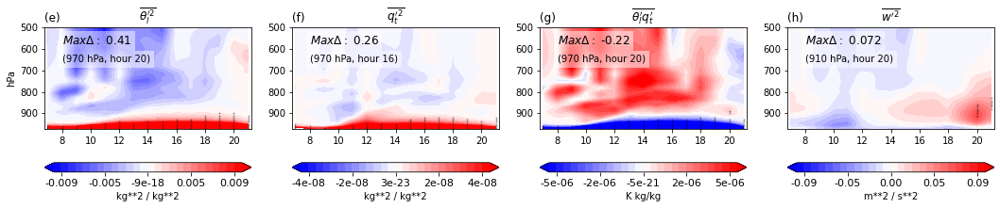

In [60]:
fig,axs = plt.subplots(1,4, figsize=(18,3.5) )
axs = axs.ravel()
fig.subplots_adjust(hspace = 0.7,bottom=0.45)

# ctrlCase = 'HMG'
# testCase = 'HTG*01'

# ctrlCase = 'HMG'
# testCase = 'HTG*LESmult'

ctrlCase = 'HMG_dcOff'
# testCase = 'HTG_dcOff'
testCase = 'HTG*LESmult_dcOff'

ctrlDS    = hourlyMeanSCAM.sel(case=ctrlCase)
testDS    = hourlyMeanSCAM.sel(case=testCase)
diffCases = testDS - ctrlDS


## Plot difference in cases 
## - - - - - - - - - - - - - - - - - - - - - - - - -
nStep = (2*0.010)/26
cplt = axs[0].contourf(diffCases.hour.values, 
                    diffCases.levInterp.values, 
                    np.squeeze(diffCases.THLP2_CLUBB_interp.values).transpose(),
                     np.arange(-0.010, 0.010+nStep, nStep), cmap='bwr', extend='both')
# Add colorbar
ax_position = axs[0].get_position()
cbar_ax = fig.add_axes([ax_position.x0, ax_position.y0-0.18, ax_position.width, 0.04])
cbar = plt.colorbar(cplt, orientation='horizontal',cax=cbar_ax, label='kg**2 / kg**2', format='%.1g')
cbar.ax.tick_params(labelsize=11) 
cbar.ax.locator_params(nbins=5)


nStep = (2*0.4e-7)/26
cplt = axs[1].contourf(diffCases.hour.values, 
                    diffCases.levInterp.values, 
                    np.squeeze(diffCases.RTP2_CLUBB_interp.values * 1e-6).transpose(),
                    np.arange(-0.4e-7, (0.4e-7)+nStep, nStep), cmap='bwr', extend='both')
# Add colorbar
ax_position = axs[1].get_position()
cbar_ax = fig.add_axes([ax_position.x0, ax_position.y0-0.18, ax_position.width, 0.04])
cbar = plt.colorbar(cplt, orientation='horizontal',cax=cbar_ax, label='kg**2 / kg**2', format='%.1g')
cbar.ax.tick_params(labelsize=11) 
cbar.ax.locator_params(nbins=5)


nStep = (2*5e-6)/26
cplt = axs[2].contourf(diffCases.hour.values, 
                    diffCases.levInterp.values, 
                    np.squeeze(diffCases.RTPTHLP_CLUBB_interp.values * 1e-3).transpose(),
                    np.arange(-5e-6, (5e-6)+nStep, nStep), cmap='bwr', extend='both')
# Add colorbar
ax_position = axs[2].get_position()
cbar_ax = fig.add_axes([ax_position.x0, ax_position.y0-0.18, ax_position.width, 0.04])
cbar = plt.colorbar(cplt, orientation='horizontal',cax=cbar_ax, label='K kg/kg', format='%.1g')
cbar.ax.tick_params(labelsize=11) 
cbar.ax.locator_params(nbins=5)


nStep = (2*0.1)/26
cplt = axs[3].contourf(diffCases.hour.values, 
                    diffCases.levInterp.values, 
                    np.squeeze(diffCases.WP2_CLUBB_interp.values).transpose(),
                     np.arange(-0.1, 0.1+nStep, nStep), cmap='bwr', extend='both')
# Add colorbar
ax_position = axs[3].get_position()
cbar_ax = fig.add_axes([ax_position.x0, ax_position.y0-0.18, ax_position.width, 0.04])
cbar = plt.colorbar(cplt, orientation='horizontal',cax=cbar_ax, label='m**2 / s**2', format='%.2f')
cbar.ax.tick_params(labelsize=11) 
cbar.ax.locator_params(nbins=5)

# nStep = (2*5e-6)/26
# cplt = axs[4].contourf(diffCases.hour.values, 
#                     diffCases.levInterp.values, 
#                     np.squeeze(diffCases.CLDLIQ_interp.values).transpose(),
#                      np.arange(-5e-6, (5e-6)+nStep, nStep), cmap='bwr', extend='both')
# # Add colorbar
# ax_position = axs[4].get_position()
# cbar_ax = fig.add_axes([ax_position.x0, ax_position.y0-0.18, ax_position.width, 0.04])
# cbar = plt.colorbar(cplt, orientation='horizontal',cax=cbar_ax, label='kg/kg', format='%.1g')
# cbar.ax.tick_params(labelsize=11) 
# cbar.ax.locator_params(nbins=5)


## - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - 
## Add significance testing 

levSig_thlp2    = getStatSigCI(len(diffCases.hour.values), len(diffCases.levInterp.values), 'THLP2_CLUBB_interp',   ctrlCase, testCase)  
levSig_rtp2     = getStatSigCI(len(diffCases.hour.values), len(diffCases.levInterp.values), 'RTP2_CLUBB_interp',    ctrlCase, testCase)  
levSig_rtpthlp  = getStatSigCI(len(diffCases.hour.values), len(diffCases.levInterp.values), 'RTPTHLP_CLUBB_interp', ctrlCase, testCase)  
levSig_wp2     = getStatSigCI(len(diffCases.hour.values), len(diffCases.levInterp.values), 'WP2_CLUBB_interp', ctrlCase, testCase)  
levSig_cldliq  = getStatSigCI(len(diffCases.hour.values), len(diffCases.levInterp.values), 'CLDLIQ_interp',    ctrlCase, testCase)  

for iHr in range(len(diffCases.hour.values)): 
    for iLev in range(len(diffCases.levInterp.values)): 
        # Thlp2
        if levSig_thlp2[iHr, iLev]==1: 
            axs[0].plot(diffCases.hour.values[iHr], diffCases.levInterp.values[iLev],'ko',alpha=0.3,markersize=1)

        # Rtp2
        if levSig_rtp2[iHr, iLev]==1: 
            axs[1].plot(diffCases.hour.values[iHr], diffCases.levInterp.values[iLev],'ko',alpha=0.3,markersize=1)

            
        #Rtpthlp
        if levSig_rtpthlp[iHr, iLev]==1: 
            axs[2].plot(diffCases.hour.values[iHr], diffCases.levInterp.values[iLev],'ko',alpha=0.3,markersize=1)
            
        # Wp2
        if levSig_wp2[iHr, iLev]==1: 
            axs[3].plot(diffCases.hour.values[iHr], diffCases.levInterp.values[iLev],'ko',alpha=0.3,markersize=1)

        # # Cloud liquid
        # if levSig_cldliq[iHr, iLev]==1: 
        #     axs[4].plot(diffCases.hour.values[iHr], diffCases.levInterp.values[iLev],'ko',alpha=0.3,markersize=1)


## - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - 


axs[0].invert_yaxis()
axs[1].invert_yaxis()
axs[2].invert_yaxis()
axs[3].invert_yaxis()
# axs[4].invert_yaxis()


axs[0].set_ylim([975, 500])
axs[1].set_ylim([975, 500])
axs[2].set_ylim([975, 500])
axs[3].set_ylim([975, 500])
# axs[4].set_ylim([975, 500])


# axs[0].set_title('THLP2_CLUBB: '+ctrlCase)
# axs[1].set_title('RTP2_CLUBB: '+ctrlCase)
# axs[2].set_title('RTPTHLP_CLUBB: '+ctrlCase)

axs[0].set_title('(e)', loc='left')
axs[0].set_title(r"$\overline{\theta_l'^2}$")

axs[1].set_title('(f)', loc='left')
axs[1].set_title(r"$\overline{q_t'^2}$")

axs[2].set_title('(g)', loc='left')
axs[2].set_title(r"$\overline{\theta_l'q_t'}$")

axs[3].set_title('(h)', loc='left')
axs[3].set_title(r"$\overline{w'^2}$")

# axs[4].set_title('(e)', loc='left')
# axs[4].set_title(r"$\overline{Cloud Liquid}$")


axs[0].set_ylabel('hPa')

thl2val,thl2hgt,thl2time = getMaxValHeightTime(diffCases, 'THLP2_CLUBB_interp', maxLev, 'levInterp','hour')
rt2val, rt2hgt, rt2time  = getMaxValHeightTime(diffCases, 'RTP2_CLUBB_interp',maxLev, 'levInterp','hour')
rtthlval,rtthlhgt, rtthltime  = getMaxValHeightTime(diffCases, 'RTPTHLP_CLUBB_interp',maxLev, 'levInterp','hour')
w2val, w2hgt, w2time  = getMaxValHeightTime(diffCases, 'WP2_CLUBB_interp',maxLev, 'levInterp','hour')
cldval, cldhgt, cldtime  = getMaxValHeightTime(diffCases, 'CLDLIQ_interp',maxLev, 'levInterp','hour')


axs[0].text(8,580,r'$Max  \Delta:$ %.2g' % (thl2val), 
            fontfamily='sans-serif', fontsize='large').set_bbox(dict(facecolor='white', edgecolor='none', alpha=0.5))
axs[0].text(8,660,'(%i hPa, hour %i)' % (thl2hgt,thl2time), 
            fontfamily='sans-serif', fontsize='medium').set_bbox(dict(facecolor='white', edgecolor='none', alpha=0.5))

axs[1].text(8,580,r'$Max  \Delta:$ %.2g' % (rt2val), 
            fontfamily='sans-serif', fontsize='large').set_bbox(dict(facecolor='white', edgecolor='none', alpha=0.5))
axs[1].text(8,660,'(%i hPa, hour %i)' % (rt2hgt,rt2time), 
            fontfamily='sans-serif', fontsize='medium').set_bbox(dict(facecolor='white', edgecolor='none', alpha=0.5))

axs[2].text(8,580,r'$Max  \Delta:$ %.2g' % (rtthlval), 
            fontfamily='sans-serif', fontsize='large').set_bbox(dict(facecolor='white', edgecolor='none', alpha=0.5))
axs[2].text(8,660,'(%i hPa, hour %i)' % (rtthlhgt,rtthltime), 
            fontfamily='sans-serif', fontsize='medium').set_bbox(dict(facecolor='white', edgecolor='none', alpha=0.5))

axs[3].text(8,580,r'$Max  \Delta:$ %.2g' % (w2val), 
            fontfamily='sans-serif', fontsize='large').set_bbox(dict(facecolor='white', edgecolor='none', alpha=0.5))
axs[3].text(8,660,'(%i hPa, hour %i)' % (w2hgt,w2time), 
            fontfamily='sans-serif', fontsize='medium').set_bbox(dict(facecolor='white', edgecolor='none', alpha=0.5))

# axs[4].text(8,580,r'$Max  \Delta:$ %.2g' % (cldval), 
#             fontfamily='sans-serif', fontsize='large').set_bbox(dict(facecolor='white', edgecolor='none', alpha=0.5))
# axs[4].text(8,660,'(%i hPa, hour %i)' % (cldhgt, cldtime), 
#             fontfamily='sans-serif', fontsize='medium').set_bbox(dict(facecolor='white', edgecolor='none', alpha=0.5))



axs[0].set_xlim([6.8,21.2])
axs[1].set_xlim([6.8,21.2])
axs[2].set_xlim([6.8,21.2])
axs[3].set_xlim([6.8,21.2])

axs[0].set_xticks([8,10,12,14,16,18,20])
axs[1].set_xticks([8,10,12,14,16,18,20])
axs[2].set_xticks([8,10,12,14,16,18,20])
axs[3].set_xticks([8,10,12,14,16,18,20])

# axs[0].set_xlabel('Local Hour')
# axs[1].set_xlabel('Local Hour')
# axs[2].set_xlabel('Local Hour')
# axs[3].set_xlabel('Local Hour')
# axs[4].set_xlabel('Local Hour')

plt.show()

# fig.savefig('/glade/u/home/mdfowler/Analysis/SCAMvLES_figs/Fig5a_paper.png')



In [136]:
for iHr in range(len(ctrlDS.hour.values)):
    iMaxLev = np.where(levSig_thlp2[iHr,:]==1)[0]
    if len(iMaxLev>=0):
        print('Hour: %i    Max height of sig: %i' % (diffCases.hour.values[iHr], 
                                                 diffCases.levInterp.values[iMaxLev[0]]) )
    
    

Hour: 7    Max height of sig: 960
Hour: 8    Max height of sig: 960
Hour: 9    Max height of sig: 960
Hour: 10    Max height of sig: 960
Hour: 11    Max height of sig: 950
Hour: 12    Max height of sig: 940
Hour: 13    Max height of sig: 950
Hour: 14    Max height of sig: 940
Hour: 15    Max height of sig: 940
Hour: 16    Max height of sig: 930
Hour: 17    Max height of sig: 930
Hour: 18    Max height of sig: 910
Hour: 19    Max height of sig: 900
Hour: 20    Max height of sig: 900
Hour: 21    Max height of sig: 910


In [137]:
for iHr in range(len(ctrlDS.hour.values)):
    iMaxLev = np.where(levSig_rtp2[iHr,:]==1)[0]
    if len(iMaxLev>=0):
        print('Hour: %i    Max height of sig: %i' % (diffCases.hour.values[iHr], 
                                                 diffCases.levInterp.values[iMaxLev[0]]) )
    
    

Hour: 7    Max height of sig: 950
Hour: 8    Max height of sig: 960
Hour: 9    Max height of sig: 970
Hour: 10    Max height of sig: 970
Hour: 11    Max height of sig: 960
Hour: 12    Max height of sig: 950
Hour: 13    Max height of sig: 950
Hour: 14    Max height of sig: 950
Hour: 15    Max height of sig: 930
Hour: 16    Max height of sig: 920
Hour: 17    Max height of sig: 920
Hour: 18    Max height of sig: 920
Hour: 19    Max height of sig: 930
Hour: 20    Max height of sig: 940
Hour: 21    Max height of sig: 920


In [ ]:
for iHr in range(len(ctrlDS.hour.values)):
    iMaxLev = np.where(levSig_wp2[iHr,:]==1)[0]
    if len(iMaxLev>=0):
        print('Hour: %i    Max height of sig: %i' % (diffCases.hour.values[iHr], 
                                                 diffCases.levInterp.values[iMaxLev[0]]) )
    
    

*LES*

In [72]:
def getMaxValHeightTime_LES(DS,varName, levArr, maxLev, timeName):
    
    # Select levels of interest (varies by hour) 
    limitVar = np.full([np.shape(levArr)[0], np.shape(levArr)[2]], np.nan)

    for iHr in range(len(DS['hour'].values)): 
        maxVal = np.where(levArr.sel(case='HMG')[iHr,:]>=500)[0]
        limitVar[iHr,maxVal.astype(int)] = DS[varName].values[iHr,maxVal.astype(int)]
    
    
    
    maxValTemp = np.nanmax(np.squeeze(limitVar))
    minValTemp = np.nanmin(np.squeeze(limitVar))
    
    if np.abs(maxValTemp)>np.abs(minValTemp):
        maxVal = maxValTemp
    elif np.abs(maxValTemp)<np.abs(minValTemp):
        maxVal = minValTemp
    else: 
        maxVal = maxValTemp
        
    iMax    = np.where(DS[varName].values == maxVal)
    hgtMax  = levArr.sel(case='HMG').values[iMax[0], iMax[1]]
    timeMax = DS[timeName].values[iMax[0]]
    
    return maxVal, hgtMax, timeMax

In [63]:
# tstCase = hgtAx.sel(case='HMG')

# limitVar = np.full([len(ctrlDS['hour'].values), len(ctrlDS.k.values)], np.nan)

# for iHr in range(len(ctrlDS['hour'].values)): 
#     maxVal = np.where(tstCase[iHr,:]>=500)[0]
#     # print(tstCase[iHr,maxVal.astype(int)])
    
#     limitVar[iHr,maxVal.astype(int)] = ctrlDS['qv2'].values[iHr,maxVal.astype(int)]

# maxVal = np.nanmax(limitVar)

# iMax    = np.where(ctrlDS['qv2'].values == maxVal)
# hgtMax  = hgtAx.sel(case='HMG').values[iMax[0], iMax[1]]
# timeMax = ctrlDS['hour'].values[iMax[0]]

# print('Max: %.2g\nLev: %i\nHour: %i' % (ctrlDS['qv2'].values[iMax], hgtMax, timeMax) )


In [64]:
hrLES_newDefault = LES_newDefault.groupby('Time.hour').mean(dim='Time')
hrLES_moments    = LES_allDays_allVarsHr.groupby('time.hour').mean(dim='time')

## Get time array to be 2D as well, so we can directly contourf the height, not using the mean value
hrArr_2d     = np.transpose( np.tile(hrLES_newDefault.hour.values, (226,1) ) )
hrArr_2d_227 = np.transpose( np.tile(hrLES_newDefault.hour.values, (227,1) ) )

## Get height axis
hgtAx = hrLES_newDefault.AVP_P * 1e-2

## Get hourly mean SCAM 
hrLESstd_newDefault       = LES_newDefault.groupby('Time.hour').std(dim='Time')
hrLESstd_moments          = LES_allDays_allVarsHr.groupby('time.hour').std(dim='time')

hourlyCountLES_newDefault = LES_newDefault.groupby('Time.hour').count(dim='Time')
hourlyCountLES_moments    = LES_allDays_allVarsHr.groupby('time.hour').count(dim='time')


hourlySE_LESdefault = hrLESstd_newDefault/np.sqrt(hourlyCountLES_newDefault)
hourlySE_LESmoments = hrLESstd_moments/np.sqrt(hourlyCountLES_moments)

## Add significance testing 
CIlevel = 1.960   ## 95% CI
# CIlevel = 1.645   ## 90% CI

CI_LESdefault = CIlevel*hourlySE_LESdefault
CI_LESmoments = CIlevel*hourlySE_LESmoments

lowCI_LESdefault = hrLES_newDefault - CI_LESdefault
hghCI_LESdefault = hrLES_newDefault + CI_LESdefault

lowCI_LESmoments = hrLES_moments - CI_LESmoments
hghCI_LESmoments = hrLES_moments + CI_LESmoments

def getStatSigCI_LES(lowCI_DS, highCI_DS, nTimes, nLevs, varSel, ctrlCase, testCase): 

    ## Get ranges for each case's CI 
    ctrlDS_lowCI    = lowCI_DS.sel(case=ctrlCase)[varSel]
    testDS_lowCI    = lowCI_DS.sel(case=testCase)[varSel]

    ctrlDS_hghCI    = highCI_DS.sel(case=ctrlCase)[varSel]
    testDS_hghCI    = highCI_DS.sel(case=testCase)[varSel]

    levSig = np.full([nTimes, nLevs], np.nan)

    for iHr in range(nTimes): 
        for iLev in range(nLevs):

            # Not significant range?
            if ( (testDS_lowCI.values[iHr,iLev] >= ctrlDS_lowCI.values[iHr,iLev]) & (testDS_lowCI.values[iHr,iLev] <= ctrlDS_hghCI.values[iHr,iLev]) ): 
                levSig[iHr,iLev]  = 0 
            elif ( (testDS_hghCI.values[iHr,iLev] >= ctrlDS_lowCI.values[iHr,iLev]) & (testDS_hghCI.values[iHr,iLev] <= ctrlDS_hghCI.values[iHr,iLev]) ): 
                levSig[iHr,iLev]  = 0 
            
            elif ( (ctrlDS_lowCI.values[iHr,iLev] >= testDS_lowCI.values[iHr,iLev]) & (ctrlDS_lowCI.values[iHr,iLev] <= testDS_hghCI.values[iHr,iLev]) ): 
                levSig[iHr,iLev]  = 0 
            elif ( (ctrlDS_hghCI.values[iHr,iLev] >= testDS_lowCI.values[iHr,iLev]) & (ctrlDS_hghCI.values[iHr,iLev] <= testDS_hghCI.values[iHr,iLev]) ): 
                levSig[iHr,iLev]  = 0            
            
            
            else:
                levSig[iHr, iLev] = 1 
    
    return levSig



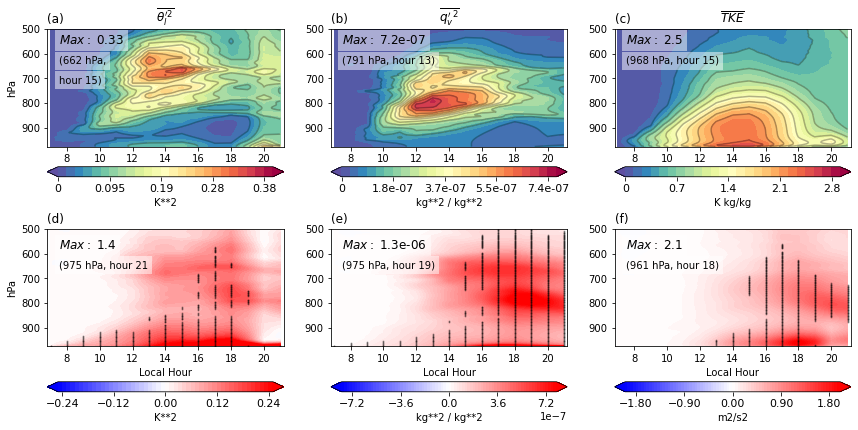

In [66]:
fig,axs = plt.subplots(2,3, figsize=(14.4,7) )
axs = axs.ravel()
fig.subplots_adjust(hspace = 0.7,bottom=0.25)

ctrlCase = 'HMG'
testCase = 'HTG'

ctrlDS    = hrLES_moments.sel(case=ctrlCase)
testDS    = hrLES_moments.sel(case=testCase)
diffCases = testDS - ctrlDS

ctrlDSv2    = hrLES_newDefault.sel(case=ctrlCase)
testDSv2    = hrLES_newDefault.sel(case=testCase)
diffCasesv2 = testDSv2 - ctrlDSv2

## Plot control cases 
## - - - - - - - - - - - - - - - - - - - - - - - - -
cplt = axs[0].contourf(hrArr_2d, 
                hgtAx.sel(case='HMG').values, 
                np.squeeze(ctrlDS.thl2.values),
                np.arange(0.0, 0.41, (0.41-0)/26), cmap='Spectral_r', extend='both')
# Add colorbar
ax_position = axs[0].get_position()
cbar_ax = fig.add_axes([ax_position.x0, ax_position.y0-0.06, ax_position.width, 0.02])
cbar = plt.colorbar(cplt, orientation='horizontal',cax=cbar_ax, label='K**2',format='%.2g')
cbar.ax.tick_params(labelsize=11) 
cbar.ax.locator_params(nbins=5)
# Add contour lines
cplt = axs[0].contour(hrArr_2d, 
                hgtAx.sel(case='HMG').values, 
                np.squeeze(ctrlDS.thl2.values),
                np.arange(0.0, 0.41, (0.41-0)/26)[::2], colors='k', alpha=0.3)


cplt = axs[1].contourf(hrArr_2d, 
                hgtAx.sel(case='HMG').values, 
                np.squeeze(ctrlDS.qv2.values),
                np.arange(0.0, 0.8e-6, (0.8e-6)/26), cmap='Spectral_r', extend='both')
# Add colorbar
ax_position = axs[1].get_position()
cbar_ax = fig.add_axes([ax_position.x0, ax_position.y0-0.06, ax_position.width, 0.02])
cbar = plt.colorbar(cplt, orientation='horizontal',cax=cbar_ax, label='kg**2 / kg**2',format='%.2g')
cbar.ax.tick_params(labelsize=11) 
cbar.ax.locator_params(nbins=5)
# Add contour lines 
cplt = axs[1].contour(hrArr_2d, 
                hgtAx.sel(case='HMG').values, 
                np.squeeze(ctrlDS.qv2.values),
                np.arange(0.0, 0.8e-6, (0.8e-6)/26)[::2], colors='k', alpha=0.3)


cplt = axs[2].contourf(hrArr_2d, 
                hgtAx.sel(case='HMG').values, 
                np.squeeze(ctrlDS.TKE_total.values)*0.5,   ## Actual TKE equation is 0.5*(u'2+v'2+w'2)
                np.arange(0, 3.05, (3.05-0.0)/26), cmap='Spectral_r', extend='both')
# Add colorbar
ax_position = axs[2].get_position()
cbar_ax = fig.add_axes([ax_position.x0, ax_position.y0-0.06, ax_position.width, 0.02])
cbar = plt.colorbar(cplt, orientation='horizontal',cax=cbar_ax, label='K kg/kg',format='%.2g')
cbar.ax.tick_params(labelsize=11) 
cbar.ax.locator_params(nbins=5)
# Add contour lines
cplt = axs[2].contour(hrArr_2d, 
                hgtAx.sel(case='HMG').values, 
                np.squeeze(ctrlDS.TKE_total.values)*0.5,   ## Actual TKE equation is 0.5*(u'2+v'2+w'2)
                np.arange(0, 3.05, (3.05-0.0)/26)[::2], colors='k', alpha=0.3)


# cplt = axs[3].contourf(hrArr_2d, 
#                 hgtAx.sel(case='HMG').values, 
#                 np.squeeze(ctrlDSv2.AVP_QC.values),
#                 np.arange(0.0, 1.5e-5, (1.5e-5)/26), cmap='Spectral_r', extend='both')
# # Add colorbar
# ax_position = axs[3].get_position()
# cbar_ax = fig.add_axes([ax_position.x0, ax_position.y0-0.06, ax_position.width, 0.02])
# cbar = plt.colorbar(cplt, orientation='horizontal',cax=cbar_ax, label=LES_newDefault.AVP_QC.units,format='%.2g')
# cbar.ax.tick_params(labelsize=11) 
# cbar.ax.locator_params(nbins=5)
# # Add contour lines
# cplt = axs[3].contour(hrArr_2d, 
#                 hgtAx.sel(case='HMG').values, 
#                 np.squeeze(ctrlDSv2.AVP_QC.values),
#                 np.arange(0.0, 2e-5, (2e-5)/26)[::2], colors='k', alpha=0.3)


## Add inset text for max/min
#   The where will return index as [hour, level]

thl2val,thl2hgt,thl2time = getMaxValHeightTime_LES(ctrlDS, 'thl2', hgtAx,maxLev,'hour')
rt2val, rt2hgt, rt2time  = getMaxValHeightTime_LES(ctrlDS, 'qv2', hgtAx,maxLev,'hour')
w2val, w2hgt, w2time     = getMaxValHeightTime_LES(ctrlDS, 'TKE_total', hgtAx,maxLev,'hour')
cldval, cldhgt, cldtime  = getMaxValHeightTime_LES(ctrlDSv2, 'AVP_QC', hgtAx,maxLev,'hour')

axs[0].text(7.5,560,r'$Max:$ %.2g' % (thl2val), 
            fontfamily='sans-serif', fontsize='large').set_bbox(dict(facecolor='white', edgecolor='none', alpha=0.5))
axs[0].text(7.5,640,'(%i hPa,' % (thl2hgt), 
            fontfamily='sans-serif', fontsize='medium').set_bbox(dict(facecolor='white', edgecolor='none', alpha=0.5))
axs[0].text(7.5,720,'hour %i)' % (thl2time), 
            fontfamily='sans-serif', fontsize='medium').set_bbox(dict(facecolor='white', edgecolor='none', alpha=0.5))

axs[1].text(7.5,560,r'$Max:$ %.2g' % (rt2val), 
            fontfamily='sans-serif', fontsize='large').set_bbox(dict(facecolor='white', edgecolor='none', alpha=0.5))
axs[1].text(7.5,640,'(%i hPa, hour %i)' % (rt2hgt,rt2time), 
         fontfamily='sans-serif', fontsize='medium').set_bbox(dict(facecolor='white', edgecolor='none', alpha=0.5))

axs[2].text(7.5,560,r'$Max:$ %.2g' % (w2val*0.5), 
            fontfamily='sans-serif', fontsize='large').set_bbox(dict(facecolor='white', edgecolor='none', alpha=0.5))
axs[2].text(7.5,640,'(%i hPa, hour %i)' % (w2hgt,w2time), 
         fontfamily='sans-serif', fontsize='medium').set_bbox(dict(facecolor='white', edgecolor='none', alpha=0.5))

# axs[3].text(14,860,r'$Max:$ %.2g' % (cldval), 
#             fontfamily='sans-serif', fontsize='large').set_bbox(dict(facecolor='white', edgecolor='none', alpha=0.5))
# axs[3].text(13.3,940,'(%i hPa, hour %i)' % (cldhgt,cldtime), 
#          fontfamily='sans-serif', fontsize='medium').set_bbox(dict(facecolor='white', edgecolor='none', alpha=0.5))



## - - - - - - - - - - - - - - - - - - - - - - - - -
## Plot differences in cases 
## - - - - - - - - - - - - - - - - - - - - - - - - -

cplt = axs[3].contourf(hrArr_2d, 
                    hgtAx.sel(case='HMG').values, 
                    np.squeeze(diffCases.thl2.values),
                    np.arange(-0.25, 0.26, 0.01), cmap='bwr', extend='both')
# Add colorbar
ax_position = axs[3].get_position()
cbar_ax = fig.add_axes([ax_position.x0, ax_position.y0-0.09, ax_position.width, 0.02])
cbar = plt.colorbar(cplt, orientation='horizontal',cax=cbar_ax, label='K**2')
cbar.ax.tick_params(labelsize=11) 
cbar.ax.locator_params(nbins=5)


cplt = axs[4].contourf(hrArr_2d, 
                    hgtAx.sel(case='HMG').values, 
                    np.squeeze(diffCases.qv2.values),
                    np.arange(-0.8e-6, 0.82e-6, 0.02e-6), cmap='bwr', extend='both')
# Add colorbar
ax_position = axs[4].get_position()
cbar_ax = fig.add_axes([ax_position.x0, ax_position.y0-0.09, ax_position.width, 0.02])
cbar = plt.colorbar(cplt, orientation='horizontal',cax=cbar_ax, label='kg**2 / kg**2')
cbar.ax.tick_params(labelsize=11) 
cbar.ax.locator_params(nbins=5)


cplt = axs[5].contourf(hrArr_2d, 
                    hgtAx.sel(case='HMG').values, 
                    np.squeeze(diffCases.TKE_total.values)*0.5,
                    np.arange(-2, 2.05, 0.05), cmap='bwr', extend='both')
# Add colorbar
ax_position = axs[5].get_position()
cbar_ax = fig.add_axes([ax_position.x0, ax_position.y0-0.09, ax_position.width, 0.02])
cbar = plt.colorbar(cplt, orientation='horizontal',cax=cbar_ax, label='m2/s2')
cbar.ax.tick_params(labelsize=11) 
cbar.ax.locator_params(nbins=5)


# cplt = axs[7].contourf(hrArr_2d, 
#                     hgtAx.sel(case='HMG').values, 
#                     np.squeeze(diffCasesv2.AVP_QC.values),
#                     np.arange(-0.5e-5, 0.51e-5, 0.01e-5), cmap='bwr', extend='both')
# # Add colorbar
# ax_position = axs[7].get_position()
# cbar_ax = fig.add_axes([ax_position.x0, ax_position.y0-0.09, ax_position.width, 0.02])
# cbar = plt.colorbar(cplt, orientation='horizontal',cax=cbar_ax, label=LES_newDefault.AVP_QC.units)
# cbar.ax.tick_params(labelsize=11) 
# cbar.ax.locator_params(nbins=5)

## Add inset text for max/min
#   The where will return index as [hour, level]

thl2val,thl2hgt,thl2time = getMaxValHeightTime_LES(diffCases, 'thl2', hgtAx, maxLev,'hour')
rt2val, rt2hgt, rt2time  = getMaxValHeightTime_LES(diffCases, 'qv2', hgtAx,maxLev,'hour')
w2val, w2hgt, w2time     = getMaxValHeightTime_LES(diffCases, 'TKE_total', hgtAx,maxLev,'hour')
cldval, cldhgt, cldtime  = getMaxValHeightTime_LES(diffCasesv2, 'AVP_QC', hgtAx,maxLev,'hour')

axs[3].text(7.5,580,r'$Max:$ %.2g' % (thl2val), 
            fontfamily='sans-serif', fontsize='large').set_bbox(dict(facecolor='white', edgecolor='none', alpha=0.5))
axs[3].text(7.5,660,'(%i hPa, hour %i' % (thl2hgt, thl2time), 
            fontfamily='sans-serif', fontsize='medium').set_bbox(dict(facecolor='white', edgecolor='none', alpha=0.5))

axs[4].text(7.5,580,r'$Max:$ %.2g' % (rt2val), 
            fontfamily='sans-serif', fontsize='large').set_bbox(dict(facecolor='white', edgecolor='none', alpha=0.5))
axs[4].text(7.5,660,'(%i hPa, hour %i)' % (rt2hgt,rt2time), 
         fontfamily='sans-serif', fontsize='medium').set_bbox(dict(facecolor='white', edgecolor='none', alpha=0.5))

axs[5].text(7.5,580,r'$Max:$ %.2g' % (w2val*0.5), 
            fontfamily='sans-serif', fontsize='large').set_bbox(dict(facecolor='white', edgecolor='none', alpha=0.5))
axs[5].text(7.5,660,'(%i hPa, hour %i)' % (w2hgt,w2time), 
         fontfamily='sans-serif', fontsize='medium').set_bbox(dict(facecolor='white', edgecolor='none', alpha=0.5))

# axs[7].text(7.5,580,r'$Max:$ %.2g' % (cldval), 
#             fontfamily='sans-serif', fontsize='large').set_bbox(dict(facecolor='white', edgecolor='none', alpha=0.5))
# axs[7].text(7.5,660,'(%i hPa, hour %i)' % (cldhgt,cldtime), 
#          fontfamily='sans-serif', fontsize='medium').set_bbox(dict(facecolor='white', edgecolor='none', alpha=0.5))




## - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - 
## Add significance testing 
nTimes = len(hrLES_newDefault.hour.values)
nLevs  = np.shape(hgtAx.sel(case='HMG').values)[1]

levSig_thl2 = getStatSigCI_LES(lowCI_LESmoments, hghCI_LESmoments, 
                               nTimes, nLevs, 'thl2', ctrlCase, testCase)

levSig_qv2 = getStatSigCI_LES(lowCI_LESmoments, hghCI_LESmoments, 
                               nTimes, nLevs, 'qv2', ctrlCase, testCase)

levSig_tke = getStatSigCI_LES(lowCI_LESmoments, hghCI_LESmoments, 
                               nTimes, nLevs, 'TKE_total', ctrlCase, testCase)

levSig_qc = getStatSigCI_LES(lowCI_LESdefault, hghCI_LESdefault, 
                               nTimes, nLevs, 'AVP_QC', ctrlCase, testCase)

for iHr in range(nTimes): 
    for iLev in range(nLevs): 

        # thl2
        if levSig_thl2[iHr, iLev]==1: 
            axs[3].plot(hrArr_2d[iHr,iLev], hgtAx.sel(case='HMG').values[iHr,iLev],'ko',alpha=0.3,markersize=1)

        # qv2
        if levSig_qv2[iHr, iLev]==1: 
            axs[4].plot(hrArr_2d[iHr,iLev], hgtAx.sel(case='HMG').values[iHr,iLev],'ko',alpha=0.3,markersize=1)

        # TKE_total
        if levSig_tke[iHr, iLev]==1: 
            axs[5].plot(hrArr_2d[iHr,iLev], hgtAx.sel(case='HMG').values[iHr,iLev],'ko',alpha=0.3,markersize=1)
            
        # # AVP_QC
        # if levSig_qc[iHr, iLev]==1: 
        #     axs[7].plot(hrArr_2d[iHr,iLev], hgtAx.sel(case='HMG').values[iHr,iLev],'ko',alpha=0.3,markersize=1)

## - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - 

axs[0].invert_yaxis()
axs[1].invert_yaxis()
axs[2].invert_yaxis()
axs[3].invert_yaxis()
axs[4].invert_yaxis()
axs[5].invert_yaxis()
# axs[6].invert_yaxis()
# axs[7].invert_yaxis()


axs[0].set_ylim([975, 500])
axs[1].set_ylim([975, 500])
axs[2].set_ylim([975, 500])
axs[3].set_ylim([975, 500])
axs[4].set_ylim([975, 500])
axs[5].set_ylim([975, 500])
# axs[6].set_ylim([975, 500])
# axs[7].set_ylim([975, 500])



axs[0].set_title('(a)', loc='left')
axs[0].set_title(r"$\overline{\theta_l'^2}$")

axs[1].set_title('(b)', loc='left')
axs[1].set_title(r"$\overline{q_v'^2}$")

axs[2].set_title('(c)', loc='left')
axs[2].set_title(r"$\overline{TKE}$")

# axs[3].set_title('(d)', loc='left')
# axs[3].set_title(r"$\overline{Cloud Liquid}$")

axs[3].set_title('(d)', loc='left')
axs[4].set_title('(e)', loc='left')
axs[5].set_title('(f)', loc='left')

axs[0].set_ylabel('hPa')
axs[3].set_ylabel('hPa')

axs[3].set_xlabel('Local Hour')
axs[4].set_xlabel('Local Hour')
axs[5].set_xlabel('Local Hour')

axs[0].set_xlim([6.8,21.2])
axs[1].set_xlim([6.8,21.2])
axs[2].set_xlim([6.8,21.2])
axs[3].set_xlim([6.8,21.2])
axs[4].set_xlim([6.8,21.2])
axs[5].set_xlim([6.8,21.2])


axs[0].set_xticks([8,10,12,14,16,18,20])
axs[1].set_xticks([8,10,12,14,16,18,20])
axs[2].set_xticks([8,10,12,14,16,18,20])
axs[3].set_xticks([8,10,12,14,16,18,20])
axs[4].set_xticks([8,10,12,14,16,18,20])
axs[5].set_xticks([8,10,12,14,16,18,20])


plt.show()

# fig.savefig('/glade/u/home/mdfowler/Analysis/SCAMvLES_figs/Fig3_paper.png')



In [90]:
for iHr in range(len(ctrlDS.hour.values)):
    iMaxLev = np.where(levSig_qv2[iHr,:]==1)[0]
    if len(iMaxLev>=0):
        print('Hour: %i    Max height of sig: %i' % (diffCases.hour.values[iHr], 
                                                     hgtAx.sel(case='HMG').values[iHr, iMaxLev[-1]]) )
    
    

Hour: 7    Max height of sig: 971
Hour: 8    Max height of sig: 961
Hour: 9    Max height of sig: 958
Hour: 10    Max height of sig: 954
Hour: 11    Max height of sig: 954
Hour: 12    Max height of sig: 938
Hour: 13    Max height of sig: 925
Hour: 14    Max height of sig: 871
Hour: 15    Max height of sig: 635
Hour: 16    Max height of sig: 428
Hour: 17    Max height of sig: 294
Hour: 18    Max height of sig: 294
Hour: 19    Max height of sig: 435
Hour: 20    Max height of sig: 526
Hour: 21    Max height of sig: 509


In [88]:
for iHr in range(len(ctrlDS.hour.values)):
    iMaxLev = np.where(levSig_thl2[iHr,:]==1)[0]
    if len(iMaxLev>=0):
        print('Hour: %i    Max height of sig: %i' % (diffCases.hour.values[iHr], 
                                                     hgtAx.sel(case='HMG').values[iHr, iMaxLev[-1]]) )
    
    

(15, 226)

In [86]:
np.where(levSig_thl2[iHr,:]==1)[0]

array([0, 1])

**Building up plots initially**

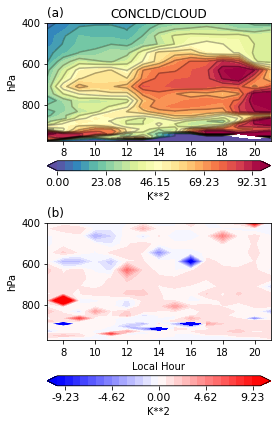

In [55]:
fig,axs = plt.subplots(2,1, figsize=(4,7) )
axs = axs.ravel()
fig.subplots_adjust(hspace = 0.7,bottom=0.25)

varName = 'CLOUD'

# ctrlCase = 'HMG'
# testCase = 'HTG*100'

ctrlCase = 'HMG'
testCase = 'HTG*LESmult'

# ctrlCase = 'HMG_dcOff'
# # testCase = 'HTG_dcOff'
# testCase = 'HTG*LESmult_dcOff'

ctrlDS    = hourlyMeanSCAM.sel(case=ctrlCase)
testDS    = hourlyMeanSCAM.sel(case=testCase)
diffCases = testDS - ctrlDS


## Plot control cases 
## - - - - - - - - - - - - - - - - - - - - - - - - -
cplt = axs[0].contourf(ctrlDS.hour.values, 
                ctrlDS.lev.values, 
                np.squeeze(ctrlDS['CONCLD'].values / ctrlDS['CLOUD'].values).transpose()*100,
                np.arange(0.0, 100, (100-0)/26), cmap='Spectral_r', extend='both')
# Add colorbar
ax_position = axs[0].get_position()
cbar_ax = fig.add_axes([ax_position.x0, ax_position.y0-0.06, ax_position.width, 0.02])
cbar = plt.colorbar(cplt, orientation='horizontal',cax=cbar_ax, label='K**2', format='%.2f')
cbar.ax.tick_params(labelsize=11) 
cbar.ax.locator_params(nbins=5)
# Add contour lines
cplt = axs[0].contour(ctrlDS.hour.values, 
                ctrlDS.lev.values, 
                np.squeeze(ctrlDS['CONCLD'].values / ctrlDS['CLOUD'].values).transpose()*100,
                np.arange(0.0, 100, (100-0)/26)[::2], colors='k', alpha=0.3 )


## Plot difference in cases 
## - - - - - - - - - - - - - - - - - - - - - - - - -
nStep = (2*10)/26
cplt = axs[1].contourf(diffCases.hour.values, 
                    diffCases.lev.values, 
                    np.squeeze(diffCases['CONCLD'].values / diffCases['CLOUD'].values).transpose(),
                    np.arange(-10, 10+nStep, nStep), cmap='bwr', extend='both')
# Add colorbar
ax_position = axs[1].get_position()
cbar_ax = fig.add_axes([ax_position.x0, ax_position.y0-0.09, ax_position.width, 0.02])
cbar = plt.colorbar(cplt, orientation='horizontal',cax=cbar_ax, label='K**2', format='%.2f')
cbar.ax.tick_params(labelsize=11) 
cbar.ax.locator_params(nbins=5)


# ## - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - 
# ## Add significance testing 

# levSig_var    = getStatSigCI(len(diffCases.hour.values), len(diffCases.lev.values), varName,   ctrlCase, testCase)  

# for iHr in range(len(diffCases.hour.values)): 
#     for iLev in range(len(diffCases.lev.values)): 
#         # CONCLD
#         if levSig_var[iHr, iLev]==1: 
#             axs[1].plot(diffCases.hour.values[iHr], diffCases.levInterp.values[iLev],'ko',alpha=0.3,markersize=1)

# ## - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - 


axs[0].invert_yaxis()
axs[1].invert_yaxis()

axs[0].set_ylim([975, 400])
axs[1].set_ylim([975, 400])


axs[0].set_title('(a)', loc='left')
axs[0].set_title('CONCLD/CLOUD')

axs[1].set_title('(b)', loc='left')

axs[0].set_ylabel('hPa')
axs[1].set_ylabel('hPa')

axs[1].set_xlabel('Local Hour')

plt.show()




In [52]:
print(np.nanpercentile(diffCases[varName],98))
print(np.nanpercentile(diffCases[varName],5))

10.335396852597555
-0.21163111495823905


NameError: name 'hourlyMeanSCAM' is not defined

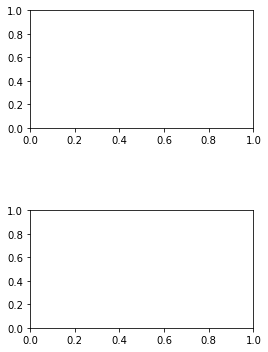

In [38]:
fig,axs = plt.subplots(2,1, figsize=(4,7) )
axs = axs.ravel()
fig.subplots_adjust(hspace = 0.7,bottom=0.25)

varName = 'WPTHLP_CLUBB_interp'

# ctrlCase = 'HMG'
# testCase = 'HTG*100'

ctrlCase = 'HMG'
testCase = 'HTG*LESmult'

# ctrlCase = 'HMG_dcOff'
# # testCase = 'HTG_dcOff'
# testCase = 'HTG*LESmult_dcOff'

ctrlDS    = hourlyMeanSCAM.sel(case=ctrlCase)
testDS    = hourlyMeanSCAM.sel(case=testCase)
diffCases = testDS - ctrlDS


## Plot control cases 
## - - - - - - - - - - - - - - - - - - - - - - - - -
cplt = axs[0].contourf(ctrlDS.hour.values, 
                ctrlDS.levInterp.values, 
                np.squeeze(ctrlDS[varName].values).transpose(),
                np.arange(-5, 80, (80+5)/26), cmap='Spectral_r', extend='both')
# Add colorbar
ax_position = axs[0].get_position()
cbar_ax = fig.add_axes([ax_position.x0, ax_position.y0-0.06, ax_position.width, 0.02])
cbar = plt.colorbar(cplt, orientation='horizontal',cax=cbar_ax, label='K**2', format='%.2f')
cbar.ax.tick_params(labelsize=11) 
cbar.ax.locator_params(nbins=5)
# Add contour lines
cplt = axs[0].contour(ctrlDS.hour.values, 
                ctrlDS.levInterp.values, 
                np.squeeze(ctrlDS[varName].values).transpose(),
                np.arange(-5, 80, (80+5)/26)[::2], colors='k', alpha=0.3 )


## Plot difference in cases 
## - - - - - - - - - - - - - - - - - - - - - - - - -
nStep = (2*10)/26
cplt = axs[1].contourf(diffCases.hour.values, 
                    diffCases.levInterp.values, 
                    np.squeeze(diffCases[varName].values).transpose(),
                    np.arange(-10, 10+nStep, nStep), cmap='bwr', extend='both')
# Add colorbar
ax_position = axs[1].get_position()
cbar_ax = fig.add_axes([ax_position.x0, ax_position.y0-0.09, ax_position.width, 0.02])
cbar = plt.colorbar(cplt, orientation='horizontal',cax=cbar_ax, label='K**2', format='%.2f')
cbar.ax.tick_params(labelsize=11) 
cbar.ax.locator_params(nbins=5)


## - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - 
## Add significance testing 

levSig_var    = getStatSigCI(len(diffCases.hour.values), len(diffCases.lev.values), varName,   ctrlCase, testCase)  

for iHr in range(len(diffCases.hour.values)): 
    for iLev in range(len(diffCases.lev.values)): 
        # CONCLD
        if levSig_var[iHr, iLev]==1: 
            axs[1].plot(diffCases.hour.values[iHr], diffCases.levInterp.values[iLev],'ko',alpha=0.3,markersize=1)

## - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - 

axs[0].invert_yaxis()
axs[1].invert_yaxis()

axs[0].set_ylim([975, 500])
axs[1].set_ylim([975, 500])


axs[0].set_title('(a)', loc='left')
axs[0].set_title(varName)

axs[1].set_title('(b)', loc='left')

axs[0].set_ylabel('hPa')
axs[1].set_ylabel('hPa')

axs[1].set_xlabel('Local Hour')

plt.show()




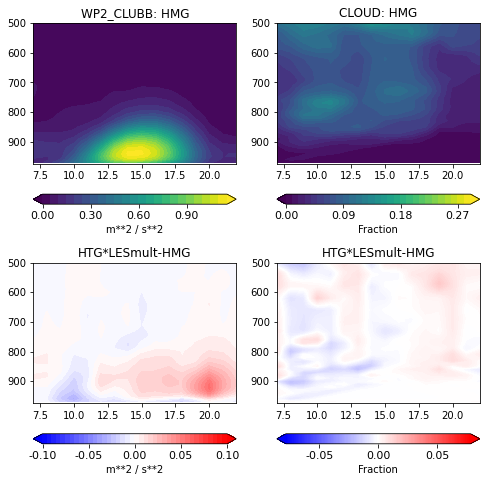

In [273]:
fig,axs = plt.subplots(2,2, figsize=(8,7) )
axs = axs.ravel()
fig.subplots_adjust(hspace = 0.7)

ctrlCase = 'HMG'
testCase = 'HTG*LESmult'

ctrlDS    = hourlyMeanSCAM.sel(case=ctrlCase)
testDS    = hourlyMeanSCAM.sel(case=testCase)
diffCases = testDS - ctrlDS


## Plot control cases 
## - - - - - - - - - - - - - - - - - - - - - - - - -
cplt = axs[0].contourf(ctrlDS.hour.values, 
                ctrlDS.levInterp.values, 
                np.squeeze(ctrlDS.WP2_CLUBB_interp.values).transpose(),
                np.arange(0.0, 1.2, 0.05), cmap='viridis', extend='both')
# Add colorbar
ax_position = axs[0].get_position()
cbar_ax = fig.add_axes([ax_position.x0, ax_position.y0-0.08, ax_position.width, 0.02])
cbar = plt.colorbar(cplt, orientation='horizontal',cax=cbar_ax, label='m**2 / s**2', format='%.2f')
cbar.ax.tick_params(labelsize=11) 
cbar.ax.locator_params(nbins=5)


cplt = axs[1].contourf(ctrlDS.hour.values, 
                ctrlDS.levInterp.values, 
                np.squeeze(ctrlDS.CLOUD_interp.values).transpose(),
                np.arange(0.0, 0.3, 0.01), cmap='viridis', extend='both')
# Add colorbar
ax_position = axs[1].get_position()
cbar_ax = fig.add_axes([ax_position.x0, ax_position.y0-0.08, ax_position.width, 0.02])
cbar = plt.colorbar(cplt, orientation='horizontal',cax=cbar_ax, label='Fraction', format='%.2f')
cbar.ax.tick_params(labelsize=11) 
cbar.ax.locator_params(nbins=4)



## Plot difference in cases 
## - - - - - - - - - - - - - - - - - - - - - - - - -
cplt = axs[2].contourf(diffCases.hour.values, 
                    diffCases.levInterp.values, 
                    np.squeeze(diffCases.WP2_CLUBB_interp.values).transpose(),
                    np.arange(-0.1, 0.105, 0.005), cmap='bwr', extend='both')
# Add colorbar
ax_position = axs[2].get_position()
cbar_ax = fig.add_axes([ax_position.x0, ax_position.y0-0.08, ax_position.width, 0.02])
cbar = plt.colorbar(cplt, orientation='horizontal',cax=cbar_ax, label='m**2 / s**2', format='%.2f')
cbar.ax.tick_params(labelsize=11) 
cbar.ax.locator_params(nbins=5)


cplt = axs[3].contourf(diffCases.hour.values, 
                    diffCases.levInterp.values, 
                    np.squeeze(diffCases.CLOUD_interp.values).transpose(),
                    np.arange(-0.08, 0.081, 0.001), cmap='bwr', extend='both')
# Add colorbar
ax_position = axs[3].get_position()
cbar_ax = fig.add_axes([ax_position.x0, ax_position.y0-0.08, ax_position.width, 0.02])
cbar = plt.colorbar(cplt, orientation='horizontal',cax=cbar_ax, label='Fraction', format='%.2f')
cbar.ax.tick_params(labelsize=11) 
cbar.ax.locator_params(nbins=4)


axs[0].invert_yaxis()
axs[1].invert_yaxis()
axs[2].invert_yaxis()
axs[3].invert_yaxis()

axs[0].set_ylim([975, 500])
axs[1].set_ylim([975, 500])
axs[2].set_ylim([975, 500])
axs[3].set_ylim([975, 500])

axs[0].set_title('WP2_CLUBB: '+ctrlCase)
axs[1].set_title('CLOUD: '+ctrlCase)
axs[2].set_title(testCase+'-'+ctrlCase)
axs[3].set_title(testCase+'-'+ctrlCase)


plt.show()

In [256]:
# fig,axs = plt.subplots(2,2, figsize=(8,7) )
# axs = axs.ravel()
# fig.subplots_adjust(hspace = 0.7)

# ctrlCase = 'HMG_dcOff'
# testCase = 'HTG*LESmult_dcOff'

# ctrlDS    = hourlyMeanSCAM.sel(case=ctrlCase)
# testDS    = hourlyMeanSCAM.sel(case=testCase)
# diffCases = testDS - ctrlDS


# ## Plot control cases 
# ## - - - - - - - - - - - - - - - - - - - - - - - - -
# cplt = axs[0].contourf(ctrlDS.hour.values, 
#                 ctrlDS.levInterp.values, 
#                 np.squeeze(ctrlDS.WP2_CLUBB_interp.values).transpose(),
#                 np.arange(0.0, 1.2, 0.05), cmap='viridis', extend='both')
# # Add colorbar
# ax_position = axs[0].get_position()
# cbar_ax = fig.add_axes([ax_position.x0, ax_position.y0-0.08, ax_position.width, 0.02])
# cbar = plt.colorbar(cplt, orientation='horizontal',cax=cbar_ax, label='m**2 / s**2', format='%.2f')
# cbar.ax.tick_params(labelsize=11) 
# cbar.ax.locator_params(nbins=5)


# cplt = axs[1].contourf(ctrlDS.hour.values, 
#                 ctrlDS.levInterp.values, 
#                 np.squeeze(ctrlDS.CLOUD_interp.values).transpose(),
#                 np.arange(0.0, 0.3, 0.01), cmap='viridis', extend='both')
# # Add colorbar
# ax_position = axs[1].get_position()
# cbar_ax = fig.add_axes([ax_position.x0, ax_position.y0-0.08, ax_position.width, 0.02])
# cbar = plt.colorbar(cplt, orientation='horizontal',cax=cbar_ax, label='Fraction', format='%.2f')
# cbar.ax.tick_params(labelsize=11) 
# cbar.ax.locator_params(nbins=4)



# ## Plot difference in cases 
# ## - - - - - - - - - - - - - - - - - - - - - - - - -
# cplt = axs[2].contourf(diffCases.hour.values, 
#                     diffCases.levInterp.values, 
#                     np.squeeze(diffCases.WP2_CLUBB_interp.values).transpose(),
#                     np.arange(-0.1, 0.105, 0.005), cmap='bwr', extend='both')
# # Add colorbar
# ax_position = axs[2].get_position()
# cbar_ax = fig.add_axes([ax_position.x0, ax_position.y0-0.08, ax_position.width, 0.02])
# cbar = plt.colorbar(cplt, orientation='horizontal',cax=cbar_ax, label='m**2 / s**2', format='%.2f')
# cbar.ax.tick_params(labelsize=11) 
# cbar.ax.locator_params(nbins=5)


# cplt = axs[3].contourf(diffCases.hour.values, 
#                     diffCases.levInterp.values, 
#                     np.squeeze(diffCases.CLOUD_interp.values).transpose(),
#                     np.arange(-0.08, 0.081, 0.001), cmap='bwr', extend='both')
# # Add colorbar
# ax_position = axs[3].get_position()
# cbar_ax = fig.add_axes([ax_position.x0, ax_position.y0-0.08, ax_position.width, 0.02])
# cbar = plt.colorbar(cplt, orientation='horizontal',cax=cbar_ax, label='Fraction', format='%.2f')
# cbar.ax.tick_params(labelsize=11) 
# cbar.ax.locator_params(nbins=4)


# axs[0].invert_yaxis()
# axs[1].invert_yaxis()
# axs[2].invert_yaxis()
# axs[3].invert_yaxis()

# axs[0].set_ylim([975, 500])
# axs[1].set_ylim([975, 500])
# axs[2].set_ylim([975, 500])
# axs[3].set_ylim([975, 500])

# axs[0].set_title('WP2_CLUBB: '+ctrlCase)
# axs[1].set_title('CLOUD: '+ctrlCase)
# axs[2].set_title(testCase+'-'+ctrlCase)
# axs[3].set_title(testCase+'-'+ctrlCase)


# plt.show()

**LES**

In [67]:
hrLES_newDefault = LES_newDefault.groupby('Time.hour').mean(dim='Time')
hrLES_moments    = LES_allDays_allVarsHr.groupby('time.hour').mean(dim='time')

## Get time array to be 2D as well, so we can directly contourf the height, not using the mean value
hrArr_2d     = np.transpose( np.tile(hrLES_newDefault.hour.values, (226,1) ) )
hrArr_2d_227 = np.transpose( np.tile(hrLES_newDefault.hour.values, (227,1) ) )

## Get height axis
hgtAx = hrLES_newDefault.AVP_P * 1e-2


In [68]:
## Get hourly mean SCAM 
hrLESstd_newDefault       = LES_newDefault.groupby('Time.hour').std(dim='Time')
hrLESstd_moments          = LES_allDays_allVarsHr.groupby('time.hour').std(dim='time')

hourlyCountLES_newDefault = LES_newDefault.groupby('Time.hour').count(dim='Time')
hourlyCountLES_moments    = LES_allDays_allVarsHr.groupby('time.hour').count(dim='time')


hourlySE_LESdefault = hrLESstd_newDefault/np.sqrt(hourlyCountLES_newDefault)
hourlySE_LESmoments = hrLESstd_moments/np.sqrt(hourlyCountLES_moments)


## Get (mean) heights from Z3_interp
# hourlyMeanSCAM.Z3_interp


In [69]:
## Add significance testing 
CIlevel = 1.960   ## 95% CI
# CIlevel = 1.645   ## 90% CI

CI_LESdefault = CIlevel*hourlySE_LESdefault
CI_LESmoments = CIlevel*hourlySE_LESmoments

lowCI_LESdefault = hrLES_newDefault - CI_LESdefault
hghCI_LESdefault = hrLES_newDefault + CI_LESdefault

lowCI_LESmoments = hrLES_moments - CI_LESmoments
hghCI_LESmoments = hrLES_moments + CI_LESmoments

def getStatSigCI_LES(lowCI_DS, highCI_DS, nTimes, nLevs, varSel, ctrlCase, testCase): 

    ## Get ranges for each case's CI 
    ctrlDS_lowCI    = lowCI_DS.sel(case=ctrlCase)[varSel]
    testDS_lowCI    = lowCI_DS.sel(case=testCase)[varSel]

    ctrlDS_hghCI    = highCI_DS.sel(case=ctrlCase)[varSel]
    testDS_hghCI    = highCI_DS.sel(case=testCase)[varSel]

    levSig = np.full([nTimes, nLevs], np.nan)

    for iHr in range(nTimes): 
        for iLev in range(nLevs):

            # Not significant range?
            if ( (testDS_lowCI.values[iHr,iLev] >= ctrlDS_lowCI.values[iHr,iLev]) & (testDS_lowCI.values[iHr,iLev] <= ctrlDS_hghCI.values[iHr,iLev]) ): 
                levSig[iHr,iLev]  = 0 
            elif ( (testDS_hghCI.values[iHr,iLev] >= ctrlDS_lowCI.values[iHr,iLev]) & (testDS_hghCI.values[iHr,iLev] <= ctrlDS_hghCI.values[iHr,iLev]) ): 
                levSig[iHr,iLev]  = 0 
            
            elif ( (ctrlDS_lowCI.values[iHr,iLev] >= testDS_lowCI.values[iHr,iLev]) & (ctrlDS_lowCI.values[iHr,iLev] <= testDS_hghCI.values[iHr,iLev]) ): 
                levSig[iHr,iLev]  = 0 
            elif ( (ctrlDS_hghCI.values[iHr,iLev] >= testDS_lowCI.values[iHr,iLev]) & (ctrlDS_hghCI.values[iHr,iLev] <= testDS_hghCI.values[iHr,iLev]) ): 
                levSig[iHr,iLev]  = 0            
            
            
            else:
                levSig[iHr, iLev] = 1 
    
    return levSig


In [80]:
# ## Get ranges for each case's CI 
# ctrlDS_lowCI    = lowCI_LESmoments.sel(case=ctrlCase)['thl2']
# testDS_lowCI    = lowCI_LESmoments.sel(case=testCase)['thl2']

# ctrlDS_hghCI    = hghCI_LESmoments.sel(case=ctrlCase)['thl2']
# testDS_hghCI    = hghCI_LESmoments.sel(case=testCase)['thl2']

# np.shape(ctrlDS_lowCI)
# print('CTRL range [4,2]: ', ctrlDS_lowCI[4,2].values, ctrlDS_hghCI[4,2].values)
# print('TEST range [4,2]: ', testDS_lowCI[4,2].values, testDS_hghCI[4,2].values)



In [70]:
levSig_qc = getStatSigCI_LES(lowCI_LESdefault, hghCI_LESdefault, 
                               nTimes, nLevs, 'AVP_QC', ctrlCase, testCase)
np.shape(levSig_qc)


NameError: name 'nTimes' is not defined

In [93]:
levSig_qc[7,:]

array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 1., 1., 1., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0.

In [ ]:
## Get ranges for each case's CI 
ctrlDS_lowCI    = lowCI_LESdefault.sel(case=ctrlCase)['AVP_QC']
testDS_lowCI    = lowCI_LESdefault.sel(case=testCase)['AVP_QC']

ctrlDS_hghCI    = hghCI_LESdefault.sel(case=ctrlCase)['AVP_QC']
testDS_hghCI    = hghCI_LESdefault.sel(case=testCase)['AVP_QC']

np.shape(ctrlDS_lowCI)
print('CTRL range [4,2]: ', ctrlDS_lowCI[4,2].values, ctrlDS_hghCI[4,2].values)
print('TEST range [4,2]: ', testDS_lowCI[4,2].values, testDS_hghCI[4,2].values)



In [55]:
## Make sure HTG/HMG pressure levels aren't too different (for plotting)
np.nanmax(hgtAx.sel(case='HTG') - hgtAx.sel(case='HMG'))


0.008300781

In [ ]:
fig,axs = plt.subplots(2,3, figsize=(12,7) )
axs = axs.ravel()
fig.subplots_adjust(hspace = 0.7)

ctrlCase = 'HMG'
testCase = 'HTG'

ctrlDS    = hrLES_moments.sel(case=ctrlCase)
testDS    = hrLES_moments.sel(case=testCase)
diffCases = testDS - ctrlDS


## Plot control cases 
## - - - - - - - - - - - - - - - - - - - - - - - - -
cplt = axs[0].contourf(hrArr_2d, 
                hgtAx.sel(case='HMG').values, 
                np.squeeze(ctrlDS.thl2.values),
                np.arange(0.0, 0.51, 0.01), cmap='viridis', extend='both')
# Add colorbar
ax_position = axs[0].get_position()
cbar_ax = fig.add_axes([ax_position.x0, ax_position.y0-0.08, ax_position.width, 0.02])
cbar = plt.colorbar(cplt, orientation='horizontal',cax=cbar_ax, label='K**2')
cbar.ax.tick_params(labelsize=11) 
cbar.ax.locator_params(nbins=5)

cplt = axs[1].contourf(hrArr_2d, 
                hgtAx.sel(case='HMG').values, 
                np.squeeze(ctrlDS.qv2.values),
                np.arange(0.0, 1.0e-6, 0.05e-6), cmap='viridis', extend='both')
# Add colorbar
ax_position = axs[1].get_position()
cbar_ax = fig.add_axes([ax_position.x0, ax_position.y0-0.08, ax_position.width, 0.02])
cbar = plt.colorbar(cplt, orientation='horizontal',cax=cbar_ax, label='kg**2 / kg**2')
cbar.ax.tick_params(labelsize=11) 
cbar.ax.locator_params(nbins=4)


cplt = axs[2].contourf(hrArr_2d, 
                hgtAx.sel(case='HMG').values, 
                np.squeeze(ctrlDS.TKE_total.values)*0.5,   ## Actual TKE equation is 0.5*(u'2+v'2+w'2)
                np.arange(0, 2.05, 0.05), cmap='viridis', extend='both')
# Add colorbar
ax_position = axs[2].get_position()
cbar_ax = fig.add_axes([ax_position.x0, ax_position.y0-0.08, ax_position.width, 0.02])
cbar = plt.colorbar(cplt, orientation='horizontal',cax=cbar_ax, label='K kg/kg')
cbar.ax.tick_params(labelsize=11) 
cbar.ax.locator_params(nbins=4)




## Plot difference in cases 
## - - - - - - - - - - - - - - - - - - - - - - - - -
cplt = axs[3].contourf(hrArr_2d, 
                    hgtAx.sel(case='HMG').values, 
                    np.squeeze(diffCases.thl2.values),
                    np.arange(-0.25, 0.26, 0.01), cmap='bwr', extend='both')
# Add colorbar
ax_position = axs[3].get_position()
cbar_ax = fig.add_axes([ax_position.x0, ax_position.y0-0.08, ax_position.width, 0.02])
cbar = plt.colorbar(cplt, orientation='horizontal',cax=cbar_ax, label='K**2')
cbar.ax.tick_params(labelsize=11) 
cbar.ax.locator_params(nbins=5)


cplt = axs[4].contourf(hrArr_2d, 
                    hgtAx.sel(case='HMG').values, 
                    np.squeeze(diffCases.qv2.values),
                    np.arange(-0.8e-6, 0.82e-6, 0.02e-6), cmap='bwr', extend='both')
# Add colorbar
ax_position = axs[4].get_position()
cbar_ax = fig.add_axes([ax_position.x0, ax_position.y0-0.08, ax_position.width, 0.02])
cbar = plt.colorbar(cplt, orientation='horizontal',cax=cbar_ax, label='kg**2 / kg**2')
cbar.ax.tick_params(labelsize=11) 
cbar.ax.locator_params(nbins=5)


cplt = axs[5].contourf(hrArr_2d, 
                    hgtAx.sel(case='HMG').values, 
                    np.squeeze(diffCases.TKE_total.values)*0.5,
                    np.arange(-2, 2.05, 0.05), cmap='bwr', extend='both')
# Add colorbar
ax_position = axs[5].get_position()
cbar_ax = fig.add_axes([ax_position.x0, ax_position.y0-0.08, ax_position.width, 0.02])
cbar = plt.colorbar(cplt, orientation='horizontal',cax=cbar_ax, label='m2/s2')
cbar.ax.tick_params(labelsize=11) 
cbar.ax.locator_params(nbins=5)

## - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - 
## Add significance testing 

nTimes = len(hrLES_moments.hour.values)
nLevs  = np.shape(hgtAx.sel(case='HMG').values)[1]

levSig_thl2 = getStatSigCI_LES(lowCI_LESmoments, hghCI_LESmoments, 
                               nTimes, nLevs, 'thl2', ctrlCase, testCase)

levSig_qv2 = getStatSigCI_LES(lowCI_LESmoments, hghCI_LESmoments, 
                               nTimes, nLevs, 'qv2', ctrlCase, testCase)

levSig_tke = getStatSigCI_LES(lowCI_LESmoments, hghCI_LESmoments, 
                               nTimes, nLevs, 'TKE_total', ctrlCase, testCase)


for iHr in range(nTimes): 
    for iLev in range(nLevs): 

        # thl2
        if levSig_thl2[iHr, iLev]==1: 
            axs[3].plot(hrArr_2d[iHr,iLev], hgtAx.sel(case='HMG').values[iHr,iLev],'ko',alpha=0.3,markersize=1)

        # qv2
        if levSig_qv2[iHr, iLev]==1: 
            axs[4].plot(hrArr_2d[iHr,iLev], hgtAx.sel(case='HMG').values[iHr,iLev],'ko',alpha=0.3,markersize=1)

        # TKE_total
        if levSig_tke[iHr, iLev]==1: 
            axs[5].plot(hrArr_2d[iHr,iLev], hgtAx.sel(case='HMG').values[iHr,iLev],'ko',alpha=0.3,markersize=1)

            
## - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - 



axs[0].invert_yaxis()
axs[1].invert_yaxis()
axs[2].invert_yaxis()
axs[3].invert_yaxis()
axs[4].invert_yaxis()
axs[5].invert_yaxis()

axs[0].set_ylim([975, 500])
axs[1].set_ylim([975, 500])
axs[2].set_ylim([975, 500])
axs[3].set_ylim([975, 500])
axs[4].set_ylim([975, 500])
axs[5].set_ylim([975, 500])

axs[0].set_xlim([hrLES_newDefault.hour.values[1], hrLES_newDefault.hour.values[-1]])
axs[1].set_xlim([hrLES_newDefault.hour.values[1], hrLES_newDefault.hour.values[-1]])
axs[2].set_xlim([hrLES_newDefault.hour.values[1], hrLES_newDefault.hour.values[-1]])
axs[3].set_xlim([hrLES_newDefault.hour.values[1], hrLES_newDefault.hour.values[-1]])
axs[4].set_xlim([hrLES_newDefault.hour.values[1], hrLES_newDefault.hour.values[-1]])
axs[5].set_xlim([hrLES_newDefault.hour.values[1], hrLES_newDefault.hour.values[-1]])

axs[0].set_title('LES: THL2: '+ctrlCase)
axs[1].set_title('LES: QV2: '+ctrlCase)
axs[2].set_title('LES: TKE: '+ctrlCase)

axs[3].set_title(testCase+'-'+ctrlCase)
axs[4].set_title(testCase+'-'+ctrlCase)
axs[5].set_title(testCase+'-'+ctrlCase)

plt.show()


In [68]:
np.shape(levSig_thl2)

(15, 15)

In [ ]:
fig,axs = plt.subplots(2,1, figsize=(4,7) )
axs = axs.ravel()
fig.subplots_adjust(hspace = 0.7)

ctrlCase = 'HMG'
testCase = 'HTG'

ctrlDS    = hrLES_moments.sel(case=ctrlCase)
testDS    = hrLES_moments.sel(case=testCase)
diffCases = testDS - ctrlDS


## Plot control cases 
## - - - - - - - - - - - - - - - - - - - - - - - - -
cplt = axs[0].contourf(hrArr_2d_227, 
                ctrlDS.zw.values * 1e-3, 
                np.squeeze(ctrlDS.w2.values),
                np.arange(0.0, 2.05, 0.05), cmap='viridis', extend='both')
# Add colorbar
ax_position = axs[0].get_position()
cbar_ax = fig.add_axes([ax_position.x0, ax_position.y0-0.08, ax_position.width, 0.02])
cbar = plt.colorbar(cplt, orientation='horizontal',cax=cbar_ax, label=LES_newDefault.AVP_QC.units)
cbar.ax.tick_params(labelsize=11) 
cbar.ax.locator_params(nbins=5)

## Plot difference in cases 
## - - - - - - - - - - - - - - - - - - - - - - - - -
cplt = axs[1].contourf(hrArr_2d_227, 
                    ctrlDS.zw.values * 1e-3, 
                    np.squeeze(diffCases.w2.values),
                    np.arange(-2.0, 2.05, 0.05), cmap='bwr', extend='both')
# Add colorbar
ax_position = axs[1].get_position()
cbar_ax = fig.add_axes([ax_position.x0, ax_position.y0-0.08, ax_position.width, 0.02])
cbar = plt.colorbar(cplt, orientation='horizontal',cax=cbar_ax, label=LES_newDefault.AVP_QC.units)
cbar.ax.tick_params(labelsize=11) 
cbar.ax.locator_params(nbins=5)


# axs[0].invert_yaxis()
# axs[1].invert_yaxis()

axs[0].set_ylim([0, 5])
axs[1].set_ylim([0, 5])

axs[0].set_xlim([hrLES_newDefault.hour.values[1], hrLES_newDefault.hour.values[-1]])
axs[1].set_xlim([hrLES_newDefault.hour.values[1], hrLES_newDefault.hour.values[-1]])

axs[0].set_title('LES HMG:'+LES_newDefault.AVP_QC.description)
axs[1].set_title('LES: '+testCase+'-'+ctrlCase)

plt.show()

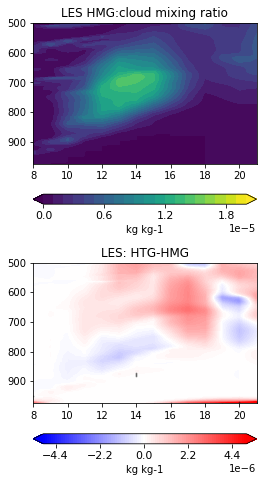

In [76]:
fig,axs = plt.subplots(2,1, figsize=(4,7) )
axs = axs.ravel()
fig.subplots_adjust(hspace = 0.7)

ctrlCase = 'HMG'
testCase = 'HTG'

ctrlDS    = hrLES_newDefault.sel(case=ctrlCase)
testDS    = hrLES_newDefault.sel(case=testCase)
diffCases = testDS - ctrlDS


## Plot control cases 
## - - - - - - - - - - - - - - - - - - - - - - - - -
cplt = axs[0].contourf(hrArr_2d, 
                hgtAx.sel(case='HMG').values, 
                np.squeeze(ctrlDS.AVP_QC.values),
                np.arange(0.0, 2e-5, 0.1e-5), cmap='viridis', extend='both')
# Add colorbar
ax_position = axs[0].get_position()
cbar_ax = fig.add_axes([ax_position.x0, ax_position.y0-0.08, ax_position.width, 0.02])
cbar = plt.colorbar(cplt, orientation='horizontal',cax=cbar_ax, label=LES_newDefault.AVP_QC.units)
cbar.ax.tick_params(labelsize=11) 
cbar.ax.locator_params(nbins=5)

## Plot difference in cases 
## - - - - - - - - - - - - - - - - - - - - - - - - -
cplt = axs[1].contourf(hrArr_2d, 
                    hgtAx.sel(case='HMG').values, 
                    np.squeeze(diffCases.AVP_QC.values),
                    np.arange(-0.5e-5, 0.51e-5, 0.01e-5), cmap='bwr', extend='both')
# Add colorbar
ax_position = axs[1].get_position()
cbar_ax = fig.add_axes([ax_position.x0, ax_position.y0-0.08, ax_position.width, 0.02])
cbar = plt.colorbar(cplt, orientation='horizontal',cax=cbar_ax, label=LES_newDefault.AVP_QC.units)
cbar.ax.tick_params(labelsize=11) 
cbar.ax.locator_params(nbins=5)

## - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - 
## Add significance testing 
nTimes = len(hrLES_newDefault.hour.values)
nLevs  = np.shape(hgtAx.sel(case='HMG').values)[1]

levSig_qc = getStatSigCI_LES(lowCI_LESdefault, hghCI_LESdefault, 
                               nTimes, nLevs, 'AVP_QC', ctrlCase, testCase)

for iHr in range(nTimes): 
    for iLev in range(nLevs): 

        # AVP_QC
        if levSig_qc[iHr, iLev]==1: 
            axs[1].plot(hrArr_2d[iHr,iLev], hgtAx.sel(case='HMG').values[iHr,iLev],'ko',alpha=0.3,markersize=1)

            
## - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - 

axs[0].invert_yaxis()
axs[1].invert_yaxis()


axs[0].set_ylim([975, 500])
axs[1].set_ylim([975, 500])

axs[0].set_xlim([hrLES_newDefault.hour.values[1], hrLES_newDefault.hour.values[-1]])
axs[1].set_xlim([hrLES_newDefault.hour.values[1], hrLES_newDefault.hour.values[-1]])


axs[0].set_title('LES HMG:'+LES_newDefault.AVP_QC.description)
axs[1].set_title('LES: '+testCase+'-'+ctrlCase)


plt.show()


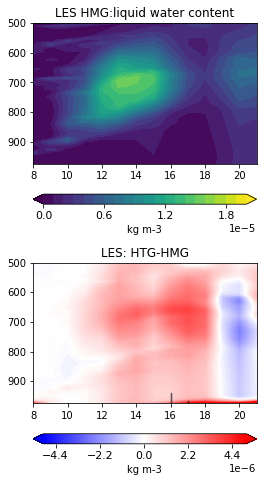

In [74]:
fig,axs = plt.subplots(2,1, figsize=(4,7) )
axs = axs.ravel()
fig.subplots_adjust(hspace = 0.7)

ctrlCase = 'HMG'
testCase = 'HTG'

ctrlDS    = hrLES_newDefault.sel(case=ctrlCase)
testDS    = hrLES_newDefault.sel(case=testCase)
diffCases = testDS - ctrlDS


## Plot control cases 
## - - - - - - - - - - - - - - - - - - - - - - - - -
cplt = axs[0].contourf(hrArr_2d, 
                hgtAx.sel(case='HMG').values, 
                np.squeeze(ctrlDS.AVP_LWC.values),
                np.arange(0.0, 2e-5, 0.1e-5), cmap='viridis', extend='both')
# Add colorbar
ax_position = axs[0].get_position()
cbar_ax = fig.add_axes([ax_position.x0, ax_position.y0-0.08, ax_position.width, 0.02])
cbar = plt.colorbar(cplt, orientation='horizontal',cax=cbar_ax, label=LES_newDefault.AVP_LWC.units)
cbar.ax.tick_params(labelsize=11) 
cbar.ax.locator_params(nbins=5)

## Plot difference in cases 
## - - - - - - - - - - - - - - - - - - - - - - - - -
cplt = axs[1].contourf(hrArr_2d, 
                    hgtAx.sel(case='HMG').values, 
                    np.squeeze(diffCases.AVP_LWC.values),
                    np.arange(-0.5e-5, 0.51e-5, 0.01e-5), cmap='bwr', extend='both')
# Add colorbar
ax_position = axs[1].get_position()
cbar_ax = fig.add_axes([ax_position.x0, ax_position.y0-0.08, ax_position.width, 0.02])
cbar = plt.colorbar(cplt, orientation='horizontal',cax=cbar_ax, label=LES_newDefault.AVP_LWC.units)
cbar.ax.tick_params(labelsize=11) 
cbar.ax.locator_params(nbins=5)

## - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - 
## Add significance testing 
nTimes = len(hrLES_newDefault.hour.values)
nLevs  = np.shape(hgtAx.sel(case='HMG').values)[1]

levSig_qc = getStatSigCI_LES(lowCI_LESdefault, hghCI_LESdefault, 
                               nTimes, nLevs, 'AVP_LWC', ctrlCase, testCase)

for iHr in range(nTimes): 
    for iLev in range(nLevs): 

        # AVP_QC
        if levSig_qc[iHr, iLev]==1: 
            axs[1].plot(hrArr_2d[iHr,iLev], hgtAx.sel(case='HMG').values[iHr,iLev],'ko',alpha=0.3,markersize=1)

            
## - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - 

axs[0].invert_yaxis()
axs[1].invert_yaxis()


axs[0].set_ylim([975, 500])
axs[1].set_ylim([975, 500])

axs[0].set_xlim([hrLES_newDefault.hour.values[1], hrLES_newDefault.hour.values[-1]])
axs[1].set_xlim([hrLES_newDefault.hour.values[1], hrLES_newDefault.hour.values[-1]])


axs[0].set_title('LES HMG:'+LES_newDefault.AVP_LWC.description)
axs[1].set_title('LES: '+testCase+'-'+ctrlCase)


plt.show()

In [34]:
hrMean_LES = LES_allDays_allVars.groupby('time.hour').mean(dim='time')


Text(0.5, 0, 'Local Time (hr)')

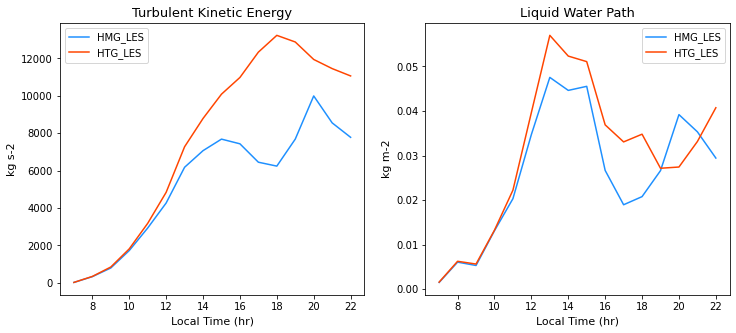

In [41]:
fig,axs = plt.subplots(1,2, figsize=(12,5))
axs     = axs.ravel()

axs[0].plot(hrMean_LES.hour.values, hrMean_LES.tke.sel(case='HMG').values,color='dodgerblue', label='HMG_LES')
axs[0].plot(hrMean_LES.hour.values, hrMean_LES.tke.sel(case='HTG').values,color='orangered', label='HTG_LES')
axs[0].legend()
axs[0].set_title('Turbulent Kinetic Energy',fontsize=13)
axs[0].set_ylabel(LES_allDays_allVars.tke.units, fontsize=11)
axs[0].set_xlabel('Local Time (hr)', fontsize=11)


axs[1].plot(hrMean_LES.hour.values, hrMean_LES.lwp.sel(case='HMG').values,color='dodgerblue', label='HMG_LES')
axs[1].plot(hrMean_LES.hour.values, hrMean_LES.lwp.sel(case='HTG').values,color='orangered', label='HTG_LES')
axs[1].legend()
axs[1].set_title('Liquid Water Path',fontsize=13)
axs[1].set_ylabel(LES_allDays_allVars.lwp.units, fontsize=11)
axs[1].set_xlabel('Local Time (hr)', fontsize=11)


## Some kind of postage-stamp way to look at all the days in LES and SCAM?

In [32]:
LESmeanRain     = LES_newDefault['AVS_RAIN'].mean(("south_north", "west_east"))
LES_newDefault['meanRain'] = (('case','Time'), LESmeanRain)


In [44]:
LES_newDefault.AVS_RAIN.units

'mm s-1'

In [43]:
forcDS.prec_srf.units


'mm/hour'

In [42]:
np.squeeze(forcDay.prec_srf.values)

NameError: name 'forcDay' is not defined

In [54]:
scamDay.sel(case='HMG').PRECT.values*(3600*1e3)

array([[[3.45478128e-07]],

       [[3.21088534e-09]],

       [[8.78813744e-10]],

       [[3.92784666e-10]],

       [[1.21313548e-07]],

       [[2.59968516e-07]],

       [[7.00391363e-04]],

       [[1.15985759e-02]],

       [[2.05190592e-02]],

       [[2.21341290e-02]],

       [[2.10143086e-02]],

       [[1.98569968e-02]],

       [[1.45156030e-02]],

       [[1.74466893e-02]],

       [[2.12437548e-02]],

       [[2.29925625e-02]],

       [[2.31740493e-02]],

       [[2.21585948e-02]],

       [[2.16932949e-02]],

       [[2.16054618e-02]],

       [[2.09388975e-02]],

       [[1.98588967e-02]],

       [[1.79263987e-02]],

       [[1.60508193e-02]],

       [[1.24106016e-02]],

       [[9.43306927e-03]],

       [[6.37722015e-03]],

       [[1.09825621e-03]],

       [[1.68520346e-05]],

       [[8.67667715e-09]],

       [[1.10521485e-08]],

       [[1.25372299e-08]]], dtype=float32)

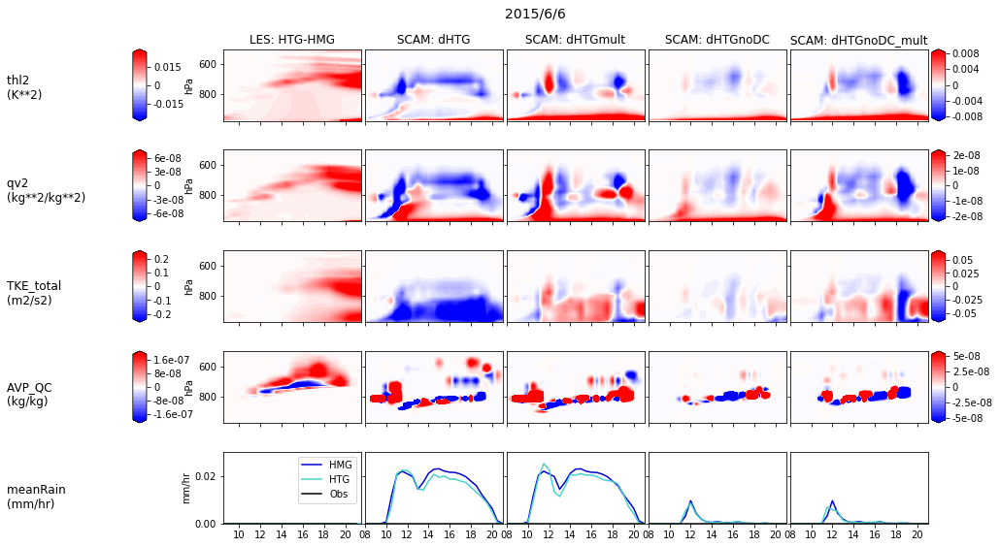

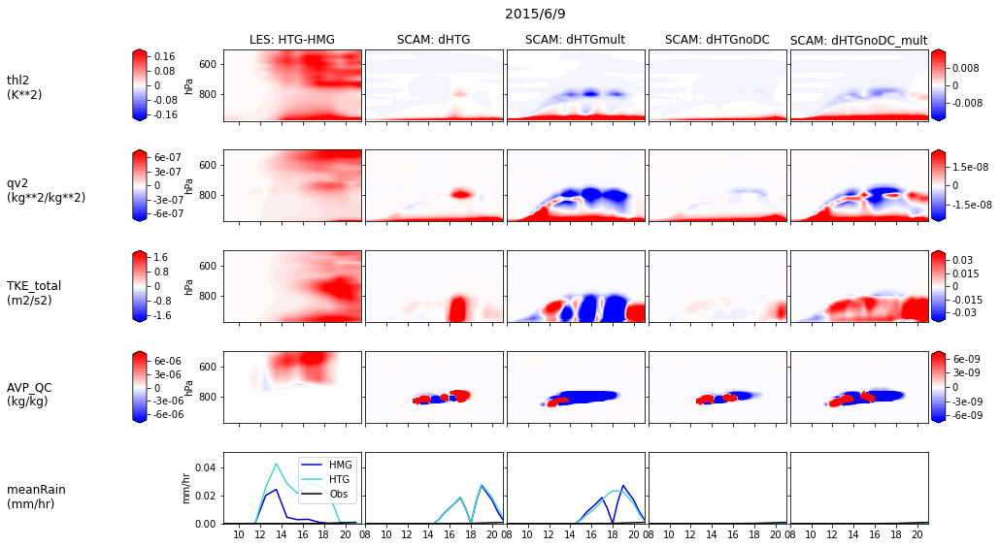

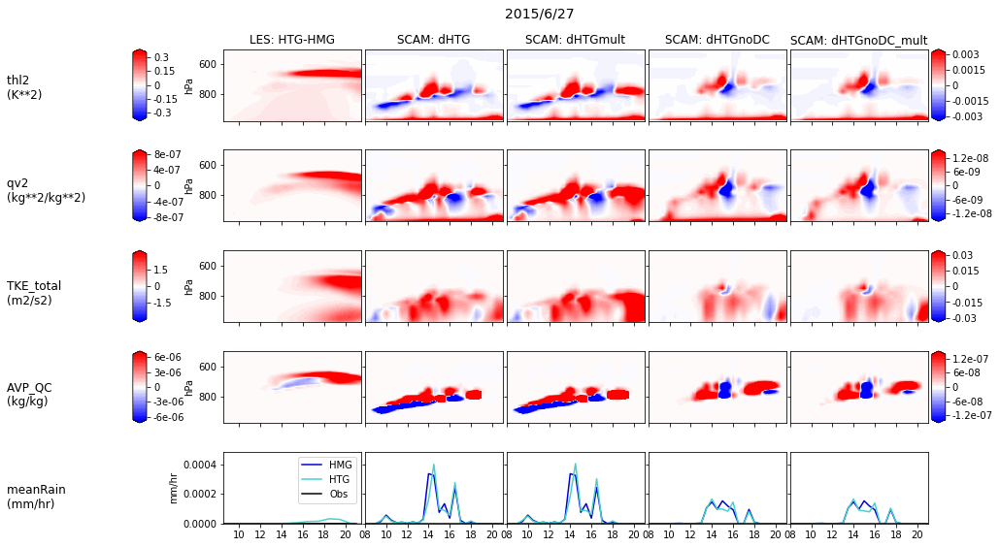

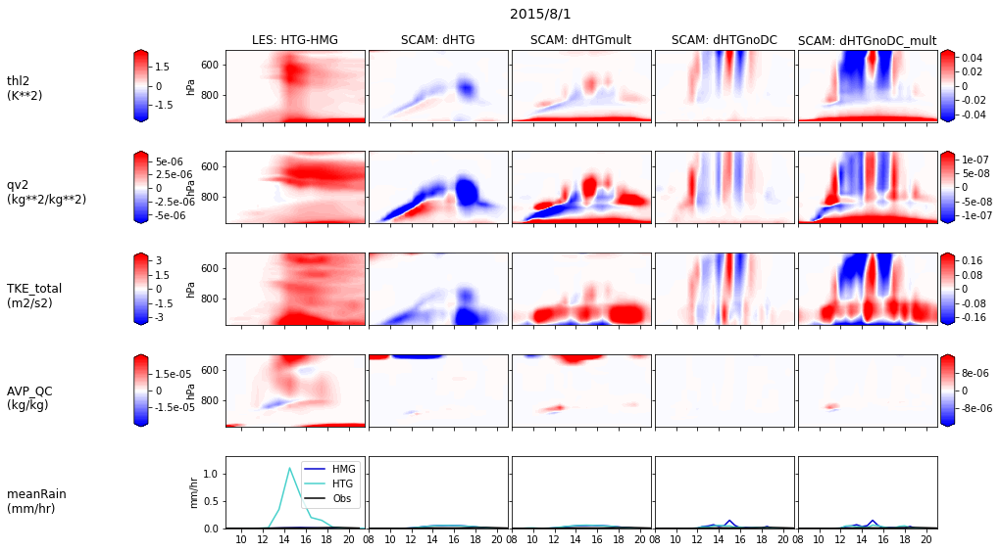

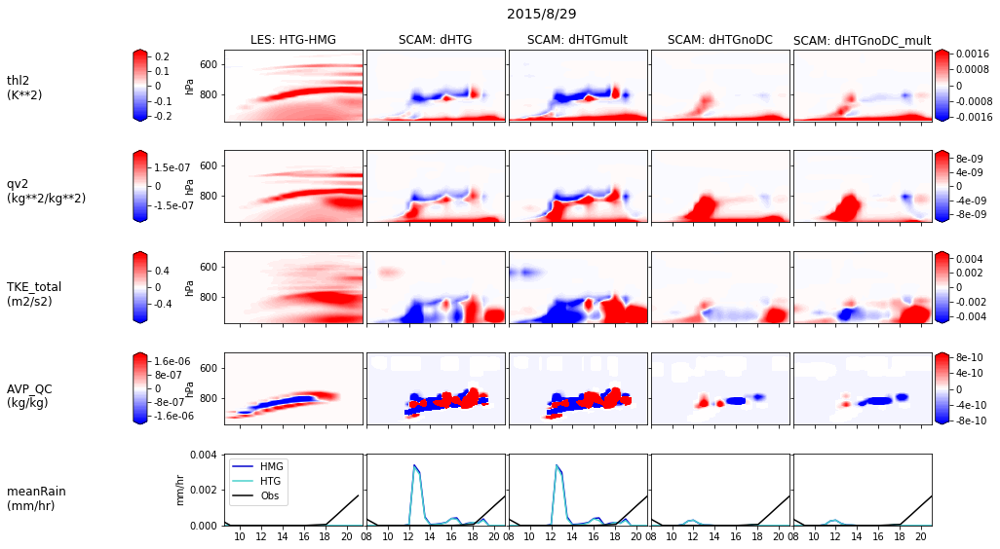

...

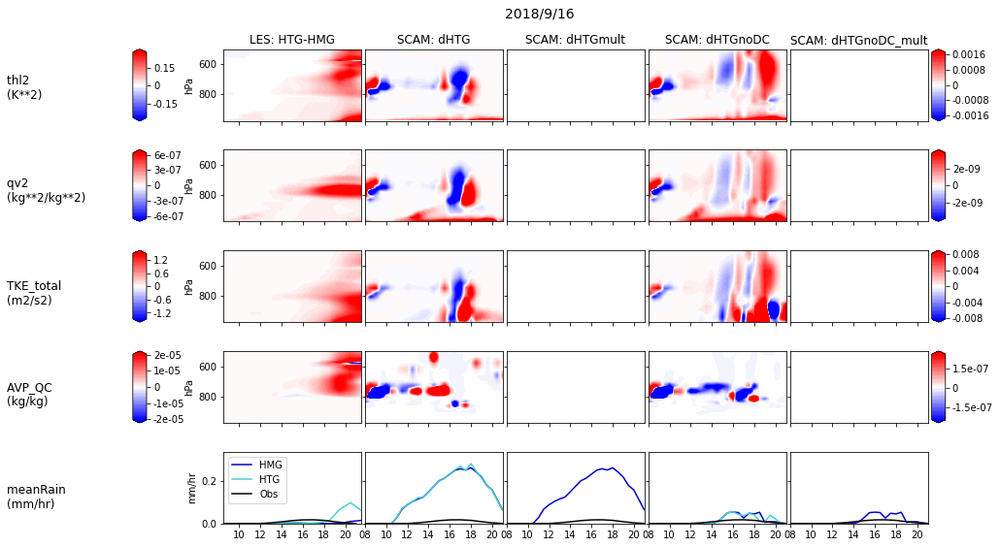

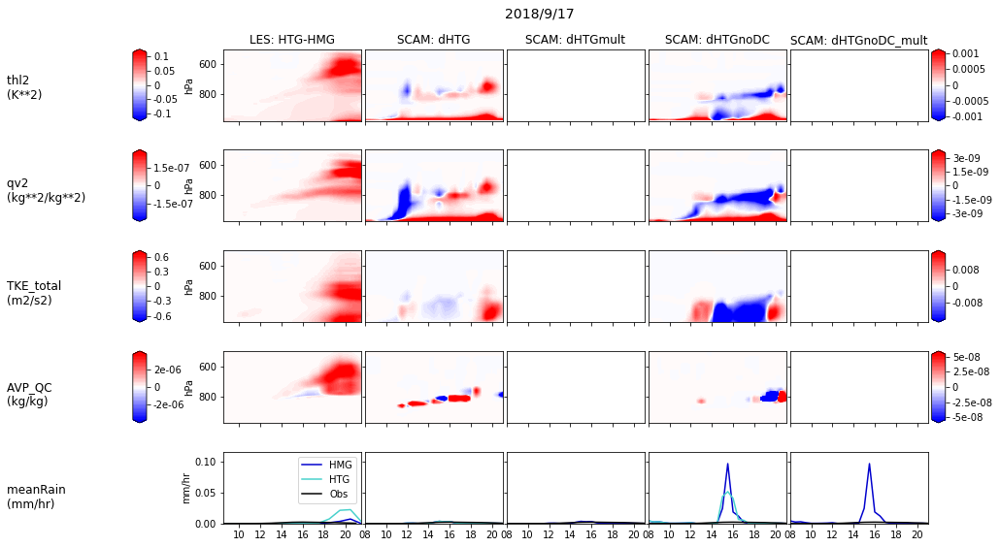

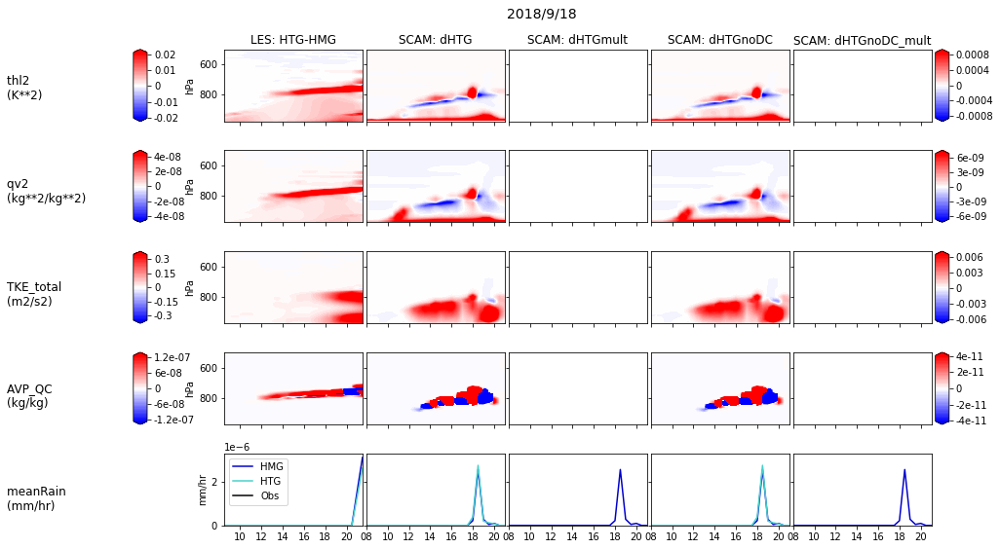

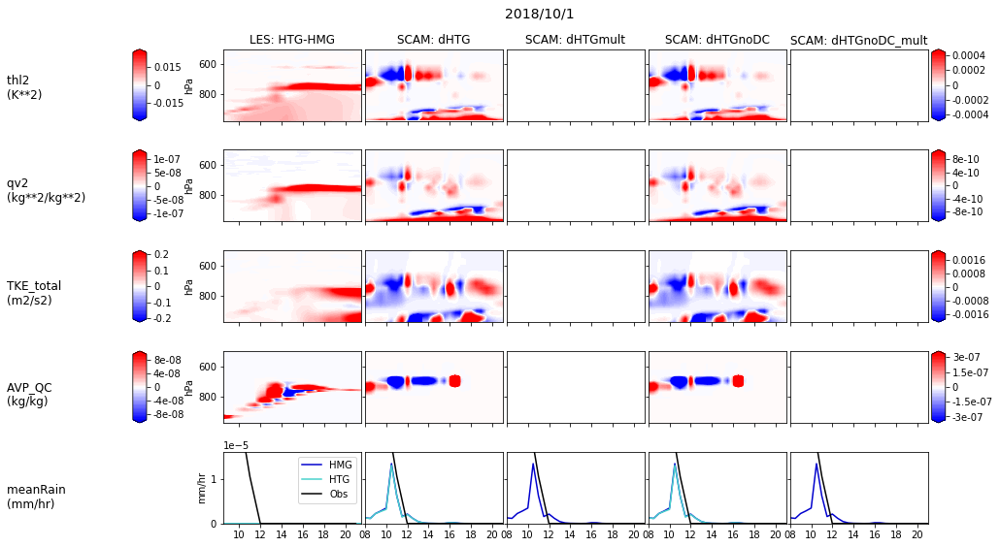

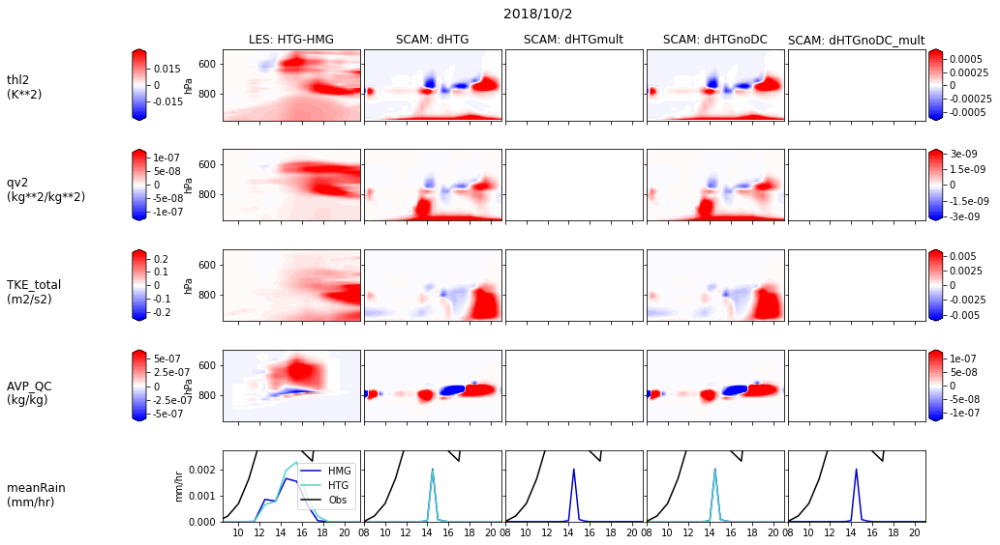

In [77]:

if len(uniqDays_scam)!=len(uniqDays_LES)!=len(uniqDays_moms):
    print('There are different numbers of days in each model set... check this!!')

for iDay in range(len(uniqDays_scam)):
# for iDay in range(6):
    ## - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - 
    ## Get just this day 
    thisDay  = pd.to_datetime(uniqDays_scam[iDay])
    
    itimeSCAM    = np.where( (scamDS['time.year'].values==thisDay.year) & 
                             (scamDS['time.month'].values==thisDay.month) & 
                             (scamDS['time.day'].values==thisDay.day) )[0]
    
    itimeLES     = np.where( (LES_newDefault['Time.year'].values==thisDay.year) & 
                             (LES_newDefault['Time.month'].values==thisDay.month) & 
                             (LES_newDefault['Time.day'].values==thisDay.day) )[0]
    
    itimeLESmoms = np.where( (LES_allDays_allVarsHr['time.year'].values==thisDay.year) & 
                             (LES_allDays_allVarsHr['time.month'].values==thisDay.month) & 
                             (LES_allDays_allVarsHr['time.day'].values==thisDay.day) )[0]
    
    itimeForc    = np.where( (forcDS['time.year'].values==thisDay.year) & 
                             (forcDS['time.month'].values==thisDay.month) & 
                             (forcDS['time.day'].values==thisDay.day) )[0]
    
    scamDay = scamDS.isel(time=itimeSCAM)
    lesDay  = LES_newDefault.isel(Time=itimeLES)
    momsDay = LES_allDays_allVarsHr.isel(time=itimeLESmoms)
    forcDay = forcDS.isel(time=itimeForc)
    
    # Make hour a 2D array so that can plot directly against height 
    hrArr_2d     = np.transpose( np.tile(lesDay.Time.values, (226,1) ) )
    hrArr_2d_227 = np.transpose( np.tile(lesDay.Time.values, (227,1) ) )
    ## Get height axis
    hgtAx = lesDay.AVP_P * 1e-2
    
    ## - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - 
    ## Plot differences (time-height) between HTG and HMG cases 
    
    nVars   = 5
    gridspec = {'width_ratios': [0.1, 0.5, 1, 1, 1, 1, 1, 0.1]}
    fig,axs = plt.subplots(nVars,8, figsize=(nVars*3,9), gridspec_kw=gridspec)
    axs     = axs.ravel()
    fig.subplots_adjust(hspace = 0.4, wspace=0.04)
    
    pltType     = ['TimeHgt', 'TimeHgt', 'TimeHgt',   'TimeHgt', 'diurnal']
    lesVarNames = ['thl2',    'qv2',     'TKE_total', 'AVP_QC',  'meanRain']
    lesVarDS    = ['moms',    'moms',    'moms',      'default', 'default']
    lesMult     = [   1,        1,         0.5,          1,         3600]
    
    unitsString = ['K**2',   'kg**2/kg**2', 'm2/s2',  'kg/kg',     'mm/hr']
    
    scamNames   = ['THLP2_CLUBB_interp', 'RTP2_CLUBB_interp','WP2_CLUBB_interp','CLDLIQ_interp','PRECT']
    scamMult    = [    1,                   1e-6,                1,                 1,         (3600*1e3) ]

    textHgt     = np.flip(np.linspace(0.15, 0.8, nVars))
    
    
    for iVar in range(nVars):
        ## - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - -
        ## Plot LES data 
        if lesVarDS[iVar]=='moms':
            lesDiff = momsDay[lesVarNames[iVar]].sel(case='HTG') - momsDay[lesVarNames[iVar]].sel(case='HMG')
            lesVar  = momsDay[lesVarNames[iVar]]
            timeVar = 'time'
        elif lesVarDS[iVar]=='default':
            lesDiff = lesDay[lesVarNames[iVar]].sel(case='HTG') - lesDay[lesVarNames[iVar]].sel(case='HMG')
            lesVar  = lesDay[lesVarNames[iVar]]
            timeVar = 'Time'
        else:
            print('Not sure where to find LES variable')
            
    
        if pltType[iVar]=='TimeHgt': 
            # Get limits on cbar: 
            cbarMin = np.nanpercentile(np.squeeze(lesDiff.values)*lesMult[iVar],  2)
            cbarMax = np.nanpercentile(np.squeeze(lesDiff.values)*lesMult[iVar], 98)
            cbarEvenPt = np.max([np.abs(cbarMin), np.abs(cbarMax)])
            levsLES    = np.arange(-cbarEvenPt, cbarEvenPt+((cbarEvenPt*2)/50), (cbarEvenPt*2)/50)
        
            cplot = axs[(iVar*8)+2].contourf(hrArr_2d, hgtAx.sel(case='HMG'), np.squeeze(lesDiff.values)*lesMult[iVar],
                                 levsLES, 
                                 cmap='bwr', extend='both')

            ## Set other plot constraints 
            axs[(iVar*8)+2].invert_yaxis()
            axs[(iVar*8)+2].set_ylim([975,500])
            axs[(iVar*8)+2].set_xlim([ lesDiff[timeVar].values[np.where(lesDiff[timeVar+'.hour']>=8)[0][0]], 
                                   lesDiff[timeVar].values[np.where(lesDiff[timeVar+'.hour']>=21)[0][0]] ] )
            axs[(iVar*8)+2].xaxis.set_ticklabels([]) 
            axs[(iVar*8)+2].set_ylabel('hPa')
            
            ## Add colorbar
            cb = plt.colorbar(cplot, cax=axs[iVar*8],format='%.2g')
            # cb = fig.colorbar(cax=axs[iVar*5], format='%.2e')
            tick_locator = ticker.MaxNLocator(nbins=5)
            cb.locator = tick_locator
            cb.update_ticks()
            
            axs[(iVar*8)+1].set_visible(False)
                        
        elif pltType[iVar]=='diurnal':
            # Get y limits: 
            yMin = np.nanmin([lesVar.sel(case='HMG').values, lesVar.sel(case='HTG').values*lesMult[iVar]])*1.2
            yMax = np.nanmax([lesVar.sel(case='HMG').values, lesVar.sel(case='HTG').values*lesMult[iVar]])*1.2
            
            axs[(iVar*8)+2].plot(lesVar[timeVar].values, lesVar.sel(case='HMG').values*lesMult[iVar], color='mediumblue',label='HMG')
            axs[(iVar*8)+2].plot(lesVar[timeVar].values, lesVar.sel(case='HTG').values*lesMult[iVar], color='mediumturquoise',label='HTG')
            if lesVarNames[iVar]=='meanRain':
                axs[(iVar*8)+2].plot(forcDay.time.values, np.squeeze(forcDay.prec_srf.values), color='k', label='Obs')
                
            axs[(iVar*8)+2].legend()
            axs[(iVar*8)+2].set_xlim([ lesVar.Time.values[np.where(lesVar[timeVar+'.hour']>=8)[0][0]], 
                                   lesVar.Time.values[np.where(lesVar[timeVar+'.hour']>=21)[0][0]] ] )
            axs[(iVar*8)+2].set_ylim([yMin, yMax])
            axs[(iVar*8)+2].xaxis.set_ticklabels([]) 
            axs[(iVar*8)+2].set_ylabel(unitsString[iVar])
                
            axs[(iVar*8)].remove()
            axs[(iVar*8)+1].set_visible(False)
            
        else:
            print('Plot type not identified') 
            
        plt.figtext(0.005, textHgt[iVar], lesVarNames[iVar]+' \n('+unitsString[iVar]+')', fontsize=12)
        
        ## - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - -
        ## Plot SCAM data 
        scamVar              = scamDay[scamNames[iVar]]
        scamDiff_HTG         = scamVar.sel(case='HTG*01')      - scamVar.sel(case='HMG')
        scamDiff_HTGmult     = scamVar.sel(case='HTG*LESmult') - scamVar.sel(case='HMG')
        scamDiff_HTGnoDC     = scamVar.sel(case='HTG_dcOff')         - scamVar.sel(case='HMG_dcOff')
        scamDiff_HTGnoDCmult = scamVar.sel(case='HTG*LESmult_dcOff') - scamVar.sel(case='HMG_dcOff')
        
        
        if pltType[iVar]=='TimeHgt': 
            # Get limits on cbar: 
            cbarMin = np.nanpercentile([np.squeeze(scamDiff_HTG.values*scamMult[iVar]), 
                                        np.squeeze(scamDiff_HTGmult.values*scamMult[iVar]),
                                        np.squeeze(scamDiff_HTGnoDC.values*scamMult[iVar]), 
                                        np.squeeze(scamDiff_HTGnoDCmult.values*scamMult[iVar])],  2)
            cbarMax = np.nanpercentile([np.squeeze(scamDiff_HTG.values*scamMult[iVar]), 
                                        np.squeeze(scamDiff_HTGmult.values*scamMult[iVar]),
                                        np.squeeze(scamDiff_HTGnoDC.values*scamMult[iVar]), 
                                        np.squeeze(scamDiff_HTGnoDCmult.values*scamMult[iVar])], 98)
            cbarEvenPt = np.max([np.abs(cbarMin), np.abs(cbarMax)])
            levsSCAM   = np.arange(-cbarEvenPt, cbarEvenPt+((cbarEvenPt*2)/50), (cbarEvenPt*2)/50)

            
            ## HTG - HMG
            axs[(iVar*8)+3].contourf(scamVar.time.values, scamVar.levInterp.values, 
                                     np.squeeze(scamDiff_HTG.values*scamMult[iVar]).transpose(),
                                     levsSCAM, 
                                     cmap='bwr', extend='both')
            axs[(iVar*8)+3].invert_yaxis()
            axs[(iVar*8)+3].set_ylim([975,500])
            axs[(iVar*8)+3].set_xlim([ scamVar['time'].values[np.where(scamVar['time.hour']>=8)[0][0]], 
                                       scamVar['time'].values[np.where(scamVar['time.hour']>=21)[0][0]] ] )
            axs[(iVar*8)+3].yaxis.set_ticklabels([]) 
            
            ## HTGmult - HMG
            axs[(iVar*8)+4].contourf(scamVar.time.values, scamVar.levInterp.values, 
                                     np.squeeze(scamDiff_HTGmult.values*scamMult[iVar]).transpose(),
                                     levsSCAM, 
                                     cmap='bwr', extend='both')
            axs[(iVar*8)+4].invert_yaxis()
            axs[(iVar*8)+4].set_ylim([975,500])
            axs[(iVar*8)+4].set_xlim([ scamVar['time'].values[np.where(scamVar['time.hour']>=8)[0][0]], 
                                       scamVar['time'].values[np.where(scamVar['time.hour']>=21)[0][0]] ] )
            axs[(iVar*8)+4].yaxis.set_ticklabels([]) 
            
            ## HTGnoDC - HMGnoDC 
            axs[(iVar*8)+5].contourf(scamVar.time.values, scamVar.levInterp.values, 
                                     np.squeeze(scamDiff_HTGnoDC.values*scamMult[iVar]).transpose(),
                                     levsSCAM, 
                                    cmap='bwr', extend='both')
            axs[(iVar*8)+5].invert_yaxis()
            axs[(iVar*8)+5].set_ylim([975,500])
            axs[(iVar*8)+5].set_xlim([ scamVar['time'].values[np.where(scamVar['time.hour']>=8)[0][0]], 
                                       scamVar['time'].values[np.where(scamVar['time.hour']>=21)[0][0]] ] )
            axs[(iVar*8)+5].yaxis.set_ticklabels([]) 
            
            ## HTGnoDC_mult - HMGnoDC 
            cplt = axs[(iVar*8)+6].contourf(scamVar.time.values, scamVar.levInterp.values, 
                                     np.squeeze(scamDiff_HTGnoDCmult.values*scamMult[iVar]).transpose(),
                                     levsSCAM, 
                                    cmap='bwr', extend='both')
            axs[(iVar*8)+6].invert_yaxis()
            axs[(iVar*8)+6].set_ylim([975,500])
            axs[(iVar*8)+6].set_xlim([ scamVar['time'].values[np.where(scamVar['time.hour']>=8)[0][0]], 
                                       scamVar['time'].values[np.where(scamVar['time.hour']>=21)[0][0]] ] )
            axs[(iVar*8)+6].yaxis.set_ticklabels([]) 
            
            ## Add colorbar
            cb = plt.colorbar(cplt, cax=axs[(iVar*8)+7], format='%.2g')
            # cb = fig.colorbar(cax=axs[(iVar*5)+6], format='%.2e')
            tick_locator = ticker.MaxNLocator(nbins=5)
            cb.locator = tick_locator
            cb.update_ticks()

#             ax_position = axs[(iVar*5)+4].get_position()
#             cbar_ax     = fig.add_axes([ax_position.x0, ax_position.y0, ax_position.width, 0.03])
#             cbar        = plt.colorbar(cplot, orientation='vertical',cax=cbar_ax)
            
        elif pltType[iVar]=='diurnal':
            # Adjust y limits: 
            yMin2 = np.nanmin([scamVar.sel(case='HMG').values, 
                               scamVar.sel(case='HTG*01').values*scamMult[iVar],
                               scamVar.sel(case='HTG*LESmult').values*scamMult[iVar], 
                               scamVar.sel(case='HMG_dcOff').values*scamMult[iVar], 
                               scamVar.sel(case='HTG_dcOff').values*scamMult[iVar],
                               scamVar.sel(case='HTG*LESmult_dcOff').values*scamMult[iVar]] )*1.2
            yMax2 = np.nanmax([scamVar.sel(case='HMG').values, 
                               scamVar.sel(case='HTG*01').values*scamMult[iVar],
                               scamVar.sel(case='HTG*LESmult').values*scamMult[iVar], 
                               scamVar.sel(case='HMG_dcOff').values*scamMult[iVar], 
                               scamVar.sel(case='HTG_dcOff').values*scamMult[iVar],
                               scamVar.sel(case='HTG*LESmult_dcOff').values*scamMult[iVar]] )*1.2

            if yMax2>yMax:
                yMax = yMax2
                axs[(iVar*8)+2].set_ylim([yMin, yMax])
                
            
            ## HTG - HMG 
            axs[(iVar*8)+3].plot(scamVar.time.values, np.squeeze(scamVar.sel(case='HMG').values)*scamMult[iVar],    color='mediumblue',label='HMG')
            axs[(iVar*8)+3].plot(scamVar.time.values, np.squeeze(scamVar.sel(case='HTG*01').values)*scamMult[iVar], color='mediumturquoise',label='HTG')
            if scamNames[iVar]=='PRECT':
                axs[(iVar*8)+3].plot(forcDay.time.values, np.squeeze(forcDay.prec_srf.values), color='k', label='Obs')

            axs[(iVar*8)+3].set_xlim([ scamVar['time'].values[np.where(scamVar['time.hour']>=8)[0][0]], 
                                       scamVar['time'].values[np.where(scamVar['time.hour']>=21)[0][0]] ] )
            axs[(iVar*8)+3].set_ylim([yMin, yMax])
            axs[(iVar*8)+3].yaxis.set_ticklabels([]) 
            
            ## HTGmult - HMG
            axs[(iVar*8)+4].plot(scamVar.time.values, np.squeeze(scamVar.sel(case='HMG').values)*scamMult[iVar],    color='mediumblue',label='HMG')
            axs[(iVar*8)+4].plot(scamVar.time.values, np.squeeze(scamVar.sel(case='HTG*LESmult').values)*scamMult[iVar], color='mediumturquoise',label='HTG')
            if scamNames[iVar]=='PRECT':
                axs[(iVar*8)+4].plot(forcDay.time.values, np.squeeze(forcDay.prec_srf.values), color='k', label='Obs')

            axs[(iVar*8)+4].set_xlim([ scamVar['time'].values[np.where(scamVar['time.hour']>=8)[0][0]], 
                                       scamVar['time'].values[np.where(scamVar['time.hour']>=21)[0][0]] ] )
            axs[(iVar*8)+4].set_ylim([yMin, yMax])
            axs[(iVar*8)+4].yaxis.set_ticklabels([]) 
            
            ## HTGnoDC - HMGnoDC
            axs[(iVar*8)+5].plot(scamVar.time.values, np.squeeze(scamVar.sel(case='HMG_dcOff').values)*scamMult[iVar],    color='mediumblue',label='HMG')
            axs[(iVar*8)+5].plot(scamVar.time.values, np.squeeze(scamVar.sel(case='HTG_dcOff').values)*scamMult[iVar], color='mediumturquoise',label='HTG')
            if scamNames[iVar]=='PRECT':
                axs[(iVar*8)+5].plot(forcDay.time.values, np.squeeze(forcDay.prec_srf.values), color='k', label='Obs')

            axs[(iVar*8)+5].set_xlim([ scamVar['time'].values[np.where(scamVar['time.hour']>=8)[0][0]], 
                                      scamVar['time'].values[np.where(scamVar['time.hour']>=21)[0][0]] ] )
            axs[(iVar*8)+5].set_ylim([yMin, yMax])
            axs[(iVar*8)+5].yaxis.set_ticklabels([]) 
            
            ## HTGnoDC_mult - HMGnoDC
            axs[(iVar*8)+6].plot(scamVar.time.values, np.squeeze(scamVar.sel(case='HMG_dcOff').values)*scamMult[iVar],    color='mediumblue',label='HMG')
            axs[(iVar*8)+6].plot(scamVar.time.values, np.squeeze(scamVar.sel(case='HTG*LESmult_dcOff').values)*scamMult[iVar], color='mediumturquoise',label='HTG')
            if scamNames[iVar]=='PRECT':
                axs[(iVar*8)+6].plot(forcDay.time.values, np.squeeze(forcDay.prec_srf.values), color='k', label='Obs')

            axs[(iVar*8)+6].set_xlim([ scamVar['time'].values[np.where(scamVar['time.hour']>=8)[0][0]], 
                                       scamVar['time'].values[np.where(scamVar['time.hour']>=21)[0][0]] ] )
            axs[(iVar*8)+6].set_ylim([yMin, yMax])
            axs[(iVar*8)+6].yaxis.set_ticklabels([]) 
            
            axs[(iVar*8)+7].remove()
            
            
        else:
            print('Plot type not identified') 
            
        # Control x-axis format   
        if iVar==(nVars-1):
            axs[(iVar*8)+2].xaxis.set_major_formatter(mdates.DateFormatter("%H"))
            axs[(iVar*8)+3].xaxis.set_major_formatter(mdates.DateFormatter("%H"))
            axs[(iVar*8)+4].xaxis.set_major_formatter(mdates.DateFormatter("%H"))
            axs[(iVar*8)+5].xaxis.set_major_formatter(mdates.DateFormatter("%H"))
            axs[(iVar*8)+6].xaxis.set_major_formatter(mdates.DateFormatter("%H"))

        else:
            axs[(iVar*8)+2].xaxis.set_ticklabels([]) 
            axs[(iVar*8)+3].xaxis.set_ticklabels([]) 
            axs[(iVar*8)+4].xaxis.set_ticklabels([]) 
            axs[(iVar*8)+5].xaxis.set_ticklabels([]) 
            axs[(iVar*8)+6].xaxis.set_ticklabels([]) 
                
                
    ## General plot settings 
    axs[2].set_title('LES: HTG-HMG')
    axs[3].set_title('SCAM: dHTG')
    axs[4].set_title('SCAM: dHTGmult')
    axs[5].set_title('SCAM: dHTGnoDC')
    axs[6].set_title('SCAM: dHTGnoDC_mult')
    
    plt.figtext(0.48, 0.93, str(thisDay.year)+'/'+str(thisDay.month)+'/'+str(thisDay.day), fontsize=14)
    
    fig.savefig('/glade/u/home/mdfowler/Analysis/SCAMvLES_figs/PostageCompare'+str(thisDay.year)+'_'+str(thisDay.month)+'_'+str(thisDay.day)+'.png')
    

In [76]:
## - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - 
## Get just this day 


itimeLES     = np.where( (LES_newDefault['Time.year'].values==2017) & 
                         (LES_newDefault['Time.month'].values==9) & 
                         (LES_newDefault['Time.day'].values==24) )[0]

itimeLESmoms = np.where( (LES_allDays_allVarsHr['time.year'].values==2017) & 
                         (LES_allDays_allVarsHr['time.month'].values==9) & 
                         (LES_allDays_allVarsHr['time.day'].values==24) )[0]


lesDay  = LES_newDefault.isel(Time=itimeLES)
momsDay = LES_allDays_allVarsHr.isel(time=itimeLESmoms)

# Make hour a 2D array so that can plot directly against height 
hrArr_2d     = np.transpose( np.tile(lesDay.Time.values, (226,1) ) )
hrArr_2d_227 = np.transpose( np.tile(lesDay.Time.values, (227,1) ) )
## Get height axis
hgtAx = lesDay.AVP_P * 1e-2





Text(0.13, 0.98, '9/24/2017')

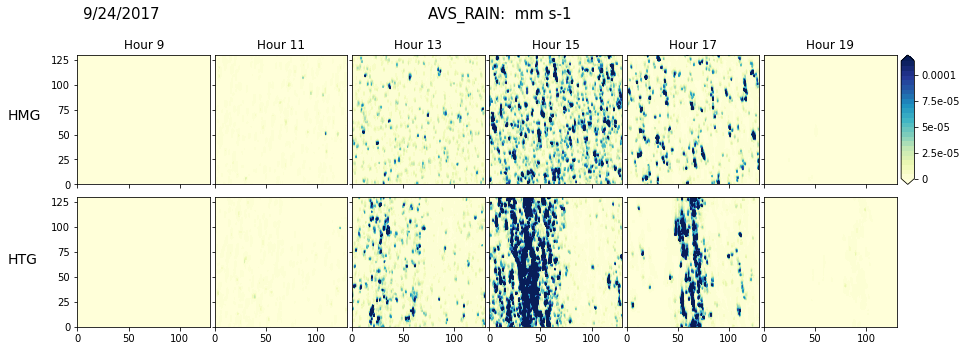

In [68]:
## - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - 
## Plot LES stuff this day between HTG and HMG cases 

varSel = 'AVS_RAIN'
hoursList = [9,11,13,15,17,19]

cMax = np.nanpercentile(lesDay[varSel].values, 99)
cMin = np.nanpercentile(lesDay[varSel].values, 5)

gridspec = {'width_ratios': [1, 1, 1, 1, 1, 1, 0.1]}

fig,axs = plt.subplots(2,len(hoursList)+1, figsize=(15,5), gridspec_kw=gridspec)
axs     = axs.ravel()
fig.subplots_adjust(hspace = 0.1, wspace=0.04)

for iHr in range(len(hoursList)): 
    cplot = axs[iHr].contourf(lesDay.west_east.values, lesDay.south_north.values, 
                      np.squeeze(lesDay[varSel].sel(case='HMG').isel(Time=np.where(lesDay['Time.hour']==hoursList[iHr])[0])),
                      np.arange(cMin, cMax, (cMax-cMin)/26), cmap = 'YlGnBu', extend='both',
                     )
    axs[iHr+len(hoursList)+1].contourf(lesDay.west_east.values, lesDay.south_north.values, 
                      np.squeeze(lesDay[varSel].sel(case='HTG').isel(Time=np.where(lesDay['Time.hour']==hoursList[iHr])[0])),
                      np.arange(cMin, cMax, (cMax-cMin)/26), cmap = 'YlGnBu', extend='both',
                     )
    axs[iHr].set_title('Hour %i' % hoursList[iHr], fontsize=12)
    axs[iHr].xaxis.set_ticklabels([]) 
    
    if iHr!=0:
        axs[iHr].yaxis.set_ticklabels([]) 
        axs[iHr+len(hoursList)+1].yaxis.set_ticklabels([]) 
        
    
## Add colorbar
cb = plt.colorbar(cplot, cax=axs[6], format='%.2g')
tick_locator = ticker.MaxNLocator(nbins=5)
cb.locator = tick_locator
cb.update_ticks()

axs[13].set_visible(False)

    
plt.figtext(0.06, 0.7, 'HMG', fontsize=14)
plt.figtext(0.06, 0.3, 'HTG', fontsize=14)

plt.figtext(0.45, 0.98, (varSel+':  '+lesDay[varSel].units), fontsize=15)
plt.figtext(0.13, 0.98, (str(lesDay['Time.month'].values[0])+'/'+ 
                         str(lesDay['Time.day'].values[0])+'/'+ 
                         str(lesDay['Time.year'].values[0])), fontsize=15)



Text(0.13, 0.98, '9/24/2017')

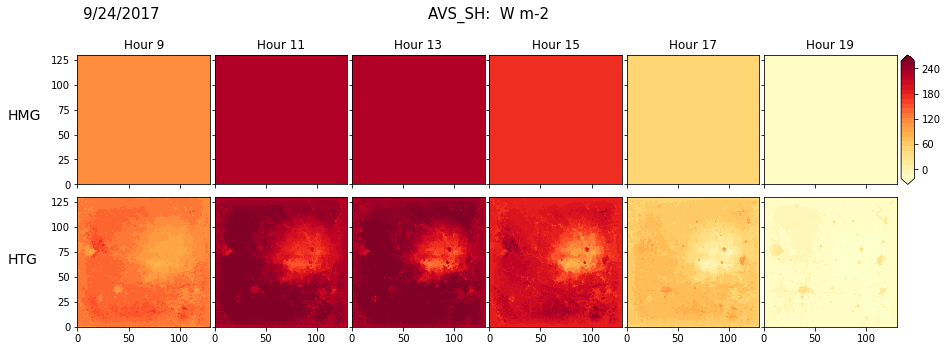

In [70]:
## - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - 
## Plot LES stuff this day between HTG and HMG cases 

varSel = 'AVS_SH'
hoursList = [9,11,13,15,17,19]

cMax = np.nanpercentile(lesDay[varSel].values, 99)
cMin = np.nanpercentile(lesDay[varSel].values, 5)

gridspec = {'width_ratios': [1, 1, 1, 1, 1, 1, 0.1]}

fig,axs = plt.subplots(2,len(hoursList)+1, figsize=(15,5), gridspec_kw=gridspec)
axs     = axs.ravel()
fig.subplots_adjust(hspace = 0.1, wspace=0.04)

for iHr in range(len(hoursList)): 
    cplot = axs[iHr].contourf(lesDay.west_east.values, lesDay.south_north.values, 
                      np.squeeze(lesDay[varSel].sel(case='HMG').isel(Time=np.where(lesDay['Time.hour']==hoursList[iHr])[0])),
                      np.arange(cMin, cMax, (cMax-cMin)/26), cmap = 'YlOrRd', extend='both',
                     )
    axs[iHr+len(hoursList)+1].contourf(lesDay.west_east.values, lesDay.south_north.values, 
                      np.squeeze(lesDay[varSel].sel(case='HTG').isel(Time=np.where(lesDay['Time.hour']==hoursList[iHr])[0])),
                      np.arange(cMin, cMax, (cMax-cMin)/26), cmap = 'YlOrRd', extend='both',
                     )
    axs[iHr].set_title('Hour %i' % hoursList[iHr], fontsize=12)
    axs[iHr].xaxis.set_ticklabels([]) 
    
    if iHr!=0:
        axs[iHr].yaxis.set_ticklabels([]) 
        axs[iHr+len(hoursList)+1].yaxis.set_ticklabels([]) 
        
    
## Add colorbar
cb = plt.colorbar(cplot, cax=axs[6])
tick_locator = ticker.MaxNLocator(nbins=5)
cb.locator = tick_locator
cb.update_ticks()

axs[13].set_visible(False)

    
plt.figtext(0.06, 0.7, 'HMG', fontsize=14)
plt.figtext(0.06, 0.3, 'HTG', fontsize=14)

plt.figtext(0.45, 0.98, (varSel+':  '+lesDay[varSel].units), fontsize=15)
plt.figtext(0.13, 0.98, (str(lesDay['Time.month'].values[0])+'/'+ 
                         str(lesDay['Time.day'].values[0])+'/'+ 
                         str(lesDay['Time.year'].values[0])), fontsize=15)



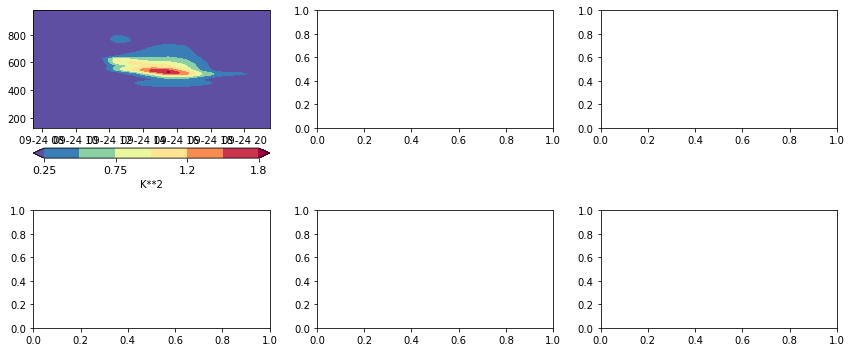

In [77]:
fig,axs = plt.subplots(2,3, figsize=(14.4,7) )
axs = axs.ravel()
fig.subplots_adjust(hspace = 0.7,bottom=0.25)

ctrlCase = 'HMG'
testCase = 'HTG'

maxLev = 500

ctrlDS    = momsDay.sel(case=ctrlCase)
testDS    = momsDay.sel(case=testCase)
diffCases = testDS - ctrlDS

## Plot control cases 
## - - - - - - - - - - - - - - - - - - - - - - - - -
cplt = axs[0].contourf(hrArr_2d, 
                hgtAx.sel(case='HMG').values, 
                np.squeeze(ctrlDS.thl2.values),
                cmap='Spectral_r', extend='both')
# Add colorbar
ax_position = axs[0].get_position()
cbar_ax = fig.add_axes([ax_position.x0, ax_position.y0-0.06, ax_position.width, 0.02])
cbar = plt.colorbar(cplt, orientation='horizontal',cax=cbar_ax, label='K**2',format='%.2g')
cbar.ax.tick_params(labelsize=11) 
cbar.ax.locator_params(nbins=5)



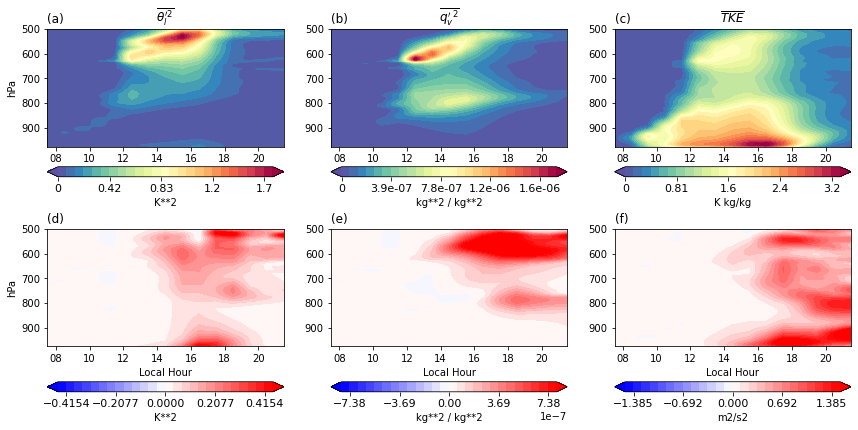

In [83]:
fig,axs = plt.subplots(2,3, figsize=(14.4,7) )
axs = axs.ravel()
fig.subplots_adjust(hspace = 0.7,bottom=0.25)

ctrlCase = 'HMG'
testCase = 'HTG'

maxLev = 500

ctrlDS    = momsDay.sel(case=ctrlCase)
testDS    = momsDay.sel(case=testCase)
diffCases = testDS - ctrlDS

## Plot control cases 
## - - - - - - - - - - - - - - - - - - - - - - - - -
cplt = axs[0].contourf(hrArr_2d, 
                hgtAx.sel(case='HMG').values, 
                np.squeeze(ctrlDS.thl2.values),
                np.arange(0.0,1.8,1.8/26),
                cmap='Spectral_r', extend='both')
# Add colorbar
ax_position = axs[0].get_position()
cbar_ax = fig.add_axes([ax_position.x0, ax_position.y0-0.06, ax_position.width, 0.02])
cbar = plt.colorbar(cplt, orientation='horizontal',cax=cbar_ax, label='K**2',format='%.2g')
cbar.ax.tick_params(labelsize=11) 
cbar.ax.locator_params(nbins=5)


cplt = axs[1].contourf(hrArr_2d, 
                hgtAx.sel(case='HMG').values, 
                np.squeeze(ctrlDS.qv2.values),
                np.arange(0.0, 1.7e-6, (1.7e-6)/26),
                cmap='Spectral_r', extend='both')
# Add colorbar
ax_position = axs[1].get_position()
cbar_ax = fig.add_axes([ax_position.x0, ax_position.y0-0.06, ax_position.width, 0.02])
cbar = plt.colorbar(cplt, orientation='horizontal',cax=cbar_ax, label='kg**2 / kg**2',format='%.2g')
cbar.ax.tick_params(labelsize=11) 
cbar.ax.locator_params(nbins=5)


cplt = axs[2].contourf(hrArr_2d, 
                hgtAx.sel(case='HMG').values, 
                np.squeeze(ctrlDS.TKE_total.values)*0.5,   ## Actual TKE equation is 0.5*(u'2+v'2+w'2)
                np.arange(0, 3.5, (3.5)/26),
                cmap='Spectral_r', extend='both')
# Add colorbar
ax_position = axs[2].get_position()
cbar_ax = fig.add_axes([ax_position.x0, ax_position.y0-0.06, ax_position.width, 0.02])
cbar = plt.colorbar(cplt, orientation='horizontal',cax=cbar_ax, label='K kg/kg',format='%.2g')
cbar.ax.tick_params(labelsize=11) 
cbar.ax.locator_params(nbins=5)



## - - - - - - - - - - - - - - - - - - - - - - - - -
## Plot differences in cases 
## - - - - - - - - - - - - - - - - - - - - - - - - -

cplt = axs[3].contourf(hrArr_2d, 
                    hgtAx.sel(case='HMG').values, 
                    np.squeeze(diffCases.thl2.values),
                    np.arange(-0.45, 0.45+((0.45*2)/26), (0.45*2)/26),
                    cmap='bwr', extend='both')
# Add colorbar
ax_position = axs[3].get_position()
cbar_ax = fig.add_axes([ax_position.x0, ax_position.y0-0.09, ax_position.width, 0.02])
cbar = plt.colorbar(cplt, orientation='horizontal',cax=cbar_ax, label='K**2')
cbar.ax.tick_params(labelsize=11) 
cbar.ax.locator_params(nbins=5)


cplt = axs[4].contourf(hrArr_2d, 
                    hgtAx.sel(case='HMG').values, 
                    np.squeeze(diffCases.qv2.values),
                    np.arange(-0.8e-6, 0.8e-6+((2*0.8e-6)/26), (2*0.8e-6)/26), 
                    cmap='bwr', extend='both')
# Add colorbar
ax_position = axs[4].get_position()
cbar_ax = fig.add_axes([ax_position.x0, ax_position.y0-0.09, ax_position.width, 0.02])
cbar = plt.colorbar(cplt, orientation='horizontal',cax=cbar_ax, label='kg**2 / kg**2')
cbar.ax.tick_params(labelsize=11) 
cbar.ax.locator_params(nbins=5)


cplt = axs[5].contourf(hrArr_2d, 
                    hgtAx.sel(case='HMG').values, 
                    np.squeeze(diffCases.TKE_total.values)*0.5,
                    np.arange(-1.5, 1.5+((2*1.5)/26), (2*1.5)/26), 
                    cmap='bwr', extend='both')
# Add colorbar
ax_position = axs[5].get_position()
cbar_ax = fig.add_axes([ax_position.x0, ax_position.y0-0.09, ax_position.width, 0.02])
cbar = plt.colorbar(cplt, orientation='horizontal',cax=cbar_ax, label='m2/s2')
cbar.ax.tick_params(labelsize=11) 
cbar.ax.locator_params(nbins=5)



## - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - 

axs[0].invert_yaxis()
axs[1].invert_yaxis()
axs[2].invert_yaxis()
axs[3].invert_yaxis()
axs[4].invert_yaxis()
axs[5].invert_yaxis()
# axs[6].invert_yaxis()
# axs[7].invert_yaxis()


axs[0].set_ylim([975, 500])
axs[1].set_ylim([975, 500])
axs[2].set_ylim([975, 500])
axs[3].set_ylim([975, 500])
axs[4].set_ylim([975, 500])
axs[5].set_ylim([975, 500])
# axs[6].set_ylim([975, 500])
# axs[7].set_ylim([975, 500])



axs[0].set_title('(a)', loc='left')
axs[0].set_title(r"$\overline{\theta_l'^2}$")

axs[1].set_title('(b)', loc='left')
axs[1].set_title(r"$\overline{q_v'^2}$")

axs[2].set_title('(c)', loc='left')
axs[2].set_title(r"$\overline{TKE}$")

# axs[3].set_title('(d)', loc='left')
# axs[3].set_title(r"$\overline{Cloud Liquid}$")

axs[3].set_title('(d)', loc='left')
axs[4].set_title('(e)', loc='left')
axs[5].set_title('(f)', loc='left')

axs[0].set_ylabel('hPa')
axs[3].set_ylabel('hPa')

axs[3].set_xlabel('Local Hour')
axs[4].set_xlabel('Local Hour')
axs[5].set_xlabel('Local Hour')

# axs[0].set_xlim([6.8,21.2])
# axs[1].set_xlim([6.8,21.2])
# axs[2].set_xlim([6.8,21.2])
# axs[3].set_xlim([6.8,21.2])
# axs[4].set_xlim([6.8,21.2])
# axs[5].set_xlim([6.8,21.2])


# axs[0].set_xticks([8,10,12,14,16,18,20])
# axs[1].set_xticks([8,10,12,14,16,18,20])
# axs[2].set_xticks([8,10,12,14,16,18,20])
# axs[3].set_xticks([8,10,12,14,16,18,20])
# axs[4].set_xticks([8,10,12,14,16,18,20])
# axs[5].set_xticks([8,10,12,14,16,18,20])

axs[0].xaxis.set_major_formatter(mdates.DateFormatter("%H"))
axs[1].xaxis.set_major_formatter(mdates.DateFormatter("%H"))
axs[2].xaxis.set_major_formatter(mdates.DateFormatter("%H"))
axs[3].xaxis.set_major_formatter(mdates.DateFormatter("%H"))
axs[4].xaxis.set_major_formatter(mdates.DateFormatter("%H"))
axs[5].xaxis.set_major_formatter(mdates.DateFormatter("%H"))


plt.show()

# fig.savefig('/glade/u/home/mdfowler/Analysis/SCAMvLES_figs/Fig3_paper.png')



## Based on analysis of postage stamp plots, try some filtering:

In [103]:
dryDayCutoff = 0.005  ## Cutoff in peak mm/hr to call it a 'dry' day
wetDayCutoff = 0.05   ## Cutoff in peak mm/hr to call it a 'wet' day 

lesRain  = LES_newDefault.meanRain * 3600  ## convert mm/s to mm/hr
scamRain = scamDS.PRECT * 3600 * 1e3      ## convert m/s to mm/hr



In [104]:
les_dailyMaxRain  = lesRain.resample(Time='1D').max().dropna(dim='Time')
scam_dailyMaxRain = scamRain.isel(lat=0,lon=0).resample(time='1D').max().dropna(dim='time')


In [107]:
## Get dry/wet dates 
iDry_les      = np.where(les_dailyMaxRain.max(dim='case')<dryDayCutoff)[0]
iDry_scam     = np.where(scam_dailyMaxRain.max(dim='case')<dryDayCutoff)[0]
idryDays_both = np.sort( list(set(iDry_les) & set(iDry_scam)) )
dryDates_both = pd.DatetimeIndex(les_dailyMaxRain.max(dim='case').Time.values[idryDays_both])

iWet_les      = np.where(les_dailyMaxRain.max(dim='case')>wetDayCutoff)[0]
iWet_scam     = np.where(scam_dailyMaxRain.max(dim='case')>wetDayCutoff)[0]
iwetDays_both = np.sort( list(set(iWet_les) & set(iWet_scam)) )
wetDates_both = pd.DatetimeIndex(les_dailyMaxRain.max(dim='case').Time.values[iwetDays_both])


In [118]:
ikeepWet_SCAM = []
ikeepWet_LES  = []
ikeepDry_SCAM = []
ikeepDry_LES  = []

for iDay in range(len(dryDates_both)):
    allTimes_scam = np.where( (scamDS['time.year'].values == dryDates_both.year.values[iDay]) & 
                              (scamDS['time.month'].values == dryDates_both.month.values[iDay]) & 
                              (scamDS['time.day'].values == dryDates_both.day.values[iDay])  )[0]
    ikeepDry_SCAM = np.append(ikeepDry_SCAM, allTimes_scam) 
    
    allTimes_les = np.where( (LES_newDefault['Time.year'].values == dryDates_both.year.values[iDay]) & 
                              (LES_newDefault['Time.month'].values == dryDates_both.month.values[iDay]) & 
                              (LES_newDefault['Time.day'].values == dryDates_both.day.values[iDay])  )[0]
    ikeepDry_LES = np.append(ikeepDry_LES, allTimes_les) 
    
    
for iDay in range(len(wetDates_both)):
    allTimes_scam = np.where( (scamDS['time.year'].values == wetDates_both.year.values[iDay]) & 
                              (scamDS['time.month'].values == wetDates_both.month.values[iDay]) & 
                              (scamDS['time.day'].values == wetDates_both.day.values[iDay])  )[0]
    ikeepWet_SCAM = np.append(ikeepWet_SCAM, allTimes_scam) 
    
    allTimes_les = np.where( (LES_newDefault['Time.year'].values == wetDates_both.year.values[iDay]) & 
                              (LES_newDefault['Time.month'].values == wetDates_both.month.values[iDay]) & 
                              (LES_newDefault['Time.day'].values == wetDates_both.day.values[iDay])  )[0]
    ikeepWet_LES = np.append(ikeepWet_LES, allTimes_les)     
    
    
    

In [135]:
scamDS_dryDays = scamDS.isel(time=ikeepDry_SCAM.astype(int))
lesDS_dryDays  = LES_newDefault.isel(Time=ikeepDry_LES.astype(int))

scamDS_wetDays = scamDS.isel(time=ikeepWet_SCAM.astype(int))
lesDS_wetDays  = LES_newDefault.isel(Time=ikeepWet_LES.astype(int))



In [ ]:
## Get hourly mean SCAM 
hourlyMeanSCAM_dry  = scamDS_dryDays.groupby('time.hour').mean(dim='time')
hourlyStdSCAM_dry   = scamDS_dryDays.groupby('time.hour').std(dim='time')
hourlyCountSCAM_dry = scamDS_dryDays.groupby('time.hour').count(dim='time')
hourlySE_dry        = hourlyStdSCAM_dry/np.sqrt(hourlyCountSCAM_dry)

hourlyMeanSCAM_wet  = scamDS_wetDays.groupby('time.hour').mean(dim='time')
hourlyStdSCAM_wet   = scamDS_wetDays.groupby('time.hour').std(dim='time')
hourlyCountSCAM_wet = scamDS_wetDays.groupby('time.hour').count(dim='time')
hourlySE_wet        = hourlyStdSCAM_wet/np.sqrt(hourlyCountSCAM_wet)

# ## Get hourly LES
# hrLES_newDefault = LES_newDefault.groupby('Time.hour').mean(dim='Time')
# hrLES_moments    = LES_allDays_allVarsHr.groupby('time.hour').mean(dim='time')

# ## Get time array to be 2D as well, so we can directly contourf the height, not using the mean value
# hrArr_2d     = np.transpose( np.tile(hrLES_newDefault.hour.values, (226,1) ) )
# hrArr_2d_227 = np.transpose( np.tile(hrLES_newDefault.hour.values, (227,1) ) )

# ## Get height axis
# hgtAx = hrLES_newDefault.AVP_P * 1e-2

# ## Get hourly mean SCAM 
# hrLESstd_newDefault       = LES_newDefault.groupby('Time.hour').std(dim='Time')
# hrLESstd_moments          = LES_allDays_allVarsHr.groupby('time.hour').std(dim='time')

# hourlyCountLES_newDefault = LES_newDefault.groupby('Time.hour').count(dim='Time')
# hourlyCountLES_moments    = LES_allDays_allVarsHr.groupby('time.hour').count(dim='time')


# hourlySE_LESdefault = hrLESstd_newDefault/np.sqrt(hourlyCountLES_newDefault)
# hourlySE_LESmoments = hrLESstd_moments/np.sqrt(hourlyCountLES_moments)


## Get budget stuff for SCAM

In [44]:
## Plot budget terms 

def wp2_budget_plot(DS, ctrlCase, testCase,
                    startHr,endHr,
                    xmax,xmin,levName):
    
    # ------- dDry days ----------
    iTimeSel = np.where((DS["time.hour"].values>=startHr) & 
                        (DS["time.hour"].values<=endHr))[0]

    hourlyMean_DS = DS.isel(time=iTimeSel).mean(dim='time')

    print('Means computed over the inclusive period of %i to %i.' % (startHr, endHr))
    
    termNames = ['meanAdv','turbAdv','accum','buoyProd','pressureTerms','dissipation']

    if levName=='ilev':
        budgetNames = ['wp2_ma','wp2_ta','wp2_ac','wp2_bp','wp2_pr1','wp2_pr2','wp2_pr3','wp2_dp1','wp2_dp2','wp2_bt'] 
        
    elif levName=='levInterp':
        budgetNames = ['wp2_ma_interp','wp2_ta_interp','wp2_ac_interp','wp2_bp_interp',
                       'wp2_pr1_interp','wp2_pr2_interp','wp2_pr3_interp','wp2_dp1_interp','wp2_dp2_interp','wp2_bt_interp'] 

    ## Select each case
    HMGvars   = hourlyMean_DS.sel(case=ctrlCase)[budgetNames]
    HTGvars   = hourlyMean_DS.sel(case=testCase)[budgetNames]
        
    
    fig,axs = plt.subplots(2,1, figsize=(5,8))
    axs = axs.ravel()

    colorsList = np.asarray(['firebrick','sandybrown','limegreen','lightseagreen','royalblue','darkviolet'])

    ## This part is prone to human error - 
    ##    would be great to have a more concrete way to identify terms than indexing the lists above
    
    #Mean Advection
    axs[0].plot( np.squeeze(HMGvars[budgetNames[0]].values),   HMGvars[levName].values, color=colorsList[0], label=termNames[0])
    axs[1].plot( np.squeeze(HTGvars[budgetNames[0]].values-HMGvars[budgetNames[0]].values),   HTGvars[levName].values, color=colorsList[0], label=termNames[0])

    
    #TurbulentAdvection
    axs[0].plot( np.squeeze(HMGvars[budgetNames[1]].values),   HMGvars[levName].values, color=colorsList[1], label=termNames[1])
    axs[1].plot( np.squeeze(HTGvars[budgetNames[1]].values-HMGvars[budgetNames[1]].values),   HTGvars[levName].values, color=colorsList[1], label=termNames[1])

        
    #Accumulation
    axs[0].plot( np.squeeze(HMGvars[budgetNames[2]].values),   HMGvars[levName].values, color=colorsList[2], label=termNames[2])
    axs[1].plot( np.squeeze(HTGvars[budgetNames[2]].values-HMGvars[budgetNames[2]].values),   HTGvars[levName].values, color=colorsList[2], label=termNames[2])

                
    #BuoyancyProduction
    axs[0].plot( np.squeeze(HMGvars[budgetNames[3]].values),   HMGvars[levName].values, color=colorsList[3], label=termNames[3])
    axs[1].plot( np.squeeze(HTGvars[budgetNames[3]].values-HMGvars[budgetNames[3]].values),   HTGvars[levName].values, color=colorsList[3], label=termNames[3])

        
    #Pressure Terms
    axs[0].plot( np.squeeze(HMGvars[budgetNames[4]].values+HMGvars[budgetNames[5]].values+HMGvars[budgetNames[6]].values), 
                HMGvars[levName].values, 
                color=colorsList[4], label=termNames[4])
    axs[1].plot( np.squeeze(HTGvars[budgetNames[4]].values+HTGvars[budgetNames[5]].values+HTGvars[budgetNames[6]].values)-np.squeeze(HMGvars[budgetNames[4]].values+HMGvars[budgetNames[5]].values+HMGvars[budgetNames[6]].values), 
            HTGvars[levName].values, 
            color=colorsList[4], label=termNames[4])

 
    #Dissipation Terms
    axs[0].plot( np.squeeze(HMGvars[budgetNames[7]].values+HMGvars[budgetNames[8]].values), 
                HMGvars[levName].values, 
                color=colorsList[5], label=termNames[5])
    axs[1].plot( np.squeeze(HTGvars[budgetNames[7]].values+HTGvars[budgetNames[8]].values)-np.squeeze(HMGvars[budgetNames[7]].values+HMGvars[budgetNames[8]].values), 
                HTGvars[levName].values, 
                color=colorsList[5], label=termNames[5])

    
    # Consistent settings across subplots 
    
    axs[0].set_ylim([500,980])
    axs[0].set_xlim([xmin,xmax])
    axs[0].invert_yaxis()
    axs[0].legend()
    axs[0].set_title(ctrlCase+' wp2 budget')

    axs[1].set_ylim([500,980])
    axs[1].set_xlim([xmin,xmax])
    axs[1].invert_yaxis()
    axs[1].legend()
    axs[1].set_title(testCase+'-'+ctrlCase+' wp2 budget')
    
    axs[0].ticklabel_format(style='sci',scilimits=(-2,4),axis='x')
    axs[1].ticklabel_format(style='sci',scilimits=(-2,4),axis='x')

    axs[0].grid()
    axs[1].grid()

    
    return axs


Means computed over the inclusive period of 17 to 21.


Text(0.5, 0, '$m^2/s^2$')

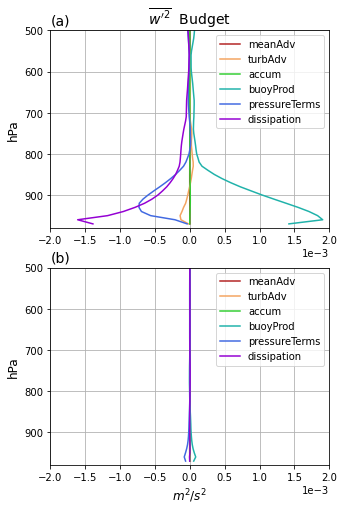

In [53]:
## Real surface:
startHr = 17
endHr   = 21

axs = wp2_budget_plot(scamDS, 'HMG', 'HTG*01',
                    startHr,endHr,
                    0.008,-0.005,'levInterp')

axs[0].set_xlim([-2e-3, 2e-3])
axs[1].set_xlim([-2e-3, 2e-3])

axs[0].set_title('(a)', loc='left', fontsize=14)
axs[0].set_title(r"$\overline{w'^2}$  Budget",fontsize=14)

axs[1].set_title('(b)', loc='left',fontsize=14)
axs[1].set_title('')

axs[0].set_ylabel('hPa',fontsize=12)
axs[1].set_ylabel('hPa', fontsize=12)
axs[1].set_xlabel(r"$m^2/s^2$", fontsize=12)


**Make plot for paper**

Means computed over the inclusive period of 17 to 21.


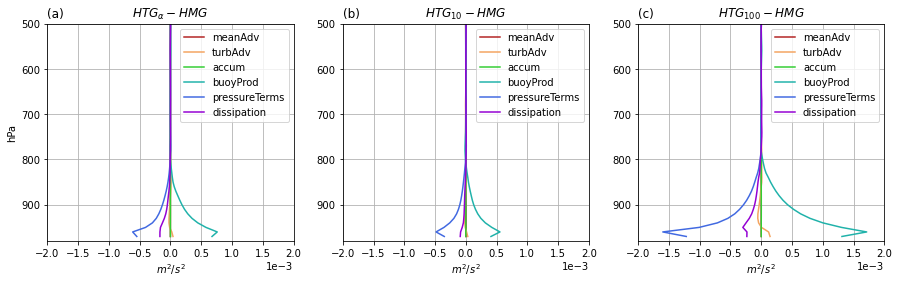

In [81]:
startHr = 17
endHr   = 21


iTimeSel = np.where((scamDS["time.hour"].values>=startHr) & 
                    (scamDS["time.hour"].values<=endHr))[0]

hourlyMean_DS = scamDS.isel(time=iTimeSel).mean(dim='time')

print('Means computed over the inclusive period of %i to %i.' % (startHr, endHr))

termNames = ['meanAdv','turbAdv','accum','buoyProd','pressureTerms','dissipation']

budgetNames = ['wp2_ma_interp','wp2_ta_interp','wp2_ac_interp','wp2_bp_interp',
               'wp2_pr1_interp','wp2_pr2_interp','wp2_pr3_interp','wp2_dp1_interp','wp2_dp2_interp','wp2_bt_interp'] 

## Select each case
HMGvars   = hourlyMean_DS.sel(case=ctrlCase)[budgetNames]
HTGalpha   = hourlyMean_DS.sel(case='HTG*LESmult')[budgetNames]
HTG10      = hourlyMean_DS.sel(case='HTG*10')[budgetNames]
HTG100     = hourlyMean_DS.sel(case='HTG*100')[budgetNames]

diffAlpha = HTGalpha - HMGvars
diff10    = HTG10 - HMGvars
diff100   = HTG100 - HMGvars


fig,axs = plt.subplots(1,3, figsize=(15,4))
axs     = axs.ravel()

colorsList = np.asarray(['firebrick','sandybrown','limegreen','lightseagreen','royalblue','darkviolet'])

#Mean Advection
axs[0].plot( np.squeeze(diffAlpha[budgetNames[0]].values),   HMGvars.levInterp.values, color=colorsList[0], label=termNames[0])
axs[1].plot( np.squeeze(diff10[budgetNames[0]].values),   HMGvars.levInterp.values, color=colorsList[0], label=termNames[0])
axs[2].plot( np.squeeze(diff100[budgetNames[0]].values),   HMGvars.levInterp.values, color=colorsList[0], label=termNames[0])

    
#TurbulentAdvection
axs[0].plot( np.squeeze(diffAlpha[budgetNames[1]].values),   HMGvars.levInterp.values, color=colorsList[1], label=termNames[1])
axs[1].plot( np.squeeze(diff10[budgetNames[1]].values),   HMGvars.levInterp.values, color=colorsList[1], label=termNames[1])
axs[2].plot( np.squeeze(diff100[budgetNames[1]].values),   HMGvars.levInterp.values, color=colorsList[1], label=termNames[1])

        
#Accumulation
axs[0].plot( np.squeeze(diffAlpha[budgetNames[2]].values),   HMGvars.levInterp.values, color=colorsList[2], label=termNames[2])
axs[1].plot( np.squeeze(diff10[budgetNames[2]].values),   HMGvars.levInterp.values, color=colorsList[2], label=termNames[2])
axs[2].plot( np.squeeze(diff100[budgetNames[2]].values),   HMGvars.levInterp.values, color=colorsList[2], label=termNames[2])

                
#BuoyancyProduction
axs[0].plot( np.squeeze(diffAlpha[budgetNames[3]].values),   HMGvars.levInterp.values, color=colorsList[3], label=termNames[3])
axs[1].plot( np.squeeze(diff10[budgetNames[3]].values),   HMGvars.levInterp.values, color=colorsList[3], label=termNames[3])
axs[2].plot( np.squeeze(diff100[budgetNames[3]].values),   HMGvars.levInterp.values, color=colorsList[3], label=termNames[3])

        
#Pressure Terms
axs[0].plot( np.squeeze(diffAlpha[budgetNames[4]].values+diffAlpha[budgetNames[5]].values+diffAlpha[budgetNames[6]].values), 
        HMGvars.levInterp.values, color=colorsList[4], label=termNames[4])
axs[1].plot( np.squeeze(diff10[budgetNames[4]].values+diff10[budgetNames[5]].values+diff10[budgetNames[6]].values), 
        HMGvars.levInterp.values, color=colorsList[4], label=termNames[4])
axs[2].plot( np.squeeze(diff100[budgetNames[4]].values+diff100[budgetNames[5]].values+diff100[budgetNames[6]].values), 
        HMGvars.levInterp.values, color=colorsList[4], label=termNames[4])
 
#Dissipation Terms
axs[0].plot( np.squeeze(diffAlpha[budgetNames[7]].values+diffAlpha[budgetNames[8]].values), 
            HMGvars.levInterp.values, color=colorsList[5], label=termNames[5])
axs[1].plot( np.squeeze(diff10[budgetNames[7]].values+diff10[budgetNames[8]].values), 
            HMGvars.levInterp.values, color=colorsList[5], label=termNames[5])
axs[2].plot( np.squeeze(diff100[budgetNames[7]].values+diff100[budgetNames[8]].values), 
            HMGvars.levInterp.values, color=colorsList[5], label=termNames[5])

    
# Consistent settings across subplots 
axs[0].set_ylim([500,980])
axs[0].set_xlim([-2e-3, 2e-3])
axs[0].invert_yaxis()
axs[0].legend()
# axs[0].set_title('HTGalpha - HMG wp2 budget')

axs[1].set_ylim([500,980])
axs[1].set_xlim([-2e-3, 2e-3])
axs[1].invert_yaxis()
axs[1].legend()

axs[2].set_ylim([500,980])
axs[2].set_xlim([-2e-3, 2e-3])
axs[2].invert_yaxis()
axs[2].legend()

axs[0].set_title('(a)', loc='left')
axs[0].set_title(r"$HTG_\alpha - HMG$")

axs[1].set_title('(b)', loc='left')
axs[1].set_title(r"$HTG_{10} - HMG$")

axs[2].set_title('(c)', loc='left')
axs[2].set_title(r"$HTG_{100} - HMG$")

axs[0].set_ylabel('hPa')
axs[0].set_xlabel("$m^2 /s^2$")
axs[1].set_xlabel("$m^2 /s^2$")
axs[2].set_xlabel("$m^2 /s^2$")


axs[0].ticklabel_format(style='sci',scilimits=(-2,4),axis='x')
axs[1].ticklabel_format(style='sci',scilimits=(-2,4),axis='x')
axs[2].ticklabel_format(style='sci',scilimits=(-2,4),axis='x')

axs[0].grid()
axs[1].grid()
axs[2].grid()



Means computed over the inclusive period of 17 to 21.


(-0.002, 0.002)

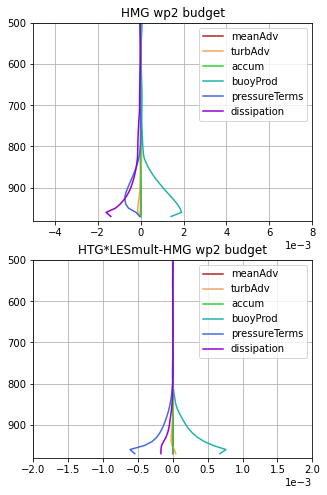

In [60]:
## Real surface:
# startHr = 15
# endHr   = 18
startHr = 17
endHr   = 21

axs = wp2_budget_plot(scamDS, 'HMG', 'HTG*LESmult',
                    startHr,endHr,
                    0.008,-0.005,'levInterp')

# axs[1].set_xlim([-1e-3, 1e-3])
axs[1].set_xlim([-2e-3, 2e-3])


Means computed over the inclusive period of 17 to 21.


(-0.002, 0.002)

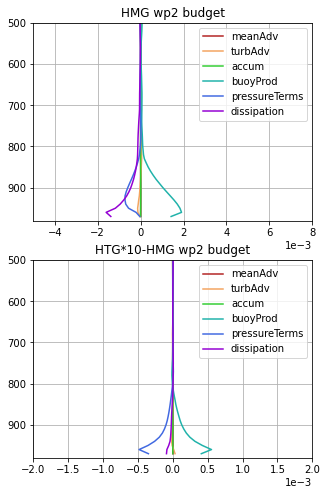

In [59]:
## Real surface:
# startHr = 15
# endHr   = 18
startHr = 17
endHr   = 21

axs = wp2_budget_plot(scamDS, 'HMG', 'HTG*10',
                    startHr,endHr,
                    0.008,-0.005,'levInterp')

axs[1].set_xlim([-2e-3, 2e-3])


Means computed over the inclusive period of 15 to 18.


(-0.0001, 0.0001)

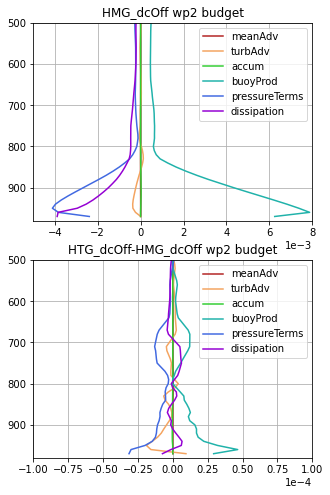

In [118]:
## Real surface:
startHr = 15
endHr   = 18

axs = wp2_budget_plot(scamDS, 'HMG_dcOff', 'HTG_dcOff',
                    startHr,endHr,
                    0.008,-0.005,'levInterp')

axs[1].set_xlim([-0.1e-3, 0.1e-3])

Means computed over the inclusive period of 15 to 18.


(-0.001, 0.001)

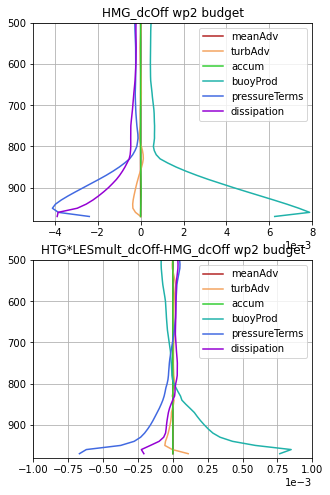

In [119]:
## Real surface:
startHr = 15
endHr   = 18

axs = wp2_budget_plot(scamDS, 'HMG_dcOff', 'HTG*LESmult_dcOff',
                    startHr,endHr,
                    0.008,-0.005,'levInterp')

axs[1].set_xlim([-1e-3, 1e-3])


## Secondary circulation stuff?

In [60]:
circulationTXT = '/glade/work/mdfowler/CLASP/LESdata_fromJason/circulations.txt'

circMetric = pd.read_csv(circulationTXT, sep=" ", header=None)
circMetric.columns = ['dateVal', 'metricVal']


In [79]:
# Isolate to the same days that we've been analyzing
keepCircDays = []
for iDay in range(len(uniqDays_scam)): 
    
    thisDay  = pd.to_datetime(uniqDays_scam[iDay])
    dateInt  = int(str(thisDay.year)+str(thisDay.month).zfill(2)+str(thisDay.day).zfill(2))
    
    iMatch = np.where(circMetric.dateVal.values == dateInt)[0]
    
    keepCircDays = np.append(keepCircDays, int(iMatch))


In [83]:
circStrength = circMetric.metricVal.values[keepCircDays.astype(int)]

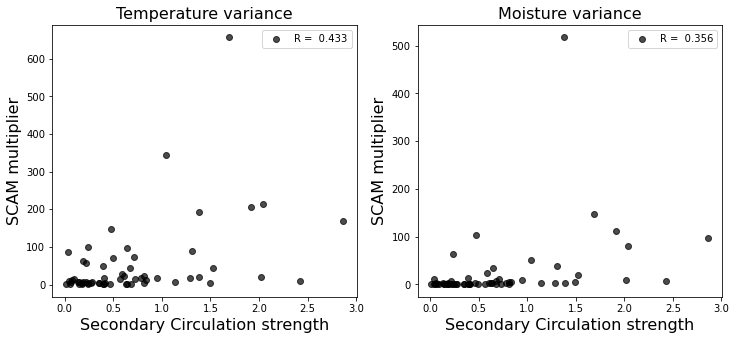

In [94]:
fig,axs = plt.subplots(1,2, figsize=(12,5))
axs     = axs.ravel()

xVar   = circStrength
xLabel = 'Secondary Circulation strength'

axs[0].plot(xVar, SCAMmultiplier_thl2_match, 'ko', alpha=0.7)
axs[1].plot(xVar, SCAMmultiplier_qv2_match, 'ko', alpha=0.7)

axs[0].set_xlabel(xLabel,fontsize=16)
axs[1].set_xlabel(xLabel,foclntsize=16)

axs[0].set_ylabel('SCAM multiplier',fontsize=16)
axs[1].set_ylabel('SCAM multiplier',fontsize=16)

axs[0].set_title('Temperature variance',fontsize=16)
axs[1].set_title('Moisture variance',fontsize=16)

axs[0].legend(['R = % .3f' % (np.corrcoef(xVar, SCAMmultiplier_thl2_match)[0,1])])
axs[1].legend(['R = % .3f' % (np.corrcoef(xVar, SCAMmultiplier_qv2_match)[0,1])])

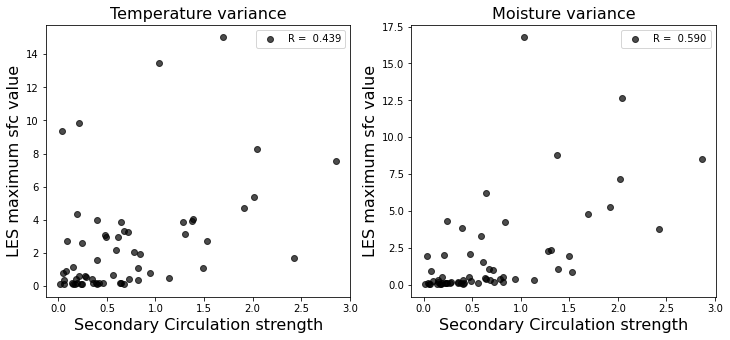

In [102]:
fig,axs = plt.subplots(1,2, figsize=(12,5))
axs     = axs.ravel()

xVar   = circStrength
xLabel = 'Secondary Circulation strength'

axs[0].plot(xVar, np.squeeze(LES_maxSfc30_thl2), 'ko', alpha=0.7)
axs[1].plot(xVar, np.squeeze(LES_maxSfc30_qv2*1e6), 'ko', alpha=0.7)

axs[0].set_xlabel(xLabel,fontsize=16)
axs[1].set_xlabel(xLabel,fontsize=16)

axs[0].set_ylabel('LES maximum sfc value',fontsize=16)
axs[1].set_ylabel('LES maximum sfc value',fontsize=16)

axs[0].set_title('Temperature variance',fontsize=16)
axs[1].set_title('Moisture variance',fontsize=16)

axs[0].legend(['R = % .3f' % (np.corrcoef(xVar, np.squeeze(LES_maxSfc30_thl2))[0,1])])
axs[1].legend(['R = % .3f' % (np.corrcoef(xVar, np.squeeze(LES_maxSfc30_qv2*1e6))[0,1])])

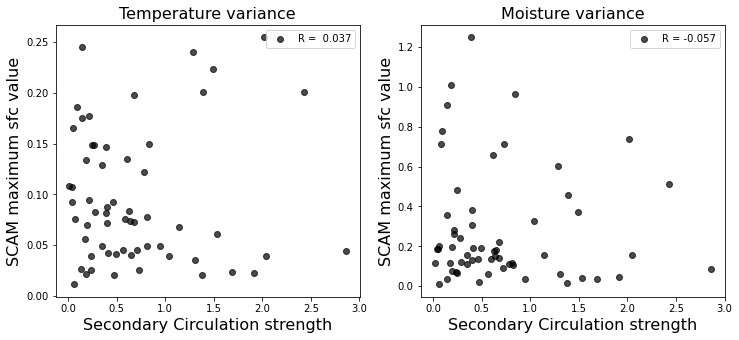

In [103]:
fig,axs = plt.subplots(1,2, figsize=(12,5))
axs     = axs.ravel()

xVar   = circStrength
xLabel = 'Secondary Circulation strength'

axs[0].plot(xVar, np.squeeze(scam_maxSfc_thlp2), 'ko', alpha=0.7)
axs[1].plot(xVar, np.squeeze(scam_maxSfc_rtp2), 'ko', alpha=0.7)

axs[0].set_xlabel(xLabel,fontsize=16)
axs[1].set_xlabel(xLabel,fontsize=16)

axs[0].set_ylabel('SCAM maximum sfc value',fontsize=16)
axs[1].set_ylabel('SCAM maximum sfc value',fontsize=16)

axs[0].set_title('Temperature variance',fontsize=16)
axs[1].set_title('Moisture variance',fontsize=16)

axs[0].legend(['R = % .3f' % (np.corrcoef(xVar, np.squeeze(scam_maxSfc_thlp2))[0,1])])
axs[1].legend(['R = % .3f' % (np.corrcoef(xVar, np.squeeze(scam_maxSfc_rtp2))[0,1])])

### What about a few plots of rainfall differences between HMG and HTG in LES??

Text(0.01, 0.28, 'HTG')

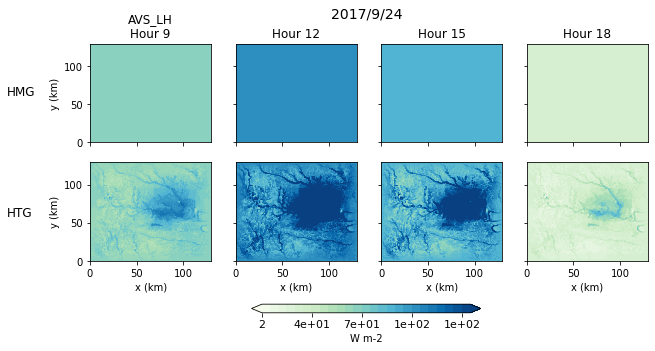

In [153]:
selDay = np.where( (LES_newDefault['Time.year']==2017) & 
                   (LES_newDefault['Time.month']==9) & 
                   (LES_newDefault['Time.day']==24) )[0]

# selDay = np.where( (LES_newDefault['Time.year']==2016) & 
#                    (LES_newDefault['Time.month']==6) & 
#                    (LES_newDefault['Time.day']==10) )[0]


# selDay = np.where( (LES_newDefault['Time.year']==2017) & 
#                    (LES_newDefault['Time.month']==7) & 
#                    (LES_newDefault['Time.day']==16) )[0]

dayLES = LES_newDefault.isel(Time=selDay)

hourSel = [9,12,15,18]
# varSel  = 'AVS_LWP'
# varSel  = 'AVS_RAIN'
varSel    = 'AVS_LH'

cMax    = np.nanpercentile(dayLES[varSel].values, 98)
cMin    = np.nanpercentile(dayLES[varSel].values, 5)
cLevs   = np.arange(cMin, cMax+((cMax-cMin)/25), (cMax-cMin)/25)

fig,axs = plt.subplots(2,len(hourSel), figsize=(10,4))
axs     = axs.ravel()
# Add date to plot
plt.figtext(0.46, 0.97, str(dayLES['Time.year'].values[0])+'/'+str(dayLES['Time.month'].values[0])+'/'+str(dayLES['Time.day'].values[0]), fontsize=14)


for iHrs in range(len(hourSel)):
    hrSel = dayLES.isel(Time=np.where(dayLES['Time.hour'].values==hourSel[iHrs])[0])
        
    axs[iHrs].contourf(hrSel.west_east.values, hrSel.south_north.values, 
                         np.squeeze(hrSel[varSel].sel(case='HMG').values),
                         cLevs, cmap='GnBu', extend='both')
    
    cplt = axs[iHrs+4].contourf(hrSel.west_east.values, hrSel.south_north.values, 
                         np.squeeze(hrSel[varSel].sel(case='HTG').values),
                         cLevs, cmap='GnBu', extend='both')
    
    ## Add a colorbar 
    if iHrs==int(np.floor(len(hourSel)/2)):
        ax_position = axs[iHrs+4].get_position()
        cbar_ax = fig.add_axes([ax_position.x0-0.18, ax_position.y0-0.18, ax_position.width+0.15, 0.03])
        cbar = plt.colorbar(cplt, orientation='horizontal',cax=cbar_ax, label=LES_newDefault[varSel].units, format='%.1g')
        cbar.ax.tick_params(labelsize=11) 
        cbar.ax.locator_params(nbins=5)

    
    if iHrs==0:
        axs[iHrs].set_title(varSel+'\nHour '+str(hourSel[iHrs]) )
        axs[iHrs].set_ylabel('y (km)')
        axs[iHrs+4].set_ylabel('y (km)')
    else: 
        axs[iHrs].set_title('Hour '+str(hourSel[iHrs]) )  
        axs[iHrs].set_yticklabels([])
        axs[iHrs+4].set_yticklabels([])
        
    axs[iHrs].set_xticklabels([])
    axs[iHrs+4].set_xlabel('x (km)')
        
    
# Add HMG/HTG labels 
plt.figtext(0.01, 0.70, 'HMG', fontsize=12)
plt.figtext(0.01, 0.28, 'HTG', fontsize=12)




In [101]:
dayLES

<xarray.Dataset>
Dimensions:      (Time: 15, bottom_top: 226, case: 2, south_north: 520, west_east: 520)
Coordinates:
  * Time         (Time) datetime64[ns] 2017-09-24T07:30:00 ... 2017-09-24T21:...
  * west_east    (west_east) float64 0.0 0.25 0.5 0.75 ... 129.2 129.5 129.8
  * south_north  (south_north) float64 0.0 0.25 0.5 0.75 ... 129.2 129.5 129.8
  * case         (case) object 'HMG' 'HTG'
Dimensions without coordinates: bottom_top
Data variables:
    XTIME        (case, Time) float32 60.0 120.0 180.0 ... 780.0 840.0 900.0
    AVS_SH       (case, Time, south_north, west_east) float32 9.758 ... -19.92
    AVS_LH       (case, Time, south_north, west_east) float32 15.09 ... 2.08
    AVS_LWP      (case, Time, south_north, west_east) float32 0.0 ... 0.004092
    AVS_RAIN     (case, Time, south_north, west_east) float32 0.0 0.0 ... 0.0
    AVP_QC       (case, Time, bottom_top) float32 0.0 0.0 0.0 ... 0.0 0.0 0.0
    AVP_QV       (case, Time, bottom_top) float32 0.01383 0.01383 ... 4.67e-06
    AVP_Z        (case, Time, bottom_top) float32 15.48 46.38 ... 1.47e+04
    AVP_P        (case, Time, bottom_top) float32 9.74e+04 ... 1.297e+04
    AVP_THL      (case, Time, bottom_top) float32 299.5 299.6 ... 361.9 362.0
    AVP_TH       (case, Time, bottom_top) float32 299.5 299.6 ... 361.9 362.0
    AVP_LWC      (case, Time, bottom_top) float32 0.0 0.0 0.0 ... 0.0 0.0 0.0
    AVP_IWC      (case, Time, bottom_top) float32 0.0 0.0 0.0 ... 0.0 0.0 0.0
Attributes:
    TITLE:                            OUTPUT FROM WRF V3.8.1 MODEL
    START_DATE:                      2015-06-06_12:00:00
    WEST-EAST_GRID_DIMENSION:        521
    SOUTH-NORTH_GRID_DIMENSION:      521
    BOTTOM-TOP_GRID_DIMENSION:       227
    DX:                              250.0
    DY:                              250.0
    GRIDTYPE:                        C
    DIFF_OPT:                        2
    KM_OPT:                          3
    DAMP_OPT:                        3
    DAMPCOEF:                        0.2
    KHDIF:                           0.0
    KVDIF:                           0.0
    MP_PHYSICS:                      8
    RA_LW_PHYSICS:                   4
    RA_SW_PHYSICS:                   4
    SF_SFCLAY_PHYSICS:               44
    SF_SURFACE_PHYSICS:              0
    BL_PBL_PHYSICS:                  0
    CU_PHYSICS:                      0
    SF_LAKE_PHYSICS:                 0
    SURFACE_INPUT_SOURCE:            3
    SST_UPDATE:                      0
    GRID_FDDA:                       0
    GFDDA_INTERVAL_M:                0
    GFDDA_END_H:                     0
    GRID_SFDDA:                      0
    SGFDDA_INTERVAL_M:               0
    SGFDDA_END_H:                    0
    HYPSOMETRIC_OPT:                 1
    USE_THETA_M:                     1
    WEST-EAST_PATCH_START_UNSTAG:    1
    WEST-EAST_PATCH_END_UNSTAG:      520
    WEST-EAST_PATCH_START_STAG:      1
    WEST-EAST_PATCH_END_STAG:        521
    SOUTH-NORTH_PATCH_START_UNSTAG:  1
    SOUTH-NORTH_PATCH_END_UNSTAG:    520
    SOUTH-NORTH_PATCH_START_STAG:    1
    SOUTH-NORTH_PATCH_END_STAG:      521
    BOTTOM-TOP_PATCH_START_UNSTAG:   1
    BOTTOM-TOP_PATCH_END_UNSTAG:     226
    BOTTOM-TOP_PATCH_START_STAG:     1
    BOTTOM-TOP_PATCH_END_STAG:       227
    GRID_ID:                         1
    PARENT_ID:                       0
    I_PARENT_START:                  0
    J_PARENT_START:                  0
    PARENT_GRID_RATIO:               1
    DT:                              0.5
    CEN_LAT:                         0.0
    CEN_LON:                         0.0
    TRUELAT1:                        0.0
    TRUELAT2:                        0.0
    MOAD_CEN_LAT:                    0.0
    STAND_LON:                       0.0
    POLE_LAT:                        0.0
    POLE_LON:                        0.0
    GMT:                             0.0
    JULYR:                           0
    JULDAY:                          1
    MAP_PROJ:                        0
    MAP

In [97]:
LES_newDefault['AVS_RAIN']

<xarray.DataArray 'AVS_RAIN' (case: 2, Time: 900, south_north: 520, west_east: 520)>
array([[[[0., 0., 0., ..., 0., 0., 0.],
         [0., 0., 0., ..., 0., 0., 0.],
         [0., 0., 0., ..., 0., 0., 0.],
         ...,
         [0., 0., 0., ..., 0., 0., 0.],
         [0., 0., 0., ..., 0., 0., 0.],
         [0., 0., 0., ..., 0., 0., 0.]],

        [[0., 0., 0., ..., 0., 0., 0.],
         [0., 0., 0., ..., 0., 0., 0.],
         [0., 0., 0., ..., 0., 0., 0.],
         ...,
         [0., 0., 0., ..., 0., 0., 0.],
         [0., 0., 0., ..., 0., 0., 0.],
         [0., 0., 0., ..., 0., 0., 0.]],

        [[0., 0., 0., ..., 0., 0., 0.],
         [0., 0., 0., ..., 0., 0., 0.],
         [0., 0., 0., ..., 0., 0., 0.],
         ...,
...
         ...,
         [0., 0., 0., ..., 0., 0., 0.],
         [0., 0., 0., ..., 0., 0., 0.],
         [0., 0., 0., ..., 0., 0., 0.]],

        [[0., 0., 0., ..., 0., 0., 0.],
         [0., 0., 0., ..., 0., 0., 0.],
         [0., 0., 0., ..., 0., 0., 0.],
         ...,
         [0., 0., 0., ..., 0., 0., 0.],
         [0., 0., 0., ..., 0., 0., 0.],
         [0., 0., 0., ..., 0., 0., 0.]],

        [[0., 0., 0., ..., 0., 0., 0.],
         [0., 0., 0., ..., 0., 0., 0.],
         [0., 0., 0., ..., 0., 0., 0.],
         ...,
         [0., 0., 0., ..., 0., 0., 0.],
         [0., 0., 0., ..., 0., 0., 0.],
         [0., 0., 0., ..., 0., 0., 0.]]]], dtype=float32)
Coordinates:
  * Time         (Time) datetime64[ns] 2015-06-06T07:30:00 ... 2018-07-10T21:...
  * west_east    (west_east) float64 0.0 0.25 0.5 0.75 ... 129.2 129.5 129.8
  * south_north  (south_north) float64 0.0 0.25 0.5 0.75 ... 129.2 129.5 129.8
  * case         (case) object 'HMG' 'HTG'
Attributes:
    FieldType:    104
    MemoryOrder:  XY 
    description:  rain at surface
    units:        mm s-1
    stagger:      
    coordinates:  XLONG XLAT XTIME

## Test: Get cloud depth in LES

In [2]:
def preprocess_LES(ds):
    dsTimes = ds.Times.load()
    
    times = []
    for iT in range(len(dsTimes.values)):
        timeNow = datetime.datetime.strptime(dsTimes.astype(str).values[iT], '%Y-%m-%d_%H:%M:%S')
        times   = np.append(times, timeNow)

    ds = ds.assign_coords({"Time": times, 
                           "west_east": (ds.west_east.load().values)*0.250,
                           "south_north": (ds.south_north.load().values)*0.250})
    
    return ds.load()

In [3]:
savePath = '/glade/campaign/cgd/tss/mdfowler/CLASP_LES_data/hydrology.cee.duke.edu/'

# dirs = np.sort(glob.glob(savePath+'fr2_*'))
dirs = np.sort(glob.glob(savePath+'fr2_20170716*'))

iDir = 0 

fileNames = np.sort(glob.glob(dirs[iDir]+'/diag_d01*'))

testDS = xr.open_mfdataset(fileNames, preprocess=preprocess_LES, concat_dim='Time', 
                                combine='nested', decode_times=False, 
                                data_vars='minimal')


In [4]:
## Convert to local time and drop first time 
testDS['Time'] = testDS['Time'].values - np.timedelta64(5, 'h') # And convert to local time by -5hrs 
print(len(testDS.Time.values))

iTimes = np.where(testDS['Time'].values >= (testDS['Time'].values[0] + np.timedelta64(1, 'h')) )[0]

testDS = testDS.isel(Time=iTimes)
print(len(testDS.Time.values))


16
15


In [5]:
## Get time array to be 2D as well, so we can directly contourf the height, not using the mean value
timeArr_2d = np.transpose( np.tile(testDS.Time.values, (226,1) ) )


Text(0, 0.5, 'mm s-1')

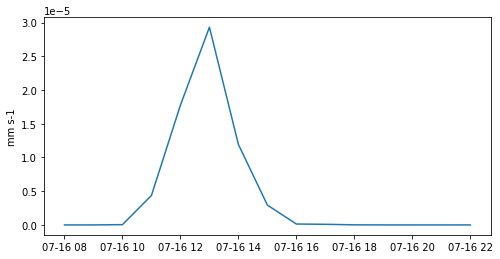

In [6]:
fig,axs = plt.subplots(1,1, figsize=(8,4))
plt.plot(testDS.Time.values, testDS.AVS_RAIN.mean(("south_north","west_east")).values )
plt.ylabel(testDS.AVS_RAIN.units)

In [14]:
testDS

<xarray.Dataset>
Dimensions:      (Time: 15, bottom_top: 226, south_north: 520, west_east: 520)
Coordinates:
  * Time         (Time) datetime64[ns] 2017-07-16T08:00:00 ... 2017-07-16T22:...
  * west_east    (west_east) float64 0.0 0.25 0.5 0.75 ... 129.2 129.5 129.8
  * south_north  (south_north) float64 0.0 0.25 0.5 0.75 ... 129.2 129.5 129.8
Dimensions without coordinates: bottom_top
Data variables:
    AVP_IWC      (Time, bottom_top) float32 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0
    AVP_LWC      (Time, bottom_top) float32 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0
    AVP_P        (Time, bottom_top) float32 9.788e+04 9.753e+04 ... 1.311e+04
    AVP_QC       (Time, bottom_top) float32 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0
    AVP_QG       (Time, bottom_top) float32 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0
    AVP_QI       (Time, bottom_top) float32 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0
    AVP_QR       (Time, bottom_top) float32 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0
    AVP_QS       (Time, bottom_top) float32 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0
    AVP_QV       (Time, bottom_top) float32 0.01834 0.01818 ... 1.837e-06
    AVP_RHO      (Time, bottom_top) float32 1.11 1.106 1.102 ... 0.2266 0.2204
    AVP_TH       (Time, bottom_top) float32 300.4 300.6 301.1 ... 369.2 370.4
    AVP_THL      (Time, bottom_top) float32 300.4 300.6 301.1 ... 369.2 370.4
    AVP_THV      (Time, bottom_top) float32 303.8 303.9 304.5 ... 369.2 370.4
    AVP_TK       (Time, bottom_top) float32 298.6 298.4 298.7 ... 208.7 207.3
    AVP_Z        (Time, bottom_top) float32 15.5 46.42 ... 1.45e+04 1.478e+04
    AVS_GRDFLX   (Time, south_north, west_east) float32 0.0 0.0 0.0 ... 0.0 0.0
    AVS_IWP      (Time, south_north, west_east) float32 0.0 0.0 0.0 ... 0.0 0.0
    AVS_LH       (Time, south_north, west_east) float32 51.51 51.51 ... 9.678
    AVS_LWDNB    (Time, south_north, west_east) float32 399.1 399.1 ... 408.2
    AVS_LWP      (Time, south_north, west_east) float32 0.0 0.0 0.0 ... 0.0 0.0
    AVS_LWUPB    (Time, south_north, west_east) float32 447.3 447.3 ... 465.4
    AVS_PK1      (Time, south_north, west_east) float32 9.788e+04 ... 9.782e+04
    AVS_PSFC     (Time, south_north, west_east) float32 9.805e+04 ... 9.799e+04
    AVS_Q2       (Time, south_north, west_east) float32 0.0 0.0 0.0 ... 0.0 0.0
    AVS_QK1      (Time, south_north, west_east) float32 0.01832 ... 0.01319
    AVS_RAIN     (Time, south_north, west_east) float32 0.0 0.0 0.0 ... 0.0 0.0
    AVS_SH       (Time, south_north, west_east) float32 43.77 43.77 ... -21.48
    AVS_SWDNB    (Time, south_north, west_east) float32 143.7 143.8 ... 0.0 0.0
    AVS_SWUPB    (Time, south_north, west_east) float32 35.56 35.57 ... 0.0 0.0
    AVS_T2       (Time, south_north, west_east) float32 0.0 0.0 0.0 ... 0.0 0.0
    AVS_THK1     (Time, south_north, west_east) float32 300.4 300.4 ... 306.3
    AVS_TKK1     (Time, south_north, west_east) float32 298.6 298.6 ... 304.4
    AVS_TRAD     (Time, south_north, west_east) float32 297.7 297.7 ... 300.7
    AVS_TSK      (Time, south_north, west_east) float32 298.1 298.1 ... 301.0
    AVT_GRDFLX   (Time) float32 0.0 0.0 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0 0.0
    AVT_IWP      (Time) float32 0.0 0.0 4.855e-15 1.944e-12 ... 0.0 0.0 0.0 0.0
    AVT_LH       (Time) float32 52.38 95.06 140.4 178.4 ... 52.77 23.09 10.08
    AVT_LWDNB    (Time) float32 399.1 407.5 424.3 425.2 ... 415.7 411.0 403.7
    AVT_LWP      (Time) float32 0.0 9.889e-05 0.02754 ... 8.932e-07 7.698e-10
    AVT_LWUPB    (Time) float32 447.5 461.2 476.8 492.6 ... 494.2 478.9 465.8
    AVT_PK1      (Time) float32 9.788e+04 9.788e+04 ... 9.782e+04 9.783e+04
    AVT_PSFC     (Time) float32 9.805e+04 9.805e+04 ... 9.799e+04 9.8e+04
    AVT_Q2       (Time) float32 nan nan nan nan nan nan ... nan nan nan nan nan
    AVT_QK1      (Time) float32 0.01834 0.01759 0.01681 ... 0.01306 0.01354
    AVT_SH       (Time) float32 43.14 88.08 134.3 177.1 ... 18.81 -10.39 -21.7
    AVT_SWDNB    (Time) float32 152.3 346.1 436.6 574.6 

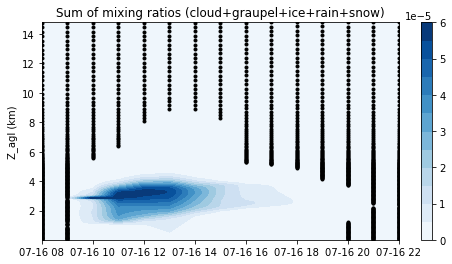

In [17]:
fig,axs = plt.subplots(1,1, figsize=(8,4))

hgtAx = testDS.AVP_Z.values * 1e-3

varsAll = testDS.AVP_QC + testDS.AVP_QG + testDS.AVP_QI + testDS.AVP_QR + testDS.AVP_QS

cplt = axs.contourf(timeArr_2d, hgtAx, 
             varsAll.values, 
             np.arange(0,6.5e-5,0.5e-5),
             cmap='Blues')
fig.colorbar(cplt)
axs.set_ylabel('Z_agl (km)')
axs.set_title('Sum of mixing ratios (cloud+graupel+ice+rain+snow)')

for iT in range(len(testDS.Time.values)):
    for iZ in range(len(testDS.bottom_top.values)):
        if testDS[varSel].values[iT,iZ]==0:
            axs.plot(testDS.Time.values[iT], hgtAx[iT, iZ], 'k.')
        


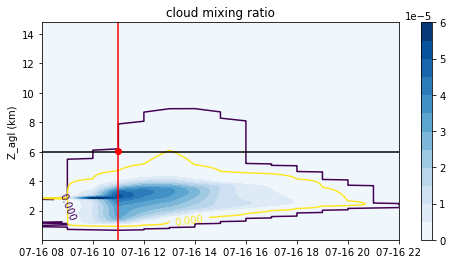

In [80]:
fig,axs = plt.subplots(1,1, figsize=(8,4))

hgtAx = testDS.AVP_Z.values * 1e-3

varSel = 'AVP_QC'

cplt = axs.contourf(timeArr_2d, hgtAx, 
             testDS[varSel].values,
             np.arange(0,6.5e-5,0.5e-5),
             cmap='Blues')
fig.colorbar(cplt)
axs.set_ylabel('Z_agl (km)')
axs.set_title(testDS[varSel].description)

CS = axs.contour(timeArr_2d, hgtAx, 
             testDS[varSel].values, [0.0, 0.1e-6])
axs.clabel(CS, inline=True, fontsize=10)

axs.axhline(6, color='k')

iHrDC  = np.where( (testDS.AVP_Z.values>=6e3) & (testDS.AVP_QC.values>0) )
axs.axvline(testDS.Time.values[iHrDC[0][0]], color='red')
axs.plot(testDS.Time.values[iHrDC[0][0]], testDS.AVP_Z.values[iHrDC[0][0], iHrDC[1][0]]*1e-3, 'ro')


In [13]:
# fig,axs = plt.subplots(1,1, figsize=(8,4))

# varSel = 'AVP_QC'

# cplt = axs.contourf(testDS.Time.values, testDS.bottom_top.values, 
#              np.transpose(testDS[varSel].values),
#              np.arange(0,6.5e-5,0.5e-5),
#              cmap='Blues')
# fig.colorbar(cplt)
# axs.set_ylabel('height index')
# axs.set_title(testDS[varSel].description)


# for iT in range(len(testDS.Time.values)):
#     for iZ in range(len(testDS.bottom_top.values)):
#         if testDS[varSel].values[iT,iZ]==0:
#             axs.plot(testDS.Time.values[iT], testDS.bottom_top.values[iZ], 'k.')
        


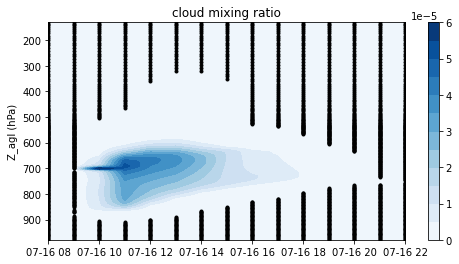

In [9]:
fig,axs = plt.subplots(1,1, figsize=(8,4))

hgtAx = testDS.AVP_P.values * 1e-2

varSel = 'AVP_QC'

cplt = axs.contourf(timeArr_2d, hgtAx, 
                     testDS[varSel].values, 
                     np.arange(0,6.5e-5,0.5e-5),
                     cmap='Blues')
plt.colorbar(cplt)
# plt.ylabel('Z_agl (km)')
axs.set_ylabel('Z_agl (hPa)')
plt.title(testDS[varSel].description)

axs.invert_yaxis()

for iT in range(len(testDS.Time.values)):
    for iZ in range(len(testDS.bottom_top.values)):
        if testDS[varSel].values[iT,iZ]==0:
            axs.plot(testDS.Time.values[iT], hgtAx[iT, iZ], 'k.')
        


In [11]:
# testOtherDS = xr.open_dataset('/glade/scratch/mdfowler/CLASP_LESoutput/defaultOutput/hydrology.cee.duke.edu/doz_20170716_00/diag_selectVars.nc', 
#                               decode_times=False)



In [10]:
# fig,axs = plt.subplots(1,1, figsize=(8,4))
# plt.plot(testOtherDS.Time.values, testOtherDS.AVS_RAIN.mean(("south_north","west_east")).values )
# plt.ylabel(testOtherDS.AVS_RAIN.units)

In [12]:
# # hgtAx = testOtherDS.AVP_Z.mean(dim='Time').values *1e-3

# varSel = 'AVP_QC'

# plt.contourf(testOtherDS.Time.values, testOtherDS.bottom_top.values, 
#              np.transpose(testOtherDS[varSel].values), 
#              cmap='Blues')
# plt.colorbar()
# plt.ylabel('Z_agl (km)')
# plt.title(testOtherDS[varSel].description)

# # for iT in range(len(testDS.Time.values)):
# #     for iZ in range(len(testDS.bottom_top.values)):
# #         if testDS[varSel].values[iT,iZ]==0:
# #             plt.plot(testDS.Time.values[iT], hgtAx[iZ], 'k.')
        


**Check a second date**

In [28]:
savePath = '/glade/campaign/cgd/tss/mdfowler/CLASP_LES_data/hydrology.cee.duke.edu/'

# dirs = np.sort(glob.glob(savePath+'fr2_*'))
dirs = np.sort(glob.glob(savePath+'fr2_20170712*'))

iDir = 0 

fileNames = np.sort(glob.glob(dirs[iDir]+'/diag_d01*'))

testDS2   = xr.open_mfdataset(fileNames, preprocess=preprocess_LES, concat_dim='Time', 
                                combine='nested', decode_times=False, 
                                data_vars='minimal')


In [33]:
## Convert to local time and drop first time 
testDS2['Time'] = testDS2['Time'].values - np.timedelta64(5, 'h') # And convert to local time by -5hrs 
print(len(testDS2.Time.values))

iTimes = np.where(testDS2['Time'].values >= (testDS2['Time'].values[0] + np.timedelta64(1, 'h')) )[0]

testDS2 = testDS2.isel(Time=iTimes)
print(len(testDS2.Time.values))


16
15


In [34]:
## Get time array to be 2D as well, so we can directly contourf the height, not using the mean value
timeArr2_2d = np.transpose( np.tile( testDS2.Time.values, (226,1) ) )


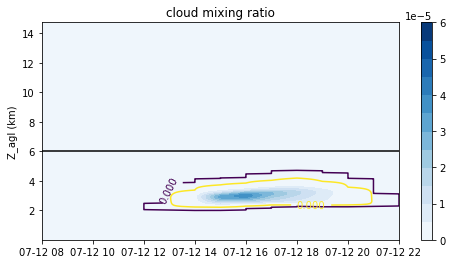

In [82]:
fig,axs = plt.subplots(1,1, figsize=(8,4))

hgtAx = testDS2.AVP_Z.values * 1e-3

varSel = 'AVP_QC'

cplt = axs.contourf(timeArr2_2d, hgtAx, 
             testDS2[varSel].values,
             np.arange(0,6.5e-5,0.5e-5),
             cmap='Blues')
fig.colorbar(cplt)
axs.set_ylabel('Z_agl (km)')
axs.set_title(testDS2[varSel].description)

CS = axs.contour(timeArr2_2d, hgtAx, 
                 testDS2[varSel].values, [0.0, 0.1e-6])
axs.clabel(CS, inline=True, fontsize=10)

axs.axhline(6, color='k')


iHrDC  = np.where( (testDS2.AVP_Z.values>=6e3) & (testDS2.AVP_QC.values>0) )
if len(iHrDC[0][:])>0:
    axs.axvline(testDS2.Time.values[iHrDC[0][0]], color='red')
    axs.plot(testDS2.Time.values[iHrDC[0][0]], testDS2.AVP_Z.values[iHrDC[0][0], iHrDC[1][0]]*1e-3, 'ro')


In [36]:
savePath = '/glade/campaign/cgd/tss/mdfowler/CLASP_LES_data/hydrology.cee.duke.edu/'

# dirs = np.sort(glob.glob(savePath+'fr2_*'))
dirs = np.sort(glob.glob(savePath+'fr2_20160819*'))

iDir = 0 

fileNames = np.sort(glob.glob(dirs[iDir]+'/diag_d01*'))

testDS3   = xr.open_mfdataset(fileNames, preprocess=preprocess_LES, concat_dim='Time', 
                                combine='nested', decode_times=False, 
                                data_vars='minimal')

print('Loaded the data')

## Convert to local time and drop first time 
testDS3['Time'] = testDS3['Time'].values - np.timedelta64(5, 'h') # And convert to local time by -5hrs 

iTimes = np.where(testDS3['Time'].values >= (testDS3['Time'].values[0] + np.timedelta64(1, 'h')) )[0]
testDS3 = testDS3.isel(Time=iTimes)

## Get time array to be 2D as well, so we can directly contourf the height, not using the mean value
timeArr3_2d = np.transpose( np.tile( testDS3.Time.values, (226,1) ) )


Loaded the data


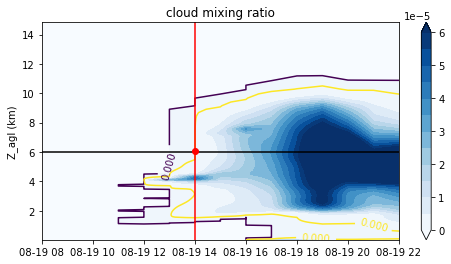

In [83]:
fig,axs = plt.subplots(1,1, figsize=(8,4))

hgtAx  = testDS3.AVP_Z.values * 1e-3

varSel = 'AVP_QC'

cplt   = axs.contourf(timeArr3_2d, hgtAx, 
                      testDS3[varSel].values,
                      np.arange(0,6.5e-5,0.5e-5),
                      cmap='Blues', extend='both')
fig.colorbar(cplt)
axs.set_ylabel('Z_agl (km)')
axs.set_title(testDS3[varSel].description)

CS = axs.contour(timeArr3_2d, hgtAx, 
                 testDS3[varSel].values, [0.0, 0.1e-6])
axs.clabel(CS, inline=True, fontsize=10)

axs.axhline(6, color='k')

iHrDC  = np.where( (testDS3.AVP_Z.values>=6e3) & (testDS3.AVP_QC.values>0) )
if len(iHrDC[0][:])>0:
    axs.axvline(testDS3.Time.values[iHrDC[0][0]], color='red')
    axs.plot(testDS3.Time.values[iHrDC[0][0]], testDS3.AVP_Z.values[iHrDC[0][0], iHrDC[1][0]]*1e-3, 'ro')

    

In [87]:
testDS3.AVP_QC.values[:, 185]

array([0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 0.0000000e+00,
       0.0000000e+00, 0.0000000e+00, 5.7792249e-08, 5.4433276e-06,
       2.2117536e-05, 3.5287976e-05, 5.7258450e-05, 9.0887799e-05,
       9.2527844e-05, 6.4004191e-05, 7.4838354e-05], dtype=float32)

In [88]:
iHrDC[0][0]

6

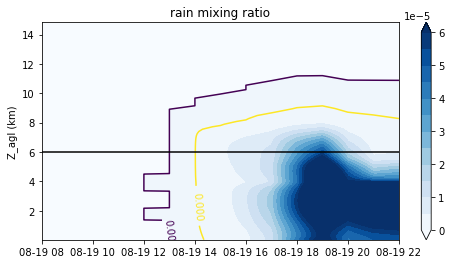

In [45]:
fig,axs = plt.subplots(1,1, figsize=(8,4))

hgtAx  = testDS3.AVP_Z.values * 1e-3

varSel = 'AVP_QR'

cplt   = axs.contourf(timeArr3_2d, hgtAx, 
                      testDS3[varSel].values,
                      np.arange(0,6.5e-5,0.5e-5),
                      cmap='Blues', extend='both')
fig.colorbar(cplt)
axs.set_ylabel('Z_agl (km)')
axs.set_title(testDS3[varSel].description)

CS = axs.contour(timeArr3_2d, hgtAx, 
                 testDS3[varSel].values, [0.0, 0.1e-6])
axs.clabel(CS, inline=True, fontsize=10)

axs.axhline(6, color='k')

In [43]:
testDS3



<xarray.Dataset>
Dimensions:      (Time: 15, bottom_top: 226, south_north: 520, west_east: 520)
Coordinates:
  * Time         (Time) datetime64[ns] 2016-08-19T08:00:00 ... 2016-08-19T22:...
  * west_east    (west_east) float64 0.0 0.25 0.5 0.75 ... 129.2 129.5 129.8
  * south_north  (south_north) float64 0.0 0.25 0.5 0.75 ... 129.2 129.5 129.8
Dimensions without coordinates: bottom_top
Data variables:
    AVP_IWC      (Time, bottom_top) float32 0.0 0.0 0.0 ... 7.329e-18 0.0
    AVP_LWC      (Time, bottom_top) float32 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0
    AVP_P        (Time, bottom_top) float32 9.686e+04 9.652e+04 ... 1.279e+04
    AVP_QC       (Time, bottom_top) float32 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0
    AVP_QG       (Time, bottom_top) float32 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0
    AVP_QI       (Time, bottom_top) float32 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0
    AVP_QR       (Time, bottom_top) float32 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0
    AVP_QS       (Time, bottom_top) float32 0.0 0.0 0.0 ... 3.373e-17 0.0
    AVP_QV       (Time, bottom_top) float32 0.01461 0.0146 ... 1.059e-06 1e-06
    AVP_RHO      (Time, bottom_top) float32 1.118 1.115 1.112 ... 0.2146 0.2074
    AVP_TH       (Time, bottom_top) float32 297.7 297.7 297.7 ... 383.1 386.7
    AVP_THL      (Time, bottom_top) float32 297.7 297.7 297.7 ... 382.3 386.1
    AVP_THV      (Time, bottom_top) float32 300.4 300.4 300.4 ... 383.0 386.7
    AVP_TK       (Time, bottom_top) float32 295.0 294.7 294.4 ... 215.0 214.9
    AVP_Z        (Time, bottom_top) float32 15.37 46.08 ... 1.452e+04 1.48e+04
    AVS_GRDFLX   (Time, south_north, west_east) float32 0.0 0.0 0.0 ... 0.0 0.0
    AVS_IWP      (Time, south_north, west_east) float32 0.0 0.0 ... 2.426 2.387
    AVS_LH       (Time, south_north, west_east) float32 43.24 43.24 ... 8.885
    AVS_LWDNB    (Time, south_north, west_east) float32 379.2 379.2 ... 409.7
    AVS_LWP      (Time, south_north, west_east) float32 0.0 0.0 ... 0.4467
    AVS_LWUPB    (Time, south_north, west_east) float32 428.7 428.7 ... 449.0
    AVS_PK1      (Time, south_north, west_east) float32 9.686e+04 ... 9.681e+04
    AVS_PSFC     (Time, south_north, west_east) float32 9.703e+04 ... 9.699e+04
    AVS_Q2       (Time, south_north, west_east) float32 0.0 0.0 0.0 ... 0.0 0.0
    AVS_QK1      (Time, south_north, west_east) float32 0.01461 ... 0.01416
    AVS_RAIN     (Time, south_north, west_east) float32 0.0 0.0 ... 0.0003083
    AVS_SH       (Time, south_north, west_east) float32 27.29 27.29 ... -21.82
    AVS_SWDNB    (Time, south_north, west_east) float32 71.45 71.47 ... 0.0 0.0
    AVS_SWUPB    (Time, south_north, west_east) float32 17.03 17.04 ... 0.0 0.0
    AVS_T2       (Time, south_north, west_east) float32 0.0 0.0 0.0 ... 0.0 0.0
    AVS_THK1     (Time, south_north, west_east) float32 297.7 297.7 ... 299.9
    AVS_TKK1     (Time, south_north, west_east) float32 295.0 295.0 ... 297.2
    AVS_TRAD     (Time, south_north, west_east) float32 294.5 294.5 ... 297.9
    AVS_TSK      (Time, south_north, west_east) float32 294.9 294.9 ... 298.3
    AVT_GRDFLX   (Time) float32 0.0 0.0 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0 0.0
    AVT_IWP      (Time) float32 0.0 0.0 0.0 0.0 0.0 ... 2.422 2.42 2.536 2.458
    AVT_LH       (Time) float32 43.09 92.18 144.9 189.1 ... 17.88 2.307 9.785
    AVT_LWDNB    (Time) float32 379.2 384.6 392.3 400.7 ... 417.4 414.8 411.8
    AVT_LWP      (Time) float32 0.0 0.0 0.0 0.0 ... 0.8107 0.5994 0.5455 0.5956
    AVT_LWUPB    (Time) float32 429.1 439.6 453.4 469.9 ... 476.5 463.2 449.3
    AVT_PK1      (Time) float32 9.686e+04 9.686e+04 ... 9.694e+04 9.694e+04
    AVT_PSFC     (Time) float32 9.703e+04 9.703e+04 ... 9.711e+04 9.711e+04
    AVT_Q2       (Time) float32 nan nan nan nan nan nan ... nan nan nan nan nan
    AVT_QK1      (Time) float32 0.01461 0.01476 0.01468 ... 0.01394 0.01444
    AVT_SH       (Time) float32 27.39 79.52 146.2 211.8 ... -13.25 -21.48 -22.25
    AVT_SWDNB    (Time) float32 73.8 268.2 471.6 653.1 ... 29.27 0.

## Quick test:

In [17]:
newCaseName = archiveDir+'FSCAM.T42_T42.CLASP_fullycoupled_FinalOption.onlyThlRt.getLESdays_HTG_2016_noMult_start0609.clm2.h0.2016-06-09-18060.nc'

oldCaseName = '/glade/scratch/mdfowler/archive/'+'FSCAM.T42_T42.CLASP_fullycoupled_FinalOption.onlyThlRt.HTGens2016_start0609_pert00/lnd/hist/'
oldCaseName = oldCaseName+'FSCAM.T42_T42.CLASP_fullycoupled_FinalOption.onlyThlRt.HTGens2016_start0609_pert00.clm2.h0.2016-06-09-18060.nc'


In [18]:
newDS = xr.open_dataset(newCaseName, decode_times=True)
oldDs = xr.open_dataset(oldCaseName, decode_times=True)


Text(0.5, 0, 'Timestep')

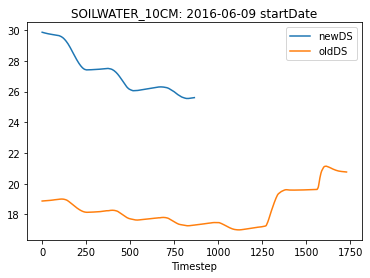

In [21]:
plt.plot( newDS.SOILWATER_10CM.values)
plt.plot( oldDs.SOILWATER_10CM.values)

plt.legend(['newDS','oldDS'])
plt.title('SOILWATER_10CM: 2016-06-09 startDate')
plt.xlabel('Timestep')

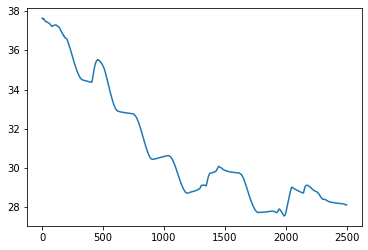

In [120]:
new2016_icCase = 'FSCAM.T42_T42.CLASP_fullycoupled_FinalOption.onlyThlRt.HMG_betterFinidat4_MoreMomentsNoReorder_5mDt_realSfc_useTheta_2016jja_relaxTlongTau_freeSfcT_restarts_v2'
new2016_ic = '/glade/scratch/mdfowler/archive/'+new2016_icCase+'/lnd/hist/'+new2016_icCase+'.clm2.h0.2016-06-03-80460.nc'
newDS2 = xr.open_dataset(new2016_ic, decode_times=True)

plt.plot(newDS2.SOILWATER_10CM.values)